<a href="https://colab.research.google.com/github/donggale72/10000.html/blob/main/A_Study_on_Drowsiness_and_Outlier_Detection_and_Statistical_Clustering_XAI_Interpretation_Based_on_Noise_Removing_Autoencoder_2025_11_24_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# 1 번셀=========================================================
# 0) 설치 (최초 1회) 세션 다시 시작필요함
# =========================================================
# 필수 패키지 설치
# 1. 기존에 잘못 설치된 것들이 꼬일 수 있으니 안전하게 제거
%pip uninstall -y mediapipe opencv-python-headless

# 2. -q(조용히) 옵션을 빼고 설치 시도 (에러 메시지를 확인하기 위함)
# --no-deps도 일단 빼고 의존성을 확인하는 것이 좋습니다.
print("=== 설치 시작 ===")
%pip install opencv-python-headless==4.10.0.84 mediapipe==0.10.14
print("=== 설치 종료 ===")


Found existing installation: opencv-python-headless 4.12.0.88
Uninstalling opencv-python-headless-4.12.0.88:
  Successfully uninstalled opencv-python-headless-4.12.0.88
=== 설치 시작 ===
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 42.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 50.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 24.7 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.5
    Uninstalling protobuf-5.29.5:
      Successfully uninstalled protobuf-5.29.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.71.2 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 4.25.8 which is incompatible.
opentelemetry-proto 1.37.0 requires protobuf<7.0,>=5.0, but you have protobuf 4.25.8 which is incompatible.
ydf 0.13.0 requires prot

=== 설치 종료 ===


In [1]:
# 2번셀 세션 다시 시작 필요함
import mediapipe as mp
import cv2
import numpy

print("=== 설치 확인 완료 ===")
print(f"MediaPipe Version: {mp.__version__}")  # 0.10.14 여야 함
print(f"OpenCV Version: {cv2.__version__}")     # 4.10.0.84 여야 함
print(f"Numpy Version: {numpy.__version__}")    # 2.x 버전이어도 괜찮음

=== 설치 확인 완료 ===
MediaPipe Version: 0.10.14
OpenCV Version: 4.10.0
Numpy Version: 2.0.2


In [2]:
# 3번셀
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
'''# 4 번셀=========================================================
# 1)  기본 설정 (+ 자동 조도 조절/디버그 오버레이, VIDEO_STRIDE=1)
# =========================================================
import os, math, json, numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
from typing import Optional, Tuple, List, Dict
from joblib import dump, load
from scipy.stats import ttest_ind, f_oneway, skew, kurtosis, norm, probplot
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import GroupShuffleSplit, train_test_split
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks
import cv2, mediapipe as mp

mp_face_mesh = mp.solutions.face_mesh
mp_drawing   = mp.solutions.drawing_utils
mp_styles    = mp.solutions.drawing_styles

np.random.seed(42)
tf.keras.utils.set_random_seed(42)
plt.rcParams.update({'figure.figsize': (8,4)})

# ====== 경로를 상황에 맞게 바꾸세요 ======
DATA_DIR   = '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/videos'            # 원본 영상 폴더
OUTPUT_DIR = '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs'   # CSV/모델/결과 저장
os.makedirs(OUTPUT_DIR, exist_ok=True)

# 파일명 규약 (정상=train_0~3, 졸음=test_0~1)
TRAIN_VIDEOS = [os.path.join(DATA_DIR, f'train_{i}.mp4') for i in range(3)]
TEST_VIDEOS  = [os.path.join(DATA_DIR, f'test_{i}.mp4')  for i in range(3)]
TRAIN_CSVS   = [os.path.join(OUTPUT_DIR, f'train_{i}.csv') for i in range(3)]
TEST_CSVS    = [os.path.join(OUTPUT_DIR, f'test_{i}.csv')  for i in range(3)]

# -------------------------------
# 비디오 프레임 샘플링 간격(프레임 단위)
# 입력 프레임을 VIDEO_STRIDE마다 1프레임씩만 처리
# -------------------------------
VIDEO_STRIDE = 1   # 요청값: 매 프레임 처리

# (참고) AE가 window=15, stride=3, VIDEO_STRIDE=1이라면
# - 분석 간격: 1 * 3 = 3 실제 프레임(= 0.1초 @30fps)
# - 윈도 길이: 1 * 15 = 15 프레임(= 0.5초 @30fps)

# 슬라이딩 그리드(후속 파이프라인용 기본값들) — 필요 시 사용
FPS = 30
L_CAND_FRAMES       = list(range(15, 31))          # 15~30 프레임
STRIDE_CAND_FRAMES  = list(range(5, 26, 5))        # 5,10,15,20,25 프레임
LATENT = 32

# 임계값 그리드 (퍼센타일 & IQR-k)
PERCENTILES = [95.0, 97.5, 99.0, 99.5, 99.7, 99.9]
IQR_K_LIST  = [1.5, 2.0, 2.5, 3.0]
LAMBDA = 1.0
TARGET_FPR = 0.005

# 5가지 특징 컬럼
FEAT_COLS = ['tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run']

# -------------------------------
# 전처리/조도 자동 조정 플래그
# -------------------------------
USE_PREPROC   = True          # 전처리 사용 여부
DEBUG_OVERLAY = True          # 디버그 텍스트 오버레이 표시 여부

print('DATA_DIR  =', DATA_DIR)
print('OUTPUT_DIR=', OUTPUT_DIR)
print('Train videos found:', [os.path.basename(p) for p in TRAIN_VIDEOS if os.path.isfile(p)])
print('Test  videos found:', [os.path.basename(p) for p in TEST_VIDEOS  if os.path.isfile(p)])
print('USE_PREPROC=', USE_PREPROC, '| DEBUG_OVERLAY=', DEBUG_OVERLAY, '| VIDEO_STRIDE=', VIDEO_STRIDE)

# =========================================================
# 2) 자동 조도 컨트롤러 (AdaptiveLightController)
#    - 프레임의 LAB L 평균/표준편차 기반으로 감마·CLAHE 자동 조정
#    - EMA/변화량 제한으로 출렁임 억제
# =========================================================
class AdaptiveLightController:
    """
    프레임의 LAB L-평균(밝기)과 L-표준편차(대비)를 이용해
    감마와 CLAHE clipLimit을 동적으로 조절.
    EMA 및 변화량 제한으로 안정화.
    """
    def __init__(
        self,
        target_L: float = 120.0,         # 목표 밝기 (0~255)
        gamma_min: float = 0.6,
        gamma_max: float = 1.15,
        ema_alpha: float = 0.08,         # L 평균 EMA 계수(작을수록 더 부드러움)
        update_every_n: int = 2,         # n(샘플 프레임)마다 파라미터 갱신
        clahe_on_dark_only: bool = True,
        clahe_L_thresh: float = 115.0,   # 어두우면 CLAHE ON
        clahe_clip_min: float = 1.2,
        clahe_clip_max: float = 3.0,
        clahe_tile: tuple = (8,8),
        enable_denoise_if_noisy: bool = True,
        noise_std_thresh: float = 18.0,  # L 표준편차가 크면 블러 한 번
        gauss_kernel: tuple = (3,3),
        debug_overlay: bool = False
    ):
        self.target_L = target_L
        self.gamma_min = gamma_min
        self.gamma_max = gamma_max
        self.ema_alpha = ema_alpha
        self.update_every_n = update_every_n
        self.clahe_on_dark_only = clahe_on_dark_only
        self.clahe_L_thresh = clahe_L_thresh
        self.clahe_clip_min = clahe_clip_min
        self.clahe_clip_max = clahe_clip_max
        self.clahe_tile = clahe_tile
        self.enable_denoise_if_noisy = enable_denoise_if_noisy
        self.noise_std_thresh = noise_std_thresh
        self.gauss_kernel = gauss_kernel
        self.debug_overlay = debug_overlay

        self._ema_L = None
        self._frame_idx = 0          # 샘플 프레임 기준 카운터
        self._last_gamma = 1.0
        self._last_clip = 1.5

    def _calc_gamma(self, Lmean_ema: float) -> float:
        if Lmean_ema <= 1.0:
            return self.gamma_max  # 거의 까만 화면 보호
        ratio = self.target_L / Lmean_ema
        base = 1.0 / (1.0 + 0.6 * max(0.0, ratio - 1.0))  # 완만 조정 커브
        gamma = float(np.clip(base, self.gamma_min, self.gamma_max))
        gamma = 0.7 * self._last_gamma + 0.3 * gamma      # 변화량 제한
        return float(gamma)

    def _calc_clahe_clip(self, Lmean_ema: float, Lstd: float) -> float:
        if self.clahe_on_dark_only and Lmean_ema >= self.clahe_L_thresh:
            return 0.0  # CLAHE skip
        darkness = np.clip((self.clahe_L_thresh - Lmean_ema) / max(1.0, self.clahe_L_thresh), 0.0, 1.0)
        clip = self.clahe_clip_min + (self.clahe_clip_max - self.clahe_clip_min) * darkness
        if Lstd > 40:  # 입자감 과다 시 clip 살짝 억제
            clip *= 0.8
        clip = float(np.clip(clip, self.clahe_clip_min, self.clahe_clip_max))
        clip = 0.7 * self._last_clip + 0.3 * clip         # 변화량 제한
        return clip

    def _ema_update(self, cur_L: float):
        if self._ema_L is None:
            self._ema_L = cur_L
        else:
            a = self.ema_alpha
            self._ema_L = (1 - a) * self._ema_L + a * cur_L

    def apply(self, frame_bgr: np.ndarray) -> np.ndarray:
        """
        샘플링된 한 프레임 입력 → 감마 & (조건부) CLAHE → 프레임 반환
        (주의: 외부 루프에서 VIDEO_STRIDE에 따라 프레임 샘플링)
        """
        self._frame_idx += 1
        lab = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2LAB)
        L = lab[:,:,0]
        Lmean = float(L.mean())
        Lstd  = float(L.std())

        # EMA로 부드럽게
        self._ema_update(Lmean)
        Lref = self._ema_L

        # n프레임마다 파라미터 갱신 (샘플 프레임 기준)
        gamma = self._last_gamma
        clip  = self._last_clip
        if self._frame_idx % self.update_every_n == 0:
            gamma = self._calc_gamma(Lref)
            clip  = self._calc_clahe_clip(Lref, Lstd)
            self._last_gamma = gamma
            self._last_clip  = clip

        # --- 감마 ---
        lut = np.array([((i / 255.0) ** (1.0 / gamma)) * 255 for i in range(256)]).astype('uint8')
        g = cv2.LUT(frame_bgr, lut)

        # --- (선택) 노이즈 완화 ---
        if self.enable_denoise_if_noisy and Lstd >= self.noise_std_thresh:
            g = cv2.GaussianBlur(g, self.gauss_kernel, 0)

        # --- (조건부) CLAHE ---
        if clip > 0.0:
            lab = cv2.cvtColor(g, cv2.COLOR_BGR2LAB)
            l, a, b = cv2.split(lab)
            clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=self.clahe_tile)
            l2 = clahe.apply(l)
            out = cv2.cvtColor(cv2.merge((l2, a, b)), cv2.COLOR_LAB2BGR)
        else:
            out = g

        # --- 디버그 오버레이 ---
        if self.debug_overlay:
            txt = f"Lmean={Lmean:5.1f}  Lstd={Lstd:4.1f}  EMA={Lref:5.1f}  gamma={gamma:.2f}  clip={clip:.2f}"
            cv2.putText(out, txt, (8, 26), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2, cv2.LINE_AA)
        return out

# =========================================================
# 3) MediaPipe FaceMesh + OpenCV: 5 특성 추출 (+ 프리뷰 선택)
# =========================================================
LEFT_EYE_CORNER_OUT = 33;  LEFT_EYE_CORNER_IN  = 133
LEFT_EYE_TOPS   = [159, 158]; LEFT_EYE_BOTTOMS = [145, 153]
RIGHT_EYE_CORNER_OUT= 263; RIGHT_EYE_CORNER_IN = 362
RIGHT_EYE_TOPS  = [386, 385]; RIGHT_EYE_BOTTOMS= [374, 380]

def _dist(p1, p2):
    return math.hypot(p1[0]-p2[0], p1[1]-p2[1])

def eye_aspect_ratio(landmarks, w, h, is_left=True):
    """EAR 유사치 = (위/아래 간격 평균) / (좌/우 코너 거리)"""
    if is_left:
        c_out, c_in = LEFT_EYE_CORNER_OUT, LEFT_EYE_CORNER_IN
        tops, bottoms = LEFT_EYE_TOPS, LEFT_EYE_BOTTOMS
    else:
        c_out, c_in = RIGHT_EYE_CORNER_OUT, RIGHT_EYE_CORNER_IN
        tops, bottoms = RIGHT_EYE_TOPS, RIGHT_EYE_BOTTOMS
    A = landmarks[c_out]; B = landmarks[c_in]
    A = (A.x*w, A.y*h); B = (B.x*w, B.y*h)
    horiz = _dist(A, B) + 1e-6
    verts = []
    for t, b in zip(tops, bottoms):
        T = landmarks[t]; Bt = landmarks[b]
        verts.append(_dist((T.x*w, T.y*h), (Bt.x*w, Bt.y*h)))
    return float(np.mean(verts)) / horiz

def eye_tilt(landmarks, w, h, is_left=True):
    """눈 외측~내측 코너 라인의 기울기(라디안)"""
    if is_left:  c_out, c_in = LEFT_EYE_CORNER_OUT, LEFT_EYE_CORNER_IN
    else:        c_out, c_in = RIGHT_EYE_CORNER_OUT, RIGHT_EYE_CORNER_IN
    A = landmarks[c_out]; B = landmarks[c_in]
    x1,y1 = A.x*w, A.y*h; x2,y2 = B.x*w, B.y*h
    return math.atan2(y2 - y1, x2 - x1)

def run_length(mask: np.ndarray) -> np.ndarray:
    """True가 연속되는 길이 카운트"""
    out = np.zeros_like(mask, dtype=int); cnt = 0
    for i, m in enumerate(mask):
        cnt = cnt + 1 if m else 0
        out[i] = cnt
    return out

def hysteresis_binary(signal: np.ndarray, th_open: float, th_close: float) -> np.ndarray:
    """히스테리시스 문턱(열림/닫힘 상이)"""
    out = np.zeros_like(signal, dtype=int); state = 0
    for i, v in enumerate(signal):
        if state==0 and v>=th_open: state=1
        elif state==1 and v<=th_close: state=0
        out[i] = state
    return out

def auto_calibrate_thresholds(ear_series: np.ndarray, fps_eff: float, warmup_sec: float=3.0):
    """
    초기 몇 초의 중앙값 기반 EAR 문턱 자동 보정
    fps_eff: 샘플링 후 유효 FPS (원 fps / VIDEO_STRIDE)
    """
    n = int(max(1, min(len(ear_series), warmup_sec*fps_eff)))
    base = np.median(ear_series[:n]) if n>0 else np.median(ear_series)
    return base*0.85, base*0.75

def tilt_diff_ratio(lt: np.ndarray, rt: np.ndarray):
    """양안 기울기 차이 비율(%)"""
    diff = np.abs(lt-rt); max_abs = np.maximum(np.abs(lt), np.abs(rt)) + 1e-6
    return (diff / max_abs) * 100.0

def draw_bbox_from_landmarks(frame_bgr, face_landmarks):
    """랜드마크 min/max로 얼굴 바운딩 박스"""
    h, w = frame_bgr.shape[:2]
    xs = [int(lm.x * w) for lm in face_landmarks.landmark]
    ys = [int(lm.y * h) for lm in face_landmarks.landmark]
    x1, y1, x2, y2 = max(0, min(xs)), max(0, min(ys)), min(w-1, max(xs)), min(h-1, max(ys))
    cv2.rectangle(frame_bgr, (x1,y1), (x2,y2), (0,255,0), 2)
    return (x1,y1,x2,y2)

# =========================================================
# 4) 비디오 → CSV 변환 (빠른/안전 모드, VIDEO_STRIDE 적용)
# =========================================================
def process_video_to_csv(
    video_path: str,
    out_csv_path: str,
    log=True,
    preview_out_path: Optional[str]=None,
    # ==== 속도/안정성 옵션 ====
    resize_width: int = 960,         # 0이면 원본 해상도 사용
    face_mesh_refine: bool = False,  # 속도↑: 정밀 랜드마크 끄기
    max_sampled_frames: Optional[int] = None,  # 샘플링 후 최대 프레임 수(예: 6000)
    max_seconds: Optional[float] = None,       # eff_fps 기준 최대 처리 시간(초)
    log_every: int = 800,             # 진행률 로그 간격(샘플 프레임 단위)
    save_preview: bool = False        # 프리뷰 저장 on/off (느리면 False)
):
    import time
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("[SKIP] Cannot open:", video_path); return False

    fps_raw = cap.get(cv2.CAP_PROP_FPS)
    fps = fps_raw if fps_raw and fps_raw > 0 else 30.0
    fps_eff = fps / max(1, VIDEO_STRIDE)  # VIDEO_STRIDE=1 → eff_fps=fps
    w0 = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)); h0 = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    if log: print(f'Processing {os.path.basename(video_path)} | fps={fps:.1f} -> eff_fps={fps_eff:.2f}, size=({w0}x{h0}), stride={VIDEO_STRIDE}')

    # 리사이즈 파라미터
    if resize_width and resize_width > 0 and w0 > resize_width:
        scale = resize_width / float(w0)
        w = resize_width
        h = int(round(h0 * scale))
    else:
        w, h = w0, h0

    writer = None
    if save_preview and (preview_out_path is not None):
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        writer = cv2.VideoWriter(preview_out_path, fourcc, fps_eff, (w,h))

    # 🔧 자동 조도 컨트롤러 (update_every_n=2)
    light_ctl = AdaptiveLightController(
        target_L=120.0,
        gamma_min=0.6, gamma_max=1.15,
        ema_alpha=0.08, update_every_n=2,
        clahe_on_dark_only=True, clahe_L_thresh=115.0,
        clahe_clip_min=1.2, clahe_clip_max=3.0, clahe_tile=(8,8),
        enable_denoise_if_noisy=True, noise_std_thresh=18.0,
        gauss_kernel=(3,3),
        debug_overlay=DEBUG_OVERLAY
    )

    L_ear=[]; R_ear=[]; L_tilt=[]; R_tilt=[]
    frame_idx = 0
    sampled = 0
    try:
        with mp_face_mesh.FaceMesh(static_image_mode=False, max_num_faces=1, refine_landmarks=face_mesh_refine,
                                   min_detection_confidence=0.5, min_tracking_confidence=0.5) as fm:
            while True:
                ret, frame = cap.read()
                if not ret: break

                # 프레임 샘플링 (VIDEO_STRIDE=1 → 매 프레임 처리)
                if frame_idx % VIDEO_STRIDE != 0:
                    frame_idx += 1
                    continue
                frame_idx += 1

                # 리사이즈
                if (w, h) != (w0, h0):
                    frame = cv2.resize(frame, (w, h), interpolation=cv2.INTER_AREA)

                # 자동 조도
                if USE_PREPROC:
                    frame = light_ctl.apply(frame)

                # FaceMesh
                rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                res = fm.process(rgb)
                if not res.multi_face_landmarks:
                    L_ear.append(np.nan); R_ear.append(np.nan); L_tilt.append(np.nan); R_tilt.append(np.nan)
                    if writer is not None: writer.write(frame)
                else:
                    face = res.multi_face_landmarks[0]
                    L_ear.append(eye_aspect_ratio(face.landmark, w, h, True))
                    R_ear.append(eye_aspect_ratio(face.landmark, w, h, False))
                    L_tilt.append(eye_tilt(face.landmark, w, h, True))
                    R_tilt.append(eye_tilt(face.landmark, w, h, False))

                    # 프리뷰는 옵션일 때만 그리기
                    if writer is not None:
                        draw_bbox_from_landmarks(frame, face)
                        mp_drawing.draw_landmarks(
                            image=frame,
                            landmark_list=face,
                            connections=mp.solutions.face_mesh.FACEMESH_TESSELATION,
                            landmark_drawing_spec=None,
                            connection_drawing_spec=mp_styles.get_default_face_mesh_tesselation_style()
                        )
                        writer.write(frame)

                sampled += 1
                if (sampled % log_every) == 0 and log:
                    sec = sampled / max(1e-6, fps_eff)
                    print(f"  - sampled={sampled} (~{sec:.1f}s)")

                # 조기 종료 조건
                if (max_sampled_frames is not None) and (sampled >= max_sampled_frames):
                    if log: print(f"  [EARLY-STOP] reached max_sampled_frames={max_sampled_frames}")
                    break
                if (max_seconds is not None) and (sampled / max(1e-6, fps_eff) >= max_seconds):
                    if log: print(f"  [EARLY-STOP] reached max_seconds={max_seconds}s")
                    break

    except KeyboardInterrupt:
        if log: print("  [INTERRUPTED] saving partial results...")

    finally:
        cap.release()
        if writer is not None: writer.release()

    # NaN 앞값 채우기 → 0 치환
    def ffill(a):
        out=a.copy(); last=np.nan
        for i,v in enumerate(out):
            out[i] = last if np.isnan(v) and not np.isnan(last) else (0.0 if np.isnan(v) else v)
            if not np.isnan(out[i]): last = out[i]
        return out

    L_ear = ffill(np.array(L_ear,float)); R_ear = ffill(np.array(R_ear,float))
    L_tilt= ffill(np.array(L_tilt,float)); R_tilt= ffill(np.array(R_tilt,float))

    # 이진화 → 런길이 → 5특징  (유효 FPS 사용; 여기선 eff_fps=fps)
    th_o_L, th_c_L = auto_calibrate_thresholds(L_ear, fps_eff)
    th_o_R, th_c_R = auto_calibrate_thresholds(R_ear, fps_eff)
    left_open  = hysteresis_binary(L_ear, th_o_L, th_c_L)
    right_open = hysteresis_binary(R_ear, th_o_R, th_c_R)

    tilt_ratio = tilt_diff_ratio(L_tilt, R_tilt)
    open_sum   = (left_open + right_open).astype(float)
    both_open_run   = run_length(open_sum==2).astype(float)
    one_closed_run  = run_length(open_sum==1).astype(float)
    both_closed_run = run_length(open_sum==0).astype(float)

    df = pd.DataFrame({
        'tilt_diff_ratio': tilt_ratio,
        'open_sum': open_sum,
        'both_open_run': both_open_run,
        'one_closed_run': one_closed_run,
        'both_closed_run': both_closed_run,
    })
    df.to_csv(out_csv_path, index=False)
    if log: print(f"Saved CSV: {out_csv_path} (samples={len(df)})")
    return True

# =========================================================
# 5) 배치 처리 유틸
# =========================================================
def batch_process(videos: List[str], out_csvs: List[str], make_preview=False,
                  skip_existing: bool = False,
                  resize_width: int = 960,
                  face_mesh_refine: bool = False,
                  max_sampled_frames: Optional[int] = None,
                  max_seconds: Optional[float] = None):
    """다수 비디오를 일괄 변환 (빠른/안전 모드)"""
    cnt=0
    for v, c in zip(videos, out_csvs):
        if not os.path.isfile(v):
            print('(skip) not found:', v); continue

        if skip_existing and os.path.isfile(c):
            print('(skip) already exists:', c); continue

        base = os.path.splitext(os.path.basename(v))[0]
        preview_path = os.path.join(OUTPUT_DIR, f'{base}_preview.mp4') if make_preview else None

        try:
            ok = process_video_to_csv(
                video_path=v,
                out_csv_path=c,
                log=True,
                preview_out_path=preview_path,
                resize_width=resize_width,        # 1920→960으로 다운스케일(640도 가능)
                face_mesh_refine=face_mesh_refine,# 빠르게: False 권장
                max_sampled_frames=max_sampled_frames,  # 예: 6000
                max_seconds=max_seconds,          # 예: 1200(=20분)
                log_every=800,
                save_preview=make_preview         # 프리뷰 느리면 False
            )
            if ok: cnt+=1
        except Exception as e:
            print('[ERROR]', v, e)
    print(f'Converted {cnt}/{len(videos)} videos.')

# =========================================================
# 6) 실행 예시
# =========================================================
# 전체 학습/테스트 세트 처리 (프리뷰 ON, 기존 결과도 새로 생성)
batch_process(TRAIN_VIDEOS, TRAIN_CSVS, make_preview=True, skip_existing=False)
batch_process(TEST_VIDEOS,  TEST_CSVS,  make_preview=True, skip_existing=False)

# 특정 하나만 빠르게 돌리고 싶을 때 (예: train_3.mp4만):
# batch_process([TRAIN_VIDEOS[3]], [TRAIN_CSVS[3]], make_preview=False, skip_existing=False)'''


'# 4 번셀=========================================================\n# 1)  기본 설정 (+ 자동 조도 조절/디버그 오버레이, VIDEO_STRIDE=1)\n# =========================================================\nimport os, math, json, numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns\nfrom typing import Optional, Tuple, List, Dict\nfrom joblib import dump, load\nfrom scipy.stats import ttest_ind, f_oneway, skew, kurtosis, norm, probplot\nfrom sklearn.preprocessing import RobustScaler\nfrom sklearn.model_selection import GroupShuffleSplit, train_test_split\nfrom sklearn.metrics import f1_score, precision_score, recall_score, classification_report\nfrom sklearn.ensemble import RandomForestClassifier\nfrom sklearn.tree import DecisionTreeClassifier\nfrom sklearn.svm import SVC\nfrom xgboost import XGBClassifier\nfrom lightgbm import LGBMClassifier\nimport tensorflow as tf\nfrom tensorflow.keras import layers, models, callbacks\nimport cv2, mediapipe as mp\n\nmp_face_mesh = mp.solutions.face_mesh\nmp_draw

In [4]:
# 5번셀
import pandas as pd, os
import os, math, json, numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
from typing import Optional, Tuple, List, Dict
from joblib import dump, load
from scipy.stats import ttest_ind, f_oneway, skew, kurtosis, norm, probplot
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import GroupShuffleSplit, train_test_split
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks
import cv2, mediapipe as mp

mp_face_mesh = mp.solutions.face_mesh
mp_drawing   = mp.solutions.drawing_utils
mp_styles    = mp.solutions.drawing_styles

np.random.seed(42)
tf.keras.utils.set_random_seed(42)
plt.rcParams.update({'figure.figsize': (8,4)})

# ====== 경로를 상황에 맞게 바꿔야됨 ======
# 원본 영상 폴더
OUTPUT_DIR = '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs'
RAW_CSV_INPUT_DIR = OUTPUT_DIR
TRAIN_CSVS = [os.path.join(RAW_CSV_INPUT_DIR, f"train_{i}.csv") for i in range(3)]  # Normal
TEST_CSVS  = [os.path.join(RAW_CSV_INPUT_DIR, f"test_{i}.csv")  for i in range(3)]  # Abnormal
ALL_CSVS   = TRAIN_CSVS + TEST_CSVS
# 파일 존재 확인
from glob import glob
print("CSV files:", glob(os.path.join(OUTPUT_DIR, "*.csv")))
print("Preview files:", glob(os.path.join(OUTPUT_DIR, "*_preview.mp4")))

# 샘플 내용 확인
df = pd.read_csv(TRAIN_CSVS[0])
print(df.shape)
print(df.head())

# 이상치 없이 값이 잘 들어왔는지 체크(기본 통계)
print(df.describe().T)


CSV files: ['/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_0.csv', '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_1.csv', '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_2.csv', '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/test_0.csv', '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/test_1.csv', '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/test_2.csv']
Preview files: ['/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_0_preview.mp4', '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_1_preview.mp4', '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_2_preview.mp4', '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/test_0_preview.mp4', '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/test_2_preview.mp4', '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset

In [5]:
#  6번셀 ==============================================================================
# 통합 유틸리티 및 전역 설정
# 이 셀은 노트북의 모든 코드에서 공통적으로 사용되는 import, 상수, 함수를 정의.
# 코드의 재사용성을 높이고 중복을 제거하여 유지보수를 용이하게 함.
# ==============================================================================

# ==============================================================================
# 0. 핵심 라이브러리 임포트
#    주요 데이터 처리, 수치 계산, 머신러닝, 시각화에 필요한 라이브러리들을 불러옴.
# ==============================================================================
import os # 파일 경로 및 환경 변수 처리
import time # 시간 측정
import numpy as np # 과학 계산 (배열, 행렬 연산)
import pandas as pd # 데이터프레임 처리
import joblib # 파이썬 객체 직렬화 (모델 저장/로드)
import warnings # 경고 메시지 제어
from itertools import product # 반복 가능한 객체들의 데카르트 곱 생성
from scipy.stats import mannwhitneyu # Mann-Whitney U 검정
from sklearn.preprocessing import RobustScaler, PowerTransformer, MinMaxScaler # 데이터 스케일링/변환
from sklearn.model_selection import GroupShuffleSplit, train_test_split # 데이터 분할
from sklearn.metrics import ( # 모델 성능 평가 지표
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, make_scorer, roc_auc_score, roc_curve,
    confusion_matrix, ConfusionMatrixDisplay
)
from sklearn.tree import DecisionTreeClassifier # 결정 트리 분류기
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor # 앙상블 학습 (랜덤 포레스트)
from sklearn.linear_model import LogisticRegression # 로지스틱 회귀
from sklearn.svm import SVC # Support Vector Machine
from lightgbm import LGBMClassifier # LightGBM 분류기
import tensorflow as tf # 텐서플로우 (딥러닝 모델 구축)
import matplotlib.pyplot as plt # 데이터 시각화
import seaborn as sns # 데이터 시각화 고급 기능
import shap # SHAP (SHapley Additive exPlanations) - 모델 설명 가능성
import plotly.express as px # 인터랙티브 시각화 (PCA, t-SNE)
from sklearn.decomposition import PCA # 주성분 분석
from sklearn.manifold import TSNE # t-Distributed Stochastic Neighbor Embedding
from sklearn.cluster import KMeans # K-평균 군집분석
from imblearn.over_sampling import SMOTE # 불균형 데이터 처리 (SMOTE)

# ==============================================================================
# 1. 전역 설정 및 경고/랜덤 시드 관리
#    분석의 일관성과 재현성을 위해 환경을 설정합니다.
# ==============================================================================
warnings.filterwarnings("ignore") # 모든 경고 메시지 무시
np.set_printoptions(suppress=True) # NumPy 부동 소수점 출력 시 소수점 이하 생략
tf.keras.utils.set_random_seed(42) # TensorFlow/Keras 랜덤 시드 고정
tf.config.experimental.enable_op_determinism() # TensorFlow 결정론적 연산 활성화 (재현성)
sns.set(style="whitegrid") # Seaborn 스타일 설정

# ==============================================================================
# 2. 경로 설정
#    데이터 입력, 중간 산출물, 최종 결과물 저장을 위한 디렉토리 및 파일 경로를 정의.
# ==============================================================================
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink" # 프로젝트 기본 디렉토리
OUT_DIR  = os.path.join(BASE_DIR, "dataset/outputs") # 모든 산출물이 저장될 기본 출력 디렉토리
STAT_DIR = os.path.join(OUT_DIR, "denoising_analysis_results") # 디노이징 분석 결과 저장 디렉토리

# 디렉토리가 존재하지 않으면 생성
os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(STAT_DIR, exist_ok=True)

# CSV 데이터 파일 경로
TRAIN_CSVS = [os.path.join(OUT_DIR, f"train_{i}.csv") for i in range(4)] # 정상(Train) 데이터 CSV 목록
TEST_CSVS  = [os.path.join(OUT_DIR, f"test_{i}.csv")  for i in range(2)] # 비정상(Test) 후보 데이터 CSV 목록
ALL_EVAL_CSVS = TRAIN_CSVS + TEST_CSVS # 모든 평가 데이터 CSV 목록

# 저장 경로들 (모델, 스케일러, 분석 결과 등)
SCALER_PATH          = os.path.join(STAT_DIR, "scaler_robust.joblib") # RobustScaler 저장 경로
AE_WEIGHTS_PATH      = os.path.join(STAT_DIR, "best_dae_weights.weights.h5") # Denoising AE 가중치 저장 경로
PER_FRAME_LABELED    = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv") # 프레임별 이상치 라벨링 결과
PER_VIDEO_SUMMARY    = os.path.join(STAT_DIR, "per_video_outlier_summary.csv") # 비디오별 이상치 요약 (이전 버전)
STATS_REPORT_PATH    = os.path.join(STAT_DIR, "group_stats_summary.csv") # 그룹 통계 보고서 (이전 버전)
RUNLEN_DISTRIBUTION_CSV_PATH = os.path.join(STAT_DIR, "run_length_distribution_by_group.csv") # 이상치 연속 길이 분포 CSV
RUNLEN_DISTRIBUTION_PLOT_PATH= os.path.join(STAT_DIR, "run_length_distribution_bar.png") # 이상치 연속 길이 분포 플롯
GROUP_RATIO_STATS_PATH = os.path.join(STAT_DIR, "group_ratio_stats.csv") # 그룹별 이상치 비율 통계
BLOCK_DATASET_SAVE_PATH = os.path.join(STAT_DIR, "block_level_dataset.csv") # 블록 단위 데이터셋 저장 경로
CLUSTER_PLOT_PCA_PATH = os.path.join(STAT_DIR, "cluster_pca3d.png") # PCA 3D 군집 시각화
CLUSTER_PLOT_TSNE_PATH = os.path.join(STAT_DIR, "cluster_tsne3d.png") # t-SNE 3D 군집 시각화
MODEL_REPORT_PATH = os.path.join(STAT_DIR, "model_eval_report.csv") # 모델 평가 보고서
BEST_MODEL_PATH = os.path.join(STAT_DIR, "best_block_classifier.joblib") # 최적 분류기 모델 저장 경로
BEST_META_PATH = os.path.join(STAT_DIR, "best_block_feature_list.joblib") # 최적 분류기 메타데이터 (피처 목록 등)
AE_SHAP_IMPORTANCE_PATH = os.path.join(STAT_DIR, "ae_shap_feature_importance_top10.csv") # AE SHAP 중요도
AE_ABLATION_PATH = os.path.join(STAT_DIR, "ae_ablation_top10.csv") # AE Ablation 결과 (이전 버전)
CLS_SHAP_IMPORTANCE_PATH = os.path.join(STAT_DIR, "cls_shap_feature_importance.csv") # 분류기 SHAP 중요도
LABEL_DIFF_SAVE_PATH = os.path.join(STAT_DIR, "sleepy_label_group_stats.csv") # Sleepy 라벨 그룹 통계
AE_SUR_ABLATION_PATH = os.path.join(STAT_DIR, "ae_surrogate_ablation.csv") # AE Surrogate Ablation 결과
AE_CHANNEL_ABLATION_PATH = os.path.join(STAT_DIR, "ae_channel_ablation.csv") # AE Channel Ablation 결과
AE_XAI_COMBINED_PATH = os.path.join(STAT_DIR, "ae_xai_combined_report.csv") # AE XAI 결합 보고서
PER_VIDEO_SEQ_OUTLIER_PATH = os.path.join(STAT_DIR, "per_video_outlier_seq_counts.csv") # 비디오별 시퀀스 이상치 카운트
PER_SECOND_GROUP_OUTLIER_COUNTS = os.path.join(STAT_DIR, "per_second_group_outlier_counts.csv") # N초 그룹별 이상치 카운트

# ==============================================================================
# 3. 분석 파라미터 및 모델 설정 상수
#    주요 특징, AE 하이퍼파라미터, 임계값 등을 정의하여 쉽게 변경하고 관리할 수 있도록 함.
# ==============================================================================
FEAT_COLS     = ['tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run'] # 모든 원시 특징 열
AE_FEAT_COLS  = FEAT_COLS[:]
FPS           = 30 # 초당 프레임 수
TIME_WINDOWS_SEC = [1,2,3] # 시간 윈도우 (초 단위)
EVENT_MIN_RUN = 1 # 연속 이상치 길이 최소 기준 (이벤트로 간주)

# AE 학습 및 그리드 서치 관련 파라미터
DENOISE_STD   = 0.05 # Denoising AE용 가우시안 노이즈 표준편차
LR            = 1e-3 # 학습률 (Learning Rate)
EPOCHS        = 25 # 학습 에포크 수
BATCH_SIZE    = 128 # 배치 크기
PATIENCE      = 4 # Early Stopping을 위한 참을성 (에포크 수)
VAL_RATIO     = 0.2 # 검증 데이터 비율
RANDOM_STATE  = 42 # 랜덤 시드

WINDOWS = [10,15,20] # AE 시퀀스 윈도우 길이 후보
STRIDES = [3,5] # AE 시퀀스 스트라이드 후보
DAE_GRID = { # Denoising AE 그리드 서치 파라미터 후보
    "latent":[8,16,32], # 잠재 공간 차원
    "depth":[2,3], # Conv1D 블록 깊이
}

# 최적 AE 모델 파라미터 (이전 그리드 서치 결과에서 결정)
BEST_L        = 20 # 최적 윈도우 길이
BEST_S        = 3 # 최적 스트라이드
BEST_LATENT   = 32 # 최적 잠재 공간 차원
BEST_DEPTH    = 2 # 최적 Conv1D 블록 깊이
BEST_NOISE_STD = DENOISE_STD # 최적 노이즈 표준편차 (고정)
BEST_LR       = LR # 최적 학습률 (고정)
THRESHOLD_PERCENTILE = 95.0 # 이상치 탐지 임계값 (정상 데이터의 MSE 95 백분위수)

# 블록 단위 분석 파라미터
BLOCK_SEC = 3.0 # 블록 길이 (초 단위)
BLOCK_LEN = int(BLOCK_SEC * FPS) # 블록 길이 (프레임 단위)
OUTLIER_THRESH_COUNT = 6 # 블록 내 이상치 프레임 수 임계값 (예: 3초 블록 내 6개 이상)

# 분석 파라미터
FEAT_COLS     = ['tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run']
AE_FEAT_COLS  = FEAT_COLS[:]
FPS = 30
TIME_WINDOWS_SEC = [1,2,3]     # 0~1s, 0~2s, 0~3s
EVENT_MIN_RUN = 1              # 연속 이상치 길이 >=1 를 이벤트로 본다 (사용자는 필요 시 바꿀 수 있음)
DENOISE_STD = 0.05             # Denoising AE용 가우시안 노이즈 표준편차
LR = 1e-3                      # 학습률
EPOCHS = 25
BATCH_SIZE = 128
PATIENCE = 4
VAL_RATIO = 0.2
RANDOM_STATE = 42


# ======================================================
# 1. 유틸 함수 정의
# ======================================================

def load_with_video_id(paths):
    """
    여러 CSV를 읽어 video_id 열을 강제로 붙이고 concat.
    CSV에 video_id가 이미 있어도 덮어쓴다. (혼란 방지)
    """
    dfs = []
    for p in paths:
        if not os.path.isfile(p):
            print(f"[WARN] not found: {p}")
            continue
        df = pd.read_csv(p)
        df["video_id"] = os.path.basename(p)
        dfs.append(df)
    if not dfs:
        raise FileNotFoundError("No CSVs loaded")
    out = pd.concat(dfs, ignore_index=True)
    return out

def make_seq_with_group(X, groups, L, S):
    """
    시계열 X(shape: [N,F])를 슬라이딩으로 잘라 (num_seq, L, F) 시퀀스를 생성.
    또한 각 시퀀스 중앙 인덱스의 그룹(예: video_id)을 뽑아준다.
    returns:
      seqs: (num_seq, L, F)
      grp:  (num_seq,)  # 각 시퀀스의 center frame이 속한 video_id
      starts: [start_idx ...]
      centers: [center_idx ...]
    """
    N = len(X)
    starts = list(range(0, max(0, N-L+1), S))
    if N >= L:
        seqs = np.stack([X[s:s+L] for s in starts], axis=0)
    else:
        seqs = np.empty((0, L, X.shape[1]))
    centers = [s + L//2 for s in starts]
    grp = np.array([groups[c] for c in centers])
    return seqs, grp, starts, centers

def build_denoising_ae(L,F,latent=32,noise_std=0.05,depth=2,lr=1e-3):
    """
    Denoising AutoEncoder
    - GaussianNoise로 입력에 노이즈 주고
    - Conv1D 블록을 depth 번 반복
    - latent 채널 수로 bottleneck
    """
    inp = tf.keras.Input(shape=(L,F))
    x = tf.keras.layers.GaussianNoise(noise_std)(inp)

    # Encoder
    for _ in range(depth):
        x = tf.keras.layers.Conv1D(64,3,padding='same',activation='relu')(x)

    z = tf.keras.layers.Conv1D(latent,3,padding='same',activation='relu',name='latent')(x)

    # Decoder
    y = z
    for _ in range(depth):
        y = tf.keras.layers.Conv1D(64,3,padding='same',activation='relu')(y)

    out = tf.keras.layers.Conv1D(F,3,padding='same')(y)

    m = tf.keras.Model(inp, out)
    m.compile(optimizer=tf.keras.optimizers.Adam(LR), loss='mse')
    return m

def ae_mse(Xseq, model):
    """시퀀스별 reconstruction MSE를 계산."""
    if len(Xseq)==0:
        return np.array([])
    Xr = model.predict(Xseq, verbose=0)
    err = (Xseq - Xr)**2
    return err.mean(axis=(1,2))

def calc_threshold_from_normal(mse_seq_normal, q=95):
    """
    정상 데이터 reconstruction error 기반 임계치 추정 (Percentile 방식)
    ------------------------------------------------------------
    q : float
        상위 백분위수(percentile). 예) 97.5 → 정상 중 상위 2.5%부터 이상치로 간주.
    ------------------------------------------------------------
    반환값:
        thr : float
            reconstruction error 임계치
    """
    if len(mse_seq_normal) == 0:
        raise ValueError("mse_seq_normal is empty — threshold cannot be computed.")

    thr = np.percentile(mse_seq_normal, q)
    print(f"[INFO] Threshold (percentile {q}%): {thr}")
    return thr

def consecutive_run_lengths(bin_seq):
    """
    이진 시퀀스에서 '1'이 연속된 run length를 위치별로 기록.
    예: [0,1,1,0,1] -> [0,1,2,0,1]
    """
    seq = np.asarray(bin_seq, dtype=int)
    out = np.zeros_like(seq, dtype=int)
    run = 0
    for i,v in enumerate(seq):
        if v == 1:
            run += 1
            out[i] = run
        else:
            run = 0
            out[i] = 0
    return out

def infer_group_label(video_id_str):
    """
    정상(0) vs 비정상(1) 레이블
    가정: train_* 는 정상, test_* 는 비정상 후보
    """
    v = str(video_id_str)
    if v.startswith("train"):
        return 0
    elif v.startswith("test"):
        return 1
    return None

def mannwhitney_and_threshold(summary_df):
    """
    정상 vs 비정상 간 outlier_count 차이 검정 (Mann-Whitney U)
    + 정상 그룹 outlier_count 상위 95%선 (thr 후보)
    """
    rows = []
    for sec in sorted(summary_df["seconds"].unique()):
        sub = summary_df[summary_df["seconds"] == sec]

        normal_vals   = sub.loc[sub["group_label"]==0, "outlier_count"]
        abnormal_vals = sub.loc[sub["group_label"]==1, "outlier_count"]

        if len(normal_vals) >= 3 and len(abnormal_vals) >= 3:
            stat, pval = mannwhitneyu(normal_vals, abnormal_vals, alternative='two-sided')
        else:
            stat, pval = np.nan, np.nan  # 비교 불가능(표본 부족)

        thr95 = np.percentile(normal_vals, 95) if len(normal_vals)>0 else np.nan

        rows.append({
            "seconds": sec,
            "normal_mean":   normal_vals.mean()   if len(normal_vals)>0 else np.nan,
            "abnormal_mean": abnormal_vals.mean() if len(abnormal_vals)>0 else np.nan,
            "normal_median":   normal_vals.median()   if len(normal_vals)>0 else np.nan,
            "abnormal_median": abnormal_vals.median() if len(abnormal_vals)>0 else np.nan,
            "mannwhitney_stat": stat,
            "mannwhitney_p": pval,
            "suggested_thr95_normal": thr95
        })
    return pd.DataFrame(rows)

def add_log_transform(df, feat_cols, skip_cols=None):
    out = df.copy()
    for c in feat_cols:
        if skip_cols and c in skip_cols:
            continue
        out[c] = np.log1p(np.maximum(0, out[c]))
    return out

def make_seq(X, L, S):
    """
    X: (N,F)
    return seqs:(num_seq,L,F), starts[], centers[]
    """
    N=len(X)
    starts=list(range(0, max(0,N-L+1), S))
    if N>=L:
        seqs=np.stack([X[s:s+L] for s in starts], axis=0)
    else:
        seqs=np.empty((0,L,X.shape[1]))
    centers=[s+L//2 for s in starts]
    return seqs, starts, centers

def ae_recon_error(model, Xseq):
    if len(Xseq)==0:
        return np.array([])
    Xr = model.predict(Xseq, verbose=0)
    err=(Xseq-Xr)**2
    return err.mean(axis=(1,2))

def seq_errors_for_video(ae, df_video_scaled, feat_cols, L, S):
    """
    비디오별 프레임 reconstruction error, frame별 outlier flag 반환
    flag은 비디오 내부 상위 97.5% 에러 기준
    """
    Xi = df_video_scaled[feat_cols].values.astype(np.float32)
    Xseq, starts, centers = make_seq(Xi, L, S)
    mse_win = ae_recon_error(ae, Xseq)

    N=len(df_video_scaled)
    per_frame_err = np.zeros(N, dtype=np.float32)
    for w_i, cidx in enumerate(centers):
        if cidx < N:
            per_frame_err[cidx] = mse_win[w_i]

    thr_local = np.quantile(mse_win, 0.975) if len(mse_win)>0 else np.inf
    per_frame_outlier = (per_frame_err > thr_local).astype(int)

    return per_frame_err, per_frame_outlier

def make_nonoverlap_blocks(per_frame_outlier, per_frame_err, df_video_scaled, block_len):
    """
    비겹침 3초 블록 단위로 특징 추출
    """
    N=len(df_video_scaled)
    rows=[]
    for start in range(0, N, block_len):
        end = start+block_len
        if end> N:
            break

        seg_o = per_frame_outlier[start:end]
        seg_e = per_frame_err[start:end]
        seg_df= df_video_scaled.iloc[start:end]

        row = {
            "video_id": df_video_scaled["video_id"].iloc[0],
            "block_start": start,
            "block_end": end,
            "block_len": block_len,
            "outlier_count": int(seg_o.sum()),
            "recon_err_mean": float(np.mean(seg_e)) if len(seg_e)>0 else 0.0,
        }
        # 블록 평균 (로그+스케일된 상태)
        for c in FEAT_COLS:
            row[f"{c}_mean"] = float(seg_df[c].mean())

        rows.append(row)

    return rows

def summarize_seq_features(Xseq_batch, feat_names):
    """
    각 시퀀스(길이 L)마다 (mean, std, max) 생성 → DataFrame
    -> AE SHAP surrogate 용
    """
    means = Xseq_batch.mean(axis=1)  # (num_seq,F)
    stds  = Xseq_batch.std(axis=1)
    maxs  = Xseq_batch.max(axis=1)

    rows=[]
    cols=[]
    for f in feat_names:
        cols += [f"{f}_mean", f"{f}_std", f"{f}_max"]

    for i in range(means.shape[0]):
        row=[]
        for fi in range(len(feat_names)):
            row += [means[i,fi], stds[i,fi], maxs[i,fi]]
        rows.append(row)

    return pd.DataFrame(rows, columns=cols)

def ablation_error_change_batch(ae, Xseq_full, channel_idx, fill_mode="mean"):
    """
    빠른 ablation:
    - 원본 에러 org_err 한 번 계산
    - 해당 채널만 평균(or 0)으로 덮은 버전의 에러 abl_err 계산
    - delta = abl_err - org_err
    """
    org_err = ae_recon_error(ae, Xseq_full)
    X_copy = np.copy(Xseq_full)
    if fill_mode=="mean":
        ch_mean = X_copy[:,:,channel_idx].mean()
        X_copy[:,:,channel_idx] = ch_mean
    else:
        X_copy[:,:,channel_idx] = 0.0
    abl_err = ae_recon_error(ae, X_copy)
    delta = abl_err - org_err
    return delta, org_err, abl_err

In [6]:
# 7번셀
import numpy
import scipy
import sys
import os

print("NumPy version:", numpy.__version__)
print("NumPy location:", numpy.__file__)
print("SciPy version:", scipy.__version__)
print("SciPy location:", scipy.__file__)

# Check the modules loaded in the current environment
print("\nChecking loaded modules:")
for name, module in sorted(sys.modules.items()):
    if 'numpy' in name or 'scipy' in name:
        try:
            print(f"{name}: {getattr(module, '__version__', 'N/A')} at {getattr(module, '__file__', 'N/A')}")
        except Exception:
            pass

NumPy version: 2.0.2
NumPy location: /usr/local/lib/python3.12/dist-packages/numpy/__init__.py
SciPy version: 1.16.3
SciPy location: /usr/local/lib/python3.12/dist-packages/scipy/__init__.py

Checking loaded modules:
cupyx.scipy: N/A at /usr/local/lib/python3.12/dist-packages/cupyx/scipy/__init__.py
cupyx.scipy.fft: N/A at /usr/local/lib/python3.12/dist-packages/cupyx/scipy/fft/__init__.py
cupyx.scipy.fft._fft: N/A at /usr/local/lib/python3.12/dist-packages/cupyx/scipy/fft/_fft.py
cupyx.scipy.fft._fftlog: N/A at /usr/local/lib/python3.12/dist-packages/cupyx/scipy/fft/_fftlog.py
cupyx.scipy.fft._helper: N/A at /usr/local/lib/python3.12/dist-packages/cupyx/scipy/fft/_helper.py
cupyx.scipy.fft._realtransforms: N/A at /usr/local/lib/python3.12/dist-packages/cupyx/scipy/fft/_realtransforms.py
cupyx.scipy.fftpack: N/A at /usr/local/lib/python3.12/dist-packages/cupyx/scipy/fftpack/__init__.py
cupyx.scipy.fftpack._fft: N/A at /usr/local/lib/python3.12/dist-packages/cupyx/scipy/fftpack/_fft.py


In [7]:
# 8번셀 ============================================================
# 통계분석 (tilt_diff_ratio는 변환하지 않음)
#   - 원본 CSV → info()/describe()
#   - 정규화: tilt_diff_ratio 생략, open_sum(/2→arcsine√), run계열은 왜도 기반 변환
#   - 퍼센타일 기반 winsorizing(train 기준, 행 삭제 X) → RobustScaler(train-fit, test-transform)
#   - Welch/Mann–Whitney 자동, 상수변수 스킵, FDR/Bonferroni/Holm 보정(안전)
# ============================================================
import os, numpy as np, pandas as pd
import seaborn as sns, matplotlib.pyplot as plt
from sklearn.preprocessing import RobustScaler, PowerTransformer
from scipy.stats import shapiro, ttest_ind, mannwhitneyu
from statsmodels.stats.multitest import multipletests
from google.colab import drive
drive.mount('/content/drive')

# ------------------ 경로/피처/파라미터 ------------------
RAW_DIR = '/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs'  # train_*.csv / test_*.csv 위치
OUT_DIR = os.path.join(RAW_DIR, 'train_only_outlier_stats_pct_keep_tilt')   # 저장 폴더(tilt 원본 유지 버전)
os.makedirs(OUT_DIR, exist_ok=True)

FEAT_COLS = ['tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run']
P_LO, P_HI = 0.025, 0.975   # 퍼센타일 컷 (train 기준)
ALPHA = 0.05
EPS = 1e-6

# ------------------ 유틸 ------------------
def load_split_from_raw(raw_dir):
    tr_paths = [os.path.join(raw_dir, f'train_{i}.csv') for i in range(3)]
    te_paths = [os.path.join(raw_dir, f'test_{i}.csv')  for i in range(3)]
    tr_paths = [p for p in tr_paths if os.path.isfile(p)]
    te_paths = [p for p in te_paths if os.path.isfile(p)]
    assert len(tr_paths)>0, "train_*.csv가 없습니다. RAW_DIR를 확인하세요."
    train_df = pd.concat([pd.read_csv(p)[FEAT_COLS].astype(float) for p in tr_paths], ignore_index=True)
    test_df  = pd.concat([pd.read_csv(p)[FEAT_COLS].astype(float) for p in te_paths], ignore_index=True) if len(te_paths) else pd.DataFrame(columns=FEAT_COLS)
    return train_df, test_df, tr_paths, te_paths

def arcsine_sqrt(p, lo=0.0, hi=1.0):
    p = np.asarray(p, float)
    p = (p - lo) / (hi - lo + EPS)
    p = np.clip(p, 0.0, 1.0)
    return np.arcsin(np.sqrt(p))

def log1p_safe(x):
    x = np.asarray(x, float)
    mn = np.nanmin(x)
    if mn < 0: x = x - mn + EPS
    return np.log1p(x)

def normalize_keep_tilt(df: pd.DataFrame) -> pd.DataFrame:
    """tilt_diff_ratio는 그대로, 나머지는 분포기반 정규화"""
    out = df.copy()
    # 1) tilt_diff_ratio: 변환하지 않음 (그대로 사용)

    # 2) open_sum(0..2): /2 후 arcsine-√
    out['open_sum'] = arcsine_sqrt(out['open_sum'].values/2.0, lo=0.0, hi=1.0)

    # 3) run 계열: 왜도 기반(log1p / Yeo–Johnson / 그대로)
    pt = PowerTransformer(method='yeo-johnson', standardize=False)
    for c in ['both_open_run','one_closed_run','both_closed_run']:
        s  = pd.Series(out[c].values.astype(float))
        sk = s.skew()
        if sk > 0.5:      # 오른쪽 꼬리 큼
            out[c] = log1p_safe(out[c].values)
        elif sk < -0.5:   # 왼쪽 꼬리 큼
            out[c] = pt.fit_transform(out[[c]].values).ravel()
        else:
            out[c] = out[c].values
    return out

def p_shapiro(x):
    x = np.asarray(x, float)
    x = x[np.isfinite(x)]
    if len(x) < 8: return 0.0
    samp = x if len(x) <= 5000 else np.random.default_rng(42).choice(x, 5000, replace=False)
    return float(shapiro(samp).pvalue)

def is_constant(x):
    x = np.asarray(x, float)
    return np.allclose(np.std(x), 0.0)

def safe_adjust(pvals, method):
    pvals = np.asarray(pvals, float)
    mask = np.isfinite(pvals)
    out = np.full_like(pvals, np.nan, dtype=float)
    if mask.sum() > 1:
        out[mask] = multipletests(pvals[mask], method=method)[1]
    return out

# ------------------ 1) 원본 로드 + info/describe ------------------
train_raw, test_raw, tr_files, te_files = load_split_from_raw(RAW_DIR)
print("원본 파일")
print("train:", [os.path.basename(p) for p in tr_files])
print("test :", [os.path.basename(p) for p in te_files] if len(te_files) else "없음")

print("\n[train_raw.info()]")
print(train_raw.info())
print("\n=== train_raw.describe() ===")
display(train_raw.describe().round(3))

if len(test_raw):
    print("\n[test_raw.info()]")
    print(test_raw.info())
    print("\n=== test_raw.describe() ===")
    display(test_raw.describe().round(3))

# ------------------ 2) 정규화 (tilt 그대로) ------------------
train_norm = normalize_keep_tilt(train_raw)
test_norm  = normalize_keep_tilt(test_raw) if len(test_raw) else test_raw.copy()

# ------------------ 3) 퍼센타일 기반 winsorizing (train 기준, 행 삭제 X) ------------------
# train_norm에서만 q_low, q_high를 구해서 기준으로 사용
q_bounds = {}
for c in FEAT_COLS:
    ql = train_norm[c].quantile(P_LO)
    qh = train_norm[c].quantile(P_HI)
    q_bounds[c] = (ql, qh)

# train/test 모두 같은 기준으로 clip (연속성 유지, 극단값만 눌러줌)
train_wins = train_norm.copy()
test_wins  = test_norm.copy() if len(test_norm) else test_norm.copy()

train_out_of_range = {}
test_in_range_ratio = {}

for c in FEAT_COLS:
    ql, qh = q_bounds[c]

    # train에서 경계 밖 비율 (정보용)
    mask_out = (train_norm[c] < ql) | (train_norm[c] > qh)
    train_out_of_range[c] = mask_out.mean()

    # 실제 winsorizing: 값만 경계로 잘라줌
    train_wins[c] = train_wins[c].clip(lower=ql, upper=qh)

    if len(test_wins):
        # test에서 train 기준 경계 안에 있는 비율 (정보용)
        mask_in = (test_norm[c] >= ql) & (test_norm[c] <= qh)
        test_in_range_ratio[c] = mask_in.mean()
        test_wins[c] = test_wins[c].clip(lower=ql, upper=qh)

print(f"\n🧹 퍼센타일 기반 winsorizing (train 기준 [{P_LO*100:.1f}%, {P_HI*100:.1f}%]) 적용")
print(" - train에서 각 피처별 경계 밖 값 비율:")
for c, r in train_out_of_range.items():
    print(f"   · {c}: {r:.2%}")
if len(test_norm):
    print(" - test에서 train 경계 안에 들어오는 비율(참고):")
    for c, r in test_in_range_ratio.items():
        print(f"   · {c}: {r:.2%}")

# ------------------ 4) RobustScaler (train_wins fit → train/test transform) ------------------
scaler = RobustScaler().fit(train_wins[FEAT_COLS].values)

# 스케일러 저장 + 통계치 저장 — fit 직후에 넣기
import joblib, json
SCALER_JOBLIB = os.path.join(OUT_DIR, "scaler_robust.joblib")
SCALER_STATS  = os.path.join(OUT_DIR, "scaler_stats.json")

joblib.dump(scaler, SCALER_JOBLIB)
stats = {
    "center_": scaler.center_.tolist(),
    "scale_":  scaler.scale_.tolist(),
    "n_features_in_": scaler.n_features_in_,
    "feature_names": FEAT_COLS,   # ['tilt_diff_ratio','open_sum',...]
}
with open(SCALER_STATS, "w", encoding="utf-8") as f:
    json.dump(stats, f, ensure_ascii=False, indent=2)

print(f"RobustScaler 저장: {SCALER_JOBLIB}")
print(f"RobustScaler 통계 저장: {SCALER_STATS}")

train_scaled = pd.DataFrame(
    scaler.transform(train_wins[FEAT_COLS].values),
    columns=FEAT_COLS
)
if len(test_wins):
    test_scaled = pd.DataFrame(
        scaler.transform(test_wins[FEAT_COLS].values),
        columns=FEAT_COLS
    )
else:
    test_scaled = pd.DataFrame(columns=FEAT_COLS)

TR_SAV = os.path.join(OUT_DIR, 'train_clean_scaled_pct_keep_tilt.csv')  # 이름은 유지
TE_SAV = os.path.join(OUT_DIR, 'test_scaled_pct_keep_tilt.csv')
train_scaled.to_csv(TR_SAV, index=False)
if len(test_scaled): test_scaled.to_csv(TE_SAV, index=False)
print("\n저장:", TR_SAV)
if len(test_scaled): print("저장:", TE_SAV)

print("\n[train_scaled.info()]")
print(train_scaled.info())
print("\n=== train_scaled.describe() ===")
display(train_scaled.describe().round(3))
if len(test_scaled):
    print("\n[test_scaled.info()]")
    print(test_scaled.info())
    print("\n=== test_scaled.describe() ===")
    display(test_scaled.describe().round(3))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
원본 파일
train: ['train_0.csv', 'train_1.csv', 'train_2.csv']
test : ['test_0.csv', 'test_1.csv', 'test_2.csv']

[train_raw.info()]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48219 entries, 0 to 48218
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   tilt_diff_ratio  48219 non-null  float64
 1   open_sum         48219 non-null  float64
 2   both_open_run    48219 non-null  float64
 3   one_closed_run   48219 non-null  float64
 4   both_closed_run  48219 non-null  float64
dtypes: float64(5)
memory usage: 1.8 MB
None

=== train_raw.describe() ===


,tilt_diff_ratio,open_sum,both_open_run,one_closed_run,both_closed_run
count,48219.000,48219.000,48219.000,48219.000,48219.000
mean,101.120,1.751,74.174,3.851,0.313
std,2.376,0.528,105.114,14.531,2.534
min,91.737,0.000,0.000,0.000,0.000
25%,99.869,2.000,5.000,0.000,0.000
50%,101.068,2.000,35.000,0.000,0.000
75%,102.351,2.000,95.000,0.000,0.000
max,192.286,2.000,631.000,160.000,81.000



[test_raw.info()]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33204 entries, 0 to 33203
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   tilt_diff_ratio  33204 non-null  float64
 1   open_sum         33204 non-null  float64
 2   both_open_run    33204 non-null  float64
 3   one_closed_run   33204 non-null  float64
 4   both_closed_run  33204 non-null  float64
dtypes: float64(5)
memory usage: 1.3 MB
None

=== test_raw.describe() ===


,tilt_diff_ratio,open_sum,both_open_run,one_closed_run,both_closed_run
count,33204.000,33204.000,33204.000,33204.000,33204.000
mean,105.093,1.633,31.665,0.401,5.431
std,6.284,0.738,41.080,2.884,23.251
min,80.039,0.000,0.000,0.000,0.000
25%,101.423,2.000,3.000,0.000,0.000
50%,105.118,2.000,19.000,0.000,0.000
75%,108.278,2.000,43.000,0.000,0.000
max,165.777,2.000,303.000,72.000,252.000



🧹 퍼센타일 기반 winsorizing (train 기준 [2.5%, 97.5%]) 적용
 - train에서 각 피처별 경계 밖 값 비율:
   · tilt_diff_ratio: 5.00%
   · open_sum: 0.00%
   · both_open_run: 2.49%
   · one_closed_run: 2.47%
   · both_closed_run: 2.24%
 - test에서 train 경계 안에 들어오는 비율(참고):
   · tilt_diff_ratio: 42.68%
   · open_sum: 100.00%
   · both_open_run: 100.00%
   · one_closed_run: 99.92%
   · both_closed_run: 88.94%
RobustScaler 저장: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_only_outlier_stats_pct_keep_tilt/scaler_robust.joblib
RobustScaler 통계 저장: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_only_outlier_stats_pct_keep_tilt/scaler_stats.json

저장: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_only_outlier_stats_pct_keep_tilt/train_clean_scaled_pct_keep_tilt.csv
저장: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_only_outlier_stats_pct_keep_tilt/test_scaled_pct_keep_tilt.csv

[train_scaled.info()]
<class 'pandas.core.frame.Da

,tilt_diff_ratio,open_sum,both_open_run,one_closed_run,both_closed_run
count,48219.000,48219.000,48219.000,48219.000,48219.000
mean,0.004,-0.196,-0.171,0.402,0.055
std,0.712,0.414,0.689,1.019,0.258
min,-1.478,-1.570,-1.292,0.000,0.000
25%,-0.483,0.000,-0.646,0.000,0.000
50%,0.000,0.000,0.000,0.000,0.000
75%,0.517,0.000,0.354,0.000,0.000
max,1.654,0.000,0.889,3.871,1.386



[test_scaled.info()]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33204 entries, 0 to 33203
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   tilt_diff_ratio  33204 non-null  float64
 1   open_sum         33204 non-null  float64
 2   both_open_run    33204 non-null  float64
 3   one_closed_run   33204 non-null  float64
 4   both_closed_run  33204 non-null  float64
dtypes: float64(5)
memory usage: 1.3 MB
None

=== test_scaled.describe() ===


,tilt_diff_ratio,open_sum,both_open_run,one_closed_run,both_closed_run
count,33204.000,33204.000,33204.000,33204.000,33204.000
mean,0.853,-0.288,-0.371,0.091,0.201
std,1.082,0.579,0.582,0.430,0.475
min,-1.478,-1.570,-1.292,0.000,0.000
25%,0.143,0.000,-0.792,0.000,0.000
50%,1.632,0.000,-0.212,0.000,0.000
75%,1.654,0.000,0.072,0.000,0.000
max,1.654,0.000,0.770,3.871,1.386



=== 스케일 후(train vs test) describe() by group ===


tilt_diff_ratio                                                   \
                count   mean    std    min    25%    50%    75%    max   
group                                                                    
test          33204.0  0.853  1.082 -1.478  0.143  1.632  1.654  1.654   
train         48219.0  0.004  0.712 -1.478 -0.483  0.000  0.517  1.654   

      open_sum         ... one_closed_run        both_closed_run         \
         count   mean  ...            75%    max           count   mean   
group                  ...                                                
test   33204.0 -0.288  ...            0.0  3.871         33204.0  0.201   
train  48219.0 -0.196  ...            0.0  3.871         48219.0  0.055   

                                         
         std  min  25%  50%  75%    max  
group                                    
test   0.475  0.0  0.0  0.0  0.0  1.386  
train  0.258  0.0  0.0  0.0  0.0  1.386  

[2 rows x 40 columns]


 통계 결과 저장: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_only_outlier_stats_pct_keep_tilt/train_test_stats_with_corrections_pct_keep_tilt.csv


,feature,test,stat,p_raw,mean_train,mean_test,p_norm_train,p_norm_test,p_fdr_bh,p_bonf,p_holm,sig@p_raw,sig@p_fdr_bh,sig@p_bonf,sig@p_holm
0,tilt_diff_ratio,Mann–Whitney U,390095642.0,0.000000e+00,0.004188,0.852637,3.207705e-18,1.751957e-66,0.000000e+00,0.000000e+00,0.000000e+00,True,True,True,True
2,both_open_run,Mann–Whitney U,973316484.0,0.000000e+00,-0.171004,-0.371286,1.069305e-49,3.401597e-49,0.000000e+00,0.000000e+00,0.000000e+00,True,True,True,True
3,one_closed_run,Mann–Whitney U,886341147.5,0.000000e+00,0.401636,0.090538,1.772443e-82,6.748348e-90,0.000000e+00,0.000000e+00,0.000000e+00,True,True,True,True
4,both_closed_run,Mann–Whitney U,711256709.0,0.000000e+00,0.055054,0.200684,2.509587e-90,4.982524e-82,0.000000e+00,0.000000e+00,0.000000e+00,True,True,True,True
1,open_sum,Mann–Whitney U,824036942.5,5.305469e-24,-0.195580,-0.287915,1.743909e-79,5.963323e-79,5.305469e-24,2.652734e-23,5.305469e-24,True,True,True,True


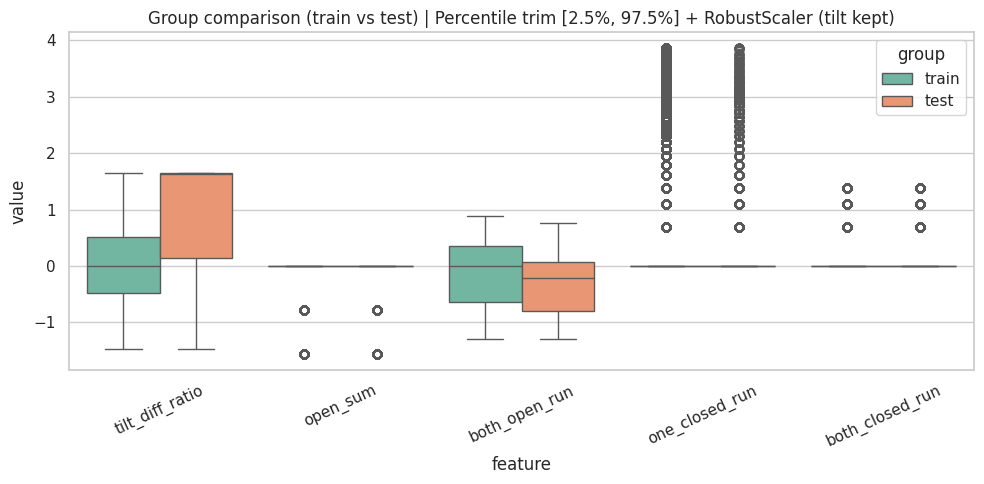

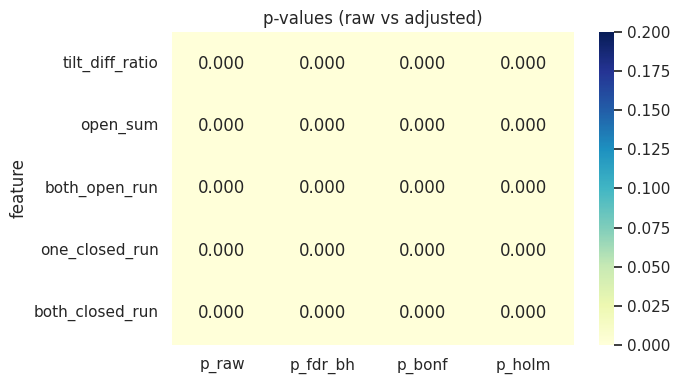

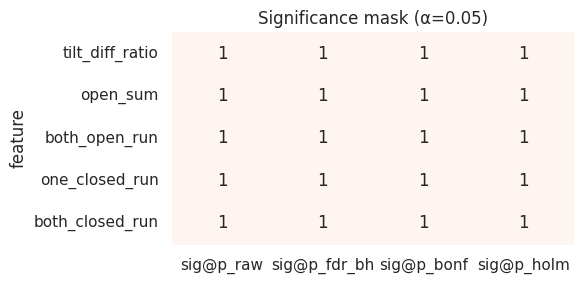


 완료: tilt_diff_ratio 변환 없이 → 퍼센타일 트리밍(train only) → RobustScaler(train-fit) → 통계분석/시각화/저장
결과 폴더: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_only_outlier_stats_pct_keep_tilt


In [8]:
# 9번셀 ------------------ 5) 두 집단 통계분석 ------------------
if len(test_scaled) == 0:
    print("\n test CSV가 없어 통계 비교는 생략합니다.")
else:
    df = pd.concat([
        train_scaled.assign(group='train'),
        test_scaled.assign(group='test')
    ], ignore_index=True)

    print("\n=== 스케일 후(train vs test) describe() by group ===")
    display(df.groupby('group')[FEAT_COLS].describe().round(3))

    rows=[]
    for col in FEAT_COLS:
        a = df[df.group=='train'][col].dropna().values
        b = df[df.group=='test'][col].dropna().values

        # 상수(분산=0) 변수는 스킵 (NaN 방지)
        if is_constant(a) or is_constant(b):
            rows.append([col, 'constant-skip', np.nan, np.nan,
                         float(np.mean(a)), float(np.mean(b)), np.nan, np.nan])
            continue

        pna, pnb = p_shapiro(a), p_shapiro(b)
        if (pna>=0.05) and (pnb>=0.05):
            stat, p = ttest_ind(a,b, equal_var=False); test_nm='Welch t-test'
        else:
            stat, p = mannwhitneyu(a,b, alternative='two-sided'); test_nm='Mann–Whitney U'
        rows.append([col, test_nm, float(stat), float(p),
                     float(np.mean(a)), float(np.mean(b)), pna, pnb])

    stats = pd.DataFrame(rows, columns=['feature','test','stat','p_raw','mean_train','mean_test','p_norm_train','p_norm_test'])

    # 다중비교 보정 (NaN-safe)
    stats['p_fdr_bh'] = safe_adjust(stats['p_raw'].values, 'fdr_bh')
    stats['p_bonf']   = safe_adjust(stats['p_raw'].values, 'bonferroni')
    stats['p_holm']   = safe_adjust(stats['p_raw'].values, 'holm')
    for col in ['p_raw','p_fdr_bh','p_bonf','p_holm']:
        stats[f'sig@{col}'] = stats[col] < ALPHA

    STATS_CSV = os.path.join(OUT_DIR, 'train_test_stats_with_corrections_pct_keep_tilt.csv')
    stats.to_csv(STATS_CSV, index=False)
    print("\n 통계 결과 저장:", STATS_CSV)
    display(stats.sort_values(['p_raw'], na_position='last'))

    # 시각화
    plt.figure(figsize=(10,5))
    melt = df.melt(id_vars='group', value_vars=FEAT_COLS, var_name='feature', value_name='value')
    sns.boxplot(data=melt, x='feature', y='value', hue='group', palette='Set2')
    plt.title(f'Group comparison (train vs test) | Percentile trim [{P_LO*100:.1f}%, {P_HI*100:.1f}%] + RobustScaler (tilt kept)')
    plt.xticks(rotation=25); plt.tight_layout(); plt.show()

    plt.figure(figsize=(7,4))
    heat = stats.set_index('feature')[['p_raw','p_fdr_bh','p_bonf','p_holm']]
    vmax = max(0.2, np.nanmax(heat.to_numpy()))
    sns.heatmap(heat, annot=True, fmt=".3f", cmap='YlGnBu', vmin=0, vmax=vmax)
    plt.title('p-values (raw vs adjusted)'); plt.tight_layout(); plt.show()

    plt.figure(figsize=(6,3))
    mask_df = stats.set_index('feature')[[f'sig@{c}' for c in ['p_raw','p_fdr_bh','p_bonf','p_holm']]].astype(float)
    sns.heatmap(mask_df, annot=True, fmt=".0f", cmap='Reds', cbar=False)
    plt.title('Significance mask (α=0.05)'); plt.tight_layout(); plt.show()

print("\n 완료: tilt_diff_ratio 변환 없이 → 퍼센타일 트리밍(train only) → RobustScaler(train-fit) → 통계분석/시각화/저장")
print("결과 폴더:", OUT_DIR)


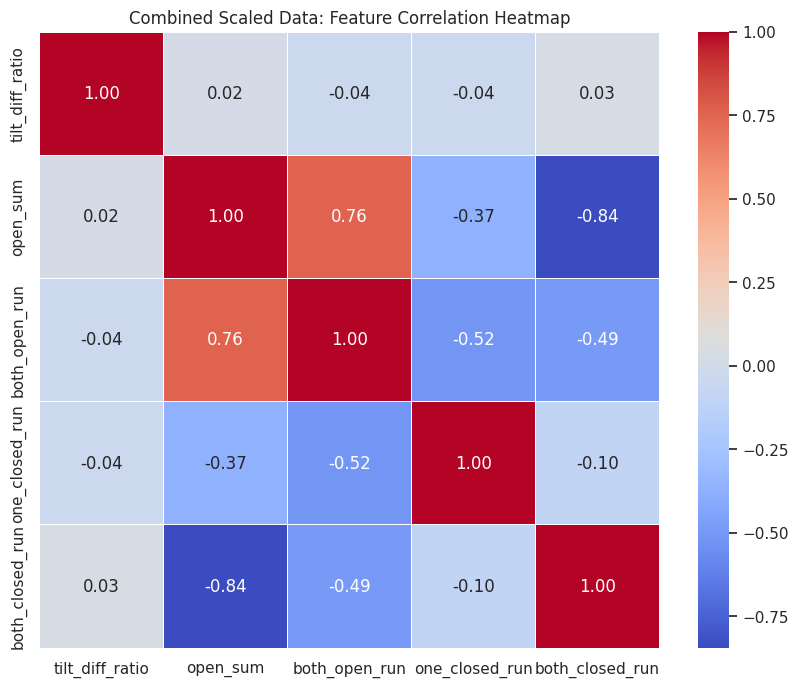

In [9]:
# 10번셀
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# train_scaled와 test_scaled가 이미 메모리에 있다고 가정함.
# 만약 없으면, 5번 셀을 다시 실행하여 생성해야 함.

# 두 데이터프레임을 결합.
# test_scaled는 train_scaled와 동일한 FEAT_COLS를 가지고 있다고 가정함.
combined_scaled_df = pd.concat([train_scaled, test_scaled], ignore_index=True)

# 상관관계 행렬을 계산.
correlation_matrix = combined_scaled_df[FEAT_COLS].corr()

# 히트맵.
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Combined Scaled Data: Feature Correlation Heatmap')
plt.show()

In [10]:
# 11번셀 ============================================================
# 최신 버전 호환: 한글 폰트 설정 (Colab / Linux)
# ============================================================
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import subprocess

# Nanum 폰트 설치
subprocess.run(["sudo", "apt-get", "install", "-y", "fonts-nanum"], stdout=subprocess.DEVNULL)
subprocess.run(["sudo", "fc-cache", "-fv"], stdout=subprocess.DEVNULL)

# matplotlib에 새 폰트 인식시키기
font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
for f in font_list:
    if 'Nanum' in f:
        fm.fontManager.addfont(f)

# 기본 폰트 설정
plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# 확인
print("'NanumGothic' 폰트 설정 완료 (그래프 한글 정상 표시)")
print("사용 중인 폰트:", plt.rcParams['font.family'])



'NanumGothic' 폰트 설정 완료 (그래프 한글 정상 표시)
사용 중인 폰트: ['NanumGothic']


In [11]:
# 12번셀 ======================================================
# 2. STEP 1: 정상 train CSV 로딩 & 전처리 (스케일러 학습)
# ======================================================

print("\n[STEP 1] 정상 train CSV 로드 → 스케일러 학습 기준 만들기")

train_df = load_with_video_id(TRAIN_CSVS)
print("train_df shape:", train_df.shape)
print(train_df["video_id"].value_counts())
print(train_df.head())

# 로그 변환 (tilt_diff_ratio 제외)
train_proc = train_df.copy()
for col in [c for c in FEAT_COLS if c != 'tilt_diff_ratio']:
    train_proc[col] = np.log1p(np.maximum(0, train_proc[col]))

# RobustScaler는 정상 train 기준으로 fit
scaler = RobustScaler().fit(train_proc[FEAT_COLS])
joblib.dump(scaler, SCALER_PATH)
print(f"[SAVE] RobustScaler 저장: {SCALER_PATH}")

# 스케일 적용
train_scaled = train_proc.copy()
train_scaled[FEAT_COLS] = scaler.transform(train_scaled[FEAT_COLS])

# AE 학습용 행렬/그룹
X_train_all = train_scaled[AE_FEAT_COLS].values.astype(np.float32)
g_train_all = train_scaled["video_id"].values



[STEP 1] 정상 train CSV 로드 → 스케일러 학습 기준 만들기
[WARN] not found: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_3.csv
train_df shape: (48219, 6)
video_id
train_0.csv    27461
train_1.csv    12773
train_2.csv     7985
Name: count, dtype: int64
   tilt_diff_ratio  open_sum  both_open_run  one_closed_run  both_closed_run  \
0       100.871058       1.0            0.0             1.0              0.0   
1        98.549058       2.0            1.0             0.0              0.0   
2        98.889801       2.0            2.0             0.0              0.0   
3        98.950814       2.0            3.0             0.0              0.0   
4        98.970086       2.0            4.0             0.0              0.0   

      video_id  
0  train_0.csv  
1  train_0.csv  
2  train_0.csv  
3  train_0.csv  
4  train_0.csv  
[SAVE] RobustScaler 저장: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/scaler_robust.joblib


In [12]:
'''# 13번셀 ======================================================
# 3. STEP 2: Denoising AE Grid Search (정상 train만)
# ======================================================

print("\n[STEP 2] Denoising AE Grid Search (정상 데이터로만)")
print(f"학습률(LR): {LR}, 노이즈 표준편차(DENOISE_STD): {DENOISE_STD}")

global_start_t = time.time()

best_val = float('inf')
best_model = None
best_info = {
    "L": None,
    "S": None,
    "latent": None,
    "depth": None,
    "val_loss": None,
    "train_time_sec": None
}

first_summary_printed = False

for L in WINDOWS:
    for S in STRIDES:
        if L <= S:
            continue

        # 시퀀스화
        Xseq, grp, starts, centers = make_seq_with_group(X_train_all, g_train_all, L, S)
        if len(Xseq) < 10:
            # 데이터가 너무 적으면 학습 불가 → 스킵
            continue

        # 그룹 기반 split (video_id 단위로 분리)
        gss = GroupShuffleSplit(n_splits=1, test_size=VAL_RATIO, random_state=RANDOM_STATE)
        tr_idx, va_idx = next(gss.split(Xseq, groups=grp))
        Xtr, Xva = Xseq[tr_idx], Xseq[va_idx]

        for latent, depth in product(DAE_GRID["latent"], DAE_GRID["depth"]):
            dae = build_denoising_ae(
                L=L,
                F=len(AE_FEAT_COLS),
                latent=latent,
                noise_std=DENOISE_STD,
                depth=depth,
                lr=LR
            )

            # 요약은 첫 후보에서만 깔끔하게 보여주자 (계속 찍히면 너무 길어짐)
            if not first_summary_printed:
                print("\n[Denoising AE 구조 미리보기 (첫 후보)]")
                dae.summary()
                first_summary_printed = True

            print(f"\n[Candidate] L={L}, S={S}, latent={latent}, depth={depth}, lr={LR}, noise_std={DENOISE_STD}")

            start_t = time.time()
            h = dae.fit(
                Xtr, Xtr,
                epochs=EPOCHS,
                batch_size=BATCH_SIZE,
                validation_data=(Xva, Xva),
                callbacks=[tf.keras.callbacks.EarlyStopping(
                    patience=PATIENCE,
                    restore_best_weights=True
                )],
                verbose=0
            )
            train_time = time.time() - start_t

            val_loss = float(np.min(h.history['val_loss']))
            print(f"→ val_loss={val_loss:.6f}, train_time={train_time:.2f} sec")

            if val_loss < best_val:
                best_val = val_loss
                best_model = dae
                best_info.update({
                    "L": L,
                    "S": S,
                    "latent": latent,
                    "depth": depth,
                    "val_loss": val_loss,
                    "train_time_sec": train_time
                })

total_time = time.time() - global_start_t

print("\n[Grid Search 결과]")
print("Best config:", best_info)
print(f"Best val_loss={best_val:.6f}")
print(f"✔ 선택된 윈도우/스트라이드: L={best_info['L']}, S={best_info['S']}")
print(f"⏱ Grid Search 전체 소요 시간: {total_time:.2f}초 ({total_time/60:.2f}분)")
print(f"⏱ Best 모델 단일 학습 시간: {best_info['train_time_sec']:.2f}초 ({best_info['train_time_sec']/60:.2f}분)")


# ======================================================
# 🔹 최적 DAE 모델 및 메타데이터 저장
# ======================================================
SAVE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results"

# 1) 전체 모델 구조+가중치 함께 저장 (.keras)
BEST_MODEL_PATH = f"{SAVE_DIR}/best_dae.keras"
best_model.save(BEST_MODEL_PATH)
print(f"[SAVE] Full model saved -> {BEST_MODEL_PATH}")

# 2) 메타정보(JSON) 저장 (입력 크기, latent, depth 등)
meta_info = {
    "H": best_model.input_shape[1] if len(best_model.input_shape) > 1 else None,
    "W": best_model.input_shape[2] if len(best_model.input_shape) > 2 else None,
    "C": best_model.input_shape[3] if len(best_model.input_shape) > 3 else None,
    "latent": best_info["latent"],
    "depth": best_info["depth"],
    "L": best_info["L"],
    "S": best_info["S"]
}
META_PATH = f"{SAVE_DIR}/best_dae.meta.json"
import json
with open(META_PATH, "w") as f:
    json.dump(meta_info, f, indent=2)
print(f"[SAVE] Meta info saved -> {META_PATH}")'''



'# 13번셀 ======================================================\n# 3. STEP 2: Denoising AE Grid Search (정상 train만)\n# ======================================================\n\nprint("\n[STEP 2] Denoising AE Grid Search (정상 데이터로만)")\nprint(f"학습률(LR): {LR}, 노이즈 표준편차(DENOISE_STD): {DENOISE_STD}")\n\nglobal_start_t = time.time()\n\nbest_val = float(\'inf\')\nbest_model = None\nbest_info = {\n    "L": None,\n    "S": None,\n    "latent": None,\n    "depth": None,\n    "val_loss": None,\n    "train_time_sec": None\n}\n\nfirst_summary_printed = False\n\nfor L in WINDOWS:\n    for S in STRIDES:\n        if L <= S:\n            continue\n\n        # 시퀀스화\n        Xseq, grp, starts, centers = make_seq_with_group(X_train_all, g_train_all, L, S)\n        if len(Xseq) < 10:\n            # 데이터가 너무 적으면 학습 불가 → 스킵\n            continue\n\n        # 그룹 기반 split (video_id 단위로 분리)\n        gss = GroupShuffleSplit(n_splits=1, test_size=VAL_RATIO, random_state=RANDOM_STATE)\n        tr_idx, va_idx = next(gs

In [13]:
# 14번셀===== 공통 유틸 (위쪽 한 번만 선언) ==========================================
import os, json
import numpy as np
import pandas as pd
import os, json
from pathlib import Path
import tensorflow as tf

SAVE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results"
BEST_MODEL_PATH = f"{SAVE_DIR}/best_dae.keras"
META_PATH       = f"{SAVE_DIR}/best_dae.meta.json"
WEIGHTS_PATH    = f"{SAVE_DIR}/best_dae_weights.h5"  # 혹시 따로 저장해 둔 경우 대비(없으면 무시)

assert os.path.isdir(SAVE_DIR), f"존재하지 않는 SAVE_DIR: {SAVE_DIR}"

best_model = None
best_info  = {"L": None, "S": None, "latent": None, "depth": None, "val_loss": None, "train_time_sec": None}


def calc_threshold_from_normal(
    mse_train_seq,
    method="auto",              # "auto"|"file"|"quantile"|"mad"
    q=0.9995,                   # quantile 기본값 (필요 시 조정)
    mad_k=4.0,                  # MAD 계수
    search_summary_path=None    # auto/file 모드에서 사용할 요약 파일 경로
):
    mse = np.asarray(mse_train_seq)
    mse = mse[np.isfinite(mse)]
    if mse.size == 0:
        raise ValueError("mse_train_seq is empty")

    # 1) 파일 우선 (그리드 탐색/파인 탐색 결과를 신뢰원본으로 사용)
    if method in ("auto", "file") and search_summary_path and os.path.isfile(search_summary_path):
        try:
            with open(search_summary_path, "r") as f:
                summary = json.load(f)
            if "recon_error_threshold" in summary:  # auto 파이프라인 요약 형식1
                return float(summary["recon_error_threshold"]), "file(recon_error_threshold)"
            if "best_fine" in summary and "thr_recon_error" in summary["best_fine"]:  # 형식2
                return float(summary["best_fine"]["thr_recon_error"]), "file(best_fine)"
        except Exception:
            pass  # 손상/포맷 상이 → 폴백

    # 2) quantile
    if method in ("auto", "quantile"):
        return float(np.quantile(mse, q)), f"quantile(q={q})"

    # 3) MAD (median + 1.4826*k*MAD)
    med = float(np.median(mse))
    mad = float(np.median(np.abs(mse - med)))
    return med + 1.4826 * mad_k * mad, f"mad(k={mad_k})"

def consecutive_run_lengths(binary_vec):
    """벡터 각 위치에 '해당 위치가 포함된 1-런 길이'를 기록(0은 0)"""
    v = np.asarray(binary_vec, dtype=int)
    n = len(v); res = np.zeros(n, dtype=int)
    i = 0
    while i < n:
        if v[i] == 0:
            i += 1
            continue
        j = i
        while j < n and v[j] == 1:
            j += 1
        runlen = j - i
        res[i:j] = runlen
        i = j
    return res


In [14]:
# 15번셀 === Robust AE loader (drop-in for your #12) =================================
import os, json
import numpy as np
import pandas as pd
import joblib
import tensorflow as tf

BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
OUT_DIR  = os.path.join(BASE_DIR, "dataset/outputs")
STAT_DIR = os.path.join(OUT_DIR, "denoising_analysis_results")
os.makedirs(STAT_DIR, exist_ok=True)

# Paths
SCALER_PATH      = os.path.join(STAT_DIR, "scaler_robust.joblib")
AE_META_JSON     = os.path.join(STAT_DIR, "best_dae.meta.json")          # ← grid search meta
AE_WEIGHTS_PATH  = os.path.join(STAT_DIR, "best_dae_weights.weights.h5") # weights-only
AE_KERAS_PATH    = os.path.join(STAT_DIR, "best_dae.keras")              # full model (if exists)

# Features (must match training-time)
FEAT_COLS    = ['tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run']
AE_FEAT_COLS = FEAT_COLS[:]
# Defaults (will be overwritten by meta if present)
BEST_L, BEST_S, BEST_LATENT, BEST_DEPTH = 20, 3, 32, 2
DENOISE_STD   = 0.05
LEARNING_RATE = 1e-3

def build_denoising_ae(L, F, latent=32, noise_std=0.05, depth=2, lr=1e-3):
    inp = tf.keras.Input(shape=(L, F))
    x   = tf.keras.layers.GaussianNoise(noise_std)(inp)
    for _ in range(depth):
        x = tf.keras.layers.Conv1D(64, 3, padding='same', activation='relu')(x)
    z = tf.keras.layers.Conv1D(latent, 3, padding='same', activation='relu', name='latent')(x)
    y = z
    for _ in range(depth):
        y = tf.keras.layers.Conv1D(64, 3, padding='same', activation='relu')(y)
    out = tf.keras.layers.Conv1D(F, 3, padding='same')(y)
    m = tf.keras.Model(inp, out)
    m.compile(optimizer=tf.keras.optimizers.Adam(lr), loss='mse')
    return m

print("\n[STEP 1] AE 및 스케일러 로드")

# 1) Scaler
scaler = joblib.load(SCALER_PATH)

# 2) Read meta first (so arch matches saved weights)
if os.path.isfile(AE_META_JSON):
    with open(AE_META_JSON, "r") as f:
        meta = json.load(f)
    BEST_L      = int(meta.get("L", BEST_L))
    BEST_S      = int(meta.get("S", BEST_S))
    BEST_LATENT = int(meta.get("latent", BEST_LATENT))
    BEST_DEPTH  = int(meta.get("depth", BEST_DEPTH))
    print(f"[META] L={BEST_L}, S={BEST_S}, latent={BEST_LATENT}, depth={BEST_DEPTH}")
else:
    print(f"[WARN] meta not found: {AE_META_JSON} (use defaults L={BEST_L}, S={BEST_S}, latent={BEST_LATENT}, depth={BEST_DEPTH})")

Fdim = len(AE_FEAT_COLS)

# 3) Try: load weights into same-arch model
model = build_denoising_ae(BEST_L, Fdim, latent=BEST_LATENT, noise_std=DENOISE_STD, depth=BEST_DEPTH, lr=LEARNING_RATE)

def try_load_weights_or_fallback(model):
    if os.path.isfile(AE_WEIGHTS_PATH):
        try:
            model.load_weights(AE_WEIGHTS_PATH)
            print(f" Weights loaded: {AE_WEIGHTS_PATH}")
            return model, "weights"
        except Exception as e:
            print("[WARN] load_weights failed, will try load_model:", repr(e))
    else:
        print(f"[INFO] weights file not found: {AE_WEIGHTS_PATH}")

    # Fallback: full model
    if os.path.isfile(AE_KERAS_PATH):
        try:
            full = tf.keras.models.load_model(AE_KERAS_PATH, compile=False)
            print(f" Full model loaded: {AE_KERAS_PATH}")
            return full, "fullmodel"
        except Exception as e:
            print("[ERROR] load_model failed too:", repr(e))
    else:
        print(f"[INFO] full model not found: {AE_KERAS_PATH}")

    raise ValueError("No compatible AE weights/model could be loaded. Check meta/paths/arch.")

model, load_mode = try_load_weights_or_fallback(model)

print(f"AE ready (mode={load_mode}) | L={BEST_L}, S={BEST_S}, latent={BEST_LATENT}, depth={BEST_DEPTH}, F={Fdim}")
model.summary()



[STEP 1] AE 및 스케일러 로드
[META] L=20, S=3, latent=32, depth=2
 Weights loaded: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/best_dae_weights.weights.h5
AE ready (mode=weights) | L=20, S=3, latent=32, depth=2, F=5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 20, 5)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise (GaussianNoise)  │ (None, 20, 5)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d (Conv1D)                 │ (None, 20, 64)         │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 20, 64)         │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ latent (Conv1D)                 │ (None, 20, 32)         │         6,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 20, 64)         │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 20, 64)         │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_4 (Conv1D)               │ (None, 20, 5)          │           965 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 39,077 (152.64 KB)

 Trainable params: 39,077 (152.64 KB)

 Non-trainable params: 0 (0.00 B)

In [15]:
# 16번셀 ======================================================
# 4. STEP 3: 임계값(threshold) 계산  (파일→quantile→MAD 순)
# ======================================================
import json
print("\n[STEP 3] 정상 train 전체로 threshold 계산")

# best_info 대신 저장된 AE_META_JSON에서 BEST_L과 BEST_S를 로드
# AE_META_JSON은 이전 셀에서 이미 정의되어 있다고 가정
AE_META_JSON = os.path.join(
    "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results",
    "best_dae.meta.json"
)

try:
    with open(AE_META_JSON, "r") as f:
        loaded_meta = json.load(f)
    BEST_L = loaded_meta.get("L", 20) # 기본값 20
    BEST_S = loaded_meta.get("S", 3)  # 기본값 3
    print(f"[INFO] Loaded BEST_L={BEST_L}, BEST_S={BEST_S} from {AE_META_JSON}")
except FileNotFoundError:
    print(f"[WARN] {AE_META_JSON} 파일을 찾을 수 없습니다. 기본값 L=20, S=3 사용.")
    BEST_L = 20
    BEST_S = 3
except Exception as e:
    print(f"[WARN] {AE_META_JSON} 로드 중 오류 발생: {e}. 기본값 L=20, S=3 사용.")
    BEST_L = 20
    BEST_S = 3


# 정상 전체를 최종 best 설정으로 다시 시퀀스화
Xseq_full, grp_full, starts_full, centers_full = make_seq_with_group(
    X_train_all,
    g_train_all,
    BEST_L,
    BEST_S
)

mse_train_seq = ae_mse(Xseq_full, model)

SEARCH_SUMMARY = os.path.join(
    "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results",
    "auto_threshold_search_summary.json"
)

thr, thr_src = calc_threshold_from_normal(
    mse_train_seq,
    method="auto",    # file -> quantile(q=0.9995) -> mad
    q=0.9995,
    mad_k=4.0,
    search_summary_path=SEARCH_SUMMARY
)

print(f"[INFO] Threshold selected ({thr_src}): {thr:.9f}")


[STEP 3] 정상 train 전체로 threshold 계산
[INFO] Loaded BEST_L=20, BEST_S=3 from /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/best_dae.meta.json
[INFO] Threshold selected (quantile(q=0.9995)): 0.051855415


In [16]:
# 17 번셀======================================================
# 5. STEP 4: train+test 전체에서 이상치 라벨링  (비디오별로 처리)
# ======================================================

print("\n[STEP 4] 전체(train+test) CSV 로드 & 전처리/스케일링 → 라벨링")

all_df_raw = load_with_video_id(ALL_EVAL_CSVS)
print("all_df_raw shape:", all_df_raw.shape)
print("[video_id counts in all_df_raw]")
print(all_df_raw["video_id"].value_counts())
print("[unique video_id list]")
print(all_df_raw["video_id"].unique())

# 그룹 라벨: train_* -> 0, test_* -> 1
all_df_raw["group_label"] = all_df_raw["video_id"].apply(infer_group_label)

# 동일 전처리 (tilt_diff_ratio는 로그 제외)
all_proc = all_df_raw.copy()
for col in [c for c in FEAT_COLS if c != 'tilt_diff_ratio']:
    all_proc[col] = np.log1p(np.maximum(0, all_proc[col]))

# 스케일링
all_scaled = all_proc.copy()
all_scaled[FEAT_COLS] = scaler.transform(all_scaled[FEAT_COLS])

# 이벤트 최소 길이(초) -> 프레임으로 변환
FPS = 30
EVENT_MIN_SEC = 0.5      # 원하는 최소 지속시간(초)으로 조정
EVENT_MIN_RUN = int(round(EVENT_MIN_SEC * FPS))

# 비디오별로 window 만들고 중앙 프레임에 이상치 투영
frame_labels = []
for vid, sub in all_scaled.groupby("video_id"):
    sub = sub.reset_index(drop=True)
    Xi = sub[AE_FEAT_COLS].values.astype(np.float32)

    # 비디오 내부에서만 시퀀스 생성
    Xseq, grp_local, starts_local, centers_local = make_seq_with_group(
        Xi,
        np.zeros(len(Xi)),   # 더미 (여기서는 그룹 필요 없음)
        BEST_L,
        BEST_S
    )

    if len(Xseq) == 0:
        # 짧아서 시퀀스가 안 나오는 경우
        is_outlier_frames = np.zeros(len(sub), dtype=int)
    else:
        mse_seq = ae_mse(Xseq, model)
        is_outlier_seq = (mse_seq > thr).astype(int)

        is_outlier_frames = np.zeros(len(sub), dtype=int)
        for sidx, cidx in enumerate(centers_local):
            if is_outlier_seq[sidx] == 1 and cidx < len(is_outlier_frames):
                is_outlier_frames[cidx] = 1

    df_part = sub.copy()
    df_part["is_outlier"] = is_outlier_frames
    df_part["idx_within_video"] = np.arange(len(sub), dtype=int)

    # run-length 계산 (비디오 내부 기준)
    df_part["outlier_runlen_tmp"] = consecutive_run_lengths(df_part["is_outlier"].values)
    frame_labels.append(df_part)

labeled = pd.concat(frame_labels, ignore_index=True)

# 이벤트 플래그: 일정 길이 이상 지속된 이상치
labeled["event_flag"] = (labeled["outlier_runlen_tmp"] >= EVENT_MIN_RUN).astype(int)

# 저장
labeled.to_csv(PER_FRAME_LABELED, index=False)
print(f"[SAVE] per-frame 라벨 결과 -> {PER_FRAME_LABELED}")

print("\n[is_outlier 라벨 분포]")
print(labeled["is_outlier"].value_counts(dropna=False))
print("\n[event_flag 라벨 분포]")
print(labeled["event_flag"].value_counts(dropna=False))

print("\n[디버그] labeled video_id coverage:")
print(labeled["video_id"].value_counts())
print(labeled["video_id"].unique())


[STEP 4] 전체(train+test) CSV 로드 & 전처리/스케일링 → 라벨링
[WARN] not found: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_3.csv
all_df_raw shape: (53476, 6)
[video_id counts in all_df_raw]
video_id
train_0.csv    27461
train_1.csv    12773
train_2.csv     7985
test_0.csv      4206
test_1.csv      1051
Name: count, dtype: int64
[unique video_id list]
['train_0.csv' 'train_1.csv' 'train_2.csv' 'test_0.csv' 'test_1.csv']
[SAVE] per-frame 라벨 결과 -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_frame_outlier_labels.csv

[is_outlier 라벨 분포]
is_outlier
0    53061
1      415
Name: count, dtype: int64

[event_flag 라벨 분포]
event_flag
0    53476
Name: count, dtype: int64

[디버그] labeled video_id coverage:
video_id
train_0.csv    27461
train_1.csv    12773
train_2.csv     7985
test_0.csv      4206
test_1.csv      1051
Name: count, dtype: int64
['test_0.csv' 'test_1.csv' 'train_0.csv' 'train_1.csv' 'train_2.csv']


In [17]:
# 18번셀 `best_model`
best_model = model
print("model variable has been assigned to best_model.")

model variable has been assigned to best_model.


In [18]:
# 19번셀 경로들
import json, os


BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
OUT_DIR  = os.path.join(BASE_DIR, "dataset/outputs")
STAT_DIR = os.path.join(OUT_DIR, "denoising_analysis_results")
AE_WEIGHTS_PATH = os.path.join(STAT_DIR, "best_dae_weights.weights.h5")
AE_META_JSON    = os.path.join(STAT_DIR, "best_dae.meta.json")

# 지금 메모리에 있는 model(= best_dae.keras 로드됨)을 weights로 저장
best_model.save_weights(AE_WEIGHTS_PATH)
print("Saved weights ->", AE_WEIGHTS_PATH)

# 메타도 함께 갱신(F 포함)
meta = {
    "L": BEST_L,
    "S": BEST_S,
    "latent": BEST_LATENT,
    "depth": BEST_DEPTH,
    "F": len(AE_FEAT_COLS),
    "noise_std": DENOISE_STD,
    "lr": LEARNING_RATE
}
with open(AE_META_JSON, "w") as f:
    json.dump(meta, f, indent=2)
print("Updated meta ->", AE_META_JSON)

Saved weights -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/best_dae_weights.weights.h5
Updated meta -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/best_dae.meta.json


In [19]:
# 20번셀 (revised): AE 로더를 메타 구동 + 안정적 백업 로딩으로 수정
import os, json
import numpy as np
import pandas as pd
import joblib
import tensorflow as tf
import matplotlib.pyplot as plt

# ====================================================
# 경로 및 설정
# ====================================================
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
OUT_DIR  = os.path.join(BASE_DIR, "dataset/outputs")
STAT_DIR = os.path.join(OUT_DIR, "denoising_analysis_results")
os.makedirs(STAT_DIR, exist_ok=True)

# CSV 경로들
TRAIN_CSVS = [os.path.join(OUT_DIR, f"train_{i}.csv") for i in range(3)]
TEST_CSVS  = [os.path.join(OUT_DIR, f"test_{i}.csv") for i in range(3)]
ALL_EVAL_CSVS = TRAIN_CSVS + TEST_CSVS

# 저장 경로
SCALER_PATH         = os.path.join(STAT_DIR, "scaler_robust.joblib")
AE_WEIGHTS_PATH     = os.path.join(STAT_DIR, "best_dae_weights.weights.h5")
AE_FULLMODEL_PATH   = os.path.join(STAT_DIR, "best_dae.keras")
AE_META_JSON        = os.path.join(STAT_DIR, "best_dae.meta.json")
PER_VIDEO_SEQ_OUTLIER_PATH = os.path.join(STAT_DIR, "per_video_outlier_seq_counts.csv")
PER_FRAME_OUTLIER_PATH     = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")
RUNLEN_CSV_PATH           = os.path.join(STAT_DIR, "run_length_distribution_by_group.csv")

# AE 파라미터 (기본값; 메타 있으면 아래에서 덮어씀)
FEAT_COLS    = ['tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run']
AE_FEAT_COLS = FEAT_COLS[:]
BEST_L       = 20   # ← 메타가 없을 때의 기본값 (최근 그리드서치 결과 반영)
BEST_S       = 3
BEST_LATENT  = 32
BEST_DEPTH   = 2
DENOISE_STD  = 0.05
LEARNING_RATE= 1e-3

# ====================================================
# 유틸
# ====================================================
def build_denoising_ae(L, F, latent=32, noise_std=0.05, depth=2, lr=1e-3):
    inp = tf.keras.Input(shape=(L, F))
    x   = tf.keras.layers.GaussianNoise(noise_std)(inp)
    for _ in range(depth):
        x = tf.keras.layers.Conv1D(64, 3, padding='same', activation='relu')(x)
    z = tf.keras.layers.Conv1D(latent, 3, padding='same', activation='relu', name='latent')(x)
    y = z
    for _ in range(depth):
        y = tf.keras.layers.Conv1D(64, 3, padding='same', activation='relu')(y)
    out = tf.keras.layers.Conv1D(F, 3, padding='same')(y)
    m = tf.keras.Model(inp, out)
    m.compile(optimizer=tf.keras.optimizers.Adam(lr), loss='mse')
    return m

# ====================================================
# 1️⃣ AE 및 스케일러 로드 (+ 메타 동기화)
# ====================================================
print("\n[STEP 1] AE 및 스케일러 로드")

# 스케일러
scaler = joblib.load(SCALER_PATH)

# 메타 읽어서 구조 동기화
if os.path.isfile(AE_META_JSON):
    try:
        with open(AE_META_JSON, "r") as f:
            meta = json.load(f)
        BEST_L      = int(meta.get("L", BEST_L))
        BEST_S      = int(meta.get("S", BEST_S))
        BEST_LATENT = int(meta.get("latent", BEST_LATENT))
        BEST_DEPTH  = int(meta.get("depth", BEST_DEPTH))
        DENOISE_STD = float(meta.get("noise_std", DENOISE_STD))
        # F(특징 수) 메타가 있으면 확인
        meta_F = int(meta.get("F", len(AE_FEAT_COLS)))
        if meta_F != len(AE_FEAT_COLS):
            # AE 입력 특성 수가 메타와 다르면 경고 (현재 파이프라인은 AE_FEAT_COLS=4(tilt 제외) 가정)
            print(f"[WARN] Meta F={meta_F} != current AE_FEAT_COLS={len(AE_FEAT_COLS)}. "
                  "입력 특성 구성 확인 필요.")
        print(f"[META] L={BEST_L}, S={BEST_S}, latent={BEST_LATENT}, depth={BEST_DEPTH}, F≈{meta_F}")
    except Exception as e:
        print("[WARN] 메타 로드 실패, 기본 파라미터 사용:", e)
else:
    print("[INFO] 메타 파일이 없어 기본 파라미터 사용합니다.")

# 모델 생성 (메타 기반)
model = build_denoising_ae(
    L=BEST_L, F=len(AE_FEAT_COLS),
    latent=BEST_LATENT, noise_std=DENOISE_STD,
    depth=BEST_DEPTH, lr=LEARNING_RATE
)

# 가중치 우선 로드 → 실패 시 풀모델(.keras) 백업 로드
loaded_mode = None
try:
    if os.path.isfile(AE_WEIGHTS_PATH):
        model.load_weights(AE_WEIGHTS_PATH)
        loaded_mode = "weights"
        print(f"✅ AE 가중치 로드 완료 | {AE_WEIGHTS_PATH}")
    else:
        raise FileNotFoundError("weights file not found")
except Exception as e:
    print("[WARN] load_weights 실패, 풀모델(.keras) 시도:", e)
    if os.path.isfile(AE_FULLMODEL_PATH):
        model = tf.keras.models.load_model(AE_FULLMODEL_PATH, compile=False)
        loaded_mode = "fullmodel"
        print(f"✅ Full model 로드 완료 | {AE_FULLMODEL_PATH}")
        # 앞으로 충돌 방지 위해 일치하는 weights를 다시 덤프
        try:
            model.save_weights(AE_WEIGHTS_PATH)
            print(f"✅ 일치 가중치 재저장 -> {AE_WEIGHTS_PATH}")
        except Exception as ee:
            print("[WARN] 일치 가중치 재저장 실패:", ee)
    else:
        raise FileNotFoundError(
            f"Neither weights nor full model found.\n"
            f"- weights: {AE_WEIGHTS_PATH}\n- fullmodel: {AE_FULLMODEL_PATH}"
        )

print(f"AE ready (mode={loaded_mode}) | L={BEST_L}, S={BEST_S}, latent={BEST_LATENT}, depth={BEST_DEPTH}, F={len(AE_FEAT_COLS)}")
model.summary()



[STEP 1] AE 및 스케일러 로드
[META] L=20, S=3, latent=32, depth=2, F≈5
✅ AE 가중치 로드 완료 | /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/best_dae_weights.weights.h5
AE ready (mode=weights) | L=20, S=3, latent=32, depth=2, F=5


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 20, 5)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_1                │ (None, 20, 5)          │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_5 (Conv1D)               │ (None, 20, 64)         │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_6 (Conv1D)               │ (None, 20, 64)         │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ latent (Conv1D)                 │ (None, 20, 32)         │         6,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_7 (Conv1D)               │ (None, 20, 64)         │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_8 (Conv1D)               │ (None, 20, 64)         │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_9 (Conv1D)               │ (None, 20, 5)          │           965 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 39,077 (152.64 KB)

 Trainable params: 39,077 (152.64 KB)

 Non-trainable params: 0 (0.00 B)

In [20]:
# 21번셀====================================================
# Step 2 + Step 3 통합본 (채널/스케일링/영상경계 일치 보장)
# ====================================================
import os
import numpy as np
import pandas as pd

# --- 사전 체크 ---
assert 'TRAIN_CSVS' in globals() and len(TRAIN_CSVS) > 0, "[ERR] TRAIN_CSVS가 비어있어요."
assert 'ALL_EVAL_CSVS' in globals() and len(ALL_EVAL_CSVS) > 0, "[ERR] ALL_EVAL_CSVS가 비어있어요."
assert 'FEAT_COLS' in globals(), "[ERR] FEAT_COLS가 정의되어야 해요."
assert 'AE_FEAT_COLS' in globals(), "[ERR] AE_FEAT_COLS가 정의되어야 해요."
assert 'scaler' in globals(), "[ERR] scaler가 로드/fit되어 있어야 해요."
assert 'model' in globals(), "[ERR] AE(model)가 로드되어 있어야 해요."
assert 'BEST_L' in globals() and 'BEST_S' in globals(), "[ERR] BEST_L/BEST_S가 설정되어야 해요."
assert 'THRESHOLD_PERCENTILE' in globals(), "[ERR] THRESHOLD_PERCENTILE이 필요해요."
assert hasattr(model, 'input_shape'), "[ERR] model.input_shape를 확인할 수 없어요."

FEAT_COLS = [
    "tilt_diff_ratio",
    "open_sum",
    "both_open_run",
    "one_closed_run",
    "both_closed_run"
]
# 🔧 채널 맞추기: AE가 모든 FEAT_COLS(5개)를 받도록
AE_FEAT_COLS = FEAT_COLS  # (= ['tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run'])

# 모델과 AE_FEAT_COLS 채널 수 잠금
assert len(AE_FEAT_COLS) == model.input_shape[-1], \
    f"[ERR] AE_FEAT_COLS={len(AE_FEAT_COLS)}개인데, 모델은 C={model.input_shape[-1]} 채널을 기대합니다."

SAFE_EPS = 1e-9
if 'STAT_DIR' not in globals():
    STAT_DIR = "./outputs"
os.makedirs(STAT_DIR, exist_ok=True)
if 'PER_VIDEO_SEQ_OUTLIER_PATH' not in globals():
    PER_VIDEO_SEQ_OUTLIER_PATH = os.path.join(STAT_DIR, "per_video_outlier_seq_windows.csv")

def _log_safe_transform(df, feat_cols, exclude_col='tilt_diff_ratio'):
    """tilt_diff_ratio 제외하고 log1p, tilt는 클리핑만."""
    df = df.copy()
    # 1) exclude 제외한 나머지는 log1p
    for c in [x for x in feat_cols if x != exclude_col]:
        col = df[c].astype(float).fillna(0.0)
        col = np.maximum(0.0, col)
        df[c] = np.log1p(col)
    # 2) exclude_col은 원본 유지(경험적 클리핑)
    if exclude_col in feat_cols and exclude_col in df.columns:
        col = df[exclude_col].astype(float)
        if col.notna().sum() > 0:
            low  = np.nanpercentile(col.dropna(), 0.5)
            high = np.nanpercentile(col.dropna(), 99.5)
        else:
            low, high = -np.inf, np.inf
        df[exclude_col] = np.clip(col, low - 10.0, high + 10.0).fillna(0.0)
    return df

def _check_in_shape(model, Xseq, feat_cols):
    """모델 입력 채널/길이와 시퀀스 일치 여부 확인"""
    exp_c = model.input_shape[-1]
    got_c = Xseq.shape[-1]
    assert got_c == exp_c, f"[채널 불일치] model C={exp_c}, Xseq C={got_c}, AE_FEAT_COLS={feat_cols}"
    if model.input_shape[1] is not None:
        exp_L = model.input_shape[1]
        got_L = Xseq.shape[1]
        assert got_L == exp_L, f"[길이 불일치] model L={exp_L}, Xseq L={got_L}"

print("\n[STEP 2] 정상 train CSV 로드 & threshold 계산")

# --- 1) 정상 데이터 로드 ---
train_df = load_with_video_id(TRAIN_CSVS)  # 반드시 'video_id' 포함

# --- 2) 전처리(로그/클리핑) ---
train_df = _log_safe_transform(train_df, FEAT_COLS, exclude_col='tilt_diff_ratio')

# --- 3) 스케일링 (스케일러는 FEAT_COLS 기준으로 fit되어 있다고 가정) ---
train_df[FEAT_COLS] = scaler.transform(train_df[FEAT_COLS])

# --- 4) 시퀀스 생성: "train_df"에서 직접 생성하여 Step 3과 완전 일치 ---
X_train = train_df[AE_FEAT_COLS].to_numpy(dtype=np.float32)   # AE 입력용 열만
g_train = train_df["video_id"].to_numpy()

ret = make_seq_with_group(X_train, g_train, BEST_L, BEST_S)
if not isinstance(ret, (list, tuple)) or len(ret) < 2:
    raise TypeError("[ERR] make_seq_with_group는 최소 (Xseq, grp)를 반환해야 합니다.")
Xseq, grp = ret[0], ret[1]
print(f"[DEBUG] Step2 Xseq.shape={getattr(Xseq,'shape',None)} | n_grp={len(grp)}")

# --- 5) AE 재구성오차(MSE) 계산 ---
_check_in_shape(model, Xseq, AE_FEAT_COLS)
mse_train = ae_mse(Xseq, model)
if mse_train is None or len(mse_train) == 0:
    raise RuntimeError("[ERR] mse_train이 비어있어요. 시퀀스/모델 출력을 확인하세요.")

# --- 6) 임계치 계산 (percentile -> 실패시 MAD fallback) ---
thr = None
try:
    thr = np.percentile(mse_train, THRESHOLD_PERCENTILE)
except Exception as e:
    print(f"[WARN] 퍼센타일 임계치 계산 실패: {e}")

if (thr is None) or (not np.isfinite(thr)) or (thr <= 0):
    med = np.median(mse_train)
    mad = np.median(np.abs(mse_train - med)) + SAFE_EPS
    k = 7.0  # 보수적 기본값
    thr = med + k * mad
    print(f"[INFO] MAD 기반 대체 임계치 사용: median={med:.6f}, mad={mad:.6f}, k={k} -> thr={thr:.6f}")
else:
    print(f"[INFO] Threshold (percentile {THRESHOLD_PERCENTILE}%): {thr:.6f}")

thr_meta = {
    "rule": f"percentile_{THRESHOLD_PERCENTILE}",
    "L": int(BEST_L),
    "S": int(BEST_S),
    "n_seq": int(len(Xseq)),
    "mse_train_mean": float(np.mean(mse_train)),
    "mse_train_med": float(np.median(mse_train)),
    "threshold": float(thr)
}
print("[META] threshold meta:", thr_meta)

# ====================================================
# Step 3: 전체 데이터 라벨링 및 이상치 윈도우 카운트
# ====================================================
print("\n[STEP 3] 전체 데이터 라벨링 및 이상치 윈도우 카운트")

# 1) 전체 로드
all_df = load_with_video_id(ALL_EVAL_CSVS)
if 'group_label' not in all_df.columns:
    # 사용자 정의 함수 가정
    all_df["group_label"] = all_df["video_id"].apply(infer_group_label)

# 2) 전처리(로그/클리핑) - Step 2와 동일 규칙
all_df = _log_safe_transform(all_df, FEAT_COLS, exclude_col='tilt_diff_ratio')

# 3) 스케일링 - Step 2와 동일 스케일러/열 순서
all_df[FEAT_COLS] = scaler.transform(all_df[FEAT_COLS])

# 4) 비디오별 시퀀스 → AE MSE → 임계치 라벨링
rows, empty_videos = [], []
for vid, sub in all_df.groupby("video_id", sort=False):
    # AE 입력용 열만 추출
    Xv = sub[AE_FEAT_COLS].to_numpy(dtype=np.float32)
    gv = sub['video_id'].to_numpy()

    ret = make_seq_with_group(Xv, gv, BEST_L, BEST_S)
    if not isinstance(ret, (list, tuple)) or len(ret) < 2:
        empty_videos.append(vid)
        rows.append({
            "video_id": vid,
            "group_label": int(infer_group_label(vid)),
            "total_seq_windows": 0,
            "outlier_seq_windows": 0,
            "outlier_seq_ratio": 0.0
        })
        continue

    Xseq_v, grp_v = ret[0], ret[1]
    if Xseq_v is None or len(Xseq_v) == 0:
        empty_videos.append(vid)
        rows.append({
            "video_id": vid,
            "group_label": int(infer_group_label(vid)),
            "total_seq_windows": 0,
            "outlier_seq_windows": 0,
            "outlier_seq_ratio": 0.0
        })
        continue

    # 🔒 채널/길이 가드
    _check_in_shape(model, Xseq_v, AE_FEAT_COLS)

    mse_v = ae_mse(Xseq_v, model)
    if mse_v is None or len(mse_v) == 0:
        empty_videos.append(vid)
        rows.append({
            "video_id": vid,
            "group_label": int(infer_group_label(vid)),
            "total_seq_windows": 0,
            "outlier_seq_windows": 0,
            "outlier_seq_ratio": 0.0
        })
        continue

    is_out = (mse_v > thr).astype(int)
    rows.append({
        "video_id": vid,
        "group_label": int(infer_group_label(vid)),
        "total_seq_windows": int(len(is_out)),
        "outlier_seq_windows": int(is_out.sum()),
        "outlier_seq_ratio": float(is_out.mean())
    })

# 5) 저장 & 요약
out_df = pd.DataFrame(rows).sort_values(["group_label", "video_id"]).reset_index(drop=True)
out_df["group_name"] = out_df["group_label"].map({0: "Normal", 1: "Abnormal"})

os.makedirs(os.path.dirname(PER_VIDEO_SEQ_OUTLIER_PATH), exist_ok=True)
out_df.to_csv(PER_VIDEO_SEQ_OUTLIER_PATH, index=False, encoding="utf-8-sig")
print(f"[SAVE] per-video seq-window outlier stats -> {PER_VIDEO_SEQ_OUTLIER_PATH}")

summary = (
    out_df.groupby("group_name", dropna=False)
          .agg(n_videos=("video_id", "nunique"),
               total_windows=("total_seq_windows", "sum"),
               outlier_windows=("outlier_seq_windows", "sum"))
          .reset_index()
)
summary["outlier_ratio_overall"] = summary["outlier_windows"] / (summary["total_windows"] + SAFE_EPS)

print("\n[SUMMARY] by group")
print(summary)

if len(empty_videos) > 0:
    print(f"[WARN] 빈 시퀀스/계산 불가로 스킵된 영상: {len(empty_videos)}개 -> "
          f"{empty_videos[:5]}{' ...' if len(empty_videos)>5 else ''}")



[STEP 2] 정상 train CSV 로드 & threshold 계산
[DEBUG] Step2 Xseq.shape=(16067, 20, 5) | n_grp=16067
[INFO] Threshold (percentile 95.0%): 0.009207
[META] threshold meta: {'rule': 'percentile_95.0', 'L': 20, 'S': 3, 'n_seq': 16067, 'mse_train_mean': 0.001960588386282325, 'mse_train_med': 0.0004360782040748745, 'threshold': 0.009206735529005527}

[STEP 3] 전체 데이터 라벨링 및 이상치 윈도우 카운트
[SAVE] per-video seq-window outlier stats -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_video_outlier_seq_counts.csv

[SUMMARY] by group
  group_name  n_videos  total_windows  outlier_windows  outlier_ratio_overall
0   Abnormal         3          11050             2450               0.221719
1     Normal         3          16056              800               0.049826



[SETUP] AE, Scaler 로드 및 Threshold 재계산
AE 전체 모델 로드: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/best_dae.keras
[WARN] BEST_L(15) != model.L(20) → 윈도우 생성 파라미터를 model.L로 맞추는 게 안전해요.
[INFO] AE 로딩 방식: keras


Model: "functional_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_55 (InputLayer)     │ (None, 20, 5)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_55               │ (None, 20, 5)          │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_329 (Conv1D)             │ (None, 20, 64)         │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_330 (Conv1D)             │ (None, 20, 64)         │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ latent (Conv1D)                 │ (None, 20, 32)         │         6,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_331 (Conv1D)             │ (None, 20, 64)         │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_332 (Conv1D)             │ (None, 20, 64)         │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_333 (Conv1D)             │ (None, 20, 5)          │           965 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 39,077 (152.64 KB)

 Trainable params: 39,077 (152.64 KB)

 Non-trainable params: 0 (0.00 B)

[WARN] not found: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_3.csv
[INFO] Threshold (percentile 95.0%): 0.009168
[WARN] not found: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/train_3.csv
[INFO] `all_df` has been reloaded and preprocessed in cell 16.

[STEP 4] 프레임 단위 라벨링 및 run-length 분석
[SAVE] /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_frame_outlier_labels.csv
[SAVE] /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/run_length_distribution_by_group.csv
  group_name  run_length  count
0   abnormal           1   1070
1     normal           1    803
[SAVE] /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/run_length_distribution_bar.png


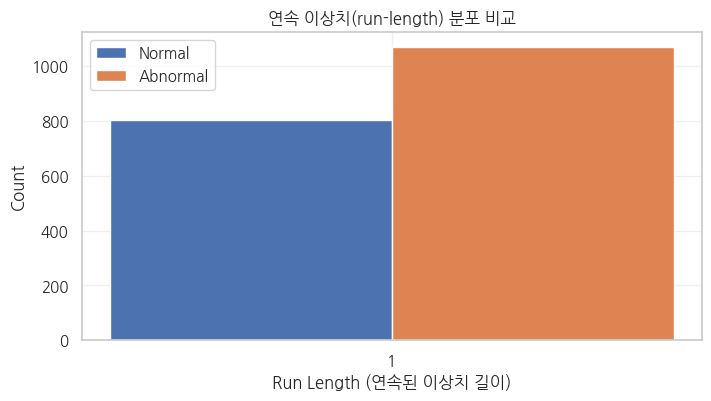

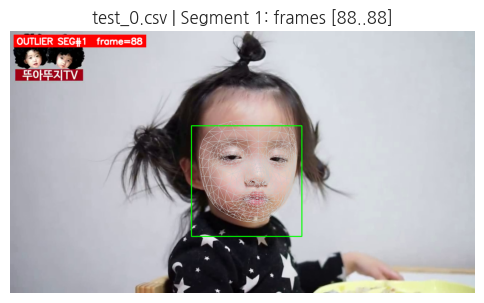

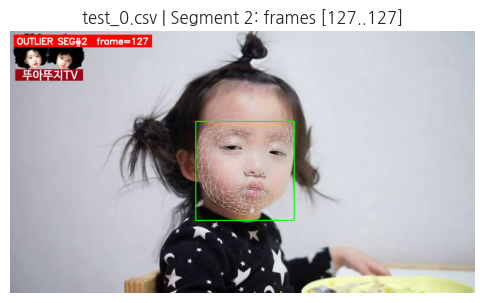

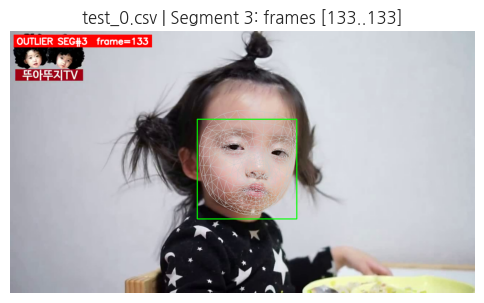

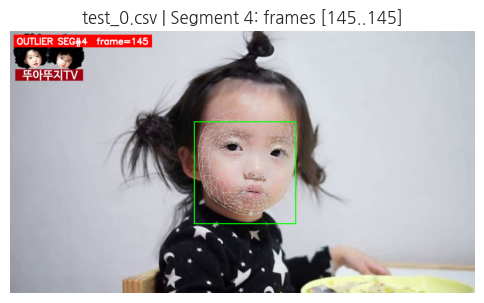

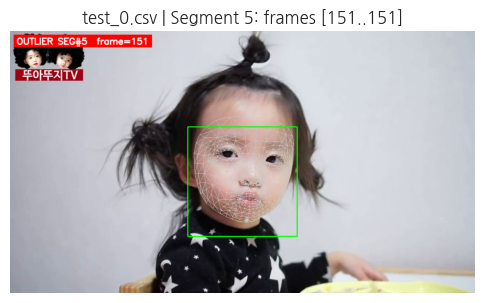

[SAVE] 선택 구간 5개만 합쳐 저장 → /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/outlier_videos/test_0_outlier_segments_5.mp4
📽 미리보기로 5개 구간의 첫 프레임을 출력했습니다.


In [21]:
# 22번셀 ====================================================
# 연속 이상치(run length) 계산 및 집단별 시각화
#     + NEW: 이상치 포함 영상 시각화/저장
# ====================================================
import os
import cv2
import numpy as np
import pandas as pd
import joblib
import tensorflow as tf
import matplotlib.pyplot as plt
from pathlib import Path

# ====================================================
# 경로 및 설정 (필요한 상수들 재정의)
# ====================================================
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
OUT_DIR  = os.path.join(BASE_DIR, "dataset/outputs")
STAT_DIR = os.path.join(OUT_DIR, "denoising_analysis_results")
os.makedirs(STAT_DIR, exist_ok=True)

TRAIN_CSVS = [os.path.join(OUT_DIR, f"train_{i}.csv") for i in range(4)]
ALL_EVAL_CSVS = TRAIN_CSVS + [os.path.join(OUT_DIR, f"test_{i}.csv") for i in range(2)]

SCALER_PATH = os.path.join(STAT_DIR, "scaler_robust.joblib")
AE_WEIGHTS_PATH = os.path.join(STAT_DIR, "best_dae_weights.weights.h5")  # 가중치 파일 경로
PER_FRAME_OUTLIER_PATH = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")
RUNLEN_CSV_PATH = os.path.join(STAT_DIR, "run_length_distribution_by_group.csv")

FEAT_COLS    = ['tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run']
AE_FEAT_COLS =FEAT_COLS[:]
BEST_L = 15
BEST_S = 3
BEST_LATENT = 32
BEST_DEPTH = 2
DENOISE_STD = 0.05
THRESHOLD_PERCENTILE = 95.0
LEARNING_RATE = 1e-3

# ====================================================
# 유틸 함수들 (셀 내에서 재정의하여 독립성 확보)
# ====================================================
def infer_group_label(video_id):
    v = str(video_id)
    if v.startswith("train"): return 0
    elif v.startswith("test"): return 1
    return None

def load_with_video_id(paths):
    dfs = []
    for p in paths:
        if os.path.isfile(p):
            df = pd.read_csv(p)
            df["video_id"] = os.path.basename(p)
            dfs.append(df)
        else:
            print(f"[WARN] not found: {p}")
    if not dfs:
        raise FileNotFoundError("No CSVs loaded")
    return pd.concat(dfs, ignore_index=True)

def make_seq_with_group(X, groups, L, S):
    N = len(X)
    starts = range(0, max(0, N - L + 1), S)
    if N >= L:
        seqs = np.stack([X[s:s+L] for s in starts], axis=0)
    else:
        seqs = np.empty((0, L, X.shape[1]), dtype=X.dtype)
    centers = [s + L // 2 for s in starts]
    grp = np.array([groups[c] for c in centers]) if len(centers) > 0 else np.array([], dtype=object)
    return seqs, grp, starts, centers

def build_denoising_ae(L, F, latent=32, noise_std=0.05, depth=2, lr=1e-3):
    inp = tf.keras.Input(shape=(L, F))
    x = tf.keras.layers.GaussianNoise(noise_std)(inp)
    for _ in range(depth):
        x = tf.keras.layers.Conv1D(64, 3, padding='same', activation='relu')(x)
    z = tf.keras.layers.Conv1D(latent, 3, padding='same', activation='relu', name='latent')(x)
    y = z
    for _ in range(depth):
        y = tf.keras.layers.Conv1D(64, 3, padding='same', activation='relu')(y)
    out = tf.keras.layers.Conv1D(F, 3, padding='same')(y)
    m = tf.keras.Model(inp, out)
    m.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss='mse')  # ← lr 인자명 수정
    return m

def ae_mse(Xseq, model):
    if len(Xseq) == 0:
        return np.array([])
    Xr = model.predict(Xseq, verbose=0)
    err = (Xseq - Xr) ** 2
    return err.mean(axis=(1, 2))

# ====================================================
# AE 및 스케일러 로드 및 Threshold 재계산 (아키텍처-가중치 자동 정합)
# ====================================================
print("\n[SETUP] AE, Scaler 로드 및 Threshold 재계산")

import json

# 경로들
AE_MODEL_PATH = os.path.join(STAT_DIR, "best_dae.keras")          # 전체 모델 저장본(있으면 최우선)
AE_META_PATH  = os.path.join(STAT_DIR, "best_dae.meta.json")      # 메타(입력 L/F/latent/depth 등)
AE_WEIGHTS_PATH = os.path.join(STAT_DIR, "best_dae_weights.weights.h5")  # 가중치-only

# 0) Scaler 로드
scaler = joblib.load(SCALER_PATH)

def load_meta_safe(path):
    try:
        with open(path, "r") as f:
            return json.load(f)
    except Exception:
        return {}

# 1) 우선 전체 모델(.keras)이 있으면 그대로 로드
model = None
loaded_from = None
if os.path.isfile(AE_MODEL_PATH):
    try:
        model = tf.keras.models.load_model(AE_MODEL_PATH, compile=False)
        loaded_from = "keras"
        print(f"AE 전체 모델 로드: {AE_MODEL_PATH}")
    except Exception as e:
        print(f"[WARN] .keras 로드 실패: {e}")

# 2) .keras가 없거나 실패한 경우: meta → 동일 아키텍처 재구축 후 가중치 로드
if model is None:
    meta = load_meta_safe(AE_META_PATH)
    # 메타에 있으면 우선 적용 (없으면 기존 상수 유지)
    L_meta      = int(meta.get("L", BEST_L))
    F_meta      = len(AE_FEAT_COLS)  # 입력 feature 수는 현재 파이프라인 기준
    latent_meta = int(meta.get("latent", BEST_LATENT))
    depth_meta  = int(meta.get("depth", BEST_DEPTH))
    lr_meta     = float(meta.get("lr", LEARNING_RATE))

    print(f"[META] Using L={L_meta}, F={F_meta}, latent={latent_meta}, depth={depth_meta}, lr={lr_meta}")
    model = build_denoising_ae(L_meta, F_meta, latent=latent_meta, noise_std=DENOISE_STD,
                               depth=depth_meta, lr=lr_meta)
    # 2-1) 가중치 로드 시도 (정합 일치 가정)
    try:
        model.load_weights(AE_WEIGHTS_PATH)
        loaded_from = "weights_strict"
        print("AE 가중치 로드 완료 (strict)")
    except Exception as e1:
        print(f"[WARN] strict 가중치 로드 실패: {e1}\n→ by_name + skip_mismatch 로 재시도")
        # 2-2) 이름 기준 + mismatch 무시로 완화 로드
        try:
            model.load_weights(AE_WEIGHTS_PATH, by_name=True, skip_mismatch=True)
            loaded_from = "weights_relaxed"
            print("AE 가중치 로드 완료 (relaxed: by_name+skip_mismatch)")
        except Exception as e2:
            raise RuntimeError(
                f"[ERR] AE 가중치 로드 실패. 아키텍처와 가중치가 크게 달라요.\n"
                f"meta 파일이나 BEST_* 상수를 확인하거나 .keras 전체 모델을 사용하세요.\n"
                f"strict: {e1}\nrelaxed: {e2}"
            )

# 3) 입력 길이(BEST_L)와 메타/모델 불일치 시 경고 (윈도우 생성 시 문제될 수 있음)
in_shape = model.input_shape  # (None, L, F)
if isinstance(in_shape, (list, tuple)) and len(in_shape) == 3:
    L_from_model = in_shape[1]
    F_from_model = in_shape[2]
    if L_from_model != BEST_L:
        print(f"[WARN] BEST_L({BEST_L}) != model.L({L_from_model}) → 윈도우 생성 파라미터를 model.L로 맞추는 게 안전해요.")
        BEST_L = L_from_model  # 자동 동기화
    if F_from_model != len(AE_FEAT_COLS):
        print(f"[WARN] AE_FEAT_COLS 수({len(AE_FEAT_COLS)}) != model.F({F_from_model}) → FEAT 구성이 다른 학습본일 수 있어요.")

print(f"[INFO] AE 로딩 방식: {loaded_from}")
model.summary()  # 필요 시 주석 해제

# ====================================================
# Threshold 재계산 (정상 train 데이터 이용) - 영상 경계 보존 + 전처리 일관성
# ====================================================
train_df = load_with_video_id(TRAIN_CSVS)

# 로그변환(tilt_diff_ratio 제외) + 느슨한 클리핑
for c in [x for x in FEAT_COLS if x != 'tilt_diff_ratio']:
    col = train_df[c].astype(float).fillna(0.0)
    col = np.maximum(0.0, col)
    train_df[c] = np.log1p(col)

if 'tilt_diff_ratio' in FEAT_COLS:
    col = train_df['tilt_diff_ratio'].astype(float)
    if col.notna().sum() > 0:
        low = np.nanpercentile(col.dropna(), 0.5)
        high = np.nanpercentile(col.dropna(), 99.5)
        train_df['tilt_diff_ratio'] = np.clip(col, low - 10.0, high + 10.0).fillna(0.0)
    else:
        train_df['tilt_diff_ratio'] = 0.0

# 스케일링
train_df[FEAT_COLS] = scaler.transform(train_df[FEAT_COLS])

# video_id별로 시퀀스 생성 → MSE 결합 (경계 보존)
mse_list = []
for vid, sub in train_df.groupby("video_id", sort=False):
    Xv = sub[AE_FEAT_COLS].values.astype(np.float32)
    Xseq_v, _, _, _ = make_seq_with_group(Xv, np.zeros(len(Xv)), BEST_L, BEST_S)
    if len(Xseq_v) == 0:
        continue
    mse_list.append(ae_mse(Xseq_v, model))

mse_train = np.concatenate(mse_list) if len(mse_list) > 0 else np.array([])
if mse_train.size == 0:
    raise RuntimeError("[ERR] mse_train이 비어 있음. 입력 길이/윈도우 파라미터 확인 필요.")

# 퍼센타일 + MAD fallback
try:
    thr = float(np.percentile(mse_train, THRESHOLD_PERCENTILE))
except Exception as e:
    print(f"[WARN] 퍼센타일 계산 실패: {e}")
    thr = np.nan

if not np.isfinite(thr) or thr <= 0:
    med = float(np.median(mse_train))
    mad = float(np.median(np.abs(mse_train - med))) + 1e-9
    k = 7.0
    thr = med + k * mad
    print(f"[INFO] MAD 대체 임계치 사용: median={med:.6f}, mad={mad:.6f}, k={k} → thr={thr:.6f}")
else:
    print(f"[INFO] Threshold (percentile {THRESHOLD_PERCENTILE}%): {thr:.6f}")


# ====================================================
# 원본 VIDEO_ROOT 및 OUT_VIDEO_DIR 정의
# ====================================================
VIDEO_ROOT = Path("/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/videos")
VIDEO_EXTS = [".mp4", ".avi", ".mov", ".mkv"]
OUT_VIDEO_DIR = Path(STAT_DIR) / "outlier_videos"
OUT_VIDEO_DIR.mkdir(parents=True, exist_ok=True)

# --- all_df 로드 및 전처리 (Step 2/3과 동일 규칙) ---
all_df = load_with_video_id(ALL_EVAL_CSVS)
all_df["group_label"] = all_df["video_id"].apply(infer_group_label)

for c in [x for x in FEAT_COLS if x != 'tilt_diff_ratio']:
    col = all_df[c].astype(float).fillna(0.0)
    col = np.maximum(0.0, col)
    all_df[c] = np.log1p(col)

if 'tilt_diff_ratio' in FEAT_COLS:
    col = all_df['tilt_diff_ratio'].astype(float)
    if col.notna().sum() > 0:
        low = np.nanpercentile(col.dropna(), 0.5)
        high = np.nanpercentile(col.dropna(), 99.5)
        all_df['tilt_diff_ratio'] = np.clip(col, low - 10.0, high + 10.0).fillna(0.0)
    else:
        all_df['tilt_diff_ratio'] = 0.0

all_df[FEAT_COLS] = scaler.transform(all_df[FEAT_COLS])
print("[INFO] `all_df` has been reloaded and preprocessed in cell 16.")

def guess_video_path(video_id: str) -> Path:
    """
    video_id가 'test_0.csv' 형태라면 'test_0'을 stem으로 가정해서
    VIDEO_ROOT/test_0.(mp4|avi|mov|mkv) 순서로 존재 확인.
    """
    stem = Path(video_id).stem  # e.g., 'test_0'
    for ext in VIDEO_EXTS:
        cand = VIDEO_ROOT / f"{stem}{ext}"
        if cand.exists():
            return cand
    # 서브폴더까지 탐색 (느릴 수 있음)
    for ext in VIDEO_EXTS:
        hits = list(VIDEO_ROOT.rglob(f"{stem}{ext}"))
        if hits:
            return hits[0]
    return None

def binary_runs_with_idx(arr):
    """
    0/1 배열에서 1의 연속 구간(start_idx, end_idx, length) 리스트 반환 (end 포함).
    """
    runs = []
    n = len(arr)
    i = 0
    while i < n:
        if arr[i] == 1:
            j = i
            while j + 1 < n and arr[j + 1] == 1:
                j += 1
            runs.append((i, j, j - i + 1))
            i = j + 1
        else:
            i += 1
    return runs

print("\n[STEP 4] 프레임 단위 라벨링 및 run-length 분석")
frame_records = []
for vid, sub in all_df.groupby("video_id"):
    Xv = sub[AE_FEAT_COLS].values.astype(np.float32)
    dummy = np.zeros(len(Xv))
    Xseq, _, _, centers = make_seq_with_group(Xv, dummy, BEST_L, BEST_S)
    mse = ae_mse(Xseq, model)
    is_out = (mse > thr).astype(int)

    seq_map = np.zeros(len(Xv))
    for i, c in enumerate(centers):
        if is_out[i] == 1 and 0 <= c < len(seq_map):
            seq_map[c] = 1

    # 결과 병합
    sub = sub.copy()
    sub["is_outlier"] = seq_map
    sub["recon_err_seq_center"] = 0.0
    for i, c in enumerate(centers):
        if 0 <= c < len(sub):
            sub.loc[sub.index[int(c)], "recon_err_seq_center"] = float(mse[i])
    frame_records.append(sub)

frame_df = pd.concat(frame_records, ignore_index=True)
frame_df.to_csv(PER_FRAME_OUTLIER_PATH, index=False)
print(f"[SAVE] {PER_FRAME_OUTLIER_PATH}")

# --- run length 계산 + CSV ---
runs = []
for vid, sub in frame_df.groupby("video_id"):
    label = infer_group_label(vid)
    seq = sub["is_outlier"].astype(int).tolist()
    for (s, e, L) in binary_runs_with_idx(seq):
        runs.append({"video_id": vid, "group_label": label, "start_idx": s, "end_idx": e, "run_length": L})

run_df = pd.DataFrame(runs)
if not run_df.empty:
    run_df["group_name"] = run_df["group_label"].map({0:"normal",1:"abnormal"})
    runlen_summary = run_df.groupby(["group_name","run_length"]).size().reset_index(name="count")
else:
    runlen_summary = pd.DataFrame(columns=["group_name","run_length","count"])

runlen_summary.to_csv(RUNLEN_CSV_PATH, index=False)
print(f"[SAVE] {RUNLEN_CSV_PATH}")
print(runlen_summary.head())

# --- 막대 시각화 (그룹 키 미존재 시 안전가드) ---
plt.figure(figsize=(8,4))
pivot = runlen_summary.pivot(index="run_length", columns="group_name", values="count").fillna(0)
x = np.arange(len(pivot))
norm_col = pivot["normal"] if "normal" in pivot.columns else np.zeros(len(pivot))
abn_col  = pivot["abnormal"] if "abnormal" in pivot.columns else np.zeros(len(pivot))

plt.bar(x-0.2, norm_col, width=0.4, label="Normal")
plt.bar(x+0.2, abn_col,  width=0.4, label="Abnormal")
plt.xticks(x, pivot.index)
plt.xlabel("Run Length (연속된 이상치 길이)")
plt.ylabel("Count")
plt.title("연속 이상치(run-length) 분포 비교")
plt.legend()
plt.grid(alpha=0.3)
fig_path = os.path.join(STAT_DIR, "run_length_distribution_bar.png")
plt.savefig(fig_path, dpi=150, bbox_inches="tight")
print(f"[SAVE] {fig_path}")
plt.show()
plt.close()

# ====== 배너 함수 (간단 버전) ======
def overlay_outlier_banner(frame, text="OUTLIER"):
    h, w = frame.shape[:2]
    pad = 8
    font = cv2.FONT_HERSHEY_SIMPLEX
    scale = 0.8
    thickness = 2
    (tw, th), _ = cv2.getTextSize(text, font, scale, thickness)
    box_w, box_h = tw + pad*2, th + pad*2
    cv2.rectangle(frame, (10, 10), (10+box_w, 10+box_h), (0, 0, 255), -1)
    cv2.putText(frame, text, (10+pad, 10+box_h-pad), font, scale, (255,255,255), thickness, cv2.LINE_AA)

# ====== MediaPipe 얼굴 매쉬/탐지 (있으면 사용) ======
try:
    import mediapipe as mp
    MP_AVAILABLE = True
    mp_fm = mp.solutions.face_mesh
    mp_fd = mp.solutions.face_detection
    mp_drawing = mp.solutions.drawing_utils

    def draw_mp_face_mesh(frame, detector_fm):
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results_fm = detector_fm.process(rgb_frame)
        if results_fm.multi_face_landmarks:
            for face_landmarks in results_fm.multi_face_landmarks:
                mp_drawing.draw_landmarks(
                    image=frame,
                    landmark_list=face_landmarks,
                    connections=mp_fm.FACEMESH_TESSELATION,
                    landmark_drawing_spec=None,
                    connection_drawing_spec=mp_drawing.DrawingSpec(color=(200, 200, 200), thickness=1, circle_radius=1)
                )
        return frame

    def draw_mp_face_boxes(frame, detector_fd, color=(0,255,0), thickness=2):
        h, w = frame.shape[:2]
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results_fd = detector_fd.process(rgb_frame)
        if results_fd.detections:
            for det in results_fd.detections:
                bbox = det.location_data.relative_bounding_box
                x1 = max(int(bbox.xmin * w), 0)
                y1 = max(int(bbox.ymin * h), 0)
                x2 = min(int((bbox.xmin + bbox.width) * w), w-1)
                y2 = min(int((bbox.ymin + bbox.height) * h), h-1)
                cv2.rectangle(frame, (x1, y1), (x2, y2), color, thickness)
        return frame

except Exception as e:
    MP_AVAILABLE = False
    def draw_mp_face_mesh(frame, detector_fm=None):
        return frame
    def draw_mp_face_boxes(frame, detector_fd=None, color=(0,255,0), thickness=2):
        return frame
    print("[WARN] mediapipe FaceMesh/FaceDetection 사용 불가 - 시각화 생략 (", e, ")")

# ====== 연속 run(1들의 구간) 추출 ======
def extract_outlier_segments(is_out_arr):
    """
    is_out_arr: 0/1 numpy array
    return: [(start_idx, end_idx), ...]  (end 포함)
    """
    segs = []
    n = len(is_out_arr)
    i = 0
    while i < n:
        if is_out_arr[i] == 1:
            j = i
            while j + 1 < n and is_out_arr[j + 1] == 1:  # ← 버그 수정(arr -> is_out_arr)
                j += 1
            segs.append((i, j))
            i = j + 1
        else:
            i += 1
    return segs

# ====== 얼굴박스 + 이상치 '5개 구간'만 합쳐 렌더링/미리보기 ======
def render_outlier_video_preview_segments(vid, sub_df, max_segments=5, show_preview=True):
    src_path = guess_video_path(vid)
    if src_path is None:
        print(f"[WARN] 원본 영상 파일을 찾지 못함: {vid}")
        return

    sub_df = sub_df.copy().reset_index(drop=True)
    if "is_outlier" not in sub_df.columns:
        print(f"[WARN] sub_df에 'is_outlier' 컬럼이 없습니다: {vid}")
        return

    is_out = sub_df["is_outlier"].astype(int).to_numpy()
    segments = extract_outlier_segments(is_out)
    if len(segments) == 0:
        print(f"[SKIP] 이상치 구간 없음: {vid}")
        return

    sel_segments = segments[:max_segments]

    cap = cv2.VideoCapture(str(src_path))
    fps = cap.get(cv2.CAP_PROP_FPS) or 30
    W, H = int(cap.get(3)), int(cap.get(4))
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')

    out_name = f"{Path(vid).stem}_outlier_segments_{len(sel_segments)}.mp4"
    out_path = OUT_VIDEO_DIR / out_name
    os.makedirs(OUT_VIDEO_DIR, exist_ok=True)
    writer = cv2.VideoWriter(str(out_path), fourcc, fps, (W, H))

    detector_fm = None
    detector_fd = None
    if MP_AVAILABLE:
        detector_fm = mp_fm.FaceMesh(max_num_faces=1, refine_landmarks=True,
                                     min_detection_confidence=0.5, min_tracking_confidence=0.5)
        detector_fd = mp_fd.FaceDetection(model_selection=0, min_detection_confidence=0.5)

    f_idx = 0
    seg_ptr = 0
    preview_shown = 0
    if sel_segments:
        s, e = sel_segments[seg_ptr]
    else:
        s, e = -1, -1

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        while seg_ptr < len(sel_segments) and f_idx > sel_segments[seg_ptr][1]:
            seg_ptr += 1
            if seg_ptr < len(sel_segments):
                s, e = sel_segments[seg_ptr]

        if seg_ptr < len(sel_segments) and s <= f_idx <= e:
            if detector_fm:
                frame = draw_mp_face_mesh(frame, detector_fm)
            if detector_fd:
                frame = draw_mp_face_boxes(frame, detector_fd, color=(0,255,0), thickness=2)
            overlay_outlier_banner(frame, f"OUTLIER SEG#{seg_ptr+1}  frame={f_idx}")

            if show_preview and f_idx == s:
                preview_shown += 1
                plt.figure(figsize=(6,4))
                plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                plt.title(f"{vid} | Segment {seg_ptr+1}: frames [{s}..{e}]")
                plt.axis('off')
                plt.show()

            writer.write(frame)

        f_idx += 1
        if seg_ptr >= len(sel_segments):
            break

    cap.release()
    writer.release()
    if MP_AVAILABLE:
        if detector_fm: detector_fm.close()
        if detector_fd: detector_fd.close()

    if sel_segments:
        print(f"[SAVE] 선택 구간 {len(sel_segments)}개만 합쳐 저장 → {out_path}")
        print(f"📽 미리보기로 {preview_shown}개 구간의 첫 프레임을 출력했습니다.")
    else:
        print(f"[SKIP] {vid}: 이상치 구간이 없어 미리보기 영상 저장 안 함.")

# ======================
# 실행
# ======================
# 첫 번째 '이상치 있는' 영상 1개만 처리
for vid, sub in frame_df.groupby("video_id"):
    if int(sub["is_outlier"].sum()) > 0:
        render_outlier_video_preview_segments(
            vid, sub, max_segments=5, show_preview=True
        )
        break


In [22]:
# 23번셀 ====================================================
# 재현 추론 파이프라인 (AE 로드 + 임계치 + 라벨링 + run-length 통계) per_video_outlier_seq_counts
# ====================================================
import os, json, warnings
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
import tensorflow as tf

warnings.filterwarnings("ignore")
np.set_printoptions(suppress=True)
tf.keras.utils.set_random_seed(42)
try:
    tf.config.experimental.enable_op_determinism()
except Exception:
    pass

# ----------------------------------
# 경로/환경 설정
# ----------------------------------
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
OUT_DIR  = os.path.join(BASE_DIR, "dataset/outputs")

STAT_DIR = os.path.join(OUT_DIR, "denoising_analysis_results")
os.makedirs(STAT_DIR, exist_ok=True)

# CSV 경로들
TRAIN_CSVS = [os.path.join(OUT_DIR, f"train_{i}.csv") for i in range(3)]
TEST_CSVS  = [os.path.join(OUT_DIR, f"test_{i}.csv")  for i in range(3)]
ALL_EVAL_CSVS = TRAIN_CSVS + TEST_CSVS

# 저장 산출물 경로
PER_FRAME_LABELED_PATH         = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")
PER_VIDEO_SEQ_OUTLIER_PATH     = os.path.join(STAT_DIR, "per_video_outlier_seq_counts.csv")
RUNLEN_DISTRIBUTION_CSV_PATH   = os.path.join(STAT_DIR, "run_length_distribution_by_group.csv")
RUNLEN_DISTRIBUTION_PLOT_PATH  = os.path.join(STAT_DIR, "run_length_distribution_bar.png")

# 기존 학습산물 경로
SCALER_PATH      = os.path.join(STAT_DIR, "scaler_robust.joblib")
AE_MODEL_PATH    = os.path.join(STAT_DIR, "best_dae.keras")                   # 전체 모델(있으면 최우선)
AE_META_PATH     = os.path.join(STAT_DIR, "best_dae.meta.json")               # 학습 메타
AE_WEIGHTS_PATH  = os.path.join(STAT_DIR, "best_dae_weights.weights.h5")      # 가중치-only

# AE 하이퍼파라미터(기본값; meta/모델과 다르면 자동 보정)
BEST_L = 20        # window length
BEST_S = 3         # stride
BEST_LATENT = 32
BEST_DEPTH  = 2
BEST_NOISE_STD = 0.05
BEST_LR = 1e-3
THRESHOLD_PERCENTILE = 95.0

# 특징 정의
FEAT_COLS    = ['tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run']
AE_FEAT_COLS = FEAT_COLS[:]

# ===================================================================
# 0. 유틸 함수
# ===================================================================
def load_with_video_id(paths):
    dfs = []
    for p in paths:
        if os.path.isfile(p):
            df = pd.read_csv(p)
            df["video_id"] = os.path.basename(p)
            dfs.append(df)
        else:
            print(f"[WARN] not found: {p}")
    if not dfs:
        raise FileNotFoundError("No CSVs loaded")
    return pd.concat(dfs, ignore_index=True)

def infer_group_label(video_id_str):
    v = str(video_id_str)
    if v.startswith("train"): return 0
    if v.startswith("test"):  return 1
    return None

def make_seq_with_group(X, groups, L, S):
    N = len(X)
    starts = list(range(0, max(0, N-L+1), S))
    if N >= L:
        seqs = np.stack([X[s:s+L] for s in starts], axis=0)
    else:
        seqs = np.empty((0, L, X.shape[1]), dtype=X.dtype)
    centers = [s + L//2 for s in starts]
    grp = np.array([groups[c] for c in centers]) if len(centers)>0 else np.array([])
    spans = [(s, s+L) for s in starts]  # [start, end) for frame stamping
    return seqs, grp, spans

def build_denoising_ae(L, F, latent=32, noise_std=0.05, depth=2, lr=1e-3):
    inp = tf.keras.Input(shape=(L,F))
    x = tf.keras.layers.GaussianNoise(noise_std)(inp)
    for _ in range(depth):
        x = tf.keras.layers.Conv1D(64, 3, padding='same', activation='relu')(x)
    z = tf.keras.layers.Conv1D(latent, 3, padding='same', activation='relu', name='latent')(x)
    y = z
    for _ in range(depth):
        y = tf.keras.layers.Conv1D(64, 3, padding='same', activation='relu')(y)
    out = tf.keras.layers.Conv1D(F, 3, padding='same')(y)
    m = tf.keras.Model(inp, out)
    m.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss='mse')
    return m

def ae_mse_per_seq(Xseq, model):
    if len(Xseq)==0:
        return np.array([])
    Xr = model.predict(Xseq, verbose=0)
    err = (Xseq - Xr) ** 2
    return err.mean(axis=(1,2))

def label_frames_from_seq_outliers(num_frames, spans, is_outlier_seq):
    frame_is_outlier = np.zeros(num_frames, dtype=int)
    for idx, (st, ed) in enumerate(spans):
        if idx < len(is_outlier_seq) and is_outlier_seq[idx] == 1:
            frame_is_outlier[st:ed] = 1
    return frame_is_outlier

def get_run_lengths(bin_seq):
    runs, runlen = [], 0
    for v in bin_seq:
        if v == 1:
            runlen += 1
        else:
            if runlen > 0: runs.append(runlen)
            runlen = 0
    if runlen > 0: runs.append(runlen)
    return runs

def safe_log_and_clip(df, feat_cols):
    # tilt_diff_ratio 제외: log1p; 극단치 방지용 느슨한 클리핑
    for c in [x for x in feat_cols if x != 'tilt_diff_ratio']:
        col = df[c].astype(float).fillna(0.0)
        df[c] = np.log1p(np.maximum(0.0, col))
    if 'tilt_diff_ratio' in feat_cols:
        col = df['tilt_diff_ratio'].astype(float)
        if col.notna().sum() > 0:
            low  = np.nanpercentile(col.dropna(), 0.5)
            high = np.nanpercentile(col.dropna(), 99.5)
            df['tilt_diff_ratio'] = np.clip(col, low-10.0, high+10.0).fillna(0.0)
        else:
            df['tilt_diff_ratio'] = 0.0
    return df

# ===================================================================
# 1. 모델/스케일러 로드 + threshold 준비 (자동 정합)
# ===================================================================
print("[STEP 1] AE 및 스케일러 로드")

scaler = joblib.load(SCALER_PATH)
print("스케일러 로드 완료")

def load_meta_safe(path):
    try:
        with open(path, "r") as f:
            return json.load(f)
    except Exception:
        return {}

# 우선 .keras 전체모델이 있으면 그대로
ae = None
loaded_from = None
if os.path.isfile(AE_MODEL_PATH):
    try:
        ae = tf.keras.models.load_model(AE_MODEL_PATH, compile=False)
        loaded_from = "keras"
        print(f"AE 전체 모델 로드: {AE_MODEL_PATH}")
    except Exception as e:
        print(f"[WARN] .keras 로드 실패: {e}")

# 없거나 실패하면 meta→동일 구조 재구성 후 가중치 로드
if ae is None:
    meta = load_meta_safe(AE_META_PATH)
    Lm  = int(meta.get("L", BEST_L))
    Fm  = len(AE_FEAT_COLS)
    lat = int(meta.get("latent", BEST_LATENT))
    dep = int(meta.get("depth", BEST_DEPTH))
    lr  = float(meta.get("lr", BEST_LR))
    print(f"[META] Using L={Lm}, F={Fm}, latent={lat}, depth={dep}, lr={lr}")
    ae = build_denoising_ae(Lm, Fm, latent=lat, noise_std=BEST_NOISE_STD, depth=dep, lr=lr)
    try:
        ae.load_weights(AE_WEIGHTS_PATH)
        loaded_from = "weights_strict"
        print("AE 가중치 로드 완료 (strict)")
    except Exception as e1:
        print(f"[WARN] strict 로드 실패: {e1}\n→ by_name + skip_mismatch로 재시도")
        try:
            ae.load_weights(AE_WEIGHTS_PATH, by_name=True, skip_mismatch=True)
            loaded_from = "weights_relaxed"
            print("AE 가중치 로드 완료 (relaxed)")
        except Exception as e2:
            raise RuntimeError(f"[ERR] AE 가중치 로드 실패.\nstrict: {e1}\nrelaxed: {e2}")

# 모델 입력과 BEST_L/F 동기화 경고
in_shape = ae.input_shape
if isinstance(in_shape, (list, tuple)) and len(in_shape)==3:
    L_from_model, F_from_model = in_shape[1], in_shape[2]
    if L_from_model != BEST_L:
        print(f"[WARN] BEST_L({BEST_L}) != model.L({L_from_model}) → 윈도우 파라미터를 model.L에 맞춤.")
        BEST_L = L_from_model
    if F_from_model != len(AE_FEAT_COLS):
        print(f"[WARN] AE_FEAT_COLS 수({len(AE_FEAT_COLS)}) != model.F({F_from_model}) → FEAT 구성이 다른 학습본일 수 있음.")
print(f"[INFO] AE 로딩 방식: {loaded_from}")

# 정상(train) CSV 로드해서 threshold 다시 산출
print("\n[STEP 2] 정상 train CSV 로드 & threshold 계산")

train_df = load_with_video_id(TRAIN_CSVS)
train_proc = safe_log_and_clip(train_df.copy(), FEAT_COLS)
train_scaled = train_proc.copy()
train_scaled[FEAT_COLS] = scaler.transform(train_scaled[FEAT_COLS])

X_train = train_scaled[AE_FEAT_COLS].values.astype(np.float32)

# 비디오 경계 보존: video_id로 그룹 나눈 뒤 각각 시퀀스 → MSE 결합
mse_list = []
for vid, sub in train_scaled.groupby("video_id", sort=False):
    Xv = sub[AE_FEAT_COLS].values.astype(np.float32)
    Xseq_v, _, _ = make_seq_with_group(Xv, np.zeros(len(Xv)), L=BEST_L, S=BEST_S)
    if len(Xseq_v) == 0:
        continue
    mse_list.append(ae_mse_per_seq(Xseq_v, ae))

mse_train_seq = np.concatenate(mse_list) if len(mse_list)>0 else np.array([])
if mse_train_seq.size == 0:
    raise RuntimeError("[ERR] mse_train_seq 비어 있음. L/S 또는 입력 길이 확인.")

# threshold = 정상 mse 분포의 상위 THRESHOLD_PERCENTILE (+ MAD fallback)
try:
    thr = float(np.percentile(mse_train_seq, THRESHOLD_PERCENTILE))
except Exception as e:
    print(f"[WARN] 퍼센타일 계산 실패: {e}")
    thr = np.nan

if not np.isfinite(thr) or thr <= 0:
    med = float(np.median(mse_train_seq))
    mad = float(np.median(np.abs(mse_train_seq - med))) + 1e-9
    k = 7.0
    thr = med + k * mad
    print(f"[INFO] MAD 대체 임계치 사용: median={med:.6f}, mad={mad:.6f}, k={k} → thr={thr:.6f}")
else:
    print(f"[INFO] Threshold (percentile {THRESHOLD_PERCENTILE}%): {thr:.6f}")
print("→ 이 임계값보다 reconstruction error가 큰 시퀀스는 이상치(1)로 간주")

# ===================================================================
# 2. 전체 데이터 (train+test) 라벨링
# ===================================================================
print("\n[STEP 3] 전체 데이터 라벨링 및 이상치 윈도우/프레임 카운트")

all_df = load_with_video_id(ALL_EVAL_CSVS)
all_df["group_label"] = all_df["video_id"].apply(infer_group_label)

all_proc = safe_log_and_clip(all_df.copy(), FEAT_COLS)
all_scaled = all_proc.copy()
all_scaled[FEAT_COLS] = scaler.transform(all_scaled[FEAT_COLS])

per_video_rows, per_frame_rows = [], []

for vid, sub in all_scaled.groupby("video_id", sort=False):
    grp_lbl = infer_group_label(vid)
    X_vid = sub[AE_FEAT_COLS].values.astype(np.float32)
    n_frames_vid = len(X_vid)

    Xseq_vid, grp_vid, spans_vid = make_seq_with_group(
        X_vid, np.array([vid]*n_frames_vid, dtype=object),
        L=BEST_L, S=BEST_S
    )
    mse_vid_seq = ae_mse_per_seq(Xseq_vid, ae)
    is_outlier_seq = (mse_vid_seq > thr).astype(int)

    # 프레임 단위 마스크(시퀀스 전체 구간을 1로 마킹)
    frame_is_out = label_frames_from_seq_outliers(
        num_frames=n_frames_vid, spans=spans_vid, is_outlier_seq=is_outlier_seq
    )

    # run-length(연속된 1 덩어리 길이들)
    run_lengths = get_run_lengths(frame_is_out)

    # 비디오 단위 요약(윈도우 기준)
    per_video_rows.append({
        "video_id": vid,
        "group_label": grp_lbl,
        "total_seq_windows": int(len(Xseq_vid)),
        "outlier_seq_windows": int(is_outlier_seq.sum()),
        "outlier_seq_ratio": float(is_outlier_seq.mean()) if len(is_outlier_seq)>0 else np.nan
    })

    # 프레임 단위 결과
    tmp_df = pd.DataFrame({
        "video_id": vid,
        "frame_idx": np.arange(n_frames_vid),
        "group_label": grp_lbl,
        "is_outlier": frame_is_out
    })
    # 같은 1-run 안에서는 그 run 전체 길이를 동일하게 기록
    frame_runlen_full = np.zeros(n_frames_vid, dtype=int)
    start = 0
    while start < n_frames_vid:
        if frame_is_out[start] == 1:
            end = start
            while end < n_frames_vid and frame_is_out[end] == 1:
                end += 1
            frame_runlen_full[start:end] = end - start
            start = end
        else:
            start += 1
    tmp_df["outlier_runlen_block"] = frame_runlen_full
    tmp_df["video_run_lengths_list"] = [run_lengths]*n_frames_vid  # 비디오마다 동일 리스트 반복

    per_frame_rows.append(tmp_df)

# 비디오 단위 결과 저장
per_video_df = pd.DataFrame(per_video_rows)
per_video_df.to_csv(PER_VIDEO_SEQ_OUTLIER_PATH, index=False, encoding="utf-8-sig")
print(f"[SAVE] per_video_df -> {PER_VIDEO_SEQ_OUTLIER_PATH}")
print(per_video_df)

# 프레임 단위 결과 저장
per_frame_df = pd.concat(per_frame_rows, ignore_index=True)
per_frame_df.to_csv(PER_FRAME_LABELED_PATH, index=False, encoding="utf-8-sig")
print(f"[SAVE] per_frame_df -> {PER_FRAME_LABELED_PATH}")
print(per_frame_df.head())

# ===================================================================
# 3. 집단(정상 vs 비정상)별 run-length 분포 비교
# ===================================================================
print("\n[STEP 4] run-length 분포 집계 및 시각화")

vid_to_runlens = (
    per_frame_df.groupby(["video_id","group_label"])["video_run_lengths_list"]
    .first().reset_index()
)

all_rows = []
for _, row in vid_to_runlens.iterrows():
    vid = row["video_id"]; grp = row["group_label"]; runlens_list = row["video_run_lengths_list"]
    for rl in runlens_list:
        all_rows.append({"video_id": vid, "group_label": grp, "run_length": rl})

runlen_df = pd.DataFrame(all_rows)
if runlen_df.empty:
    dist_df = pd.DataFrame(columns=["group_name","run_length","count"])
else:
    dist_df = (
        runlen_df.groupby(["group_label","run_length"])
        .size().reset_index(name="count")
    )
    dist_df["group_name"] = dist_df["group_label"].map({0:"normal",1:"abnormal"})
    dist_df = dist_df[["group_name","run_length","count"]].sort_values(["group_name","run_length"])

dist_df.to_csv(RUNLEN_DISTRIBUTION_CSV_PATH, index=False, encoding="utf-8-sig")
print(f"[SAVE] {RUNLEN_DISTRIBUTION_CSV_PATH}")
print(dist_df.head())

plt.figure(figsize=(8,4))
for gname, sub in dist_df.groupby("group_name"):
    plt.plot(sub["run_length"], sub["count"], marker='o', label=gname)
plt.xlabel("연속 이상치 길이(run_length, frames)")
plt.ylabel("빈도(count)")
plt.title("정상 vs 비정상: 연속 이상치 구간 길이 분포")
plt.legend()
plt.tight_layout()
plt.savefig(RUNLEN_DISTRIBUTION_PLOT_PATH, dpi=200)
plt.close()
print(f"[SAVE] {RUNLEN_DISTRIBUTION_PLOT_PATH}")

# ===================================================================
# 5. 통계적 차이 (비디오 단위: normal vs abnormal)
# ===================================================================
print("\n[STEP 5] 정상 vs 비정상 (비디오 단위) 이상치 윈도우 개수 비교")

from scipy.stats import mannwhitneyu

normal_counts   = per_video_df.loc[per_video_df["group_label"]==0, "outlier_seq_windows"]
abnormal_counts = per_video_df.loc[per_video_df["group_label"]==1, "outlier_seq_windows"]

if len(normal_counts) >= 1 and len(abnormal_counts) >= 1:
    stat_u, p_u = mannwhitneyu(normal_counts, abnormal_counts, alternative='two-sided')
else:
    stat_u, p_u = (np.nan, np.nan)

print("[비디오 단위 이상치 윈도우 개수 비교]")
print(f"  normal n={len(normal_counts)}, mean={normal_counts.mean():.3f}, median={normal_counts.median():.3f}")
print(f"  abnormal n={len(abnormal_counts)}, mean={abnormal_counts.mean():.3f}, median={abnormal_counts.median():.3f}")
print(f"  Mann-Whitney U stat={stat_u}, p={p_u}")

# ===================================================================
# 6. 집단 합산: 정상 vs 비정상 평균(=이상 비율) 차이 검정
# ===================================================================
print("\n[STEP 6] 집단 합산 기반 평균(=이상 비율) 비교")

from scipy.stats import shapiro, levene, ttest_ind, mannwhitneyu
rng = np.random.default_rng(42)

# ⚠ per_frame_df의 is_outlier(0/1)를 집단별로 전부 모아 비교합니다.
normal_arr   = per_frame_df.loc[per_frame_df["group_label"]==0, "is_outlier"].to_numpy(dtype=float)
abnormal_arr = per_frame_df.loc[per_frame_df["group_label"]==1, "is_outlier"].to_numpy(dtype=float)

def shapiro_cap(x, cap=5000):
    """Shapiro-Wilk: 표본이 너무 크면 cap개로 샘플링."""
    x = np.asarray(x, dtype=float)
    if len(x) > cap:
        x = rng.choice(x, size=cap, replace=False)
    try:
        return shapiro(x)
    except Exception:
        return (np.nan, np.nan)

def wilson_ci(k, n, z=1.96):
    if n == 0: return (np.nan, np.nan)
    p = k/n
    denom = 1 + z**2/n
    center = (p + z**2/(2*n))/denom
    half = z*np.sqrt((p*(1-p)/n) + (z**2/(4*n**2)))/denom
    return center - half, center + half

def two_prop_z(k1,n1,k2,n2):
    # 2-표본 비율 z-검정 (양측)
    p1, p2 = k1/n1, k2/n2
    p_pool = (k1 + k2) / (n1 + n2)
    se = np.sqrt(p_pool*(1-p_pool)*(1/n1 + 1/n2))
    if se == 0:
        return (np.nan, np.nan)
    z = (p1 - p2) / se
    # 정규분포 양측 p-value
    from math import erf, sqrt
    pval = 2 * (1 - 0.5*(1 + erf(abs(z)/sqrt(2))))
    return z, pval

# 요약 통계
n0, n1 = len(normal_arr), len(abnormal_arr)
m0, m1 = normal_arr.mean(), abnormal_arr.mean()
ci0 = wilson_ci(int(normal_arr.sum()), n0)
ci1 = wilson_ci(int(abnormal_arr.sum()), n1)

print(f"  normal N={n0}, mean={m0:.4f}, 95% CI≈({ci0[0]:.4f}, {ci0[1]:.4f})")
print(f"  abnormal N={n1}, mean={m1:.4f}, 95% CI≈({ci1[0]:.4f}, {ci1[1]:.4f})")

# 정규성 & 등분산 검정
W0, pN0 = shapiro_cap(normal_arr); W1, pN1 = shapiro_cap(abnormal_arr)
stat_lev, p_lev = levene(normal_arr, abnormal_arr, center='median')
print(f"  Shapiro p(normal)={pN0}, p(abnormal)={pN1}  |  Levene p={p_lev}")

# 검정 선택: 정규성 O → t-test(등분산 여부에 따라 Student/Welch), 정규성 X → Mann-Whitney U
use_t      = (pN0 > 0.05) and (pN1 > 0.05)
equal_var  = (p_lev > 0.05)

if use_t:
    stat_t, p_t = ttest_ind(normal_arr, abnormal_arr, equal_var=equal_var)
    test_used, stat_used, p_used = (f"{'Student' if equal_var else 'Welch'} t-test", stat_t, p_t)
else:
    stat_u, p_u = mannwhitneyu(normal_arr, abnormal_arr, alternative='two-sided')
    test_used, stat_used, p_used = ("Mann–Whitney U", stat_u, p_u)

# 2-표본 비율 z-검정 (binary 평균은 비율이므로 함께 보고)
z_stat, z_p = two_prop_z(int(normal_arr.sum()), n0, int(abnormal_arr.sum()), n1)

print(f"  → Primary test: {test_used} | stat={stat_used:.4f}, p={p_used:.4e}")
print(f"  → 2-proportion z-test: z={z_stat:.3f}, p={z_p:.3e}")


[STEP 1] AE 및 스케일러 로드
스케일러 로드 완료
AE 전체 모델 로드: /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/best_dae.keras
[INFO] AE 로딩 방식: keras

[STEP 2] 정상 train CSV 로드 & threshold 계산
[INFO] Threshold (percentile 95.0%): 0.009168
→ 이 임계값보다 reconstruction error가 큰 시퀀스는 이상치(1)로 간주

[STEP 3] 전체 데이터 라벨링 및 이상치 윈도우/프레임 카운트
[SAVE] per_video_df -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_video_outlier_seq_counts.csv
      video_id  group_label  total_seq_windows  outlier_seq_windows  \
0  train_0.csv            0               9148                  772   
1  train_1.csv            0               4252                   13   
2  train_2.csv            0               2656                   18   
3   test_0.csv            1               1396                  941   
4   test_1.csv            1                344                  129   
5   test_2.csv            1               9310                 1392   

  

In [23]:
# 24번셀================================
# 설정
# ================================
FPS = 30                 # 실제 FPS
ROLL_SEC = 3             # 롤링 평균 구간(초)
ROLL_N   = int(FPS*ROLL_SEC)
THR_PCT_ROLL = 95.0      # 롤링 평균 임계치용 퍼센타일 (정상분포 기준)

# ================================
# 유틸: 시퀀스 MSE → 프레임 MSE로 변환(겹침 평균)
# ================================
def seq_mse_to_frame_mse(n_frames, spans, seq_mse):
    """
    n_frames: 비디오 프레임 수
    spans:    각 시퀀스의 [start, end) 프레임 범위 list
    seq_mse:  각 시퀀스의 MSE (len == len(spans))
    return:   길이 n_frames 의 프레임별 mse (겹침 평균)
    """
    frame_sum = np.zeros(n_frames, dtype=np.float64)
    frame_cnt = np.zeros(n_frames, dtype=np.int32)

    for mse, (st, ed) in zip(seq_mse, spans):
        st = max(0, int(st)); ed = min(n_frames, int(ed))
        if ed > st:
            frame_sum[st:ed] += mse
            frame_cnt[st:ed] += 1

    # 안전 나눗셈
    with np.errstate(invalid='ignore', divide='ignore'):
        frame_mse = np.where(frame_cnt > 0, frame_sum / frame_cnt, 0.0)
    return frame_mse

# ================================
# 1) train(정상)에서 3초 롤링 MSE 임계치 산출
#    - 기존 AE/Scaler/FEAT_COLS/BEST_L/BEST_S 재사용
# ================================
print("\n[STEP R1] 정상(train) 프레임 MSE → 3초 롤링 평균 → 임계치 산출")

train_df = load_with_video_id(TRAIN_CSVS)
train_proc = safe_log_and_clip(train_df.copy(), FEAT_COLS)
train_scaled = train_proc.copy()
train_scaled[FEAT_COLS] = scaler.transform(train_scaled[FEAT_COLS])

roll_values_normal = []

for vid, sub in train_scaled.groupby("video_id", sort=False):
    Xv = sub[AE_FEAT_COLS].values.astype(np.float32)
    n_frames = len(Xv)
    Xseq_v, _, spans_v = make_seq_with_group(Xv, np.zeros(n_frames), L=BEST_L, S=BEST_S)
    if len(Xseq_v) == 0:
        continue
    mse_seq = ae_mse_per_seq(Xseq_v, ae)                 # (num_seq,)
    frame_mse = seq_mse_to_frame_mse(n_frames, spans_v, mse_seq)

    # 3초 롤링 평균(후행 윈도우). 경계에서는 min_periods=1로 완화.
    roll3 = pd.Series(frame_mse).rolling(ROLL_N, min_periods=1).mean().to_numpy()
    # 정상 분포 모으기
    roll_values_normal.append(roll3)

if not roll_values_normal:
    raise RuntimeError("[ERR] 정상 train에서 롤링 MSE 추출 실패. 입력/윈도우 길이 확인 요망.")

roll_normal_all = np.concatenate(roll_values_normal)
thr_roll3s = float(np.percentile(roll_normal_all, THR_PCT_ROLL))
print(f"[INFO] 3초 롤링 MSE 임계치 (정상 {THR_PCT_ROLL}p): {thr_roll3s:.6g}")

# ================================
# 2) 전체(all) 프레임에 3초 롤링 MSE 라벨링
#     - 새 컬럼에 저장: 'frame_mse', 'frame_mse_roll3s', 'is_abnormal_roll3s'
#     - per_frame_df에 merge
# ================================
print("\n[STEP R2] 전체(all) 프레임 라벨링 (3초 롤링 MSE 임계치)")

all_df = load_with_video_id(ALL_EVAL_CSVS)
all_df["group_label"] = all_df["video_id"].apply(infer_group_label)

all_proc = safe_log_and_clip(all_df.copy(), FEAT_COLS)
all_scaled = all_proc.copy()
all_scaled[FEAT_COLS] = scaler.transform(all_scaled[FEAT_COLS])

labeled_rows = []

for vid, sub in all_scaled.groupby("video_id", sort=False):
    grp_lbl = infer_group_label(vid)
    Xv = sub[AE_FEAT_COLS].values.astype(np.float32)
    n_frames = len(Xv)

    Xseq_v, _, spans_v = make_seq_with_group(Xv, np.array([vid]*n_frames, dtype=object), L=BEST_L, S=BEST_S)
    mse_seq = ae_mse_per_seq(Xseq_v, ae)
    frame_mse = seq_mse_to_frame_mse(n_frames, spans_v, mse_seq)
    frame_roll3 = pd.Series(frame_mse).rolling(ROLL_N, min_periods=1).mean().to_numpy()

    # 라벨: 롤링 MSE가 임계치를 넘으면 비정상(1)
    is_abn_roll3 = (frame_roll3 > thr_roll3s).astype(int)

    tmp = pd.DataFrame({
        "video_id": vid,
        "frame_idx": np.arange(n_frames, dtype=int),
        "group_label": grp_lbl,
        "frame_mse": frame_mse,
        "frame_mse_roll3s": frame_roll3,
        "is_abnormal_roll3s": is_abn_roll3,
    })
    labeled_rows.append(tmp)

roll_frame_df = pd.concat(labeled_rows, ignore_index=True)

# 기존 per_frame_df(시퀀스 임계치 라벨링 결과)가 이미 있다면 merge, 아니면 새로 저장
# per_frame_df가 없다면 아래 try 블록에서 except로 떨어지며 새로 저장함
try:
    _ = per_frame_df  # 존재 확인
    per_frame_df = per_frame_df.merge(
        roll_frame_df[["video_id","frame_idx","frame_mse","frame_mse_roll3s","is_abnormal_roll3s"]],
        on=["video_id","frame_idx"], how="left"
    )
except NameError:
    per_frame_df = roll_frame_df.copy()

# 저장
PER_FRAME_LABELED_PATH2 = os.path.join(STAT_DIR, "per_frame_outlier_labels_with_roll3s.csv")
per_frame_df.to_csv(PER_FRAME_LABELED_PATH2, index=False, encoding="utf-8-sig")
print(f"[SAVE] per_frame_df(+roll3s) -> {PER_FRAME_LABELED_PATH2}")
print(per_frame_df.head())

# ================================
# 3) 혼돈행렬 & 성능지표 (프레임 단위)
#    - 정답: group_label (train=0, test=1 가정)
#    - 예측: is_abnormal_roll3s
# ================================
print("\n[STEP R3] 혼돈행렬 & 성능지표 (프레임 단위, 3초 롤링 임계치)")

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_recall_fscore_support

eval_df = per_frame_df[per_frame_df["group_label"].isin([0,1])].copy()

y_true = eval_df["group_label"].to_numpy()
y_pred = eval_df["is_abnormal_roll3s"].fillna(0).astype(int).to_numpy()

tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0,1]).ravel()
print("\n[Confusion Matrix]")
print(np.array([[tn, fp],
                [fn, tp]]))

print("\n[Classification Report]")
print(classification_report(
    y_true, y_pred,
    target_names=["Normal(train_*)", "Abnormal(test_*)"],
    digits=4
))

acc = accuracy_score(y_true, y_pred)
prec, rec, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="binary", zero_division=0)
print(f"[Scores] Acc={acc:.4f}, Precision={prec:.4f}, Recall={rec:.4f}, F1={f1:.4f}")



[STEP R1] 정상(train) 프레임 MSE → 3초 롤링 평균 → 임계치 산출
[INFO] 3초 롤링 MSE 임계치 (정상 95.0p): 0.00659222

[STEP R2] 전체(all) 프레임 라벨링 (3초 롤링 MSE 임계치)
[SAVE] per_frame_df(+roll3s) -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_frame_outlier_labels_with_roll3s.csv
      video_id  frame_idx  group_label  is_outlier  outlier_runlen_block  \
0  train_0.csv          0            0           0                     0   
1  train_0.csv          1            0           0                     0   
2  train_0.csv          2            0           0                     0   
3  train_0.csv          3            0           0                     0   
4  train_0.csv          4            0           0                     0   

                              video_run_lengths_list  frame_mse  \
0  [38, 20, 35, 35, 20, 56, 116, 62, 23, 35, 38, ...   0.000941   
1  [38, 20, 35, 35, 20, 56, 116, 62, 23, 35, 38, ...   0.000941   
2  [38, 20, 35, 35, 20, 56, 116, 62, 23, 

In [24]:
# 25번셀
import os
import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu, shapiro, levene
from statsmodels.stats.proportion import proportions_ztest

# -------------------------------------------------
# 0. 경로 설정
# -------------------------------------------------
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
OUT_DIR  = os.path.join(BASE_DIR, "dataset/outputs")
STAT_DIR = os.path.join(OUT_DIR, "denoising_analysis_results")

PER_FRAME_PATH = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")
GROUP_FRAME_STATS_PATH = os.path.join(STAT_DIR, "group_frame_level_stats.csv")

# -------------------------------------------------
# 1. per_frame_df 불러오기
# -------------------------------------------------
df = pd.read_csv(PER_FRAME_PATH)

print("[불러온 per_frame_df]")
print(df.head(), "\n")

# -------------------------------------------------
# 2. 정상/비정상 프레임 분리
# -------------------------------------------------
normal_frames   = df[df["group_label"] == 0]
abnormal_frames = df[df["group_label"] == 1]

normal_isout = normal_frames["is_outlier"].astype(int).values
abnormal_isout = abnormal_frames["is_outlier"].astype(int).values

N_normal = len(normal_isout)
N_abnormal = len(abnormal_isout)

print(f"정상 프레임 수 = {N_normal}")
print(f"비정상 프레임 수 = {N_abnormal}")

# -------------------------------------------------
# 3. 그룹별 이상 프레임 비율
# -------------------------------------------------
normal_mean = normal_isout.mean()
abnormal_mean = abnormal_isout.mean()

print(f"\n[프레임 단위 이상 프레임 비율]")
print(f"  normal_mean   = {normal_mean:.4f}")
print(f"  abnormal_mean = {abnormal_mean:.4f}")

# -------------------------------------------------
# 4. 95% 신뢰구간 계산
# -------------------------------------------------
def ci_95(p, n):
    se = np.sqrt(p*(1-p)/n)
    return (p - 1.96*se, p + 1.96*se)

normal_ci = ci_95(normal_mean, N_normal)
abnormal_ci = ci_95(abnormal_mean, N_abnormal)

print(f"\n[95% 신뢰구간]")
print(f"  normal   95% CI = ({normal_ci[0]:.4f}, {normal_ci[1]:.4f})")
print(f"  abnormal 95% CI = ({abnormal_ci[0]:.4f}, {abnormal_ci[1]:.4f})")

# -------------------------------------------------
# 5. 정규성 & 등분산성 검정
# -------------------------------------------------
shapiro_norm = shapiro(normal_isout[:5000])   # Shapiro는 max 5000 권장
shapiro_abn  = shapiro(abnormal_isout)

levene_p = levene(normal_isout, abnormal_isout).pvalue

print(f"\n[정규성 검정 Shapiro]")
print(f"  normal  p={shapiro_norm.pvalue:.4e}")
print(f"  abnormal p={shapiro_abn.pvalue:.4e}")

print(f"\n[등분산성 검정 Levene]")
print(f"  p={levene_p:.4e}")

# -------------------------------------------------
# 6. Mann–Whitney U test
# -------------------------------------------------
mw_stat, mw_p = mannwhitneyu(normal_isout, abnormal_isout, alternative='two-sided')

print(f"\n[Mann–Whitney U test (프레임 단위)]")
print(f"  U={mw_stat:.2f}, p={mw_p:.3e}")

# -------------------------------------------------
# 7. 2-proportion Z test
# -------------------------------------------------
count = np.array([normal_isout.sum(), abnormal_isout.sum()])
nobs = np.array([N_normal, N_abnormal])

z_stat, z_p = proportions_ztest(count, nobs)

print(f"\n[2-proportion Z-test]")
print(f"  z={z_stat:.3f}, p={z_p:.3e}")

# -------------------------------------------------
# 8. 요약 저장
# -------------------------------------------------
summary = {
    "normal_frames": N_normal,
    "abnormal_frames": N_abnormal,
    "normal_mean": normal_mean,
    "abnormal_mean": abnormal_mean,
    "normal_ci95_low": normal_ci[0],
    "normal_ci95_high": normal_ci[1],
    "abnormal_ci95_low": abnormal_ci[0],
    "abnormal_ci95_high": abnormal_ci[1],
    "shapiro_normal_p": shapiro_norm.pvalue,
    "shapiro_abnormal_p": shapiro_abn.pvalue,
    "levene_p": levene_p,
    "mannwhitney_U": mw_stat,
    "mannwhitney_p": mw_p,
    "z_test_stat": z_stat,
    "z_test_p": z_p,
}

pd.DataFrame([summary]).to_csv(GROUP_FRAME_STATS_PATH, index=False)

print(f"\n[SAVE] 프레임 단위 통계 결과 저장 → {GROUP_FRAME_STATS_PATH}")


[불러온 per_frame_df]
      video_id  frame_idx  group_label  is_outlier  outlier_runlen_block  \
0  train_0.csv          0            0           0                     0   
1  train_0.csv          1            0           0                     0   
2  train_0.csv          2            0           0                     0   
3  train_0.csv          3            0           0                     0   
4  train_0.csv          4            0           0                     0   

                              video_run_lengths_list  
0  [38, 20, 35, 35, 20, 56, 116, 62, 23, 35, 38, ...  
1  [38, 20, 35, 35, 20, 56, 116, 62, 23, 35, 38, ...  
2  [38, 20, 35, 35, 20, 56, 116, 62, 23, 35, 38, ...  
3  [38, 20, 35, 35, 20, 56, 116, 62, 23, 35, 38, ...  
4  [38, 20, 35, 35, 20, 56, 116, 62, 23, 35, 38, ...   

정상 프레임 수 = 48219
비정상 프레임 수 = 33204

[프레임 단위 이상 프레임 비율]
  normal_mean   = 0.1378
  abnormal_mean = 0.3753

[95% 신뢰구간]
  normal   95% CI = (0.1347, 0.1409)
  abnormal 95% CI = (0.3700, 0.3805)



In [25]:
# 26번셀  frame_outlier_labels
import os
import numpy as np
import pandas as pd
import joblib
import warnings
from sklearn.preprocessing import RobustScaler
import tensorflow as tf
from itertools import product

warnings.filterwarnings("ignore")
np.set_printoptions(suppress=True)
tf.keras.utils.set_random_seed(42)
tf.config.experimental.enable_op_determinism()

# =========================
# 0. 경로 / 상수 설정
# =========================
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
OUT_DIR  = os.path.join(BASE_DIR, "dataset/outputs")

STAT_DIR = os.path.join(OUT_DIR, "denoising_analysis_results")  # 동일 폴더 사용
os.makedirs(STAT_DIR, exist_ok=True)

# CSV 경로
TRAIN_CSVS = [os.path.join(OUT_DIR, f"train_{i}.csv") for i in range(3)]  # 정상
TEST_CSVS  = [os.path.join(OUT_DIR, f"test_{i}.csv")  for i in range(3)]  # 비정상 후보
ALL_EVAL_CSVS = TRAIN_CSVS + TEST_CSVS

# 저장된 리소스 경로
SCALER_PATH = os.path.join(STAT_DIR, "scaler_robust.joblib")
AE_WEIGHTS_PATH = os.path.join(STAT_DIR, "best_dae_weights.weights.h5")

# 새로 저장할 결과물 경로
PER_VIDEO_SEQ_OUTLIER_PATH = os.path.join(STAT_DIR, "per_video_outlier_seq_counts.csv")

# 분석 관련 파라미터들 (이전 최적값 기반)
FEAT_COLS    = ['tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run']
AE_FEAT_COLS =  FEAT_COLS[:]  # AE 입력 특징
FPS = 30

# 최적 AE 구조 / 윈도우 설정 (너한테서 얻은 best config)
BEST_L = 20   # window length
BEST_S = 3    # stride
BEST_LATENT = 32
BEST_DEPTH  = 2
DENOISE_STD = 0.05
LEARNING_RATE = 1e-3  # 학습 때 썼던 lr. 로딩할 땐 compile에만 필요
THRESHOLD_PERCENTILE = 95.0  # 정상 train MSE의 상위 95퍼 → 임계값


# =========================
# 1. 유틸 함수들
# =========================
def load_with_video_id(paths):
    """
    여러 CSV를 읽어서 concat
    각 프레임에 video_id(파일명)를 붙여줌
    """
    dfs = []
    for p in paths:
        if os.path.isfile(p):
            df = pd.read_csv(p)
            df["video_id"] = os.path.basename(p)
            dfs.append(df)
        else:
            print(f"[WARN] not found: {p}")
    if not dfs:
        raise FileNotFoundError("No CSVs loaded")
    out = pd.concat(dfs, ignore_index=True)
    return out

def make_seq_with_group(X, groups, L, S):
    """
    X: (N,F) 시계열
    groups: len N (video_id 등), 여기선 프레임별 그룹정보/더미
    L: window length
    S: stride
    return:
        seqs: (num_seq, L, F)
        grp:  (num_seq,)  각 윈도우 중앙 프레임의 group 라벨
        starts: list of start indices
        centers: list of center frame indices
    """
    N = len(X)
    starts = list(range(0, max(0, N-L+1), S))
    if N >= L:
        seqs = np.stack([X[s:s+L] for s in starts], axis=0)
    else:
        seqs = np.empty((0, L, X.shape[1]), dtype=X.dtype)
    centers = [s + L//2 for s in starts]
    grp = np.array([groups[c] for c in centers]) if len(centers)>0 else np.array([], dtype=object)
    return seqs, grp, starts, centers

def build_denoising_ae(L,F,latent=32,noise_std=0.05,depth=2,lr=1e-3):
    """
    Denoising 1D Conv AutoEncoder
    구조는 학습 시 사용한 것과 동일해야 가중치 로드가 가능함
    """
    inp = tf.keras.Input(shape=(L,F))
    x = tf.keras.layers.GaussianNoise(noise_std)(inp)
    for _ in range(depth):
        x = tf.keras.layers.Conv1D(64,3,padding='same',activation='relu')(x)
    z = tf.keras.layers.Conv1D(latent,3,padding='same',activation='relu',name='latent')(x)
    y = z
    for _ in range(depth):
        y = tf.keras.layers.Conv1D(64,3,padding='same',activation='relu')(y)
    out = tf.keras.layers.Conv1D(F,3,padding='same')(y)

    m = tf.keras.Model(inp, out)
    m.compile(optimizer=tf.keras.optimizers.Adam(lr), loss='mse')
    return m

def ae_mse(Xseq, model):
    """
    시퀀스별 재구성 오차(MSE)
    Xseq: (num_seq, L, F)
    return: shape (num_seq,)
    """
    if len(Xseq)==0:
        return np.array([], dtype=float)
    Xr = model.predict(Xseq, verbose=0)
    err = (Xseq - Xr)**2
    mse = err.mean(axis=(1,2))
    return mse

def infer_group_label(video_id_str):
    """
    정상(0) vs 비정상(1) 레이블
    규칙: train_* -> 0, test_* -> 1
    """
    v = str(video_id_str)
    if v.startswith("train"):
        return 0
    elif v.startswith("test"):
        return 1
    return None

def per_video_outlier_count_by_seq(
    df_all_scaled,
    model,
    thr,
    best_L,
    best_S,
    ae_feat_cols
):
    """
    비디오별로 AE 윈도우를 만들고,
    threshold 넘는 윈도우(=이상치 윈도우) 개수를 센다.
    반환: video_id별 요약 df
    """
    rows = []

    for vid, sub in df_all_scaled.groupby("video_id"):
        X_vid = sub[ae_feat_cols].values.astype(np.float32)

        # dummy group for make_seq_with_group
        dummy_grp = np.zeros(len(X_vid))

        Xseq_vid, grp_vid, starts_vid, centers_vid = make_seq_with_group(
            X_vid,
            dummy_grp,
            best_L,
            best_S
        )

        if len(Xseq_vid) == 0:
            total_seq = 0
            outlier_seq = 0
            outlier_ratio = 0.0
        else:
            mse_vid = ae_mse(Xseq_vid, model)
            is_outlier_seq = (mse_vid > thr).astype(int)

            total_seq = len(is_outlier_seq)
            outlier_seq = int(is_outlier_seq.sum())
            outlier_ratio = outlier_seq / total_seq if total_seq>0 else 0.0

        grp_label = infer_group_label(vid)

        rows.append({
            "video_id": vid,
            "group_label": grp_label,                # 0=정상,1=비정상
            "total_seq_windows": total_seq,          # 윈도우 총 개수
            "outlier_seq_windows": outlier_seq,      # 이상치 윈도우 개수
            "outlier_seq_ratio": outlier_ratio       # 비율(참고)
        })

    return pd.DataFrame(rows)


# =========================
# 2. 스케일러 로드 & 데이터 전처리
# =========================
print("\n[STEP 1] CSV 로드 & 전처리 준비")

# (a) 정상 train만 로드 (threshold 재계산용)
train_df = load_with_video_id(TRAIN_CSVS)
print("train_df shape:", train_df.shape)
print("[train_df video_id 분포]")
print(train_df["video_id"].value_counts())

# (b) train_df에 로그 변환 (tilt_diff_ratio 제외)
train_proc = train_df.copy()
for col in [c for c in FEAT_COLS if c != 'tilt_diff_ratio']:
    train_proc[col] = np.log1p(np.maximum(0, train_proc[col]))

# (c) RobustScaler 다시 로드해서 같은 방식으로 스케일링
scaler = joblib.load(SCALER_PATH)
train_scaled = train_proc.copy()
train_scaled[FEAT_COLS] = scaler.transform(train_scaled[FEAT_COLS])

# AE 입력 행렬
X_train_all = train_scaled[AE_FEAT_COLS].values.astype(np.float32)
g_train_all = train_scaled["video_id"].values  # 그룹 정보(중복 video_id), 시퀀스 분할용


# =========================
# 3. AE 모델 복원 (아키텍처 재생성 + 가중치 로드)
# =========================
print("\n[STEP 2] AE 복원 (아키텍처 재생성 후 저장된 가중치 로드)")

best_model = build_denoising_ae(
    L=BEST_L,
    F=len(AE_FEAT_COLS),
    latent=BEST_LATENT,
    noise_std=DENOISE_STD,
    depth=BEST_DEPTH,
    lr=LEARNING_RATE
)
best_model.load_weights(AE_WEIGHTS_PATH)
print("AE 가중치 로드 완료")
best_model.summary()


# =========================
# 4. 정상 train 기반 threshold 재산출 (percentile 방식)
# =========================
print("\n[STEP 3] 정상 train 기반 threshold 재계산")

# 정상 train 전체를 best 설정(BEST_L, BEST_S)대로 시퀀스화
dummy_grp = np.zeros(len(X_train_all))
Xseq_full, grp_full, starts_full, centers_full = make_seq_with_group(
    X_train_all,
    dummy_grp,
    BEST_L,
    BEST_S
)

mse_train_seq = ae_mse(Xseq_full, best_model)

thr = np.percentile(mse_train_seq, THRESHOLD_PERCENTILE)
print(f"[INFO] Threshold (percentile {THRESHOLD_PERCENTILE}%): {thr}")
print(f"추정 임계값(threshold from normal): {thr}")


# =========================
# 5. train+test 전체 로드 → 전처리 → 스케일링 → 비디오별 이상치 윈도우 카운트
# =========================
print("\n[STEP 4] train+test 전체 불러와 라벨링/카운팅")

all_df_raw = load_with_video_id(ALL_EVAL_CSVS)
print("all_df_raw shape:", all_df_raw.shape)
print("[all_df_raw video_id 분포]")
print(all_df_raw["video_id"].value_counts())

# 전체에도 group_label 붙이기 (0=정상 train_*, 1=비정상 test_*)
all_df_raw["group_label"] = all_df_raw["video_id"].apply(infer_group_label)

# 동일 전처리(로그 후 스케일러 적용)
all_proc = all_df_raw.copy()
for col in [c for c in FEAT_COLS if c != 'tilt_diff_ratio']:
    all_proc[col] = np.log1p(np.maximum(0, all_proc[col]))

all_scaled = all_proc.copy()
all_scaled[FEAT_COLS] = scaler.transform(all_scaled[FEAT_COLS])

# 비디오별 윈도우 단위 이상치 개수 요약
per_video_seq_df = per_video_outlier_count_by_seq(
    df_all_scaled = all_scaled,
    model         = best_model,
    thr           = thr,
    best_L        = BEST_L,
    best_S        = BEST_S,
    ae_feat_cols  = AE_FEAT_COLS
)

# 저장
per_video_seq_df.to_csv(PER_VIDEO_SEQ_OUTLIER_PATH, index=False)
print(f"[SAVE] per_video_seq_df -> {PER_VIDEO_SEQ_OUTLIER_PATH}")
print(per_video_seq_df)

# 집단(정상 vs 비정상)별로 분포 요약도 출력
print("\n[집단별 이상치 윈도우 통계]")
group_summary = per_video_seq_df.groupby("group_label")[["outlier_seq_windows","outlier_seq_ratio"]].agg(
    ["mean","median","max","count"]
)
print(group_summary)

# 정상 그룹 기반으로 운영 임계치 후보도 바로 제안
normal_counts = per_video_seq_df.loc[
    per_video_seq_df["group_label"]==0, "outlier_seq_windows"
].astype(float)

if len(normal_counts) > 0:
    thr_candidate = np.percentile(normal_counts, 95)
else:
    thr_candidate = np.nan

print(f"\n[임계치 제안] 정상(outlier_seq_windows)의 95퍼센타일 = {thr_candidate}")
print("이 값보다 이상치 윈도우 개수가 많으면 '비정상일 가능성 ↑'로 룰을 걸 수 있음.")



[STEP 1] CSV 로드 & 전처리 준비
train_df shape: (48219, 6)
[train_df video_id 분포]
video_id
train_0.csv    27461
train_1.csv    12773
train_2.csv     7985
Name: count, dtype: int64

[STEP 2] AE 복원 (아키텍처 재생성 후 저장된 가중치 로드)
AE 가중치 로드 완료


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 20, 5)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_2                │ (None, 20, 5)          │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_10 (Conv1D)              │ (None, 20, 64)         │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_11 (Conv1D)              │ (None, 20, 64)         │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ latent (Conv1D)                 │ (None, 20, 32)         │         6,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_12 (Conv1D)              │ (None, 20, 64)         │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_13 (Conv1D)              │ (None, 20, 64)         │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_14 (Conv1D)              │ (None, 20, 5)          │           965 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 39,077 (152.64 KB)

 Trainable params: 39,077 (152.64 KB)

 Non-trainable params: 0 (0.00 B)


[STEP 3] 정상 train 기반 threshold 재계산
[INFO] Threshold (percentile 95.0%): 0.009206735529005527
추정 임계값(threshold from normal): 0.009206735529005527

[STEP 4] train+test 전체 불러와 라벨링/카운팅
all_df_raw shape: (81423, 6)
[all_df_raw video_id 분포]
video_id
test_2.csv     27947
train_0.csv    27461
train_1.csv    12773
train_2.csv     7985
test_0.csv      4206
test_1.csv      1051
Name: count, dtype: int64
[SAVE] per_video_seq_df -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_video_outlier_seq_counts.csv
      video_id  group_label  total_seq_windows  outlier_seq_windows  \
0   test_0.csv            1               1396                  940   
1   test_1.csv            1                344                  128   
2   test_2.csv            1               9310                 1382   
3  train_0.csv            0               9148                  769   
4  train_1.csv            0               4252                   13   
5  train_2.csv           

[Mann–Whitney U] 영상×초 단위 이상비율: U=584036.500, p=4.724e-68


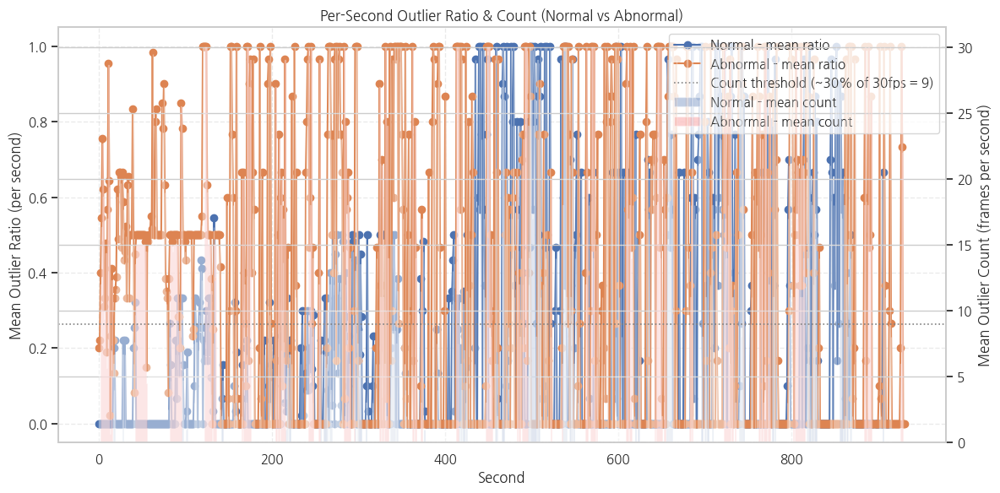

[SAVE] /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_ratio_and_count_by_group.png


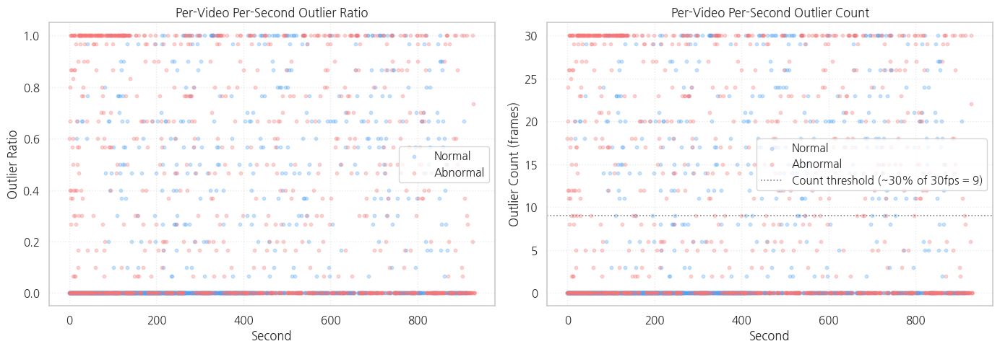

[SAVE] /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_boxplots_ratio_and_count.png
[SAVE] /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_video_per_second_outlier_stats.csv
[SAVE] /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_group_summary_with_counts.csv


In [26]:
# 27번셀 (개선판): 초별 이상비율 + 이상치 개수 + (선택) run-length 요약/시각화
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# =========================
# 경로/FPS
# =========================
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
STAT_DIR = os.path.join(BASE_DIR, "dataset/outputs/denoising_analysis_results")
PER_FRAME_CSV = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")

FPS = 30  # 실제 FPS로 설정
COUNT_THR_PER_SEC = int(round(FPS * 0.30))  # 초당 30% 기준 → 9 프레임(30fps 기준)

# =========================
# 1) per-frame 데이터 로드
# =========================
df = pd.read_csv(PER_FRAME_CSV)
need = {"video_id","frame_idx","group_label","is_outlier"}
assert need.issubset(df.columns), f"필수 컬럼 누락: {need - set(df.columns)}"

# 초 단위로 변환
df["sec"] = (df["frame_idx"] // FPS).astype(int)
df["group_name"] = df["group_label"].map({0:"Normal",1:"Abnormal"})

# (선택) run-length가 있으면 outlier 프레임에서만 값 보존
has_runlen = "outlier_runlen_block" in df.columns
if has_runlen:
    # 이상 프레임의 run-length만 유지, 그 외는 0
    df["runlen_use"] = np.where(df["is_outlier"]==1, df["outlier_runlen_block"], 0)

# =========================
# 2) (영상×초) 단위 이상비율/개수 계산
# =========================
agg_dict = {
    "is_outlier": ["mean", "sum", "size"]
}
if has_runlen:
    agg_dict["runlen_use"] = ["max"]

per_vid_sec = (
    df.groupby(["video_id","group_label","group_name","sec"], as_index=False)
      .agg(**{
          "sec_outlier_ratio": ("is_outlier","mean"),
          "sec_outlier_count": ("is_outlier","sum"),
          "sec_frames": ("is_outlier","size"),
          **({"sec_max_runlen": ("runlen_use","max")} if has_runlen else {})
      })
)

# =========================
# 3) 그룹-초 단위 요약 (평균/중앙값/표준편차/비디오 수)
# =========================
# 3) 그룹-초 단위 요약 (평균/중앙값/표준편차/비디오 수)
agg_cols = {
    "sec_outlier_ratio": ["mean", "median", "std"],
    "sec_outlier_count": ["mean", "median", "std"]
}
if has_runlen:
    agg_cols["sec_max_runlen"] = ["mean", "median", "std"]

grp = per_vid_sec.groupby(["group_label","group_name","sec"]).agg(agg_cols)

# 🔧 MultiIndex → 단일 컬럼명으로 플래튼 (안전하게 처리)
if isinstance(grp.columns, pd.MultiIndex):
    grp.columns = [
        "_".join(str(x) for x in col if (x is not None and x != ""))
        for col in grp.columns
    ]
else:
    grp.columns = [str(c) for c in grp.columns]

grp = grp.reset_index()

# 초별 해당 초에 기여한 비디오 수
n_videos = (
    per_vid_sec.groupby(["group_label","sec"])["video_id"]
    .nunique()
    .reset_index()
    .rename(columns={"video_id": "n_videos"})
)
grp = grp.merge(n_videos, on=["group_label","sec"], how="left")

# =========================
# 4) 통계 검정 (Mann–Whitney U, 영상×초 단위 분포 비교)
#    공통 sec에서만 비교
# =========================
secs_normal   = set(per_vid_sec.loc[per_vid_sec.group_label==0, "sec"])
secs_abnormal = set(per_vid_sec.loc[per_vid_sec.group_label==1, "sec"])
common_secs = sorted(list(secs_normal & secs_abnormal))

per_vid_sec_common = per_vid_sec[per_vid_sec["sec"].isin(common_secs)]
normal_vals   = per_vid_sec_common.loc[per_vid_sec_common["group_label"]==0, "sec_outlier_ratio"].values
abnormal_vals = per_vid_sec_common.loc[per_vid_sec_common["group_label"]==1, "sec_outlier_ratio"].values

if len(normal_vals)>0 and len(abnormal_vals)>0:
    u_stat, p_val = mannwhitneyu(normal_vals, abnormal_vals, alternative="two-sided")
else:
    u_stat, p_val = (np.nan, np.nan)

print(f"[Mann–Whitney U] 영상×초 단위 이상비율: U={u_stat:.3f}, p={p_val:.3e}")

# =========================
# 5) 시각화 ①: 초-평균 이상비율(Line) + 초-평균 이상치 개수(Bar)
#   - 좌측 y축: 평균 이상비율
#   - 우측 y축: 평균 이상치 '개수'(프레임 수)
#   - 수평선: 초당 30% 기준(= COUNT_THR_PER_SEC)
# =========================
save_plot1 = os.path.join(STAT_DIR, "per_second_ratio_and_count_by_group.png")

plt.figure(figsize=(12,6))
ax1 = plt.gca()

for g, name, color in [(0,"Normal","#4fa3f7"), (1,"Abnormal","#f77676")]:
    sub = grp[grp["group_label"]==g]
    ax1.plot(sub["sec"], sub["sec_outlier_ratio_mean"], marker='o', label=f"{name} - mean ratio")

ax1.set_xlabel("Second")
ax1.set_ylabel("Mean Outlier Ratio (per second)")
ax1.grid(True, linestyle="--", alpha=0.4)

# 두 번째 y축: mean count
ax2 = ax1.twinx()
width = 0.35
secs = sorted(grp["sec"].unique())
subN = grp[grp["group_label"]==0].set_index("sec").reindex(secs)
subA = grp[grp["group_label"]==1].set_index("sec").reindex(secs)

ax2.bar(np.array(secs)-width/2, subN["sec_outlier_count_mean"], width=width, alpha=0.35, label="Normal - mean count")
ax2.bar(np.array(secs)+width/2, subA["sec_outlier_count_mean"], width=width, alpha=0.35, label="Abnormal - mean count", color="#f77676")

ax2.set_ylabel("Mean Outlier Count (frames per second)")
ax2.axhline(COUNT_THR_PER_SEC, color="gray", linestyle=":", linewidth=1.2,
            label=f"Count threshold (~30% of {FPS}fps = {COUNT_THR_PER_SEC})")

# 범례 처리
lns1, labs1 = ax1.get_legend_handles_labels()
lns2, labs2 = ax2.get_legend_handles_labels()
ax1.legend(lns1+lns2, labs1+labs2, loc="upper right")

plt.title("Per-Second Outlier Ratio & Count (Normal vs Abnormal)")
plt.tight_layout()
plt.savefig(save_plot1, dpi=150)
plt.show()
print(f"[SAVE] {save_plot1}")

# =========================
# 6) 시각화 ②: 초별 Boxplot (비율 & 개수)
# =========================
save_plot2 = os.path.join(STAT_DIR, "per_second_boxplots_ratio_and_count.png")

fig, axes = plt.subplots(1, 2, figsize=(14,5), sharex=True)

# (a) 비율 박스플롯
for g, name, color in [(0,"Normal","#4fa3f7"), (1,"Abnormal","#f77676")]:
    sub = per_vid_sec[per_vid_sec["group_label"]==g]
    axes[0].scatter(sub["sec"], sub["sec_outlier_ratio"], s=10, alpha=0.3, label=name, color=color)
axes[0].set_title("Per-Video Per-Second Outlier Ratio")
axes[0].set_xlabel("Second")
axes[0].set_ylabel("Outlier Ratio")
axes[0].grid(True, linestyle=":", alpha=0.4)
axes[0].legend()

# (b) 개수 박스플롯
for g, name, color in [(0,"Normal","#4fa3f7"), (1,"Abnormal","#f77676")]:
    sub = per_vid_sec[per_vid_sec["group_label"]==g]
    axes[1].scatter(sub["sec"], sub["sec_outlier_count"], s=10, alpha=0.3, label=name, color=color)
axes[1].axhline(COUNT_THR_PER_SEC, color="gray", linestyle=":", linewidth=1.2,
                label=f"Count threshold (~30% of {FPS}fps = {COUNT_THR_PER_SEC})")
axes[1].set_title("Per-Video Per-Second Outlier Count")
axes[1].set_xlabel("Second")
axes[1].set_ylabel("Outlier Count (frames)")
axes[1].grid(True, linestyle=":", alpha=0.4)
axes[1].legend()

plt.tight_layout()
plt.savefig(save_plot2, dpi=150)
plt.show()
print(f"[SAVE] {save_plot2}")

# =========================
# 7) CSV 저장
# =========================
save_vid_sec = os.path.join(STAT_DIR, "per_video_per_second_outlier_stats.csv")
save_grp_sec = os.path.join(STAT_DIR, "per_second_group_summary_with_counts.csv")
per_vid_sec.to_csv(save_vid_sec, index=False)
grp.to_csv(save_grp_sec, index=False)
print(f"[SAVE] {save_vid_sec}")
print(f"[SAVE] {save_grp_sec}")


[LOAD] 81423 frames


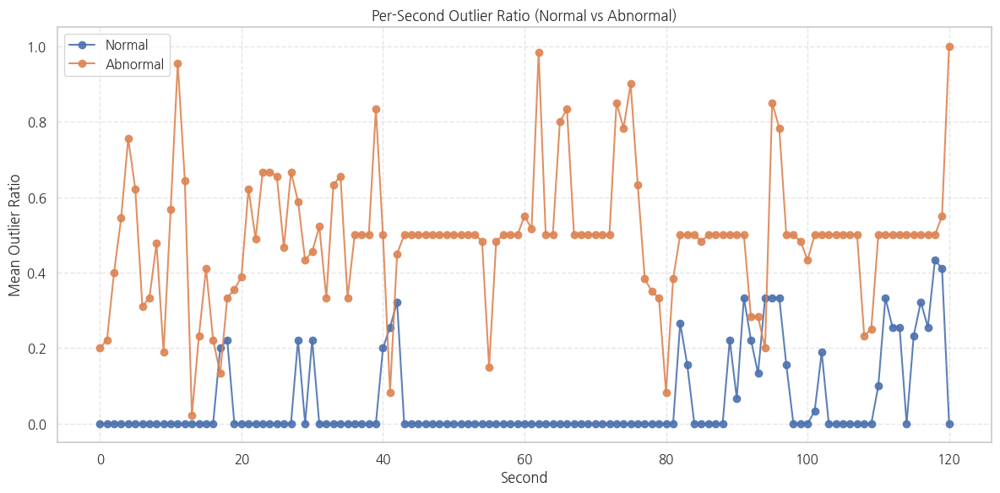

[SAVE] 비율 그래프 → /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_outlier_ratio_by_group.png


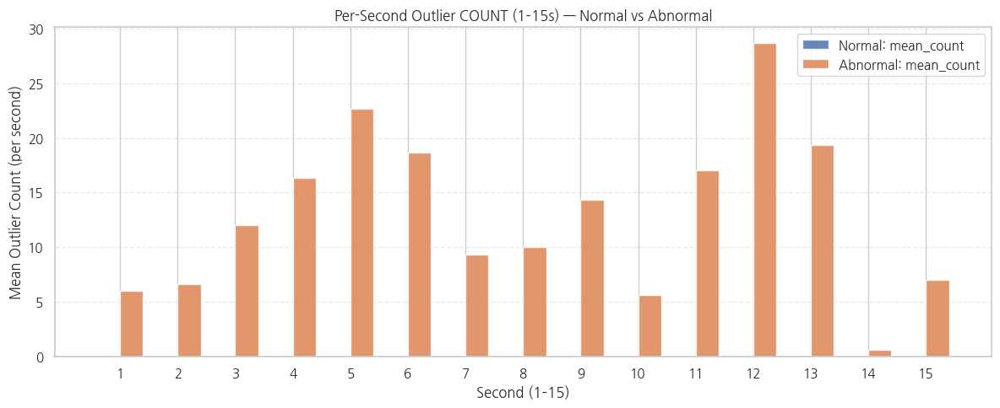

[SAVE] 개수 그래프(1~15초) → /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_outlier_count_bar_1to15.png


In [27]:
# 28번셀 (최종 통합판): 비율 그래프 + 개수 그래프(1~15초)
import os
import pandas as pd
import numpy as np
from scipy.stats import mannwhitneyu
import matplotlib.pyplot as plt

# =====================================================
# 0. 경로/FPS 설정
# =====================================================
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
STAT_DIR = os.path.join(BASE_DIR, "dataset/outputs/denoising_analysis_results")

PER_FRAME_CSV     = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")
PLOT_RATIO_PATH   = os.path.join(STAT_DIR, "per_second_outlier_ratio_by_group.png")
PLOT_COUNT_PATH   = os.path.join(STAT_DIR, "per_second_outlier_count_bar_1to15.png")

FPS = 30  # 실제 FPS

# =====================================================
# 1. per-frame CSV 로드
# =====================================================
df = pd.read_csv(PER_FRAME_CSV)
df["sec"] = (df["frame_idx"] // FPS).astype(int)
df["group_name"] = df["group_label"].map({0:"Normal", 1:"Abnormal"})

print(f"[LOAD] {len(df)} frames")

# =====================================================
# 2. (영상×초) 단위 이상비율/개수 계산
# =====================================================
per_vid_sec = (
    df.groupby(["video_id","group_label","group_name","sec"], as_index=False)
      .agg(
          mean_ratio=("is_outlier","mean"),     # 비율
          sum_outliers=("is_outlier","sum"),    # 개수
          count_frames=("is_outlier","size")
      )
)

# =====================================================
# 3. 그룹-초 단위 요약
# =====================================================
sec_group = (
    per_vid_sec.groupby(["sec","group_label"], as_index=False)
               .agg(
                   mean_ratio=("mean_ratio","mean"),
                   median_ratio=("mean_ratio","median"),
                   mean_count=("sum_outliers","mean"),   # 초별 평균 이상치 개수
                   n_videos=("video_id","nunique")
               )
)
sec_group["group_name"] = sec_group["group_label"].map({0:"Normal",1:"Abnormal"})

# =====================================================
# 4. 기존: 비율 그래프 (Normal vs Abnormal)
# =====================================================
max_sec = 120
plot_df = sec_group[sec_group["sec"] <= max_sec]

secs_axis = sorted(plot_df["sec"].unique())

normal_map_ratio   = {r.sec: r.mean_ratio for _, r in plot_df[plot_df.group_label==0].iterrows()}
abnormal_map_ratio = {r.sec: r.mean_ratio for _, r in plot_df[plot_df.group_label==1].iterrows()}

plt.figure(figsize=(12,6))
plt.plot(secs_axis,
         [normal_map_ratio.get(s, np.nan) for s in secs_axis],
         marker='o', label="Normal", alpha=0.9)
plt.plot(secs_axis,
         [abnormal_map_ratio.get(s, np.nan) for s in secs_axis],
         marker='o', label="Abnormal", alpha=0.9)

plt.title("Per-Second Outlier Ratio (Normal vs Abnormal)")
plt.xlabel("Second")
plt.ylabel("Mean Outlier Ratio")
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.savefig(PLOT_RATIO_PATH, dpi=150)
plt.show()
print(f"[SAVE] 비율 그래프 → {PLOT_RATIO_PATH}")

# =====================================================
# 5. 추가: 1~15초만 '이상치 개수' 막대그래프 Normal vs Abnormal
# =====================================================
summary_1to15 = sec_group[sec_group["sec"] < 15]  # sec=0~14 → 표시 1~15초

secs_axis2 = sorted(summary_1to15["sec"].unique())
secs_display = [s+1 for s in secs_axis2]

normal_map_count = summary_1to15[summary_1to15.group_label==0].set_index("sec")["mean_count"].to_dict()
abnormal_map_count = summary_1to15[summary_1to15.group_label==1].set_index("sec")["mean_count"].to_dict()

norm_vals = [normal_map_count.get(s, np.nan) for s in secs_axis2]
abn_vals  = [abnormal_map_count.get(s, np.nan) for s in secs_axis2]

x = np.arange(len(secs_axis2))
bar_w = 0.4

plt.figure(figsize=(12,5))
plt.bar(x - bar_w/2, norm_vals, width=bar_w, label="Normal: mean_count", alpha=0.85)
plt.bar(x + bar_w/2, abn_vals,  width=bar_w, label="Abnormal: mean_count", alpha=0.85)

plt.xticks(x, secs_display)
plt.xlabel("Second (1–15)")
plt.ylabel("Mean Outlier Count (per second)")
plt.title("Per-Second Outlier COUNT (1–15s) — Normal vs Abnormal")
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.legend(loc="upper right")
plt.tight_layout()
plt.savefig(PLOT_COUNT_PATH, dpi=150)
plt.show()

print(f"[SAVE] 개수 그래프(1~15초) → {PLOT_COUNT_PATH}")


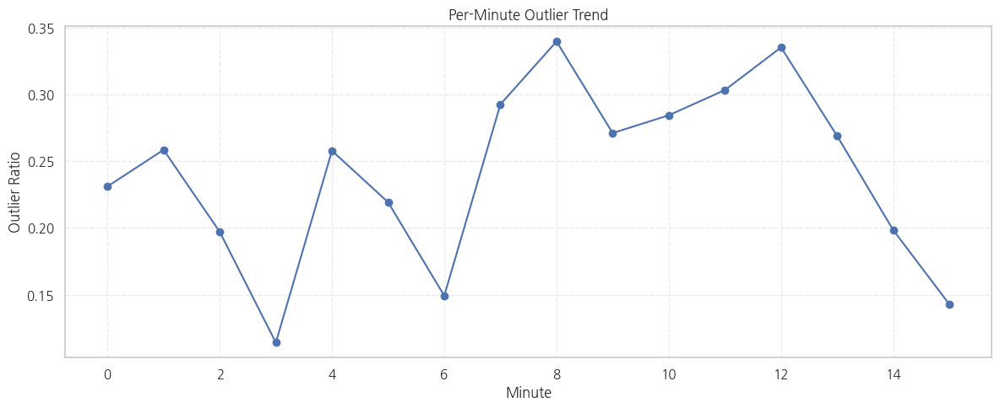

[SAVE] /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_minute_outlier_trend.png
[SAVE] /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_thresholds_youden_f1.csv
    sec  n_videos       auc  thr_youden  youden_J  tpr_at_thr_youden  \
0     0         6  0.666667    0.600000  0.333333           0.333333   
1     1         6  0.666667    0.666667  0.333333           0.333333   
2     2         6  0.833333    0.400000  0.666667           0.666667   
3     3         6  1.000000    0.366667  1.000000           1.000000   
4     4         6  1.000000    0.266667  1.000000           1.000000   
5     5         6  0.833333    0.866667  0.666667           0.666667   
6     6         6  0.833333    0.366667  0.666667           0.666667   
7     7         6  0.666667    1.000000  0.333333           0.333333   
8     8         6  0.833333    0.600000  0.666667           0.666667   
9     9         6

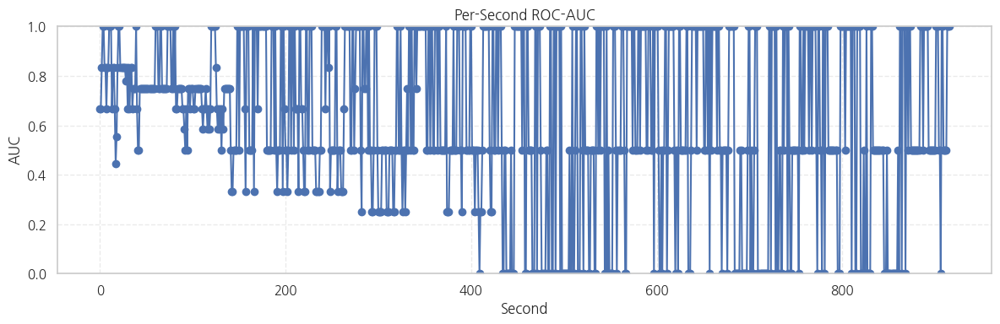

[SAVE] /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_auc_line.png


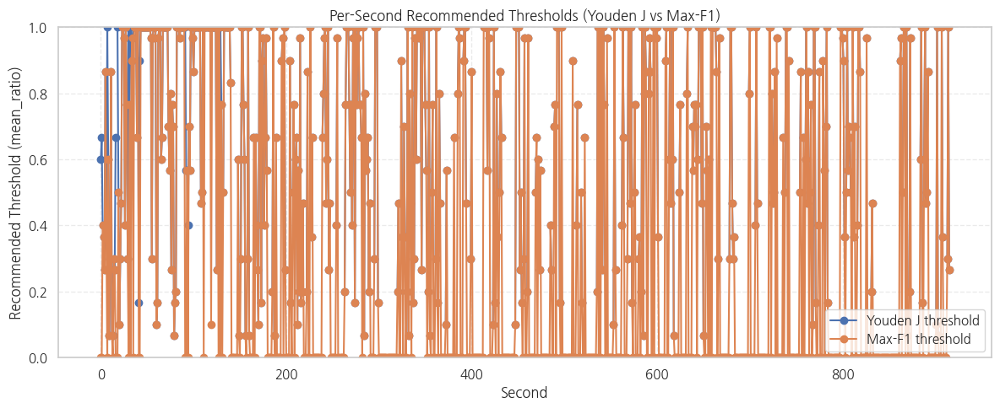

[SAVE] /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_recommended_thresholds.png

[Global threshold suggestion]
  AUC=0.665 | YoudenJ thr=0.067 | MaxF1 thr=0.000 (F1=0.580)


In [28]:
# 29번셀 =========================================
# Per-second analytics + Threshold suggestion (Youden J / Max-F1)
# - Run-length trend
# - Heatmap (sec × video, mean outlier ratio)
# - Per-minute trend
# - Per-second ROC/AUC, Youden-J threshold, Max-F1 threshold
# =========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, f1_score, precision_recall_fscore_support

# ----------------------------
# Paths / constants
# ----------------------------
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
STAT_DIR = os.path.join(BASE_DIR, "dataset/outputs/denoising_analysis_results")
PER_FRAME_CSV = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")

# 파일 로드
df = pd.read_csv(PER_FRAME_CSV)
assert {"video_id","frame_idx","group_label","is_outlier","outlier_runlen_block"}.issubset(df.columns)

# FPS 반영해 sec/min 계산 (이미 있으면 덮어써도 무방)
FPS = 30
df["sec"]    = (df["frame_idx"] // FPS).astype(int)
df["minute"] = (df["frame_idx"] // (FPS*60)).astype(int)


# =========================================================
# 3) Per-minute trend (전체 평균 이상비율)
# =========================================================
per_min = df.groupby("minute", as_index=False)["is_outlier"].mean()
plt.figure(figsize=(12,5))
plt.plot(per_min["minute"], per_min["is_outlier"], marker="o")
plt.xlabel("Minute")
plt.ylabel("Outlier Ratio")
plt.title("Per-Minute Outlier Trend")
plt.grid(True, linestyle="--", alpha=0.4)
SAVE_MIN = os.path.join(STAT_DIR, "per_minute_outlier_trend.png")
plt.tight_layout(); plt.savefig(SAVE_MIN, dpi=150); plt.show()
print(f"[SAVE] {SAVE_MIN}")
per_min.to_csv(os.path.join(STAT_DIR, "per_minute_trend.csv"), index=False)

# =========================================================
# 4) 초-단위 임계값 자동 추천
#    - 스코어: (영상×초) mean_ratio
#    - 레이블: video_id의 group_label (0=Normal, 1=Abnormal)
#    - 방법: Youden J(max{TPR-FPR}) / Max F1
#    - 산출: 초별 AUC, thr_youden, thr_f1, 해당 시점의 지표들
# =========================================================
rows = []
# sec별 (여러 영상 샘플)에서 ROC 계산 & 최적 임계 찾기
for sec, g in per_vid_sec.groupby("sec"):
    # 이 초에 참여한 영상들의 스코어/라벨
    y_score = g["mean_ratio"].to_numpy(dtype=float)
    y_true  = g["group_label"].to_numpy(dtype=int)
    # 라벨이 최소 2개여야 ROC 가능
    if len(np.unique(y_true)) < 2:
        rows.append({
            "sec": sec, "n_videos": g["video_id"].nunique(),
            "auc": np.nan, "thr_youden": np.nan, "youden_J": np.nan,
            "thr_f1": np.nan, "max_f1": np.nan,
            "tpr_at_thr_youden": np.nan, "fpr_at_thr_youden": np.nan,
            "precision_at_thr_f1": np.nan, "recall_at_thr_f1": np.nan
        })
        continue

    # ROC & AUC
    fpr, tpr, thresholds = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    # Youden J = TPR - FPR
    J = tpr - fpr
    j_idx = int(np.nanargmax(J))
    thr_youden = thresholds[j_idx]
    youden_J = float(J[j_idx])

    # Max-F1 (threshold sweep)
    # 임계 후보는 고유 스코어 + [0,1] 경계 포함
    unique_scores = np.unique(y_score)
    candidates = np.unique(np.concatenate([unique_scores, [0.0, 1.0]]))
    best_f1, best_thr, best_prec, best_rec = -1.0, np.nan, np.nan, np.nan
    for thr in candidates:
        y_pred = (y_score >= thr).astype(int)
        # precision/recall/f1
        prec, rec, f1, _ = precision_recall_fscore_support(
            y_true, y_pred, average="binary", zero_division=0
        )
        if f1 > best_f1:
            best_f1, best_thr, best_prec, best_rec = f1, float(thr), float(prec), float(rec)

    # TPR/FPR at Youden-threshold (가장 가까운 지점)
    # thresholds는 내림차순일 수 있어 가장 가까운 인덱스 다시 찾자
    j2 = np.argmin(np.abs(thresholds - thr_youden))
    tpr_y = float(tpr[j2]); fpr_y = float(fpr[j2])

    rows.append({
        "sec": sec,
        "n_videos": g["video_id"].nunique(),
        "auc": float(roc_auc),
        "thr_youden": float(thr_youden),
        "youden_J": youden_J,
        "tpr_at_thr_youden": tpr_y,
        "fpr_at_thr_youden": fpr_y,
        "thr_f1": best_thr,
        "max_f1": float(best_f1),
        "precision_at_thr_f1": best_prec,
        "recall_at_thr_f1": best_rec
    })

thr_df = pd.DataFrame(rows).sort_values("sec").reset_index(drop=True)
OUT_THR_CSV = os.path.join(STAT_DIR, "per_second_thresholds_youden_f1.csv")
thr_df.to_csv(OUT_THR_CSV, index=False)
print(f"[SAVE] {OUT_THR_CSV}")
print(thr_df.head(12))

# ---------------------------------------------------------
# 요약 플롯: 초별 AUC & 추천 임계값(Youden/F1)
# ---------------------------------------------------------
plt.figure(figsize=(12,4))
plt.plot(thr_df["sec"], thr_df["auc"], marker="o")
plt.ylim(0,1)
plt.xlabel("Second"); plt.ylabel("AUC")
plt.title("Per-Second ROC-AUC")
plt.grid(True, linestyle="--", alpha=0.4)
SAVE_AUC = os.path.join(STAT_DIR, "per_second_auc_line.png")
plt.tight_layout(); plt.savefig(SAVE_AUC, dpi=150); plt.show()
print(f"[SAVE] {SAVE_AUC}")

plt.figure(figsize=(12,5))
plt.plot(thr_df["sec"], thr_df["thr_youden"], marker="o", label="Youden J threshold")
plt.plot(thr_df["sec"], thr_df["thr_f1"], marker="o", label="Max-F1 threshold")
plt.ylim(0,1)
plt.xlabel("Second"); plt.ylabel("Recommended Threshold (mean_ratio)")
plt.title("Per-Second Recommended Thresholds (Youden J vs Max-F1)")
plt.legend(); plt.grid(True, linestyle="--", alpha=0.4)
SAVE_THR = os.path.join(STAT_DIR, "per_second_recommended_thresholds.png")
plt.tight_layout(); plt.savefig(SAVE_THR, dpi=150); plt.show()
print(f"[SAVE] {SAVE_THR}")

# ---------------------------------------------------------
# (선택) 전체 구간 Global 임계값도 참고로 제공
# ---------------------------------------------------------
# 모든 (sec,video) 샘플을 하나로 모아 global ROC/임계값 계산
scores_all = per_vid_sec["mean_ratio"].to_numpy(dtype=float)
labels_all = per_vid_sec["group_label"].to_numpy(dtype=int)
if len(np.unique(labels_all)) == 2:
    fpr_g, tpr_g, thr_g = roc_curve(labels_all, scores_all)
    auc_g = auc(fpr_g, tpr_g)
    Jg = tpr_g - fpr_g
    thr_youden_g = float(thr_g[np.argmax(Jg)])
    # max-F1
    best_f1_g, best_thr_g = -1.0, np.nan
    for t in np.unique(np.concatenate([np.unique(scores_all), [0.0, 1.0]])):
        pred = (scores_all >= t).astype(int)
        f1g = f1_score(labels_all, pred, zero_division=0)
        if f1g > best_f1_g:
            best_f1_g, best_thr_g = float(f1g), float(t)
    print("\n[Global threshold suggestion]")
    print(f"  AUC={auc_g:.3f} | YoudenJ thr={thr_youden_g:.3f} | MaxF1 thr={best_thr_g:.3f} (F1={best_f1_g:.3f})")
else:
    print("\n[Global threshold suggestion] 라벨 편중으로 계산 불가")


[LOAD] 81423 frames from /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_frame_outlier_labels.csv
[SAVE] N-초 bin 결과 → /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_group_outlier_counts_FIXED.csv
[SAVE] U-test 결과 → /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_group_utest_FIXED.csv
    seconds         U       p_value  sig
0         1  597321.5  1.221434e-66  ***
1         2  135421.5  2.568654e-42  ***
2         3   56609.5  6.667562e-32  ***
3         4   30315.0  6.244890e-27  ***
4         5   19164.5  1.382513e-22  ***
5         6   12503.5  1.015167e-20  ***
6         7    9468.5  2.062810e-17  ***
7         8    6495.0  3.206678e-18  ***
8         9    4864.5  2.158189e-17  ***
9        10    4071.5  1.936918e-15  ***
10       11    3156.0  2.673284e-15  ***
11       12    2692.0  9.118927e-14  ***
12       13    2202.0  

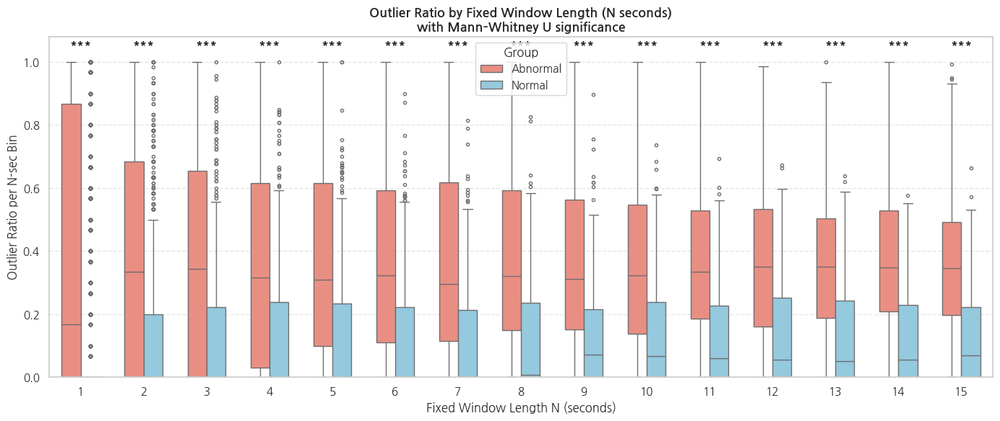

[SAVE] 박스플롯 → /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_group_boxplot_significant_FIXED.png


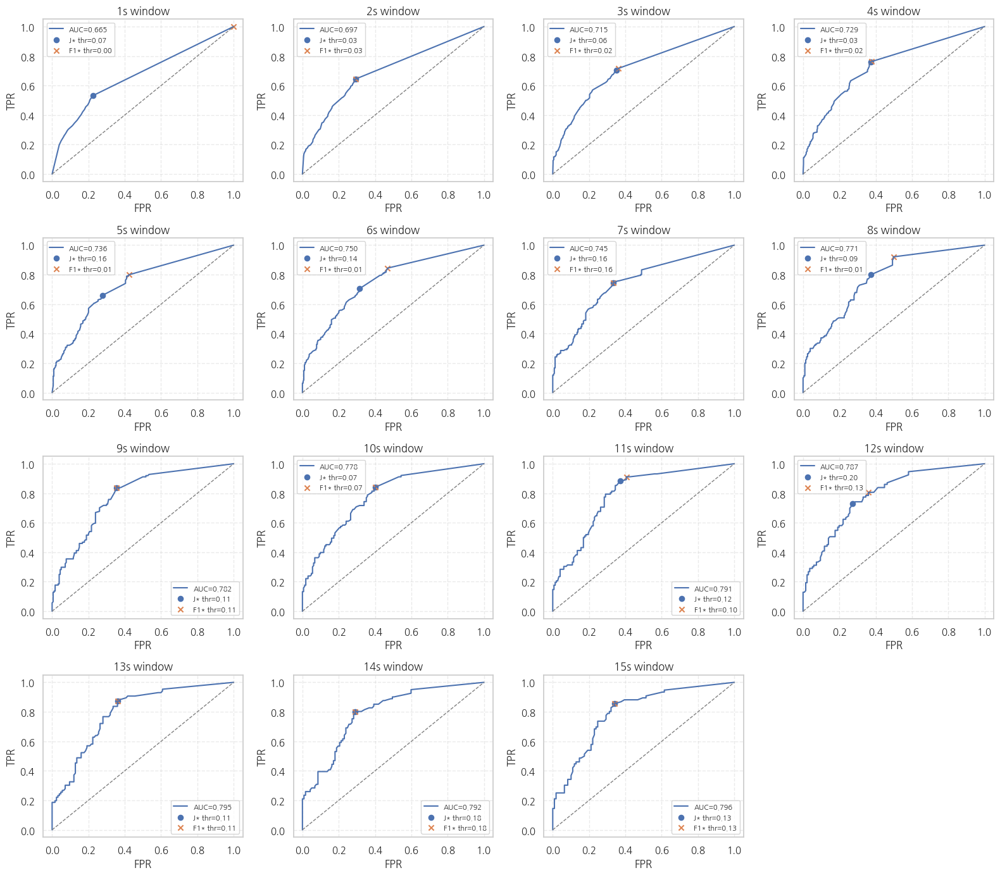

[SAVE] 초별 임계치 → /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_thresholds_FIXED.csv
[SAVE] 초별 ROC 그리드 → /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/roc_by_seconds_FIXED.png


In [29]:
# 30번셀============================================================
# N-초 "고정 bin(창 길이)" 분석 전체 스크립트
# - 입력: per_frame_outlier_labels.csv (frame_idx, is_outlier, group_label, video_id ...)
# - 출력:
#   * per_second_group_outlier_counts_FIXED.csv  (N-초 bin별 outlier_ratio)
#   * per_second_group_boxplot_significant_FIXED.png  (박스플롯 + 유의성 표시)
#   * per_second_group_utest_FIXED.csv  (초(=창길이)별 Mann-Whitney U-test 결과)
#   * (옵션) per_second_thresholds_FIXED.csv  (초별 Youden J / Max F1 임계치)
#   * (옵션) roc_by_seconds_FIXED.png        (초별 ROC 곡선 그리드)
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
from sklearn.metrics import roc_curve, auc, f1_score, precision_recall_fscore_support

# ----------------------------
# 0) 경로/상수
# ----------------------------
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
STAT_DIR = os.path.join(BASE_DIR, "dataset/outputs/denoising_analysis_results")
os.makedirs(STAT_DIR, exist_ok=True)

FRAME_CSV = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")

OUT_FIXED_CSV   = os.path.join(STAT_DIR, "per_second_group_outlier_counts_FIXED.csv")
OUT_PLOT_PNG    = os.path.join(STAT_DIR, "per_second_group_boxplot_significant_FIXED.png")
OUT_UTEST_CSV   = os.path.join(STAT_DIR, "per_second_group_utest_FIXED.csv")

# (옵션) ROC/임계치 추천 산출물
DO_ROC_AND_THRESH = True
OUT_THRESH_CSV    = os.path.join(STAT_DIR, "per_second_thresholds_FIXED.csv")
OUT_ROC_GRID_PNG  = os.path.join(STAT_DIR, "roc_by_seconds_FIXED.png")

FPS = 30
SECONDS_SET = list(range(1, 16))   # 창 길이 1~15초 (필요시 수정)

# ----------------------------
# 1) per-frame 라벨 로드
# ----------------------------
df = pd.read_csv(FRAME_CSV)
print(f"[LOAD] {len(df)} frames from {FRAME_CSV}")

# 컬럼 체크
need_cols = ["video_id","frame_idx","group_label","is_outlier"]
miss = [c for c in need_cols if c not in df.columns]
if miss:
    raise ValueError(f"필수 컬럼 누락: {miss}")

df["group_name"] = df["group_label"].map({0: "Normal", 1: "Abnormal"})

# ----------------------------
# 2) N-초 '고정 bin' 생성 (비중첩, 시작 0초 기준)
#    seconds_group = N 이면, bin_id = floor(frame_idx / (N*FPS))
#    → 각 비디오에 대해 창 길이가 N초인 고정 길이 구간들을 생성
# ----------------------------
records = []
for N in SECONDS_SET:
    bin_len = N * FPS
    df[f"bin_{N}s_id"] = (df["frame_idx"] // bin_len)

    grouped = (
        df.groupby(["video_id", "group_label", "group_name", f"bin_{N}s_id"], dropna=False)
          .agg(outlier_count=("is_outlier", "sum"),
               total_frames=("is_outlier", "count"))
          .reset_index()
    )
    # 빈 마지막 bin(프레임 수 0)은 보통 없음. 혹시 모를 0 나눗셈 방지:
    grouped = grouped[grouped["total_frames"] > 0].copy()
    grouped["outlier_ratio"] = grouped["outlier_count"] / grouped["total_frames"]
    grouped["seconds_group"] = N

    # 보관
    records.append(grouped)

all_fixed = pd.concat(records, ignore_index=True)
all_fixed.to_csv(OUT_FIXED_CSV, index=False)
print(f"[SAVE] N-초 bin 결과 → {OUT_FIXED_CSV}")

# ----------------------------
# 3) 초(=창 길이)별 유의성 검정 (Mann–Whitney U)
# ----------------------------
u_rows = []
for N in SECONDS_SET:
    sub = all_fixed[all_fixed["seconds_group"] == N]
    n = sub.loc[sub["group_label"] == 0, "outlier_ratio"]
    a = sub.loc[sub["group_label"] == 1, "outlier_ratio"]
    if len(n) > 0 and len(a) > 0:
        stat, p = mannwhitneyu(n, a, alternative="two-sided")
    else:
        stat, p = (np.nan, np.nan)
    u_rows.append({"seconds": N, "U": stat, "p_value": p})

utest_df = pd.DataFrame(u_rows)
def sig_label(p):
    if pd.isna(p): return ""
    if p < 0.001: return "***"
    if p < 0.01:  return "**"
    if p < 0.05:  return "*"
    return ""
utest_df["sig"] = utest_df["p_value"].apply(sig_label)
utest_df.to_csv(OUT_UTEST_CSV, index=False)
print(f"[SAVE] U-test 결과 → {OUT_UTEST_CSV}")
print(utest_df)

# ----------------------------
# 4) 박스플롯 + 유의성 별표 표시
# ----------------------------
plt.figure(figsize=(14, 6))
sns.boxplot(
    x="seconds_group", y="outlier_ratio", hue="group_name",
    data=all_fixed,
    palette={"Normal":"skyblue","Abnormal":"salmon"},
    width=0.6, fliersize=3
)
plt.title("Outlier Ratio by Fixed Window Length (N seconds)\nwith Mann–Whitney U significance", fontsize=13, weight="bold")
plt.xlabel("Fixed Window Length N (seconds)")
plt.ylabel("Outlier Ratio per N-sec Bin")
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.legend(title="Group")

# 별표 y 위치 계산
y_max = np.nanmax(all_fixed["outlier_ratio"].values)
for _, row in utest_df.iterrows():
    if row["sig"]:
        plt.text(
            row["seconds"]-1, y_max + 0.04, row["sig"],
            ha="center", va="bottom", fontsize=12, fontweight="bold"
        )
plt.ylim(0, y_max + 0.08)
plt.tight_layout()
plt.savefig(OUT_PLOT_PNG, dpi=150)
plt.show()
print(f"[SAVE] 박스플롯 → {OUT_PLOT_PNG}")

# ----------------------------
# 5) 초별 ROC & 임계치 (Youden J, Max F1)
#     - 점수: outlier_ratio
#     - 타겟: group_label (0=Normal, 1=Abnormal)
#     - bin 단위로 평가
# ----------------------------
if DO_ROC_AND_THRESH:
    from math import isfinite

    rows = []
    # 시각화용 서브플롯 배치
    n_cols = 4
    n_rows = int(np.ceil(len(SECONDS_SET)/n_cols))
    plt.figure(figsize=(4*n_cols, 3.5*n_rows))

    for i, N in enumerate(SECONDS_SET, start=1):
        sub = all_fixed[all_fixed["seconds_group"] == N].dropna(subset=["outlier_ratio","group_label"])
        if sub["group_label"].nunique() < 2:
            rows.append({"seconds": N, "n_bins": len(sub), "auc": np.nan,
                         "thr_youden": np.nan, "youden_J": np.nan,
                         "thr_f1": np.nan, "max_f1": np.nan})
            continue

        y = sub["group_label"].astype(int).values
        s = sub["outlier_ratio"].astype(float).values

        fpr, tpr, thr = roc_curve(y, s)
        roc_auc = auc(fpr, tpr)

        # Youden J = TPR - FPR, thr는 roc_curve가 "양성판정 기준값" 의미 (score >= thr → 1)
        J = tpr - fpr
        if len(J) > 0:
            j_idx = int(np.nanargmax(J))
            thr_youden   = float(thr[j_idx])
            youden_J_val = float(J[j_idx])
        else:
            thr_youden   = np.nan
            youden_J_val = np.nan

        # Max F1: 후보 임계치(thr)들에 대해 F1 평가
        best_f1, best_thr = -1.0, np.nan
        for t in np.unique(thr):
            y_pred = (s >= t).astype(int)
            _, _, f1s, _ = precision_recall_fscore_support(y, y_pred, average="binary", zero_division=0)
            if f1s > best_f1:
                best_f1, best_thr = f1s, float(t)

        rows.append({
            "seconds": N,
            "n_bins": len(sub),
            "auc": float(roc_auc),
            "thr_youden": thr_youden,
            "youden_J": youden_J_val,
            "thr_f1": best_thr,
            "max_f1": float(best_f1)
        })

        # ---- ROC 서브플롯 ----
        plt.subplot(n_rows, n_cols, i)
        plt.plot(fpr, tpr, label=f"AUC={roc_auc:.3f}")
        plt.plot([0,1],[0,1],"--", linewidth=1, color="gray")
        # Youden 포인트 표시
        if isfinite(thr_youden):
            # thr_youden 위치 재탐색
            j_idx2 = (np.abs(thr - thr_youden)).argmin()
            plt.scatter([fpr[j_idx2]], [tpr[j_idx2]], s=35, label=f"J* thr={thr_youden:.2f}")
        # Max F1 포인트 표시
        if isfinite(best_thr):
            k = (np.abs(thr - best_thr)).argmin()
            plt.scatter([fpr[k]], [tpr[k]], s=35, marker="x", label=f"F1* thr={best_thr:.2f}")

        plt.title(f"{N}s window")
        plt.xlabel("FPR")
        plt.ylabel("TPR")
        plt.legend(fontsize=8)
        plt.grid(True, linestyle="--", alpha=0.4)

    thr_df = pd.DataFrame(rows)
    thr_df.to_csv(OUT_THRESH_CSV, index=False)
    plt.tight_layout()
    plt.savefig(OUT_ROC_GRID_PNG, dpi=150)
    plt.show()

    print(f"[SAVE] 초별 임계치 → {OUT_THRESH_CSV}")
    print(f"[SAVE] 초별 ROC 그리드 → {OUT_ROC_GRID_PNG}")


[SAVE] fixed-bin table -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_group_outlier_counts_FIXED.csv
[SAVE] per-second stats -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_group_stats_FIXED.csv
[SAVE] U-test -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_group_utest_FIXED.csv


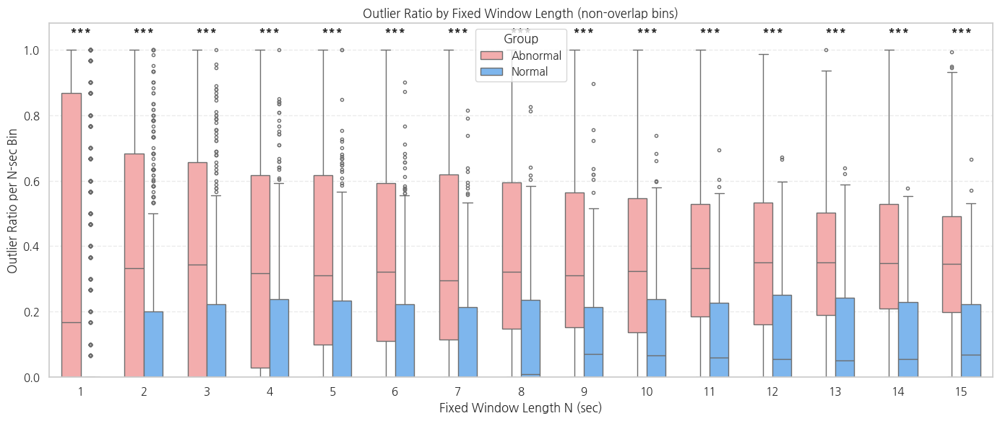

[SAVE] boxplot -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_group_boxplot_significant_FIXED.png


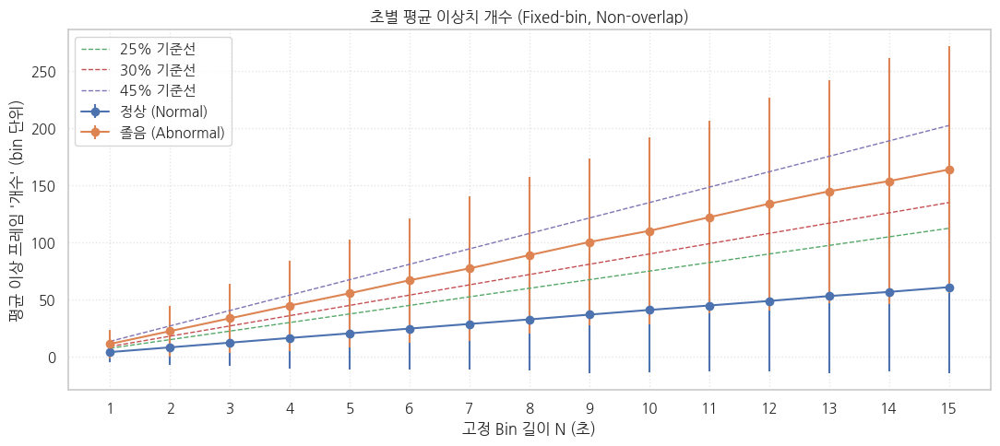

[SAVE] mean-count line -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_mean_counts_FIXED.png


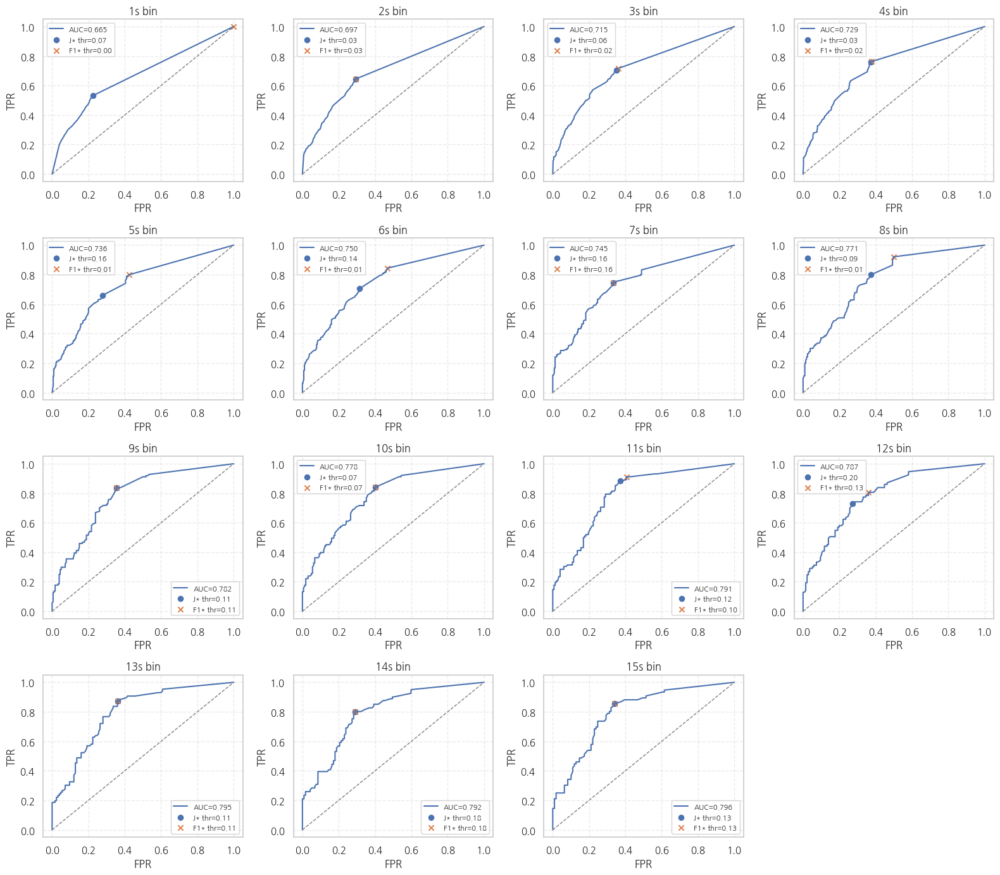

[SAVE] thresholds -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_thresholds_FIXED.csv
[SAVE] ROC grid  -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/roc_by_seconds_FIXED.png


In [30]:
# 31번셀 Fixed-bin (non-overlap) 분석: 비율 + "초별 이상 프레임 개수"까지
# Outputs:
#  - per_second_group_outlier_counts_FIXED.csv              (bin 단위 원시)
#  - per_second_group_stats_FIXED.csv                       (초별 집계: mean/std 개수/비율)
#  - per_second_group_boxplot_significant_FIXED.png         (비율 박스플롯 + 유의성)
#  - per_second_mean_counts_FIXED.png                       (초별 평균 이상 프레임 "개수" + 기준선)
#  - per_second_thresholds_FIXED.csv, roc_by_seconds_FIXED.png (선택: ROC/임계치)

import os, numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
from scipy.stats import mannwhitneyu
from sklearn.metrics import roc_curve, auc, precision_recall_fscore_support

# ----------------------------
# paths & const
# ----------------------------
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
STAT_DIR = os.path.join(BASE_DIR, "dataset/outputs/denoising_analysis_results")
os.makedirs(STAT_DIR, exist_ok=True)

FRAME_CSV      = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")
OUT_FIXED_CSV  = os.path.join(STAT_DIR, "per_second_group_outlier_counts_FIXED.csv")
OUT_STATS_CSV  = os.path.join(STAT_DIR, "per_second_group_stats_FIXED.csv")
OUT_UTEST_CSV  = os.path.join(STAT_DIR, "per_second_group_utest_FIXED.csv")
OUT_BOX_PNG    = os.path.join(STAT_DIR, "per_second_group_boxplot_significant_FIXED.png")
OUT_MEAN_CNT   = os.path.join(STAT_DIR, "per_second_mean_counts_FIXED.png")
OUT_THRESH_CSV = os.path.join(STAT_DIR, "per_second_thresholds_FIXED.csv")
OUT_ROC_GRID   = os.path.join(STAT_DIR, "roc_by_seconds_FIXED.png")

FPS = 30
SECONDS_SET = list(range(1, 16))   # N초 고정 bin 길이
RATIO_LINES = [0.25, 0.30, 0.45]   # 기준선(비율) → 개수 기준선에 반영
DO_THRESH   = True                 # 초별 ROC/임계치 산출

# ----------------------------
# 1) load per-frame labels
# ----------------------------
df = pd.read_csv(FRAME_CSV)
need = {"video_id","frame_idx","group_label","is_outlier"}
missing = need - set(df.columns)
if missing:
    raise ValueError(f"필수 컬럼 누락: {missing}")
df["group_name"] = df["group_label"].map({0:"Normal", 1:"Abnormal"})

# ----------------------------
# 2) build non-overlap fixed bins per N (bin_id = floor(frame_idx / (N*FPS)))
# ----------------------------
records = []
for N in SECONDS_SET:
    bin_len = N * FPS
    df[f"bin_{N}s_id"] = (df["frame_idx"] // bin_len)
    g = (
        df.groupby(["video_id","group_label","group_name",f"bin_{N}s_id"], dropna=False)
          .agg(outlier_count=("is_outlier","sum"),
               total_frames=("is_outlier","count"))
          .reset_index()
    )
    g = g[g["total_frames"] > 0].copy()
    g["outlier_ratio"]  = g["outlier_count"] / g["total_frames"]
    g["seconds_group"]  = N
    records.append(g)

all_fixed = pd.concat(records, ignore_index=True)
all_fixed.to_csv(OUT_FIXED_CSV, index=False, encoding="utf-8-sig")
print(f"[SAVE] fixed-bin table -> {OUT_FIXED_CSV}")

# ----------------------------
# 3) 초별 집계(mean/std) – '개수'와 '비율' 둘 다
# ----------------------------
stats = (
    all_fixed.groupby(["seconds_group","group_name"], as_index=False)
             .agg(mean_outlier_cnt=("outlier_count","mean"),
                  std_outlier_cnt =("outlier_count","std"),
                  mean_outlier_ratio=("outlier_ratio","mean"),
                  std_outlier_ratio =("outlier_ratio","std"),
                  n_bins=("outlier_count","size"))
)
stats.to_csv(OUT_STATS_CSV, index=False, encoding="utf-8-sig")
print(f"[SAVE] per-second stats -> {OUT_STATS_CSV}")

# ----------------------------
# 4) Mann–Whitney U per N (비율 분포 비교)
# ----------------------------
rows = []
for N in SECONDS_SET:
    sub = all_fixed[all_fixed["seconds_group"] == N]
    n = sub.loc[sub["group_label"]==0, "outlier_ratio"].values
    a = sub.loc[sub["group_label"]==1, "outlier_ratio"].values
    if len(n) > 0 and len(a) > 0:
        U, p = mannwhitneyu(n, a, alternative="two-sided")
    else:
        U, p = (np.nan, np.nan)
    rows.append({"seconds": N, "U": U, "p_value": p})
utest = pd.DataFrame(rows)
def sig(p):
    if pd.isna(p): return ""
    if p < 0.001: return "***"
    if p < 0.01:  return "**"
    if p < 0.05:  return "*"
    return ""
utest["sig"] = utest["p_value"].apply(sig)
utest.to_csv(OUT_UTEST_CSV, index=False, encoding="utf-8-sig")
print(f"[SAVE] U-test -> {OUT_UTEST_CSV}")

# ----------------------------
# 5) Boxplot (비율) + 유의성
# ----------------------------
plt.figure(figsize=(14,6))
sns.boxplot(
    x="seconds_group", y="outlier_ratio", hue="group_name",
    data=all_fixed, width=0.6, fliersize=3,
    palette={"Normal":"#6CB6FF","Abnormal":"#FFA1A1"}
)
plt.title("Outlier Ratio by Fixed Window Length (non-overlap bins)")
plt.xlabel("Fixed Window Length N (sec)")
plt.ylabel("Outlier Ratio per N-sec Bin")
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.legend(title="Group")
ymax = np.nanmax(all_fixed["outlier_ratio"].values)
for _, r in utest.iterrows():
    if r["sig"]:
        plt.text(r["seconds"]-1, ymax + 0.04, r["sig"],
                 ha="center", va="bottom", fontsize=12, fontweight="bold")
plt.ylim(0, ymax + 0.08)
plt.tight_layout(); plt.savefig(OUT_BOX_PNG, dpi=150); plt.show()
print(f"[SAVE] boxplot -> {OUT_BOX_PNG}")

# ----------------------------
# 6) 초별 '평균 이상 프레임 개수' 라인 + 기준선 (N*FPS*비율)
#    (누적 X, bin 길이 N초 기준의 개수임)
# ----------------------------
sec_vals = sorted(stats["seconds_group"].unique())
normal = stats[stats["group_name"]=="Normal"].set_index("seconds_group").reindex(sec_vals)
abnorm = stats[stats["group_name"]=="Abnormal"].set_index("seconds_group").reindex(sec_vals)

plt.figure(figsize=(11,5))
plt.errorbar(sec_vals, normal["mean_outlier_cnt"], yerr=normal["std_outlier_cnt"],
             fmt='-o', label="정상 (Normal)")
plt.errorbar(sec_vals, abnorm["mean_outlier_cnt"], yerr=abnorm["std_outlier_cnt"],
             fmt='-o', label="졸음 (Abnormal)")

# 기준선: 각 N초 bin에서 필요한 이상 프레임 "개수" = N*FPS*비율
for r in RATIO_LINES:
    thr_counts = [N * FPS * r for N in sec_vals]
    plt.plot(sec_vals, thr_counts, '--', linewidth=1, label=f"{int(r*100)}% 기준선")

plt.title("초별 평균 이상치 개수 (Fixed-bin, Non-overlap)")
plt.xlabel("고정 Bin 길이 N (초)")
plt.ylabel("평균 이상 프레임 '개수' (bin 단위)")
plt.xticks(sec_vals)
plt.grid(True, linestyle=':', alpha=0.5)
plt.legend()
plt.tight_layout(); plt.savefig(OUT_MEAN_CNT, dpi=150); plt.show()
print(f"[SAVE] mean-count line -> {OUT_MEAN_CNT}")

# ----------------------------
# 7) (옵션) 초별 ROC & 임계치(Youden/Max-F1) — bin 단위
# ----------------------------
if DO_THRESH:
    rows = []
    n_cols = 4
    n_rows = int(np.ceil(len(SECONDS_SET)/n_cols))
    plt.figure(figsize=(4*n_cols, 3.5*n_rows))
    for i, N in enumerate(SECONDS_SET, start=1):
        sub = all_fixed[all_fixed["seconds_group"]==N].dropna(subset=["outlier_ratio","group_label"])
        if sub["group_label"].nunique() < 2:
            rows.append({"seconds": N, "n_bins": len(sub), "auc": np.nan,
                         "thr_youden": np.nan, "youden_J": np.nan,
                         "thr_f1": np.nan, "max_f1": np.nan})
            continue
        y = sub["group_label"].astype(int).values
        s = sub["outlier_ratio"].astype(float).values
        fpr, tpr, thr = roc_curve(y, s)
        roc_auc = auc(fpr, tpr)
        J = tpr - fpr
        if len(J) > 0:
            j_idx = int(np.nanargmax(J))
            thr_youden = float(thr[j_idx]); youden_J = float(J[j_idx])
        else:
            thr_youden = youden_J = np.nan
        best_f1, best_thr = -1.0, np.nan
        for t in np.unique(thr):
            y_pred = (s >= t).astype(int)
            _, _, f1s, _ = precision_recall_fscore_support(y, y_pred, average="binary", zero_division=0)
            if f1s > best_f1:
                best_f1, best_thr = f1s, float(t)
        rows.append({"seconds": N, "n_bins": len(sub), "auc": float(roc_auc),
                     "thr_youden": thr_youden, "youden_J": youden_J,
                     "thr_f1": best_thr, "max_f1": float(best_f1)})
        ax = plt.subplot(n_rows, n_cols, i)
        ax.plot(fpr, tpr, label=f"AUC={roc_auc:.3f}")
        ax.plot([0,1],[0,1],"--", linewidth=1, color="gray")
        if np.isfinite(thr_youden):
            jj = (np.abs(thr - thr_youden)).argmin()
            ax.scatter([fpr[jj]],[tpr[jj]], s=35, label=f"J* thr={thr_youden:.2f}")
        if np.isfinite(best_thr):
            kk = (np.abs(thr - best_thr)).argmin()
            ax.scatter([fpr[kk]],[tpr[kk]], s=35, marker="x", label=f"F1* thr={best_thr:.2f}")
        ax.set_title(f"{N}s bin"); ax.set_xlabel("FPR"); ax.set_ylabel("TPR")
        ax.legend(fontsize=8); ax.grid(True, linestyle="--", alpha=0.4)
    thr_df = pd.DataFrame(rows)
    thr_df.to_csv(OUT_THRESH_CSV, index=False, encoding="utf-8-sig")
    plt.tight_layout(); plt.savefig(OUT_ROC_GRID, dpi=150); plt.show()
    print(f"[SAVE] thresholds -> {OUT_THRESH_CSV}")
    print(f"[SAVE] ROC grid  -> {OUT_ROC_GRID}")


In [31]:
# 32번셀
import os, numpy as np, pandas as pd

BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
STAT_DIR = os.path.join(BASE_DIR, "dataset/outputs/denoising_analysis_results")
CSV_IN  = os.path.join(STAT_DIR, "per_second_thresholds_youden_f1.csv")
CSV_OUT = os.path.join(STAT_DIR, "per_second_thresholds_final.csv")

thr_global_youden = 0.30  # 위 출력
min_videos = 4
min_auc = 0.60
min_J = 0.20

df = pd.read_csv(CSV_IN)
# 유효성 마스크
valid = (
    (df["n_videos"] >= min_videos) &
    (df["auc"] >= min_auc) &
    (df["youden_J"] >= min_J) &
    np.isfinite(df["thr_youden"])
)

# Fallback: invalid → NaN으로 두고 나중에 보간
df["thr_youden_use"] = np.where(valid, df["thr_youden"], np.nan)
df["thr_f1_use"]     = np.where(np.isfinite(df["thr_f1"]), df["thr_f1"], np.nan)

# 앞뒤 보간 + 가장자리 글로벌 임계로 채우기
for col in ["thr_youden_use","thr_f1_use"]:
    s = df[col].copy()
    # 인접값으로 보간
    s = s.interpolate(method="nearest", limit_direction="both")
    # 여전히 NaN이면 글로벌 임계로
    s = s.fillna(thr_global_youden)
    # 0~1 범위 클램프
    s = s.clip(0,1)
    df[col+"_interp"] = s

# 3초 이동중앙값 스무딩
def medfilt(arr, k=3):
    import numpy as np
    from collections import deque
    k = max(1, k|1)  # 홀수
    half = k//2
    out = np.empty_like(arr, dtype=float)
    buf = deque()
    for i, v in enumerate(arr):
        buf.append(v)
        if len(buf) > k: buf.popleft()
        window = list(buf)
        # 앞부분 패딩
        while len(window) < k: window.insert(0, window[0])
        out[i] = np.median(window)
    return out

df["thr_youden_smooth"] = medfilt(df["thr_youden_use_interp"].values, k=5)
df["thr_f1_smooth"]     = medfilt(df["thr_f1_use_interp"].values, k=5)

# 최종 권장 임계
# - 실시간: youden_smooth
# - 경보확정: f1_smooth
df["thr_realtime"] = df["thr_youden_smooth"]
df["thr_alarm"]    = df["thr_f1_smooth"]

# 요약 통계 출력
print("[Final thresholds]")
print(" realtime  :", np.nanmedian(df["thr_realtime"]))
print(" alarm     :", np.nanmedian(df["thr_alarm"]))
print(" fallback(%) :", 100* (1 - np.isfinite(df['thr_youden']).mean()) , "had inf youden initially")

df.to_csv(CSV_OUT, index=False)
print("[SAVE]", CSV_OUT)


[Final thresholds]
 realtime  : 0.3
 alarm     : 0.1666666666666666
 fallback(%) : 47.3175965665236 had inf youden initially
[SAVE] /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_second_thresholds_final.csv


In [32]:
# 33번셀 (per-second, non-cumulative)
import os
import numpy as np
import pandas as pd

# ----------------------------
# 설정
# ----------------------------
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
OUT_DIR  = os.path.join(BASE_DIR, "dataset/outputs")
STAT_DIR = os.path.join(OUT_DIR, "denoising_analysis_results")
os.makedirs(STAT_DIR, exist_ok=True)

PER_FRAME_PATH = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")

# 파일명도 per-second임을 반영 (혼동 방지)
RESULT_PATH_LONGFORM = os.path.join(
    STAT_DIR,
    "per_video_outlier_by_seconds_persec.csv"  # 비디오×초별 '해당 초' 이상치
)
RESULT_PATH_GROUPED = os.path.join(
    STAT_DIR,
    "per_seconds_group_stats_persec.csv"       # 초×그룹 요약 (per-second)
)

FPS = 30
SECONDS_RANGE = range(1, 16)  # 1초~15초

# ----------------------------
# 1. per-frame 라벨 로드
# ----------------------------
df_frame = pd.read_csv(PER_FRAME_PATH)

# 필요한 컬럼 체크
need_cols = ["video_id", "frame_idx", "group_label", "is_outlier"]
missing = [c for c in need_cols if c not in df_frame.columns]
if missing:
    raise ValueError(f"per_frame_outlier_labels.csv에 필요한 컬럼이 없음: {missing}")

# 사람 읽기용 라벨
df_frame["group_name"] = df_frame["group_label"].map({0: "Normal", 1: "Abnormal"})

# ----------------------------
# 2. 비디오별/초별 '그 초'의 이상치 수 계산 (고정 bin, 비중첩)
# ----------------------------
rows = []
for vid, sub in df_frame.groupby("video_id"):
    sub_sorted = sub.sort_values("frame_idx")
    grp_label  = int(sub_sorted["group_label"].iloc[0])
    grp_name   = sub_sorted["group_name"].iloc[0]

    for sec in SECONDS_RANGE:
        start_frame_inclusive = (sec - 1) * FPS
        end_frame_exclusive   = sec * FPS  # 해당 초의 끝(미포함)

        mask = (sub_sorted["frame_idx"] >= start_frame_inclusive) & \
               (sub_sorted["frame_idx"] <  end_frame_exclusive)

        frames_in_sec  = int(mask.sum())
        outliers_in_sec = int((sub_sorted.loc[mask, "is_outlier"] == 1).sum())

        # NaN 방지: 프레임이 없으면 비율 0으로 처리
        ratio_in_sec = (outliers_in_sec / frames_in_sec) if frames_in_sec > 0 else 0.0

        rows.append({
            "video_id": vid,
            "group_label": grp_label,             # 0/1
            "group_name": grp_name,               # Normal / Abnormal
            "seconds_bin": sec,                   # 1,2,...,15 (해당 초 bin)
            "frames_in_sec": frames_in_sec,       # 그 초의 프레임 수
            "outlier_count_in_sec": outliers_in_sec,
            "outlier_ratio_in_sec": ratio_in_sec,
            "bin_start_frame": start_frame_inclusive,
            "bin_end_frame_exclusive": end_frame_exclusive,
        })

per_video_persec = pd.DataFrame(rows)

# 저장 1: 비디오×초별 상세 (per-second)
per_video_persec.to_csv(RESULT_PATH_LONGFORM, index=False)
print(f"[SAVE] per_video_persec -> {RESULT_PATH_LONGFORM}")
print(per_video_persec.head(10))

# ----------------------------
# 3. 보기 좋은 groupby 요약 (초 × 그룹, per-second)
#    seconds_bin, group_name 별 평균/표준편차/중앙값/n 비디오
# ----------------------------
group_stats = (
    per_video_persec
    .groupby(["seconds_bin", "group_name"])
    .agg(
        mean_outlier_cnt    = ("outlier_count_in_sec", "mean"),
        std_outlier_cnt     = ("outlier_count_in_sec", "std"),
        median_outlier_cnt  = ("outlier_count_in_sec", "median"),
        n_videos            = ("video_id", "nunique"),
        mean_outlier_ratio  = ("outlier_ratio_in_sec", "mean"),
        median_outlier_ratio= ("outlier_ratio_in_sec", "median"),
        mean_frames_in_sec  = ("frames_in_sec", "mean"),
    )
    .reset_index()
)

# Normal 먼저, Abnormal 그다음으로 정렬 (선택)
group_order = {"Normal": 0, "Abnormal": 1}
group_stats["group_order"] = group_stats["group_name"].map(group_order)
group_stats = group_stats.sort_values(["seconds_bin", "group_order"]).drop(columns=["group_order"])

# 저장 2: 초×그룹 요약 (per-second)
group_stats.to_csv(RESULT_PATH_GROUPED, index=False)
print(f"[SAVE] group_stats(per-second) -> {RESULT_PATH_GROUPED}")
print(group_stats.head(12))

# ----------------------------
# 4. 해석 가이드
# ----------------------------
print("\n[해석 가이드]")
print("- 이제 모든 값은 '누적'이 아니라 '해당 초 bin'의 값이다.")
print("  예: seconds_bin=3 → 2~3초 구간 [(3-1)*FPS, 3*FPS) 의 이상치 집계")
print("- mean_outlier_cnt/ratio는 초 단위로 Normal vs Abnormal을 직접 비교할 수 있어")
print("- 특정 초에서 두 그룹 차이가 크게 벌어지면, 그 초가 신호 분리력이 큰 구간")


[SAVE] per_video_persec -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_video_outlier_by_seconds_persec.csv
     video_id  group_label group_name  seconds_bin  frames_in_sec  \
0  test_0.csv            1   Abnormal            1             30   
1  test_0.csv            1   Abnormal            2             30   
2  test_0.csv            1   Abnormal            3             30   
3  test_0.csv            1   Abnormal            4             30   
4  test_0.csv            1   Abnormal            5             30   
5  test_0.csv            1   Abnormal            6             30   
6  test_0.csv            1   Abnormal            7             30   
7  test_0.csv            1   Abnormal            8             30   
8  test_0.csv            1   Abnormal            9             30   
9  test_0.csv            1   Abnormal           10             30   

   outlier_count_in_sec  outlier_ratio_in_sec  bin_start_frame  \
0              

#블럭 라벨링 이상치 결정

In [33]:
# 34번셀
# 29 (revised, 위치 정리 완료 버전)
import os, warnings, json, joblib
import numpy as np
import pandas as pd
import tensorflow as tf
from pathlib import Path

warnings.filterwarnings("ignore")
np.set_printoptions(suppress=True)
tf.keras.utils.set_random_seed(42)
tf.config.experimental.enable_op_determinism()

# =========================
# 0) 경로 / 상수
# =========================
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
OUT_DIR  = os.path.join(BASE_DIR, "dataset/outputs")
STAT_DIR = os.path.join(OUT_DIR, "denoising_analysis_results")
os.makedirs(STAT_DIR, exist_ok=True)

STAT_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results"
MODEL_PATH = os.path.join(STAT_DIR, "best_dae.keras")
META_PATH  = os.path.join(STAT_DIR, "best_dae.meta.json")

RAW_CSV_INPUT_DIR = os.path.join(OUT_DIR)  # train_*.csv, test_*.csv 위치
TRAIN_CSVS = [os.path.join(RAW_CSV_INPUT_DIR, f"train_{i}.csv") for i in range(3)]
TEST_CSVS  = [os.path.join(RAW_CSV_INPUT_DIR, f"test_{i}.csv")  for i in range(3)]
ALL_CSVS   = TRAIN_CSVS + TEST_CSVS

SCALER_PATH     = os.path.join(STAT_DIR, "scaler_robust.joblib")
AE_WEIGHTS_PATH = os.path.join(STAT_DIR, "best_dae_weights.weights.h5")

FEATURE_COLS_RAW = [
    'tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run'
]
AE_FEAT_COLS = FEATURE_COLS_RAW[:]  # 필요시 tilt 빼고 싶으면 여기서만 조정하면 됨

FPS = 30

# 1) 메타 자동 로드 → 상수 자동 세팅
with open(META_PATH, "r") as f:
    meta = json.load(f)

BEST_L       = int(meta.get("H", 20))          # 또는 meta에 저장한 키에 맞춰 사용
BEST_S       = int(meta.get("S", 3))
BEST_LATENT  = int(meta.get("latent", 32))
BEST_DEPTH   = int(meta.get("depth", 2))
DENOISE_STD  = 0.05
LEARNING_RATE = 1e-3

# ---- 블록 설정 (분석용 3초)
BLOCK_SEC = 3.0
BLOCK_LEN = int(BLOCK_SEC * FPS)

# ---- 라벨링 규칙 (옵션)
USE_RATIO_RULE      = True     # True면 비율기준, False면 개수기준
THR_RATIO_DEFAULT   = 0.65     # 3초창 권장 비율 임계(Youden/F1 분석 근거)
OUTLIER_THRESH_COUNT= 6        # 개수기준 사용할 때

# ---- AE 에러 전역 임계치 설정
GLOBAL_MSE_PCTL = 95.0         # 정상 train MSE 상위 p% → 프레임 이상치

PER_FRAME_CSV = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")
BLOCK_DATASET_SAVE_PATH = os.path.join(STAT_DIR, "block_level_dataset.csv")

# =========================
# 1) 유틸
# =========================
def to_vid_key(s):  # 확장자 제거한 video key
    return Path(str(s)).stem

def load_with_video_id(paths):
    dfs=[]
    for p in paths:
        if os.path.isfile(p):
            df=pd.read_csv(p)
            df["video_id"]=os.path.basename(p)
            dfs.append(df)
        else:
            print(f"[WARN] not found: {p}")
    if not dfs:
        raise FileNotFoundError("No CSVs loaded")
    return pd.concat(dfs, ignore_index=True)

def add_log_transform(df, feat_cols, skip_cols=None):
    out = df.copy()
    for c in feat_cols:
        if skip_cols and c in skip_cols:
            continue
        out[c] = np.log1p(np.maximum(0, out[c]))
    return out

def make_seq(X, L, S):
    N=len(X)
    starts=list(range(0, max(0,N-L+1), S))
    if N>=L:
        seqs=np.stack([X[s:s+L] for s in starts], axis=0)
    else:
        seqs=np.empty((0,L,X.shape[1]))
    centers=[s+L//2 for s in starts]
    return seqs, starts, centers

def build_denoising_ae(L,F,latent=32,noise_std=0.05,depth=2,lr=1e-3):
    inp = tf.keras.Input(shape=(L,F))
    x   = tf.keras.layers.GaussianNoise(noise_std)(inp)
    for _ in range(depth):
        x = tf.keras.layers.Conv1D(64,3,padding='same',activation='relu')(x)
    z = tf.keras.layers.Conv1D(latent,3,padding='same',activation='relu',name='latent')(x)
    y = z
    for _ in range(depth):
        y = tf.keras.layers.Conv1D(64,3,padding='same',activation='relu')(y)
    out = tf.keras.layers.Conv1D(F,3,padding='same')(y)
    m = tf.keras.Model(inp,out)
    m.compile(optimizer=tf.keras.optimizers.Adam(lr), loss='mse')
    return m

def ae_recon_error(model, Xseq):
    if len(Xseq)==0:
        return np.array([])
    Xr = model.predict(Xseq, verbose=0)
    err=(Xseq-Xr)**2
    return err.mean(axis=(1,2))  # (num_seq,)

def per_frame_mse_from_windows(mse_win, starts, L, N):
    """
    윈도우 MSE를 해당 윈도우가 커버하는 모든 프레임에 누적 후 평균.
    overlap 보정(=sum/cnt).
    """
    if N==0 or len(mse_win)==0:
        return np.zeros(N, dtype=np.float32)
    sum_arr = np.zeros(N, dtype=np.float32)
    cnt_arr = np.zeros(N, dtype=np.float32)
    for w, s in enumerate(starts):
        e = min(s+L, N)
        sum_arr[s:e] += mse_win[w]
        cnt_arr[s:e] += 1.0
    cnt_arr = np.maximum(cnt_arr, 1.0)
    return sum_arr / cnt_arr

def seq_errors_for_video(ae, df_video_scaled, feat_cols, L, S):
    Xi = df_video_scaled[feat_cols].values.astype(np.float32)
    Xseq, starts, centers = make_seq(Xi, L, S)
    mse_win = ae_recon_error(ae, Xseq)
    N = len(df_video_scaled)
    per_frame_err = per_frame_mse_from_windows(mse_win, starts, L, N)
    return per_frame_err

def make_nonoverlap_blocks_with_stats(per_frame_out, per_frame_err, sub_df, block_len):
    rows = []
    n = len(sub_df)
    for start in range(0, n, block_len):
        end = min(start + block_len, n)
        if end - start < block_len:
            continue
        block = sub_df.iloc[start:end]
        out_seg = per_frame_out[start:end]
        err_seg = per_frame_err[start:end]
        rec = {
            "video_id": block.iloc[0]["video_id"],
            "start_idx": int(start),
            "end_idx": int(end-1),
            "frame_count": int(end-start),
            "outlier_count": int(np.sum(out_seg)),
            "outlier_ratio": float(np.mean(out_seg)) if len(out_seg) else 0.0,
            "recon_err_mean": float(np.mean(err_seg)) if len(err_seg) else 0.0,
            "recon_err_median": float(np.median(err_seg)) if len(err_seg) else 0.0,
            "recon_err_max": float(np.max(err_seg)) if len(err_seg) else 0.0,
        }
        for c in FEATURE_COLS_RAW:
            vals = pd.to_numeric(block[c], errors="coerce").to_numpy()
            vals = vals[np.isfinite(vals)]
            rec[f"{c}_mean"] = float(np.mean(vals)) if len(vals) else 0.0
            rec[f"{c}_std"]  = float(np.std(vals, ddof=1)) if len(vals)>1 else 0.0
            rec[f"{c}_max"]  = float(np.max(vals)) if len(vals) else 0.0
        rows.append(rec)
    return rows

# =========================
# 2) 데이터 적재/전처리
# =========================
print("[STEP A] 라벨링/블록화 시작")
raw_all  = load_with_video_id(ALL_CSVS)
proc_all = add_log_transform(raw_all, FEATURE_COLS_RAW, skip_cols=['tilt_diff_ratio'])

scaler    = joblib.load(SCALER_PATH)
scaled_all = proc_all.copy()
scaled_all[FEATURE_COLS_RAW] = scaler.transform(proc_all[FEATURE_COLS_RAW])

print("[INFO] scaled_all shape:", scaled_all.shape)

# AE 로드
ae = build_denoising_ae(BEST_L, len(AE_FEAT_COLS),
                        latent=BEST_LATENT, noise_std=DENOISE_STD,
                        depth=BEST_DEPTH, lr=LEARNING_RATE)
ae.load_weights(AE_WEIGHTS_PATH)
print("AE weights loaded")

# =========================
# 3) 글로벌 MSE 임계치(정상 train 기반)
# =========================
train_only = scaled_all[scaled_all["video_id"].str.startswith("train")].copy()
all_train_mse = []
for vid, sub in train_only.groupby("video_id"):
    Xi = sub[AE_FEAT_COLS].values.astype(np.float32)
    Xseq, starts, _ = make_seq(Xi, BEST_L, BEST_S)
    mse_win = ae_recon_error(ae, Xseq)
    all_train_mse.append(mse_win)
all_train_mse = np.concatenate(all_train_mse) if len(all_train_mse)>0 else np.array([np.inf])
mse_thr_global = float(np.percentile(all_train_mse, GLOBAL_MSE_PCTL))
print(f"[INFO] GLOBAL MSE threshold (@{GLOBAL_MSE_PCTL:.1f}p of train): {mse_thr_global:.6g}")

# =========================
# 4) 비디오별 프레임 라벨 → 블록 요약
#    (⬅ 여기 위치가 중요: scaled_all, mse_thr_global 정의 이후)
# =========================
per_frame_rows = []
block_rows = []

for vid, sub in scaled_all.groupby("video_id"):
    sub = sub.reset_index(drop=True)

    # 프레임 평균 MSE(겹침 보정)
    per_frame_err = seq_errors_for_video(ae, sub, AE_FEAT_COLS, BEST_L, BEST_S)

    # 글로벌 임계 적용 → 프레임 이상치
    per_frame_out = (per_frame_err > mse_thr_global).astype(int)

    # ----- run-length 계산 -----
    orl = np.zeros(len(per_frame_out), dtype=int)
    i = 0
    while i < len(per_frame_out):
        if per_frame_out[i] == 1:
            j = i
            while j < len(per_frame_out) and per_frame_out[j] == 1:
                j += 1
            orl[i:j] = j - i
            i = j
        else:
            i += 1

    vid_id = sub["video_id"].iloc[0]
    vid_key = to_vid_key(vid_id)
    group_label = 1 if str(vid_id).startswith("test_") else 0

    # per-frame 저장용 행
    per_frame_rows.append(pd.DataFrame({
        "video_id": vid_id,               # 확장자 있는 원본 id
        "vid_key": vid_key,               # 확장자 없는 key (일관 조인용)
        "frame_idx": np.arange(len(per_frame_out), dtype=int),
        "group_label": group_label,
        "is_outlier": per_frame_out.astype(int),
        "outlier_runlen_block": orl.astype(int),
        "recon_err": per_frame_err.astype(float)
    }))

    # 3초 non-overlap 블록 요약
    vblocks = make_nonoverlap_blocks_with_stats(per_frame_out, per_frame_err, sub, BLOCK_LEN)
    for r in vblocks:
        r["vid_key"] = vid_key
        r["group_label"] = group_label
    block_rows.extend(vblocks)

# per-frame CSV 저장
per_frame_df = pd.concat(per_frame_rows, ignore_index=True)
per_frame_df.to_csv(PER_FRAME_CSV, index=False, encoding="utf-8-sig")
print(f"[SAVE] per_frame_df -> {PER_FRAME_CSV}")

# block_df 마무리 + 저장 (vid_key 포함)
block_df = pd.DataFrame(block_rows).sort_values(["video_id","start_idx"]).reset_index(drop=True)

# =========================
# 5) 블록 라벨링 (AND 조건: 3초 비율 + 3초 개수)
# =========================
SEC_COUNT_THR = 6
BLOCK_SEC = 3
BLOCK_COUNT_THR = SEC_COUNT_THR * BLOCK_SEC     # = 18
RATIO_THR = 0.45                                # 3초 블록 비율 임계

# outlier_ratio는 make_nonoverlap_blocks_with_stats에서 블록 내 0/1 평균이므로 [0,1] 범위임
block_df["sleepy_label"] = (
    (block_df["outlier_ratio"] >= RATIO_THR) &
    (block_df["outlier_count"] >= BLOCK_COUNT_THR)
).astype(int)

rule_desc = f"AND: block_ratio≥{RATIO_THR:.2f} & block_count≥{BLOCK_COUNT_THR} (BLOCK={int(BLOCK_SEC)}s, 6/sec)"

# =========================
# 6) 저장 + 메타
# =========================
block_df.to_csv(BLOCK_DATASET_SAVE_PATH, index=False, encoding="utf-8-sig")
print(f"[SAVE] block_df -> {BLOCK_DATASET_SAVE_PATH}")

meta = {
    "fps": FPS,
    "block_sec": BLOCK_SEC,
    "block_len": BLOCK_LEN,
    "rule": rule_desc,
    "global_mse_thr": mse_thr_global,
    "ae": {
        "L":BEST_L, "S":BEST_S, "latent":BEST_LATENT, "depth":BEST_DEPTH,
        "noise_std":DENOISE_STD, "lr":LEARNING_RATE
    },
    "features_raw": FEATURE_COLS_RAW,
    "ae_feat_cols": AE_FEAT_COLS,
}
with open(BLOCK_DATASET_SAVE_PATH.replace(".csv",".meta.json"), "w", encoding="utf-8") as f:
    json.dump(meta, f, ensure_ascii=False, indent=2)

# 누락 컬럼 점검
expected = []
for c in FEATURE_COLS_RAW:
    expected += [f"{c}_mean", f"{c}_std", f"{c}_max"]
missing = [c for c in expected if c not in block_df.columns]
print("[CHECK] mean/std/max 생성 누락:", missing if missing else "없음(OK)")

print("\n[sleepy_label 분포]")
print(block_df["sleepy_label"].value_counts())

print("\n완료: per-frame 이상치 + run-length + 3초 블록 요약 + sleepy_label + 메타 저장까지 완료!")


[STEP A] 라벨링/블록화 시작
[INFO] scaled_all shape: (81423, 6)
AE weights loaded
[INFO] GLOBAL MSE threshold (@95.0p of train): 0.00916814
[SAVE] per_frame_df -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_frame_outlier_labels.csv
[SAVE] block_df -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/block_level_dataset.csv
[CHECK] mean/std/max 생성 누락: 없음(OK)

[sleepy_label 분포]
sleepy_label
0    818
1     83
Name: count, dtype: int64

완료: per-frame 이상치 + run-length + 3초 블록 요약 + sleepy_label + 메타 저장까지 완료!


In [34]:
# 35번셀================================
# Train/Test 그룹 생성
# ================================
block_df["group"] = block_df["video_id"].apply(
    lambda x: "train" if str(x).startswith("train") else "test"
)

# 그룹별 sleepy_label 분포
group_counts = block_df.groupby("group")["sleepy_label"].value_counts().unstack(fill_value=0)

# 비율(%) 컬럼 추가
group_counts["total"] = group_counts.sum(axis=1)
group_counts["ratio_1(%)"] = (group_counts[1] / group_counts["total"] * 100).round(2)
group_counts["ratio_0(%)"] = (group_counts[0] / group_counts["total"] * 100).round(2)

print("\n[Train / Test sleepy_label 분포]")
print(group_counts)



[Train / Test sleepy_label 분포]
sleepy_label    0   1  total  ratio_1(%)  ratio_0(%)
group                                               
test          289  78    367       21.25       78.75
train         529   5    534        0.94       99.06


[INFO] 정상(train) 중 sleepy=1을 보이는 영상 수(최대 5): 1개


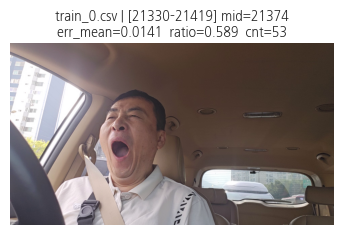

출력 완료: 1장 표시 (요청 1장)


In [35]:
# 36번셀=== 정상(train) 중 '이상(sleepy=1)'인 영상 5개 대표 프레임 보기 (1×5 그리드) ===
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

BASE_DIR  = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
STAT_DIR  = os.path.join(BASE_DIR, "dataset/outputs/denoising_analysis_results")
BLOCK_CSV = os.path.join(STAT_DIR, "block_level_dataset.csv")

VIDEO_ROOT = Path("/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/videos")
VIDEO_EXTS = [".mp4", ".avi", ".mov", ".mkv"]

# block_df가 메모리에 없으면 로드
if 'block_df' not in globals():
    block_df = pd.read_csv(BLOCK_CSV)
    print(f"[LOAD] block_df: {len(block_df)} rows")

# 필수 컬럼 확인
need_cols = {"video_id","start_idx","end_idx","frame_count","sleepy_label"}
miss = [c for c in need_cols if c not in block_df.columns]
if miss:
    raise ValueError(f"block_df에 필요한 컬럼이 없습니다: {miss}")

# -----------------------------
# 1) 정상(train) 중에서 sleepy_label==1인 블록만 추출
#    (영상별로 가장 의심도 높은 블록 1개씩)
# -----------------------------
is_train = block_df["video_id"].astype(str).str.startswith("train")
cand = block_df[is_train & (block_df["sleepy_label"].astype(int) == 1)].copy()

if cand.empty:
    raise ValueError("정상(train) 중 sleepy_label==1인 블록이 없습니다. 임계치/라벨 규칙을 확인하세요.")

# 의심도 정렬 키: recon_err_mean(내림차순) → outlier_ratio → outlier_count
sort_keys = []
if "recon_err_mean" in cand.columns: sort_keys.append("recon_err_mean")
if "outlier_ratio"  in cand.columns: sort_keys.append("outlier_ratio")
if "outlier_count"  in cand.columns: sort_keys.append("outlier_count")
if not sort_keys:
    sort_keys = ["video_id","start_idx"]  # 최소한의 안정 정렬

cand = cand.sort_values(sort_keys, ascending=[False]*len(sort_keys) if sort_keys else True)

# 영상별로 상위 1개 블록씩만 선택
top_per_video = cand.groupby("video_id", as_index=False).head(1)

# 최종 5개 영상만 선택
sel = top_per_video.head(5).reset_index(drop=True)
print(f"[INFO] 정상(train) 중 sleepy=1을 보이는 영상 수(최대 5): {len(sel)}개")

# -----------------------------
# 2) 비디오 경로 탐색 함수
# -----------------------------
def find_video_path(video_id: str):
    """video_id('train_0.csv') → videos/train_0.(mp4|avi|mov|mkv) 탐색"""
    stem = Path(video_id).stem
    for ext in VIDEO_EXTS:
        p = VIDEO_ROOT / f"{stem}{ext}"
        if p.exists():
            return p
    # 필요 시 하위 폴더 재귀 탐색:
    # for ext in VIDEO_EXTS:
    #     hits = list(VIDEO_ROOT.rglob(f"{stem}{ext}"))
    #     if hits:
    #         return hits[0]
    return None

# -----------------------------
# 3) 1×N 그리드로 대표 프레임 표시
# -----------------------------
N = len(sel)
rows, cols = 1, max(1, N)
plt.figure(figsize=(cols * 3.6, rows * 3.0))

shown = 0
for i, r in sel.iterrows():
    vid = r["video_id"]
    s   = int(r["start_idx"])
    e   = int(r["end_idx"])
    mid = (s + e) // 2

    vpath = find_video_path(vid)
    if vpath is None:
        print(f"[WARN] 원본 영상을 찾을 수 없음: {vid}")
        continue

    cap = cv2.VideoCapture(str(vpath))
    cap.set(cv2.CAP_PROP_POS_FRAMES, mid)
    ok, frame = cap.read()
    cap.release()
    if not ok or frame is None:
        print(f"[WARN] 프레임 로드 실패: {vid} @ mid={mid}")
        continue

    shown += 1
    plt.subplot(rows, cols, shown)
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    # 타이틀에 주요 지표 표시
    title = f"{vid} | [{s}–{e}] mid={mid}"
    if "recon_err_mean" in sel.columns:
        title += f"\nerr_mean={float(r['recon_err_mean']):.3g}"
    if "outlier_ratio" in sel.columns:
        title += f"  ratio={float(r['outlier_ratio']):.3g}"
    if "outlier_count" in sel.columns:
        title += f"  cnt={int(r['outlier_count'])}"

    plt.title(title, fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.show()
print(f"출력 완료: {shown}장 표시 (요청 {N}장)")


In [36]:
#37번셀
import pandas as pd

BLOCK_CSV = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/block_level_dataset.csv"
block_df = pd.read_csv(BLOCK_CSV)

# train 영상만 필터
train_df = block_df[block_df["video_id"].str.startswith("train")].copy()

# train 중 sleepy_label = 1인 블록이 있는 video_id 나열
train_abnormal_vids = train_df[train_df["sleepy_label"] == 1]["video_id"].unique()

print("[정상(train) 중 sleepy_label=1 이 나온 video_id 목록]")
print(train_abnormal_vids)

print("\n총 영상 수:", len(train_abnormal_vids))


[정상(train) 중 sleepy_label=1 이 나온 video_id 목록]
['train_0.csv']

총 영상 수: 1


In [37]:
# 38번셀=== STEP 32 (강화판): sleepy_label 0 vs 1 통계 요약 + 유의성 검정 ===
import os, numpy as np, pandas as pd
from scipy.stats import shapiro, levene, ttest_ind, mannwhitneyu

# ---- 경로/상수 안전장치 ----
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
OUT_DIR  = os.path.join(BASE_DIR, "dataset/outputs")
STAT_DIR = os.path.join(OUT_DIR, "denoising_analysis_results")
os.makedirs(STAT_DIR, exist_ok=True)

# 결과 저장 경로 (없으면 기본값 셋)
try:
    LABEL_DIFF_SAVE_PATH
except NameError:
    LABEL_DIFF_SAVE_PATH = os.path.join(STAT_DIR, "sleepy_label_group_stats.csv")
STATS_TEST_SAVE_PATH = os.path.join(STAT_DIR, "sleepy_label_group_significance.csv")

# block_df/FEATURE_COLS_RAW 존재 확인 및 기본값
assert 'block_df' in globals(), "block_df가 메모리에 있어야 합니다."
if 'FEATURE_COLS_RAW' not in globals():
    FEATURE_COLS_RAW = ['tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run']

# 숫자형 보장 (있으면 그대로, 문자열·NaN 섞여있어도 안전)
for c in ['outlier_count','recon_err_mean'] + [f"{c}_mean" for c in FEATURE_COLS_RAW]:
    if c in block_df.columns:
        block_df[c] = pd.to_numeric(block_df[c], errors='coerce')

# =========================
# [STEP A-1] 통계 요약 테이블
# =========================
compare_feats = ['outlier_count','recon_err_mean'] + [f"{c}_mean" for c in FEATURE_COLS_RAW]
# 실제 존재 컬럼만 사용
compare_feats = [c for c in compare_feats if c in block_df.columns]

stats_rows = []
for feat in compare_feats:
    g0 = block_df.loc[block_df["sleepy_label"]==0, feat].dropna().astype(float)
    g1 = block_df.loc[block_df["sleepy_label"]==1, feat].dropna().astype(float)

    row = {
        "feature": feat,
        "n_label0": int(g0.shape[0]),
        "n_label1": int(g1.shape[0]),
        "mean_label0": float(g0.mean()) if len(g0)>0 else np.nan,
        "mean_label1": float(g1.mean()) if len(g1)>0 else np.nan,
        "mean_diff_1_minus_0": float(g1.mean()-g0.mean()) if (len(g0)>0 and len(g1)>0) else np.nan,
        "median_label0": float(g0.median()) if len(g0)>0 else np.nan,
        "median_label1": float(g1.median()) if len(g1)>0 else np.nan,
        "median_diff_1_minus_0": float(g1.median()-g0.median()) if (len(g0)>0 and len(g1)>0) else np.nan,
        "std_label0": float(g0.std(ddof=1)) if len(g0)>1 else np.nan,
        "std_label1": float(g1.std(ddof=1)) if len(g1)>1 else np.nan,
    }
    stats_rows.append(row)

label_diff_df = pd.DataFrame(stats_rows)
label_diff_df.to_csv(LABEL_DIFF_SAVE_PATH, index=False)
print("\n[라벨 0 vs 1 통계 요약]")
print(label_diff_df.head(10))
print("[SAVE] sleepy_label_group_stats ->", LABEL_DIFF_SAVE_PATH)

# =========================
# [STEP A-2] 유의성 검정 + 효과크기 + FDR 보정
# =========================

def _safe_shapiro(x):
    # Shapiro는 n<3 또는 상수배열일 때 ValueError 가능
    try:
        if len(x) < 3:
            return np.nan, np.nan
        # 상수인 경우도 예외 처리
        if np.allclose(x, x[0]):
            return np.nan, np.nan
        stat, p = shapiro(x)
        return float(stat), float(p)
    except Exception:
        return np.nan, np.nan

def _cohens_d(x, y):
    n1, n2 = len(x), len(y)
    if n1 < 2 or n2 < 2:
        return np.nan
    v1, v2 = np.var(x, ddof=1), np.var(y, ddof=1)
    # pooled SD
    denom = (n1 + n2 - 2)
    if denom <= 0:
        return np.nan
    sp = np.sqrt(((n1-1)*v1 + (n2-1)*v2) / denom)
    if sp == 0 or np.isnan(sp):
        return np.nan
    return (np.mean(y) - np.mean(x)) / sp

def _cliffs_delta(x, y):
    # 비모수 효과크기: ( #(y>x) - #(y<x) ) / (n1*n2)
    n1, n2 = len(x), len(y)
    if n1 == 0 or n2 == 0:
        return np.nan
    # 벡터화로 가속
    x_sorted = np.sort(x)
    y_sorted = np.sort(y)
    import bisect
    cnt = 0
    for a in x_sorted:
        # y>a 개수 - y<a 개수
        greater = n2 - bisect.bisect_right(y_sorted, a)
        less    = bisect.bisect_left(y_sorted, a)
        cnt += (greater - less)
    return cnt / (n1 * n2)

test_rows = []
for feat in compare_feats:
    g0 = block_df.loc[block_df["sleepy_label"]==0, feat].dropna().astype(float).values
    g1 = block_df.loc[block_df["sleepy_label"]==1, feat].dropna().astype(float).values

    n0, n1 = len(g0), len(g1)
    if n0 < 3 or n1 < 3:
        test_rows.append({
            "feature": feat, "n_label0": n0, "n_label1": n1,
            "normality_p_label0": np.nan, "normality_p_label1": np.nan,
            "levene_p": np.nan, "test_used": "NA (too small)",
            "statistic": np.nan, "p_value": np.nan,
            "effect_size": np.nan, "effect_type": ""
        })
        continue

    # 정규성
    _, sw0_p = _safe_shapiro(g0)
    _, sw1_p = _safe_shapiro(g1)
    both_normal = (sw0_p is not np.nan and sw0_p > 0.05) and (sw1_p is not np.nan and sw1_p > 0.05)

    # 등분산성
    try:
        _, lev_p = levene(g0, g1)
    except Exception:
        lev_p = np.nan
    equal_var = (not np.isnan(lev_p)) and (lev_p > 0.05)

    if both_normal:
        if equal_var:
            test_name = "t-test (Student)"
            stat, pval = ttest_ind(g0, g1, equal_var=True)
        else:
            test_name = "t-test (Welch)"
            stat, pval = ttest_ind(g0, g1, equal_var=False)
        eff = _cohens_d(g0, g1); eff_type = "Cohen_d"
    else:
        test_name = "Mann-Whitney U"
        stat, pval = mannwhitneyu(g0, g1, alternative='two-sided')
        eff = _cliffs_delta(g0, g1); eff_type = "Cliffs_delta"

    test_rows.append({
        "feature": feat,
        "n_label0": n0, "n_label1": n1,
        "normality_p_label0": sw0_p, "normality_p_label1": sw1_p,
        "levene_p": lev_p,
        "test_used": test_name,
        "statistic": float(stat), "p_value": float(pval),
        "effect_size": float(eff) if eff is not np.nan else np.nan,
        "effect_type": eff_type
    })

stats_test_df = pd.DataFrame(test_rows)

# ---- (옵션) BH-FDR 보정 ----
try:
    from statsmodels.stats.multitest import multipletests
    pvals = stats_test_df['p_value'].values.astype(float)
    # 결측/NaN은 보정에서 제외 후 원래 위치에 복원
    mask = np.isfinite(pvals)
    adj = np.full_like(pvals, np.nan, dtype=float)
    if mask.sum() > 0:
        _, p_adj, _, _ = multipletests(pvals[mask], alpha=0.05, method='fdr_bh')
        adj[mask] = p_adj
    stats_test_df['p_adj_bh'] = adj
except Exception:
    # statsmodels 없으면 스킵
    pass

stats_test_df = stats_test_df.sort_values(by=['p_value'], na_position='last')
stats_test_df.to_csv(STATS_TEST_SAVE_PATH, index=False)

print("\n[집단 간 차이 검정 결과 (p 오름차순)]")
print(stats_test_df.head(20))
print("[SAVE] sleepy_label_group_significance ->", STATS_TEST_SAVE_PATH)



[라벨 0 vs 1 통계 요약]
                feature  n_label0  n_label1  mean_label0  mean_label1  \
0         outlier_count       818        83     4.569682    66.879518   
1        recon_err_mean       818        83     0.002569     0.037905   
2  tilt_diff_ratio_mean       818        83     0.511722     2.169907   
3         open_sum_mean       818        83    -0.110881    -0.492695   
4    both_open_run_mean       818        83    -0.194092    -0.810275   
5   one_closed_run_mean       818        83     0.278016     0.309436   
6  both_closed_run_mean       818        83     0.100528     1.323321   

   mean_diff_1_minus_0  median_label0  median_label1  median_diff_1_minus_0  \
0            62.309836       0.000000      65.000000              65.000000   
1             0.035335       0.001689       0.023363               0.021675   
2             1.658185       0.203163       1.854196               1.651033   
3            -0.381814      -0.061034      -0.428697              -0.367663   
4

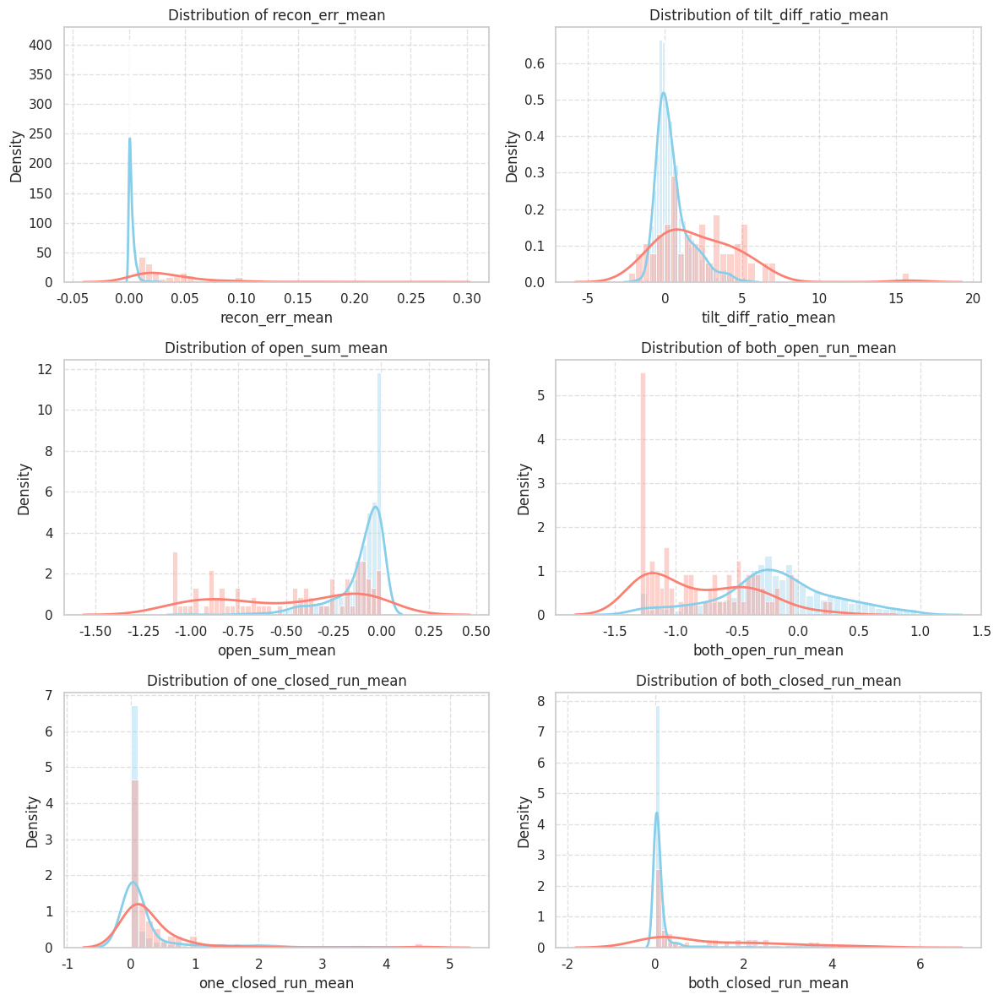

In [38]:
# 39번셀 (수정 완료 버전)
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------------
# 시각화 대상 변수 목록
# -----------------------------------------
features = [
    'recon_err_mean',
    'tilt_diff_ratio_mean',
    'open_sum_mean',
    'both_open_run_mean',
    'one_closed_run_mean',
    'both_closed_run_mean'
]

# -----------------------------------------
# 데이터 체크
# -----------------------------------------
if 'block_df' in globals() and block_df is not None and 'sleepy_label' in block_df.columns:

    sns.set(style='whitegrid')
    ncols = 2
    nrows = (len(features) + ncols - 1) // ncols
    plt.figure(figsize=(12, nrows * 4))

    palette = {0: 'skyblue', 1: 'salmon'}
    label_map = {0: 'Normal (0)', 1: 'Abnormal (1)'}

    for i, feat in enumerate(features, 1):

        if feat not in block_df.columns:
            print(f"⚠️ '{feat}' 컬럼 없음 → 스킵")
            continue

        plt.subplot(nrows, ncols, i)

        # --------------------------
        # Histogram + KDE (분리)
        # --------------------------
        for lbl in [0, 1]:
            subset = block_df[block_df["sleepy_label"] == lbl][feat]

            sns.histplot(
                subset,
                kde=False,
                stat="density",
                color=palette[lbl],
                alpha=0.35,
                bins=40
            )

            # KDE 개별 라인
            sns.kdeplot(
                subset,
                color=palette[lbl],
                linewidth=2,
                label=label_map[lbl]
            )

        plt.title(f'Distribution of {feat}', fontsize=12)
        plt.xlabel(feat)
        plt.ylabel('Density')
        plt.grid(True, linestyle='--', alpha=0.6)

    plt.tight_layout()
    plt.show()

else:
    print("block_df가 없거나 sleepy_label 컬럼이 없습니다.")


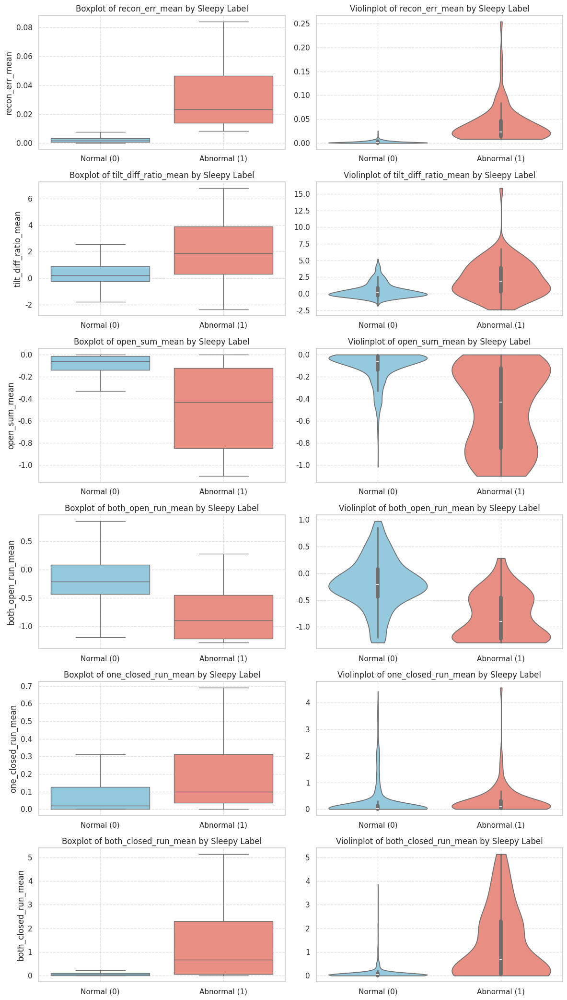

In [39]:
# 40번셀
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ------------------------------------
# 시각화 대상 변수 목록
# ------------------------------------
features = [
    'recon_err_mean',
    'tilt_diff_ratio_mean',
    'open_sum_mean',
    'both_open_run_mean',
    'one_closed_run_mean',
    'both_closed_run_mean'
]

if 'block_df' in globals() and block_df is not None and 'sleepy_label' in block_df.columns:
    # sleepy_label을 확실히 정수 0/1로 변환 (문자열/혼합형 방지)
    block_df = block_df.copy()
    block_df['sleepy_label'] = pd.to_numeric(block_df['sleepy_label'], errors='coerce').fillna(0).astype(int)

    # 실제 존재하는 피처만 사용
    feats_in_df = [f for f in features if f in block_df.columns and np.issubdtype(block_df[f].dtype, np.number)]
    if not feats_in_df:
        raise ValueError("features 목록에 block_df에 존재하고 숫자인 컬럼이 없습니다.")

    sns.set(style='whitegrid')
    nrows = len(feats_in_df)
    plt.figure(figsize=(12, nrows * 3.5))

    # 팔레트는 리스트로 주면 순서대로 적용되어 키 매칭 오류가 없다
    palette_list = ['skyblue', 'salmon']
    order_lbls   = [0, 1]
    xticklabels  = ['Normal (0)', 'Abnormal (1)']

    for i, feat in enumerate(feats_in_df, 1):
        # --- Boxplot (왼쪽) ---
        plt.subplot(nrows, 2, 2*i - 1)
        sns.boxplot(
            data=block_df,
            x='sleepy_label',
            y=feat,
            order=order_lbls,
            palette=palette_list,
            showfliers=False
        )
        plt.title(f'Boxplot of {feat} by Sleepy Label')
        plt.xlabel('')
        plt.ylabel(feat)
        plt.xticks(order_lbls, xticklabels)
        plt.grid(True, linestyle='--', alpha=0.6)

        # --- Violinplot (오른쪽) ---
        plt.subplot(nrows, 2, 2*i)
        sns.violinplot(
            data=block_df,
            x='sleepy_label',
            y=feat,
            order=order_lbls,
            palette=palette_list,
            inner='box',
            cut=0
        )
        plt.title(f'Violinplot of {feat} by Sleepy Label')
        plt.xlabel('')
        plt.ylabel('')
        plt.xticks(order_lbls, xticklabels)
        plt.grid(True, linestyle='--', alpha=0.6)

    plt.tight_layout()
    plt.show()
else:
    print("데이터프레임 'block_df'가 없거나 'sleepy_label' 컬럼이 없습니다.")


[INFO] 표시할 졸음 블록 수: 40개


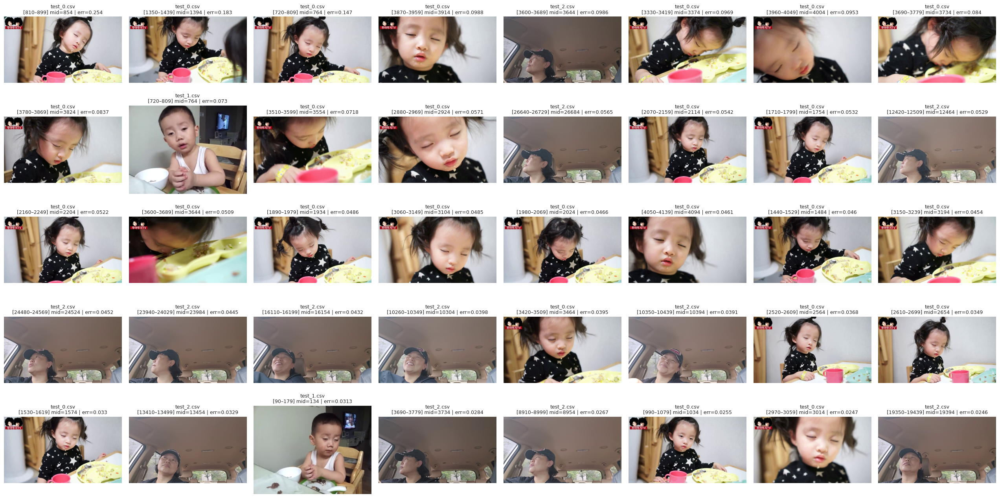

출력 완료: 40장 표시 (요청 40장)


In [40]:
# 41번셀=== 40개 '졸음' 블록의 recon_err_mean 대표 프레임(중심 프레임) 5x8 그리드 출력 ===
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

BASE_DIR  = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
STAT_DIR  = os.path.join(BASE_DIR, "dataset/outputs/denoising_analysis_results")
BLOCK_CSV = os.path.join(STAT_DIR, "block_level_dataset.csv")

VIDEO_ROOT = Path("/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/videos")
VIDEO_EXTS = [".mp4", ".avi", ".mov", ".mkv"]

# block_df가 메모리에 없으면 로드
if 'block_df' not in globals():
    block_df = pd.read_csv(BLOCK_CSV)
    print(f"[LOAD] block_df: {len(block_df)} rows")

# 필수 컬럼 확인
needed = {"video_id","start_idx","end_idx","frame_count","sleepy_label"}
miss = [c for c in needed if c not in block_df.columns]
if miss:
    raise ValueError(f"block_df에 필요한 컬럼이 없습니다: {miss}")

# 졸음 블록만 추출 (라벨 1)
sleepy_df = block_df[block_df["sleepy_label"].astype(int) == 1].copy()

# 정확히 40개만 선택: 우선 recon_err_mean 높은 순으로 정렬 후 상위 40개 (원하면 다른 기준으로 바꿔도 됨)
if "recon_err_mean" in sleepy_df.columns:
    sleepy_df = sleepy_df.sort_values(["recon_err_mean","video_id","start_idx"], ascending=[False, True, True])
else:
    sleepy_df = sleepy_df.sort_values(["video_id","start_idx"])
sleepy_df = sleepy_df.head(40).reset_index(drop=True)

print(f"[INFO] 표시할 졸음 블록 수: {len(sleepy_df)}개")

def find_video_path(video_id: str):
    """video_id('test_0.csv') → videos/test_0.(mp4|avi|mov|mkv) 탐색"""
    stem = Path(video_id).stem
    for ext in VIDEO_EXTS:
        p = VIDEO_ROOT / f"{stem}{ext}"
        if p.exists():
            return p
    # 서브폴더까지 광범위 탐색이 필요하면 아래 주석 해제
    # for ext in VIDEO_EXTS:
    #     hits = list(VIDEO_ROOT.rglob(f"{stem}{ext}"))
    #     if hits:
    #         return hits[0]
    return None

# 5 x 8 그리드
rows, cols = 5, 8
N = len(sleepy_df)
rows = rows if rows * cols >= N else int(np.ceil(N / cols))
plt.figure(figsize=(cols * 3.2, rows * 2.6))

shown = 0
for i, r in sleepy_df.iterrows():
    vid = r["video_id"]
    s   = int(r["start_idx"])
    e   = int(r["end_idx"])
    mid = (s + e) // 2

    vpath = find_video_path(vid)
    if vpath is None:
        print(f"[WARN] 원본 영상을 찾을 수 없음: {vid}")
        continue

    cap = cv2.VideoCapture(str(vpath))
    cap.set(cv2.CAP_PROP_POS_FRAMES, mid)
    ok, frame = cap.read()
    cap.release()
    if not ok or frame is None:
        print(f"[WARN] 프레임 로드 실패: {vid} @ mid={mid}")
        continue

    shown += 1
    plt.subplot(rows, cols, shown)
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    title = f"{vid}\n[{s}–{e}] mid={mid}"
    if "recon_err_mean" in sleepy_df.columns:
        title += f" | err={float(r['recon_err_mean']):.3g}"
    plt.title(title, fontsize=9)
    plt.axis("off")

    if shown >= rows * cols:
        break

plt.tight_layout()
plt.show()
print(f"출력 완료: {shown}장 표시 (요청 40장)")


In [41]:
# 42번셀
from pathlib import Path
import pandas as pd, numpy as np, os

BASE_DIR  = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
STAT_DIR  = os.path.join(BASE_DIR, "dataset/outputs/denoising_analysis_results")
PER_FRAME_CSV = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")
BLOCK_CSV = os.path.join(STAT_DIR, "block_level_dataset.csv")

pf = pd.read_csv(PER_FRAME_CSV)
bd = pd.read_csv(BLOCK_CSV)

def vid_stem(x):  # 확장자/경로 제거 후 이름만
    s = str(x)
    return Path(s).name.replace(".csv","").replace(".mp4","").replace(".avi","").replace(".mov","").replace(".mkv","")

pf["vid_key"] = pf["video_id"].map(vid_stem)
bd["vid_key"] = bd["video_id"].map(vid_stem)

print("[per_frame unique]", sorted(pf["vid_key"].unique())[:10], "...")
print("[block_df  unique]", sorted(bd["vid_key"].unique())[:10], "...")
missing_keys = set(bd["vid_key"].unique()) - set(pf["vid_key"].unique())
print("[missing vid_key in per_frame]", sorted(missing_keys))


[per_frame unique] ['test_0', 'test_1', 'test_2', 'train_0', 'train_1', 'train_2'] ...
[block_df  unique] ['test_0', 'test_1', 'test_2', 'train_0', 'train_1', 'train_2'] ...
[missing vid_key in per_frame] []


In [42]:
# 43번셀============================================
# Paths & Load
# ============================================
import os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path
from sklearn.metrics import roc_curve, auc, precision_recall_fscore_support, confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

BASE_DIR  = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
STAT_DIR  = os.path.join(BASE_DIR, "dataset/outputs/denoising_analysis_results")
BLOCK_CSV = os.path.join(STAT_DIR, "block_level_dataset.csv")

VIDEO_ROOT = Path("/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/videos")
VIDEO_EXTS = [".mp4", ".avi", ".mov", ".mkv"]

# block_df 없으면 로드
if 'block_df' not in globals():
    block_df = pd.read_csv(BLOCK_CSV)
    print(f"[LOAD] block_df: {len(block_df)} rows")

# 필수 컬럼 체크
need_cols = {
    "video_id","start_idx","end_idx","frame_count",
    "sleepy_label","outlier_ratio","outlier_count"
}
miss = [c for c in need_cols if c not in block_df.columns]
if miss:
    raise ValueError(f"block_df에 누락된 컬럼이 있습니다: {miss}")

# -------------------------------------------------
# GT 정의: (A) video_id 기반 / (B) block 라벨 기반(옵션)
# -------------------------------------------------
def map_gt_by_videoid(vid: str) -> int:
    s = str(vid)
    if s.startswith("train_"): return 0
    if s.startswith("test_"):  return 1
    return -1

# (B) block 라벨 기반: 해당 비디오에 sleepy_label==1 블록이 하나라도 있으면 1
gt_block = (
    block_df.groupby("video_id")["sleepy_label"]
            .apply(lambda x: int(np.any(pd.to_numeric(x, errors="coerce").fillna(0).astype(int) == 1)))
            .rename("gt_block_label")
            .reset_index()
)

# 최종 평가 테이블(비디오 단위)
eval_df = (
    block_df.groupby("video_id", as_index=False)
            .agg(any_block_sleepy=("sleepy_label", lambda x: int(np.any(pd.to_numeric(x, errors="coerce").fillna(0).astype(int)==1))))
)
eval_df["gt_videoid"] = eval_df["video_id"].map(map_gt_by_videoid)
eval_df = eval_df.merge(gt_block, on="video_id", how="left")

# 기본 GT를 video_id로 둘지, block 라벨로 둘지 선택
USE_GT = "video_id"  # "video_id" 또는 "block"
if USE_GT == "video_id":
    eval_df = eval_df[eval_df["gt_videoid"].isin([0,1])].copy()
    y_true = eval_df["gt_videoid"].to_numpy()
else:
    eval_df = eval_df[eval_df["gt_block_label"].isin([0,1])].copy()
    y_true = eval_df["gt_block_label"].to_numpy()

print(f"[INFO] Eval videos: {len(eval_df)} | Normal: {(y_true==0).sum()} | Sleepy: {(y_true==1).sum()} (GT={USE_GT})")

# ============================================
# per-frame → per-second 재구성 (누락 방지: test_2 포함)
# ============================================
PER_FRAME_CSV = os.path.join(STAT_DIR, "per_frame_outlier_labels.csv")
pf = pd.read_csv(PER_FRAME_CSV)
assert {"video_id","frame_idx","is_outlier"}.issubset(pf.columns), "[ERR] per_frame CSV 필수 컬럼 누락"

FPS = 30  # 실제 FPS 사용
# 초 bin
pf["seconds_bin"] = (pf["frame_idx"] // FPS) + 1

# 기본 per-second 집계
persec = (
    pf.groupby(["video_id","seconds_bin"], as_index=False)
      .agg(outlier_count_in_sec=("is_outlier","sum"),
           frames_in_sec=("is_outlier","count"))
)
persec["outlier_ratio_in_sec"] = persec["outlier_count_in_sec"] / persec["frames_in_sec"].clip(lower=1)

# 비디오별 1..max 초까지 빈 초 0으로 채우기(연속성 보장)
filled = []
for vid, sub in persec.groupby("video_id", sort=False):
    mx = int(sub["seconds_bin"].max())
    full = pd.DataFrame({"video_id":vid, "seconds_bin":np.arange(1, mx+1, dtype=int)})
    sub2 = full.merge(sub, on=["video_id","seconds_bin"], how="left")
    sub2["outlier_count_in_sec"] = sub2["outlier_count_in_sec"].fillna(0).astype(int)
    # 마지막 초가 FPS보다 적을 수 있지만, 분모는 보수적으로 FPS 사용(일관성↑)
    sub2["frames_in_sec"] = sub2["frames_in_sec"].fillna(FPS).astype(int)
    sub2["outlier_ratio_in_sec"] = sub2["outlier_count_in_sec"] / sub2["frames_in_sec"].clip(lower=1)
    filled.append(sub2)
persec_rebuilt = pd.concat(filled, ignore_index=True)

# per-second 파일 저장(선택)
PERSEC_REBUILT_PATH = os.path.join(STAT_DIR, "per_video_outlier_by_seconds_persec_REBUILT.csv")
persec_rebuilt.to_csv(PERSEC_REBUILT_PATH, index=False, encoding="utf-8-sig")
print("[SAVE] per-second(REBUILT) ->", PERSEC_REBUILT_PATH)

# 평가대상 비디오 모두 포함됐는지 체크(여기서 이전엔 test_2가 빠졌었음)
missing = set(eval_df["video_id"].unique()) - set(persec_rebuilt["video_id"].unique())
assert not missing, f"[ERR] per-second(REBUILT)에 없는 비디오: {sorted(missing)}"

# ============================================
# 점수 생성: (1) 3초 최대 비율, (2) 1초 최대 개수
# ============================================
BLOCK_SEC = 3
BLOCK_FRAMES = BLOCK_SEC * FPS

def scores_from_persec(sub: pd.DataFrame):
    cnt = sub["outlier_count_in_sec"].to_numpy(dtype=int)
    # 3초 슬라이딩 최대 비율
    if len(cnt) >= BLOCK_SEC:
        win = np.convolve(cnt, np.ones(BLOCK_SEC, dtype=int), mode="valid")
        max_block3_ratio = float(win.max()) / float(BLOCK_FRAMES)
    else:
        # 3초 미만 영상 fallback: 전체 평균 비율
        L = max(1, len(cnt))
        max_block3_ratio = float(cnt.sum()) / float(L*FPS)
    # 1초 bin 최대 개수
    max_sec_count = int(cnt.max()) if len(cnt) else 0
    return max_block3_ratio, max_sec_count

rows = []
for vid, sub in persec_rebuilt.groupby("video_id", sort=False):
    r3, c1 = scores_from_persec(sub)
    rows.append({"video_id": vid,
                 "score_block3_ratio": r3,
                 "score_sec_count": c1})
score_df = pd.DataFrame(rows).sort_values("video_id").reset_index(drop=True)
print("\n[SCORES by video]\n", score_df)

# eval_df에 매핑
eval_df = eval_df.merge(score_df, on="video_id", how="left")

# ============================================
# ROC/ConfMat 유틸
# ============================================
def compute_and_show(score_col, color="C0"):
    score = pd.to_numeric(eval_df[score_col], errors="coerce").fillna(0).values.astype(float)
    fpr, tpr, thr = roc_curve(y_true, score)
    roc_auc = auc(fpr, tpr)

    # Youden J
    youden = tpr - fpr
    idxJ = int(np.nanargmax(youden))
    thr_J = float(thr[idxJ])

    # F1-max
    best_f1, thr_F1 = -1.0, None
    cand = np.unique(np.r_[thr, np.quantile(score, np.linspace(0,1,101))])
    for th in cand:
        yp = (score >= th).astype(int)
        _, _, f1, _ = precision_recall_fscore_support(y_true, yp, average="binary", zero_division=0)
        if f1 > best_f1:
            best_f1, thr_F1 = f1, float(th)

    # Normal P95
    if USE_GT == "video_id":
        norm_mask = (y_true==0)
    else:
        norm_mask = (y_true==0)
    thr_P95 = float(np.quantile(score[norm_mask], 0.95)) if norm_mask.any() else float("nan")

    print("\n========================")
    print(f"   ROC: {score_col}  (GT={USE_GT})")
    print("========================")
    print(f"AUC={roc_auc:.3f}")
    print(f"YoudenJ thr={thr_J:.6g}")
    print(f"F1max   thr={thr_F1:.6g} (F1≈{best_f1:.3f})")
    print(f"NormalP95 thr={thr_P95:.6g}")

    # ConfMat 출력 함수
    def _at(name, thr_used):
        y_pred = (score >= thr_used).astype(int)
        cm = confusion_matrix(y_true, y_pred, labels=[0,1])
        ACC = accuracy_score(y_true, y_pred)
        P   = precision_score(y_true, y_pred, zero_division=0)
        R   = recall_score(y_true, y_pred, zero_division=0)
        F1  = f1_score(y_true, y_pred, zero_division=0)
        print(f"\n[{score_col}] ConfMat @ {name} (thr={thr_used:.6g})")
        print(cm)
        print(f"ACC={ACC:.3f}  P={P:.3f}  R={R:.3f}  F1={F1:.3f}")
        print(classification_report(y_true, y_pred, target_names=["Normal","Sleepy"], digits=4, zero_division=0))

    _at("YoudenJ", thr_J)
    _at("F1max",   thr_F1)
    _at("NormalP95", thr_P95)

# ============================================
# 실행: 블록(3초) 비율 / 초(1초) 개수 스윕만 평가
# ============================================
compute_and_show("score_block3_ratio", color="C3")
compute_and_show("score_sec_count",    color="C4")


[INFO] Eval videos: 6 | Normal: 3 | Sleepy: 3 (GT=video_id)
[SAVE] per-second(REBUILT) -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/per_video_outlier_by_seconds_persec_REBUILT.csv

[SCORES by video]
       video_id  score_block3_ratio  score_sec_count
0   test_0.csv            1.000000               30
1   test_1.csv            0.988889               30
2   test_2.csv            1.000000               30
3  train_0.csv            0.766667               30
4  train_1.csv            0.355556               23
5  train_2.csv            0.066667                6

   ROC: score_block3_ratio  (GT=video_id)
AUC=1.000
YoudenJ thr=0.988889
F1max   thr=0.777778 (F1≈1.000)
NormalP95 thr=0.725556

[score_block3_ratio] ConfMat @ YoudenJ (thr=0.988889)
[[3 0]
 [0 3]]
ACC=1.000  P=1.000  R=1.000  F1=1.000
              precision    recall  f1-score   support

      Normal     1.0000    1.0000    1.0000         3
      Sleepy     1.0000    1.0000    1.0

In [43]:
# 44번셀============================================
# Video-level ROC for score_block3_ratio / score_sec_count
#  - block_df -> 비디오별 집계
#  - GT도 비디오 단위로 생성(video_id로 0/1)
#  - test_2 포함 여부 검증
# ============================================
import numpy as np, pandas as pd
from sklearn.metrics import roc_curve, auc, confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score

def map_gt_video(vid):
    s = str(vid)
    if s.startswith("train_"): return 0
    if s.startswith("test_"):  return 1
    return -1

# 1) 비디오별 스코어 집계 (block_df 기반)
#    - score_block3_ratio: 블록 단위 outlier_ratio의 최댓값(=가장 졸린 구간)
#    - score_sec_count: "이상치가 있었던 초"의 개수 → per-second 표가 있으면 사용, 없으면 대체치
assert "video_id" in block_df.columns and "outlier_ratio" in block_df.columns, "[ERR] block_df 필수 컬럼 누락"

video_scores = (
    block_df
      .groupby("video_id", as_index=False)
      .agg(score_block3_ratio=("outlier_ratio","max"))
)

# per-second 파일이 이미 있다면 거기서 초 개수 집계(권장)
# 없으면 대체: 블록에서 outlier_ratio>0인 블록의 개수를 초 개수로 근사(3초 블록이면 ×3을 고려할 수도 있으나 여기선 단순 근사)
persec_path = os.path.join(STAT_DIR, "per_video_outlier_by_seconds_persec_REBUILT.csv")
if os.path.isfile(persec_path):
    _persec = pd.read_csv(persec_path)
    # 초당 outlier_count_in_sec>0 인 초의 개수
    sec_cnt = (_persec.assign(hit=(_persec["outlier_count_in_sec"]>0).astype(int))
                       .groupby("video_id", as_index=False)["hit"].sum()
                       .rename(columns={"hit":"score_sec_count"}))
    video_scores = video_scores.merge(sec_cnt, on="video_id", how="left")
else:
    # 대체 근사: outlier_ratio>0 인 블록 개수(3초 블록이므로 대략 초 수는 *3 이지만, 비율 비교용이므로 원 값으로 두어도 OK)
    approx_sec = (block_df.assign(hit=(block_df["outlier_ratio"]>0).astype(int))
                          .groupby("video_id", as_index=False)["hit"].sum()
                          .rename(columns={"hit":"score_sec_count"}))
    video_scores = video_scores.merge(approx_sec, on="video_id", how="left")

# 2) GT 생성(비디오 단위)
video_scores["gt"] = video_scores["video_id"].map(map_gt_video)
eval_v = video_scores[video_scores["gt"].isin([0,1])].reset_index(drop=True)

# 3) test_2.csv 포함 여부 점검
must_have = {"test_0.csv","test_1.csv","test_2.csv","train_0.csv","train_1.csv","train_2.csv"}
missing_videos = sorted(list(must_have - set(eval_v["video_id"].unique())))
if missing_videos:
    print("[WARN] Video-level 평가에 누락된 비디오:", missing_videos)

print(f"[INFO] Video-level Eval videos: {len(eval_v)} | Normal: {(eval_v['gt']==0).sum()} | Sleepy: {(eval_v['gt']==1).sum()}")
print("\n[SCORES by video]")
print(eval_v[["video_id","score_block3_ratio","score_sec_count"]])

# 4) 비디오-레벨 ROC/리포트 함수
def _report_video_roc(df, score_col, name=None):
    y = df["gt"].to_numpy().astype(int)
    s = pd.to_numeric(df[score_col], errors="coerce").fillna(0).to_numpy().astype(float)
    fpr, tpr, thr = roc_curve(y, s)
    roc_auc = auc(fpr, tpr)

    # 임계치 후보: YoudenJ
    youden = tpr - fpr
    ti = int(np.nanargmax(youden))
    thr_J = float(thr[ti])

    # ConfMat @ YoudenJ
    yp = (s >= thr_J).astype(int)
    cm = confusion_matrix(y, yp, labels=[0,1])
    acc = accuracy_score(y, yp)
    prec = precision_score(y, yp, zero_division=0)
    rec  = recall_score(y, yp, zero_division=0)
    f1   = f1_score(y, yp, zero_division=0)

    print("\n========================")
    print(f"   ROC (VIDEO): {name or score_col}  (GT=video_id)")
    print("========================")
    print(f"AUC={roc_auc:.3f}")
    print(f"YoudenJ thr={thr_J:.6g}")
    print(f"[{score_col}] ConfMat @ YoudenJ (thr={thr_J:.6g})")
    print(cm)
    print(f"ACC={acc:.3f}  P={prec:.3f}  R={rec:.3f}  F1={f1:.3f}")
    print(classification_report(y, yp, target_names=["Normal","Sleepy"], digits=4, zero_division=0))
    return roc_auc, thr_J

# 5) 실행 (비디오-레벨)
auc_b3, thr_b3 = _report_video_roc(eval_v, "score_block3_ratio", name="score_block3_ratio")
auc_sc, thr_sc = _report_video_roc(eval_v, "score_sec_count",   name="score_sec_count")

print("\n[VIDEO-LEVEL SUMMARY]")
print(pd.DataFrame({
    "score":["score_block3_ratio","score_sec_count"],
    "AUC":[auc_b3, auc_sc],
    "thr_youden":[thr_b3, thr_sc]
}))


[INFO] Video-level Eval videos: 6 | Normal: 3 | Sleepy: 3

[SCORES by video]
      video_id  score_block3_ratio  score_sec_count
0   test_0.csv            1.000000              115
1   test_1.csv            0.722222               25
2   test_2.csv            1.000000              254
3  train_0.csv            0.711111              165
4  train_1.csv            0.188889                5
5  train_2.csv            0.066667                1

   ROC (VIDEO): score_block3_ratio  (GT=video_id)
AUC=1.000
YoudenJ thr=0.722222
[score_block3_ratio] ConfMat @ YoudenJ (thr=0.722222)
[[3 0]
 [0 3]]
ACC=1.000  P=1.000  R=1.000  F1=1.000
              precision    recall  f1-score   support

      Normal     1.0000    1.0000    1.0000         3
      Sleepy     1.0000    1.0000    1.0000         3

    accuracy                         1.0000         6
   macro avg     1.0000    1.0000    1.0000         6
weighted avg     1.0000    1.0000    1.0000         6


   ROC (VIDEO): score_sec_count  (GT=video

In [44]:
# 45번셀 이상치 비율 65/ 이상치 갯수 6
# 29 (revised)
import os, warnings, json, joblib
import numpy as np
import pandas as pd
import tensorflow as tf

warnings.filterwarnings("ignore")
np.set_printoptions(suppress=True)
tf.keras.utils.set_random_seed(42)
tf.config.experimental.enable_op_determinism()

# =========================
# 0) 경로 / 상수
# =========================
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
OUT_DIR  = os.path.join(BASE_DIR, "dataset/outputs")
STAT_DIR = os.path.join(OUT_DIR, "denoising_analysis_results")
os.makedirs(STAT_DIR, exist_ok=True)

STAT_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results"
MODEL_PATH = os.path.join(STAT_DIR, "best_dae.keras")
META_PATH  = os.path.join(STAT_DIR, "best_dae.meta.json")

RAW_CSV_INPUT_DIR = os.path.join(OUT_DIR)  # train_*.csv, test_*.csv 위치
TRAIN_CSVS = [os.path.join(RAW_CSV_INPUT_DIR, f"train_{i}.csv") for i in range(3)]
TEST_CSVS  = [os.path.join(RAW_CSV_INPUT_DIR, f"test_{i}.csv")  for i in range(3)]
ALL_CSVS   = TRAIN_CSVS + TEST_CSVS

SCALER_PATH     = os.path.join(STAT_DIR, "scaler_robust.joblib")
AE_WEIGHTS_PATH = os.path.join(STAT_DIR, "best_dae_weights.weights.h5")

FEATURE_COLS_RAW = [
    'tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run'
]
AE_FEAT_COLS = FEATURE_COLS_RAW[:]
FPS = 30

# 1) 메타 자동 로드 → 상수 자동 세팅
with open(META_PATH, "r") as f:
    meta = json.load(f)

BEST_L       = int(meta.get("H", 20))          # 또는 meta에 저장한 키에 맞춰 사용
BEST_S       = int(meta.get("S", 3))
BEST_LATENT  = int(meta.get("latent", 32))
BEST_DEPTH   = int(meta.get("depth", 2))
DENOISE_STD = 0.05
LEARNING_RATE = 1e-3

# ---- 블록 설정 (분석용 3초)
BLOCK_SEC = 3.0
BLOCK_LEN = int(BLOCK_SEC * FPS)

# ---- 라벨링 규칙 (옵션)
USE_RATIO_RULE      = True     # True면 비율기준, False면 개수기준
THR_RATIO_DEFAULT   = 0.65     # 3초창 권장 비율 임계(Youden/F1 분석 근거)
OUTLIER_THRESH_COUNT= 6        # 개수기준 사용할 때

# ---- AE 에러 전역 임계치 설정
GLOBAL_MSE_PCTL = 95.0         # 정상 train MSE 상위 p% → 프레임 이상치

# =========================
# 1) 유틸
# =========================
def load_with_video_id(paths):
    dfs=[]
    for p in paths:
        if os.path.isfile(p):
            df=pd.read_csv(p)
            df["video_id"]=os.path.basename(p)
            dfs.append(df)
        else:
            print(f"[WARN] not found: {p}")
    if not dfs:
        raise FileNotFoundError("No CSVs loaded")
    return pd.concat(dfs, ignore_index=True)

def add_log_transform(df, feat_cols, skip_cols=None):
    out = df.copy()
    for c in feat_cols:
        if skip_cols and c in skip_cols:
            continue
        out[c] = np.log1p(np.maximum(0, out[c]))
    return out

def make_seq(X, L, S):
    N=len(X)
    starts=list(range(0, max(0,N-L+1), S))
    if N>=L:
        seqs=np.stack([X[s:s+L] for s in starts], axis=0)
    else:
        seqs=np.empty((0,L,X.shape[1]))
    centers=[s+L//2 for s in starts]
    return seqs, starts, centers

def build_denoising_ae(L,F,latent=32,noise_std=0.05,depth=2,lr=1e-3):
    inp = tf.keras.Input(shape=(L,F))
    x   = tf.keras.layers.GaussianNoise(noise_std)(inp)
    for _ in range(depth):
        x = tf.keras.layers.Conv1D(64,3,padding='same',activation='relu')(x)
    z = tf.keras.layers.Conv1D(latent,3,padding='same',activation='relu',name='latent')(x)
    y = z
    for _ in range(depth):
        y = tf.keras.layers.Conv1D(64,3,padding='same',activation='relu')(y)
    out = tf.keras.layers.Conv1D(F,3,padding='same')(y)
    m = tf.keras.Model(inp,out)
    m.compile(optimizer=tf.keras.optimizers.Adam(lr), loss='mse')
    return m

def ae_recon_error(model, Xseq):
    if len(Xseq)==0:
        return np.array([])
    Xr = model.predict(Xseq, verbose=0)
    err=(Xseq-Xr)**2
    return err.mean(axis=(1,2))  # (num_seq,)

def per_frame_mse_from_windows(mse_win, starts, L, N):
    """
    윈도우 MSE를 해당 윈도우가 커버하는 모든 프레임에 누적 후 평균.
    overlap 보정(=sum/cnt).
    """
    if N==0 or len(mse_win)==0:
        return np.zeros(N, dtype=np.float32)
    sum_arr = np.zeros(N, dtype=np.float32)
    cnt_arr = np.zeros(N, dtype=np.float32)
    for w, s in enumerate(starts):
        e = min(s+L, N)
        sum_arr[s:e] += mse_win[w]
        cnt_arr[s:e] += 1.0
    cnt_arr = np.maximum(cnt_arr, 1.0)
    return sum_arr / cnt_arr

def seq_errors_for_video(ae, df_video_scaled, feat_cols, L, S):
    Xi = df_video_scaled[feat_cols].values.astype(np.float32)
    Xseq, starts, centers = make_seq(Xi, L, S)
    mse_win = ae_recon_error(ae, Xseq)
    N = len(df_video_scaled)
    per_frame_err = per_frame_mse_from_windows(mse_win, starts, L, N)
    return per_frame_err

def make_nonoverlap_blocks_with_stats(per_frame_out, per_frame_err, sub_df, block_len):
    rows = []
    n = len(sub_df)
    for start in range(0, n, block_len):
        end = min(start + block_len, n)
        if end - start < block_len:
            continue
        block = sub_df.iloc[start:end]
        out_seg = per_frame_out[start:end]
        err_seg = per_frame_err[start:end]
        rec = {
            "video_id": block.iloc[0]["video_id"],
            "start_idx": int(start),
            "end_idx": int(end-1),
            "frame_count": int(end-start),
            "outlier_count": int(np.sum(out_seg)),
            "outlier_ratio": float(np.mean(out_seg)) if len(out_seg) else 0.0,
            "recon_err_mean": float(np.mean(err_seg)) if len(err_seg) else 0.0,
            "recon_err_median": float(np.median(err_seg)) if len(err_seg) else 0.0,
            "recon_err_max": float(np.max(err_seg)) if len(err_seg) else 0.0,
        }
        for c in FEATURE_COLS_RAW:
            vals = pd.to_numeric(block[c], errors="coerce").to_numpy()
            vals = vals[np.isfinite(vals)]
            rec[f"{c}_mean"] = float(np.mean(vals)) if len(vals) else 0.0
            rec[f"{c}_std"]  = float(np.std(vals, ddof=1)) if len(vals)>1 else 0.0
            rec[f"{c}_max"]  = float(np.max(vals)) if len(vals) else 0.0
        rows.append(rec)
    return rows

# =========================
# 2) 데이터 적재/전처리
# =========================
print("[STEP A] 라벨링/블록화 시작")
raw_all  = load_with_video_id(ALL_CSVS)
proc_all = add_log_transform(raw_all, FEATURE_COLS_RAW, skip_cols=['tilt_diff_ratio'])

scaler    = joblib.load(SCALER_PATH)
scaled_all = proc_all.copy()
scaled_all[FEATURE_COLS_RAW] = scaler.transform(proc_all[FEATURE_COLS_RAW])

# AE 로드
ae = build_denoising_ae(BEST_L, len(AE_FEAT_COLS),
                        latent=BEST_LATENT, noise_std=DENOISE_STD,
                        depth=BEST_DEPTH, lr=LEARNING_RATE)
ae.load_weights(AE_WEIGHTS_PATH)
print("AE weights loaded")

# =========================
# 3) 글로벌 MSE 임계치(정상 train 기반)
# =========================
train_only = scaled_all[scaled_all["video_id"].str.startswith("train")].copy()
all_train_mse = []
for vid, sub in train_only.groupby("video_id"):
    Xi = sub[AE_FEAT_COLS].values.astype(np.float32)
    Xseq, starts, _ = make_seq(Xi, BEST_L, BEST_S)
    mse_win = ae_recon_error(ae, Xseq)
    all_train_mse.append(mse_win)
all_train_mse = np.concatenate(all_train_mse) if len(all_train_mse)>0 else np.array([np.inf])
mse_thr_global = float(np.percentile(all_train_mse, GLOBAL_MSE_PCTL))
print(f"[INFO] GLOBAL MSE threshold (@{GLOBAL_MSE_PCTL:.1f}p of train): {mse_thr_global:.6g}")

# =========================
# 4) 비디오별 프레임 라벨 → 블록 요약
# =========================
block_rows = []
for vid, sub in scaled_all.groupby("video_id"):
    sub = sub.reset_index(drop=True)
    # 프레임 평균 MSE(겹침 보정)
    per_frame_err = seq_errors_for_video(ae, sub, AE_FEAT_COLS, BEST_L, BEST_S)
    # 글로벌 임계 적용 → 프레임 이상치
    per_frame_out = (per_frame_err > mse_thr_global).astype(int)
    # 3초 non-overlap 블록 요약
    vblocks = make_nonoverlap_blocks_with_stats(per_frame_out, per_frame_err, sub, BLOCK_LEN)
    block_rows.extend(vblocks)

block_df = pd.DataFrame(block_rows).sort_values(["video_id","start_idx"]).reset_index(drop=True)

# =========================
# 5) 블록 라벨링 (비율 AND 개수)
# =========================

# 두 조건 모두 계산
block_df["meets_ratio"] = block_df["outlier_ratio"] >= THR_RATIO_DEFAULT
block_df["meets_count"] = block_df["outlier_count"] >= OUTLIER_THRESH_COUNT

# AND 조건 적용
block_df["sleepy_label"] = ((block_df["meets_ratio"]) & (block_df["meets_count"])).astype(int)

rule_desc = (
    f"(outlier_ratio ≥ {THR_RATIO_DEFAULT:.2f}) AND "
    f"(outlier_count ≥ {OUTLIER_THRESH_COUNT})  "
    f"(BLOCK={BLOCK_SEC:.0f}s)"
)

block_df["is_test_video"] = block_df["video_id"].str.startswith("test").astype(int)
# =========================
# 6) 저장 + 메타
# =========================
BLOCK_DATASET_SAVE_PATH = os.path.join(STAT_DIR, "block_level_dataset.csv")
block_df.to_csv(BLOCK_DATASET_SAVE_PATH, index=False)
print(f"[SAVE] block_df -> {BLOCK_DATASET_SAVE_PATH}")

meta = {
    "fps": FPS,
    "block_sec": BLOCK_SEC,
    "block_len": BLOCK_LEN,
    "rule": rule_desc,
    "global_mse_thr": mse_thr_global,
    "ae": {"L":BEST_L, "S":BEST_S, "latent":BEST_LATENT, "depth":BEST_DEPTH,
           "noise_std":DENOISE_STD, "lr":LEARNING_RATE},
    "features_raw": FEATURE_COLS_RAW,
    "ae_feat_cols": AE_FEAT_COLS,
}
with open(BLOCK_DATASET_SAVE_PATH.replace(".csv",".meta.json"), "w") as f:
    json.dump(meta, f, ensure_ascii=False, indent=2)

# 누락 컬럼 점검
expected = []
for c in FEATURE_COLS_RAW:
    expected += [f"{c}_mean", f"{c}_std", f"{c}_max"]
missing = [c for c in expected if c not in block_df.columns]
print("[CHECK] mean/std/max 생성 누락:", missing if missing else "없음(OK)")

print("\n[sleepy_label 분포]")
print(block_df["sleepy_label"].value_counts())




[STEP A] 라벨링/블록화 시작
AE weights loaded
[INFO] GLOBAL MSE threshold (@95.0p of train): 0.00916814
[SAVE] block_df -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/block_level_dataset.csv
[CHECK] mean/std/max 생성 누락: 없음(OK)

[sleepy_label 분포]
sleepy_label
0    851
1     50
Name: count, dtype: int64


In [45]:
# 46번셀
print(eval_df.columns.tolist())


['video_id', 'any_block_sleepy', 'gt_videoid', 'gt_block_label', 'score_block3_ratio', 'score_sec_count']


In [46]:
# 47번셀================================
# 블록 테이블 로드 → 규칙라벨 계산/검증
# ================================
import os, numpy as np, pandas as pd
from sklearn.metrics import confusion_matrix, classification_report

BASE_DIR  = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
STAT_DIR  = os.path.join(BASE_DIR, "dataset/outputs/denoising_analysis_results")
BLOCK_CSV = os.path.join(STAT_DIR, "block_level_dataset.csv")

# 1) block_df 로드 (없으면 파일에서)
if 'block_df' not in globals():
    block_df = pd.read_csv(BLOCK_CSV)
    print(f"[LOAD] block_df: {len(block_df)} rows")

# 2) 필요한 컬럼 확인
need_cols = {"video_id","start_idx","end_idx","frame_count","outlier_ratio","outlier_count"}
miss = need_cols - set(block_df.columns)
if miss:
    raise ValueError(f"block_df에 필요한 컬럼이 없습니다: {sorted(miss)}")

df = block_df.copy()

# 3) 안전 보정 (숫자화/NaN 처리)
for c in ["outlier_ratio","outlier_count","frame_count"]:
    df[c] = pd.to_numeric(df[c], errors="coerce").fillna(0)

# 4) GT 라벨 (video_id 기준: train=0, test=1)
df["gt_label"] = df["video_id"].astype(str).str.startswith("test").astype(int)

# 5) 규칙 파라미터 (3초 블록 기준)
RATIO_THR = 0.65   # 65%
COUNT_THR = 6      # 프레임 개수 기준

# 6) 규칙 라벨 계산
df["rule_label"] = ((df["outlier_ratio"] >= RATIO_THR) &
                    (df["outlier_count"] >= COUNT_THR)).astype(int)

# 7) 기존 sleepy_label 없으면 0으로 채움(비교용)
if "sleepy_label" not in df.columns:
    df["sleepy_label"] = 0
else:
    df["sleepy_label"] = pd.to_numeric(df["sleepy_label"], errors="coerce").fillna(0).astype(int)

# 8) rule vs sleepy 비교
y_rule = df["rule_label"].to_numpy()
y_pred = df["sleepy_label"].to_numpy()
cm_rvsp = confusion_matrix(y_rule, y_pred, labels=[0,1])
print("\n[rule_label vs sleepy_label 혼합행렬]\n", cm_rvsp)

mismatch = df.loc[y_rule != y_pred, ["video_id","start_idx","end_idx","outlier_ratio","outlier_count","rule_label","sleepy_label","gt_label"]]
print(f"[INFO] 불일치 블록 수: {len(mismatch)}")
print(mismatch.head(10).to_string(index=False))

# 9) rule을 예측으로 간주하여 GT(비디오 기준)와 비교
y_true = df["gt_label"].to_numpy()
print("\n[rule_label → GT(video_id) 비교 성능]")
print(confusion_matrix(y_true, y_rule, labels=[0,1]))
print(classification_report(y_true, y_rule, target_names=["Normal(0)","Abnormal(1)"], digits=4))



[rule_label vs sleepy_label 혼합행렬]
 [[851   0]
 [  0  50]]
[INFO] 불일치 블록 수: 0
Empty DataFrame
Columns: [video_id, start_idx, end_idx, outlier_ratio, outlier_count, rule_label, sleepy_label, gt_label]
Index: []

[rule_label → GT(video_id) 비교 성능]
[[533   1]
 [318  49]]
              precision    recall  f1-score   support

   Normal(0)     0.6263    0.9981    0.7697       534
 Abnormal(1)     0.9800    0.1335    0.2350       367

    accuracy                         0.6459       901
   macro avg     0.8032    0.5658    0.5023       901
weighted avg     0.7704    0.6459    0.5519       901



[LOAD] block_df: 901 rows
[INFO] 블록 평가 표본수: 901 (Normal=534, Abnormal=367)
[INFO] 사용 점수 컬럼: recon_err_mean


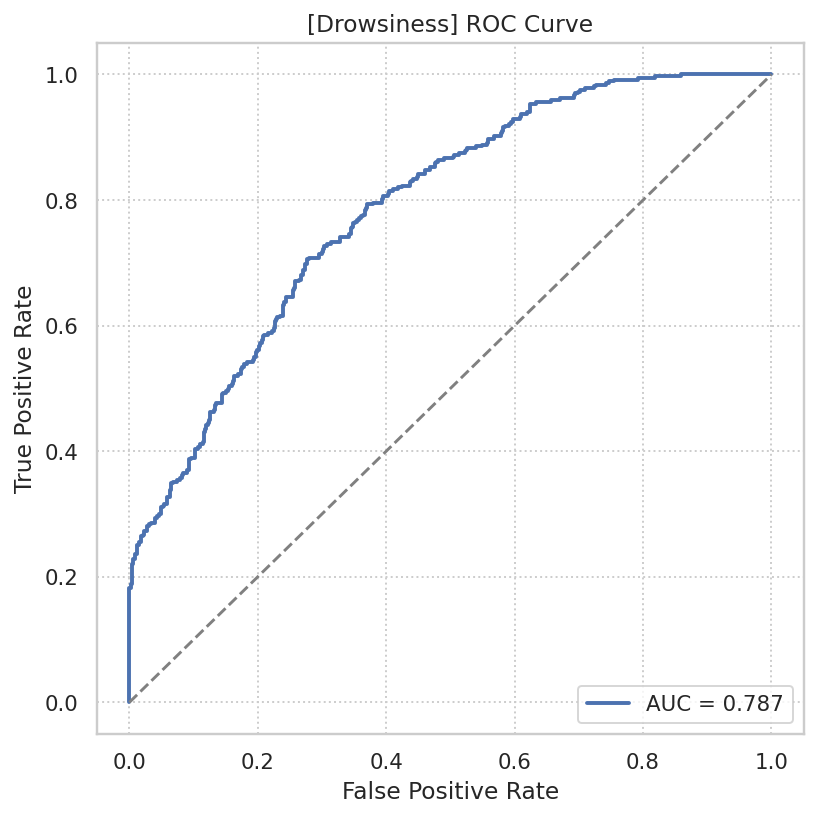

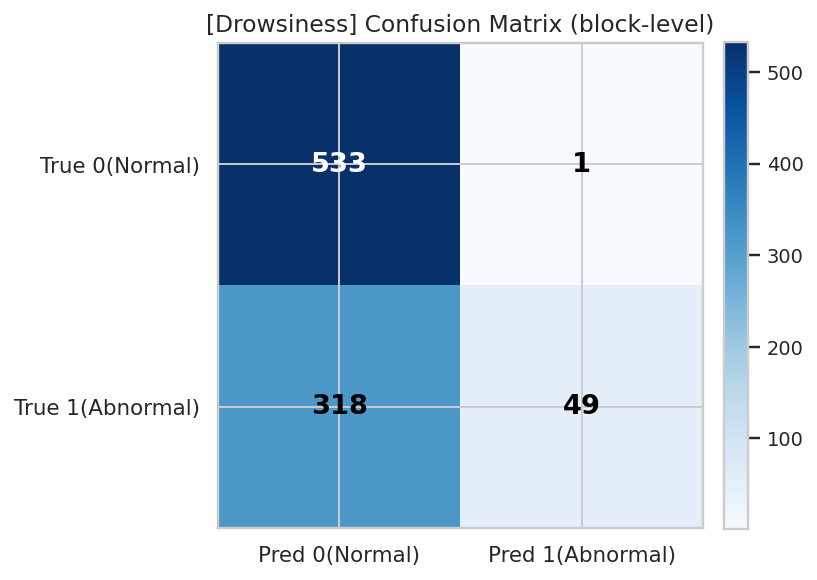


[Classification Report]
              precision    recall  f1-score   support

   Normal(0)     0.6263    0.9981    0.7697       534
 Abnormal(1)     0.9800    0.1335    0.2350       367

    accuracy                         0.6459       901
   macro avg     0.8032    0.5658    0.5023       901
weighted avg     0.7704    0.6459    0.5519       901

[Counts] TN=533, FP=1, FN=318, TP=49
[Scores] ACC=0.646  P=0.980  R=0.134  F1=0.235

[SAVED] ROC  → /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/block_eval_roc.png
[SAVED] ConfMat → /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/block_eval_confmat.png


In [47]:
# 48번셀=========================================
# Block-level ROC & Confusion Matrix (가독성 강화판)
#  - 입력: block_level_dataset.csv
#  - 평가 단위: "블록" (비디오 집계 아님)
#  - GT: video_id가 test_*이면 1, train_*이면 0 (블록마다 부여)
#  - 출력: ROC 곡선, 혼돈행렬(숫자 가독성 자동), 분류리포트
# =========================================
import os, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import (
    roc_curve, auc, confusion_matrix, classification_report,
    accuracy_score, precision_score, recall_score, f1_score
)

warnings.filterwarnings("ignore")
np.set_printoptions(suppress=True)

# -----------------------------
# 1) 경로/입력 로드
# -----------------------------
BASE_DIR  = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink"
STAT_DIR  = os.path.join(BASE_DIR, "dataset/outputs/denoising_analysis_results")
os.makedirs(STAT_DIR, exist_ok=True)

BLOCK_CSV = os.path.join(STAT_DIR, "block_level_dataset.csv")
ROC_PNG   = os.path.join(STAT_DIR, "block_eval_roc.png")
CM_PNG    = os.path.join(STAT_DIR, "block_eval_confmat.png")

if not os.path.isfile(BLOCK_CSV):
    raise FileNotFoundError(f"[ERR] block_level_dataset.csv가 없습니다: {BLOCK_CSV}")

df = pd.read_csv(BLOCK_CSV)
print(f"[LOAD] block_df: {len(df)} rows")

# -----------------------------
# 2) 안전성 체크 & 기본 전처리 (블록 단위)
# -----------------------------
need = {"video_id","sleepy_label"}
missing = need - set(df.columns)
if missing:
    raise ValueError(f"[ERR] 필요한 컬럼 누락: {sorted(missing)}")

df["sleepy_label"] = pd.to_numeric(df["sleepy_label"], errors="coerce").fillna(0).astype(int)

# 선택 점수(있으면 ROC에 사용)
for c in ["prob_1","recon_err_mean","outlier_ratio"]:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

# -----------------------------
# 3) GT(블록 단위) 구성
#   - train_* → 0, test_* → 1
# -----------------------------
def gt_from_videoid(vid: str) -> int:
    s = str(vid)
    if s.startswith("train_"): return 0
    if s.startswith("test_"):  return 1
    return -1

df["gt_label"] = df["video_id"].apply(gt_from_videoid)
df = df[df["gt_label"].isin([0,1])].copy()  # 알 수 없는 비디오는 제외

y_true = df["gt_label"].to_numpy(int)
y_pred = df["sleepy_label"].to_numpy(int)

# 점수 자동 우선순위
score_col = None
for cand in ["prob_1","recon_err_mean","outlier_ratio"]:
    if cand in df.columns:
        score_col = cand
        break
y_score = None if score_col is None else df[score_col].fillna(0).to_numpy(float)

print(f"[INFO] 블록 평가 표본수: {len(df)} (Normal={int((y_true==0).sum())}, Abnormal={int((y_true==1).sum())})")
print(f"[INFO] 사용 점수 컬럼: {score_col if score_col else '(없음 → ROC 단일 포인트)'}")

# -----------------------------
# 4) 플롯 유틸 (가독성 강화 혼동행렬)
# -----------------------------
def _auto_text_color(value, vmax, dark_thresh=0.6):
    """셀 밝기에 따라 텍스트 흰/검 자동 전환."""
    if vmax is None or vmax <= 0:
        return "black"
    ratio = 0.0 if value is None else float(value)/float(vmax)
    return "white" if ratio >= dark_thresh else "black"

def plot_roc_and_confusion(
    y_true, y_pred, y_score=None,
    title_prefix="[Block Eval] ",
    cmap="Blues", dpi=140,
    normalize=None,        # None, 'true', 'pred', 'all' 중 택1
    vmin=None, vmax=None,  # 진하기 수동 제어하려면 지정
    value_fontsize=14, value_bold=True, auto_text=True,
    save_roc=None, save_cm=None
):
    # ===== ROC =====
    if y_score is None:
        print("[WARN] y_score가 없어 ROC은 이진 예측 단일포인트로 표시됩니다.")
        fpr, tpr, thr = np.array([0,1]), np.array([0,1]), np.array([0.5])
        roc_auc = 0.5
    else:
        fpr, tpr, thr = roc_curve(y_true, y_score)
        roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6, 6), dpi=dpi)
    plt.plot(fpr, tpr, linewidth=2, label=f"AUC = {roc_auc:.3f}")
    plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{title_prefix}ROC Curve")
    plt.legend(loc="lower right")
    plt.grid(True, linestyle=":")
    plt.tight_layout()
    if save_roc: plt.savefig(save_roc, dpi=dpi)
    plt.show()

    # ===== Confusion Matrix =====
    labels = [0,1]
    cm = confusion_matrix(y_true, y_pred, labels=labels).astype(float)

    # 정규화 옵션
    cm_show = cm.copy()
    if normalize == "true":
        denom = cm_show.sum(axis=1, keepdims=True); denom[denom==0]=1
        cm_show = cm_show / denom
    elif normalize == "pred":
        denom = cm_show.sum(axis=0, keepdims=True); denom[denom==0]=1
        cm_show = cm_show / denom
    elif normalize == "all":
        total = cm_show.sum(); total = total if total>0 else 1
        cm_show = cm_show / total

    vmin_use = np.min(cm_show) if vmin is None else vmin
    vmax_use = (np.max(cm_show) if np.max(cm_show)>0 else 1.0) if vmax is None else vmax

    plt.figure(figsize=(6, 5.6), dpi=dpi)
    im = plt.imshow(cm_show, interpolation="nearest", cmap=cmap, vmin=vmin_use, vmax=vmax_use)
    plt.title(f"{title_prefix}Confusion Matrix (block-level)")
    plt.xticks([0,1], ["Pred 0(Normal)","Pred 1(Abnormal)"])
    plt.yticks([0,1], ["True 0(Normal)","True 1(Abnormal)"])

    # 값 표기(정규화 여부 따라 포맷 변경)
    show_float = normalize in ("true","pred","all")
    for i in range(2):
        for j in range(2):
            val = cm_show[i, j]
            raw = int(cm[i, j])
            txt = f"{val:.3f}" if show_float else f"{raw}"
            color = _auto_text_color(val, vmax_use) if auto_text else "black"
            weight = "bold" if value_bold else "normal"
            plt.text(j, i, txt, ha="center", va="center",
                     fontsize=value_fontsize, color=color, fontweight=weight)

    cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=10)
    plt.tight_layout()
    if save_cm: plt.savefig(save_cm, dpi=dpi)
    plt.show()

    # 리포트/지표
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=labels).ravel()
    ACC = accuracy_score(y_true, y_pred)
    P   = precision_score(y_true, y_pred, zero_division=0)
    R   = recall_score(y_true, y_pred, zero_division=0)
    F1  = f1_score(y_true, y_pred, zero_division=0)

    print("\n[Classification Report]")
    print(classification_report(y_true, y_pred, target_names=["Normal(0)","Abnormal(1)"], digits=4, zero_division=0))
    print(f"[Counts] TN={int(tn)}, FP={int(fp)}, FN={int(fn)}, TP={int(tp)}")
    print(f"[Scores] ACC={ACC:.3f}  P={P:.3f}  R={R:.3f}  F1={F1:.3f}")

# -----------------------------
# 5) 실행
#   - 진하기가 너무 진하면 normalize='true' 또는 vmax를 줄여서 사용
#   - 예) normalize='all'로 비율표시, vmax=0.8 등
# -----------------------------
plot_roc_and_confusion(
    y_true, y_pred, y_score=y_score,
    title_prefix="[Drowsiness] ",
    cmap="Blues", dpi=140,
    normalize=None,        # 'true' / 'pred' / 'all' 로 바꾸면 비율표시
    vmin=None, vmax=None,  # 진하기 조정 원하면 예: vmax=cm.max()*0.85
    value_fontsize=14, value_bold=True, auto_text=True,
    save_roc=ROC_PNG, save_cm=CM_PNG
)

print(f"\n[SAVED] ROC  → {ROC_PNG}")
print(f"[SAVED] ConfMat → {CM_PNG}")



[INFO] ==== Visualize 50 Representative Frames from Sleepy Blocks ====
[INFO] sleepy_label=1 블록 총 49개
[INFO] 대표 프레임 49개 출력합니다.


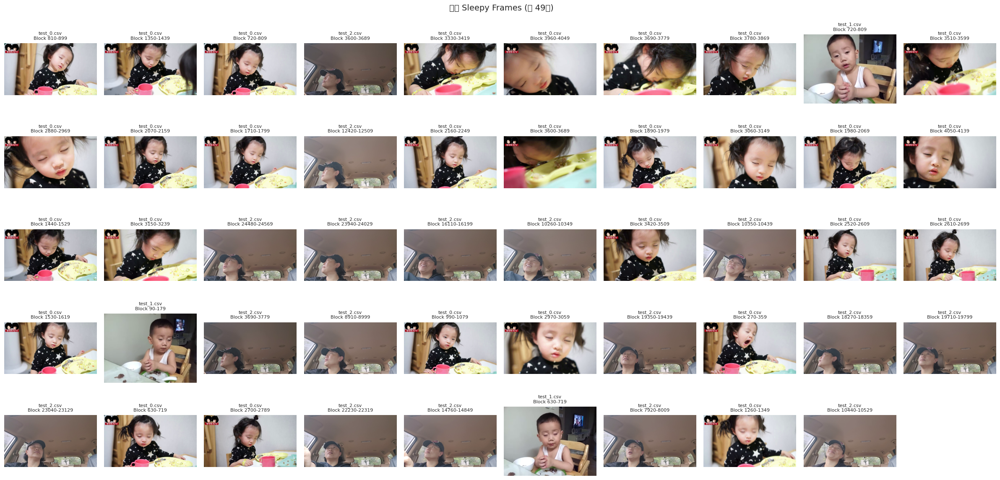


대표 프레임 50장 시각화 완료.


In [48]:
# 49번셀============================================================
# 졸음(sleepy_label=1) 블록의 대표 프레임 50장 시각화
#    - 각 블록에서 중앙 프레임 1장 추출
# ============================================================
import cv2
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np

print("\n[INFO] ==== Visualize 50 Representative Frames from Sleepy Blocks ====")

# -------------------------------------------
# 1) sleepy_label==1 이고 test_* 인 블록만 선택
# -------------------------------------------
sleep_df = block_df[(block_df["sleepy_label"] == 1) &
                    (block_df["video_id"].str.startswith("test_"))].copy()

print(f"[INFO] sleepy_label=1 블록 총 {len(sleep_df)}개")

if sleep_df.empty:
    print("⚠️ sleepy(1) 블록이 없습니다. 시각화를 종료합니다.")
else:
    # 재구성오차 큰 순서 or blockIdx 순서
    if "recon_err_mean" in sleep_df.columns:
        sleep_df = sleep_df.sort_values(
            ["recon_err_mean", "video_id", "start_idx"],
            ascending=[False, True, True]
        )
    else:
        sleep_df = sleep_df.sort_values(["video_id", "start_idx"])

    # -------------------------------------------
    # 2) 대표 프레임 50개만 선택
    # -------------------------------------------
    N_SHOW = min(50, len(sleep_df))
    sleep_df_show = sleep_df.head(N_SHOW)

    print(f"[INFO] 대표 프레임 {N_SHOW}개 출력합니다.")

    # -------------------------------------------
    # 3) 비디오 파일 찾기
    # -------------------------------------------
    VIDEO_ROOT = Path("/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/videos")
    VIDEO_EXTS = [".mp4", ".avi", ".mov", ".mkv"]

    def find_video_path(video_id: str):
        stem = Path(video_id).stem
        for ext in VIDEO_EXTS:
            p = VIDEO_ROOT / f"{stem}{ext}"
            if p.exists():
                return p
        return None

    # -------------------------------------------
    # 4) 대표 프레임(블록 중앙 프레임) 읽기
    # -------------------------------------------
    frames = []
    titles = []

    for idx, r in sleep_df_show.iterrows():
        vid = r["video_id"]
        start = int(r["start_idx"])
        end   = int(r["end_idx"])
        mid   = start + (end - start) // 2  # 중앙프레임

        vpath = find_video_path(vid)
        if vpath is None:
            print(f"[WARN] 영상 없음: {vid}")
            continue

        cap = cv2.VideoCapture(str(vpath))
        cap.set(cv2.CAP_PROP_POS_FRAMES, mid)
        ok, frame = cap.read()
        cap.release()

        if not ok or frame is None:
            print(f"[WARN] 중앙 프레임 읽기 실패: {vid}, frame={mid}")
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame_rgb)
        titles.append(f"{vid}\nBlock {start}-{end}")

    # -------------------------------------------
    # 5) 50개 대표프레임을 5x10 그리드로 시각화
    # -------------------------------------------
    n = len(frames)
    cols = 10
    rows = int(np.ceil(n / cols))

    plt.figure(figsize=(cols * 2.4, rows * 2.4))

    for i in range(n):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(frames[i])
        plt.title(titles[i], fontsize=8)
        plt.axis("off")

    plt.suptitle(f" 대표 Sleepy Frames (총 {n}개)", fontsize=14)
    plt.tight_layout()
    plt.show()

    print("\n대표 프레임 50장 시각화 완료.")


In [49]:
# 50번셀 =========================
# 3. 군집분석 (KMeans, k=2) + 시각화 (안전 hover + 품질 요약)
# =========================
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px

print("\n[STEP B] 군집분석(KMeans) 시작")

assert 'block_df' in globals(), "block_df가 메모리에 있어야 합니다."

FEATURE_COLS_RAW = [
    'tilt_diff_ratio',
    'open_sum',
    'both_open_run',
    'one_closed_run',
    'both_closed_run'
]

# 군집 피처: outlier_count, recon_err_mean + 각 원시 피처의 mean
cluster_feats = (
    ["outlier_count", "recon_err_mean"]
    + [f"{c}_mean" for c in FEATURE_COLS_RAW]
)

# 실제 존재하는 컬럼만 사용
use_feats = [c for c in cluster_feats if c in block_df.columns]
if len(use_feats) < 3:
    raise ValueError(f"군집에 사용할 피처가 너무 적습니다. 확인 필요: {cluster_feats}")

X = block_df[use_feats].astype(float).fillna(0.0).values

# 표준화
scaler_cluster = StandardScaler()
Xz = scaler_cluster.fit_transform(X)

# KMeans(k=2)
kmeans = KMeans(n_clusters=2, random_state=42, n_init=20)
block_df["cluster_k2"] = kmeans.fit_predict(Xz)

# ===== PCA 3D =====
pca3 = PCA(n_components=3, random_state=42)
pca_xyz = pca3.fit_transform(Xz)
block_df["pca1"], block_df["pca2"], block_df["pca3"] = pca_xyz[:,0], pca_xyz[:,1], pca_xyz[:,2]

# hover 데이터: 실제 존재하는 컬럼만 안전하게 전달
candidate_hovers = [
    "video_id", "start_idx", "end_idx",
    "outlier_count", "recon_err_mean",
    "sleepy_label", "cluster_k2"
]
hover_cols = [c for c in candidate_hovers if c in block_df.columns]

fig_pca = px.scatter_3d(
    block_df,
    x="pca1", y="pca2", z="pca3",
    color=block_df["cluster_k2"].astype(str),      # 클러스터 색
    symbol=block_df["sleepy_label"].astype(str) if "sleepy_label" in block_df.columns else None,
    size="outlier_count" if "outlier_count" in block_df.columns else None,
    hover_data=hover_cols,
    title="KMeans Clusters (PCA 3D Interactive)",
    labels={"cluster_k2": "Cluster", "sleepy_label": "Sleepy Label"}
)
fig_pca.update_traces(marker=dict(opacity=0.7))
fig_pca.update_layout(
    legend_title_text="cluster / sleepy",
    scene=dict(xaxis_title="PCA1", yaxis_title="PCA2", zaxis_title="PCA3")
)
fig_pca.show()

# ===== t-SNE 3D =====
tsne3 = TSNE(
    n_components=3,
    perplexity=min(30, max(5, int(len(block_df) * 0.1))),  # 표본 수에 따라 합리적 설정
    learning_rate='auto',
    init='pca',
    random_state=42
)
tsne_xyz = tsne3.fit_transform(Xz)
block_df["tsne1"], block_df["tsne2"], block_df["tsne3"] = tsne_xyz[:,0], tsne_xyz[:,1], tsne_xyz[:,2]

fig_tsne = px.scatter_3d(
    block_df,
    x="tsne1", y="tsne2", z="tsne3",
    color=block_df["cluster_k2"].astype(str),
    symbol=block_df["sleepy_label"].astype(str) if "sleepy_label" in block_df.columns else None,
    size="outlier_count" if "outlier_count" in block_df.columns else None,
    hover_data=hover_cols,
    title="KMeans Clusters (t-SNE 3D Interactive)",
    labels={"cluster_k2": "Cluster", "sleepy_label": "Sleepy Label"}
)
fig_tsne.update_traces(marker=dict(opacity=0.7))
fig_tsne.update_layout(
    legend_title_text="cluster / sleepy",
    scene=dict(xaxis_title="t-SNE1", yaxis_title="t-SNE2", zaxis_title="t-SNE3")
)
fig_tsne.show()

# ===== 클러스터 ↔ 라벨 정합도 간단 요약 =====
if "sleepy_label" in block_df.columns:
    tmp = block_df.groupby("cluster_k2")["sleepy_label"].value_counts().unstack(fill_value=0)
    print("\n[클러스터 라벨 분포]")
    print(tmp)
    # 간이 purity
    purity = (tmp.max(axis=1).sum()) / tmp.values.sum()
    print(f"[Purity] {purity:.3f}")
else:
    print("\n[sleepy_label 없음] 라벨 정합도 요약은 생략합니다.")



[STEP B] 군집분석(KMeans) 시작



[클러스터 라벨 분포]
sleepy_label    0   1
cluster_k2           
0             841  11
1              10  39
[Purity] 0.977


In [50]:
# 51번셀
import pandas as pd
import numpy as np

if 'block_df' in globals() and block_df is not None and 'cluster_k2' in block_df.columns and 'sleepy_label' in block_df.columns:
    print("\n### `cluster_k2` vs `sleepy_label` Cross-tabulation\n")
    crosstab_result = pd.crosstab(block_df['cluster_k2'], block_df['sleepy_label'])
    display(crosstab_result)
else:
    print("데이터프레임 'block_df'가 로드되지 않았거나 필요한 컬럼('cluster_k2', 'sleepy_label')이 없습니다. 이전 셀들을 실행해주세요.")


### `cluster_k2` vs `sleepy_label` Cross-tabulation



sleepy_label,0,1
cluster_k2,,
0,841,11
1,10,39


In [51]:
# 52번셀
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

if 'block_df' in globals() and block_df is not None and 'cluster_k2' in block_df.columns and 'sleepy_label' in block_df.columns:
    y_true = block_df['sleepy_label']
    y_pred = block_df['cluster_k2']

    if len(np.unique(y_true)) > 1 and len(np.unique(y_pred)) > 1:
        ari = adjusted_rand_score(y_true, y_pred)
        nmi = normalized_mutual_info_score(y_true, y_pred)
        print(f"Adjusted Rand Index (ARI): {ari:.4f}")
        print(f"Normalized Mutual Information (NMI): {nmi:.4f}")
    else:
        print("클러스터링 평가 지표를 계산하기에 충분한 유니크 라벨/클러스터가 없습니다.")
else:
    print("데이터프레임 'block_df'가 로드되지 않았거나 필요한 컬럼('cluster_k2', 'sleepy_label')이 없습니다. 이전 셀들을 실행해주세요.")

Adjusted Rand Index (ARI): 0.7553
Normalized Mutual Information (NMI): 0.5716


In [52]:
# 53번셀 =========================
# 군집 평가 지표: Silhouette / Davies–Bouldin / Calinski–Harabasz
# =========================
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import (
    silhouette_score, silhouette_samples,
    davies_bouldin_score, calinski_harabasz_score
)

assert 'block_df' in globals(), "block_df가 필요합니다."
assert 'cluster_k2' in block_df.columns, "block_df['cluster_k2']가 필요합니다."

# 1) 평가 좌표 X_eval 확보: PCA(우선) → t-SNE → 즉석 PCA 재계산
X_eval = None
used_coords = None

if set(['pca1','pca2','pca3']).issubset(block_df.columns):
    X_eval = block_df[['pca1','pca2','pca3']].to_numpy(dtype=float)
    used_coords = 'PCA(기존)'
elif set(['tsne1','tsne2','tsne3']).issubset(block_df.columns):
    X_eval = block_df[['tsne1','tsne2','tsne3']].to_numpy(dtype=float)
    used_coords = 't-SNE(기존)'
else:
    # 즉석 PCA 3D 재계산 (cluster_feats는 이전 셀(#34) 정의와 동일한 규칙)
    FEATURE_COLS_RAW = [
        'tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run'
    ]
    cluster_feats = ["outlier_count","recon_err_mean"] + [f"{c}_mean" for c in FEATURE_COLS_RAW]
    use_feats = [c for c in cluster_feats if c in block_df.columns]
    if len(use_feats) < 3:
        raise ValueError(f"PCA를 만들 피처가 부족합니다. 필요 후보: {cluster_feats}")
    X0 = block_df[use_feats].astype(float).fillna(0.0).to_numpy()
    X0z = StandardScaler().fit_transform(X0)
    pca = PCA(n_components=3, random_state=42)
    pca_xyz = pca.fit_transform(X0z)
    block_df['pca1'], block_df['pca2'], block_df['pca3'] = pca_xyz[:,0], pca_xyz[:,1], pca_xyz[:,2]
    X_eval = pca_xyz
    used_coords = 'PCA(즉석 재계산)'

labels_eval = block_df['cluster_k2'].to_numpy()

# 2) NaN/Inf 제거 (양쪽 동시 필터)
mask_finite = np.isfinite(X_eval).all(axis=1) & np.isfinite(labels_eval)
X_eval = X_eval[mask_finite]
labels_eval = labels_eval[mask_finite]

# 3) 표본/군집 체크
uniq, counts = np.unique(labels_eval, return_counts=True)
print(f"[INFO] 평가 좌표: {used_coords}, 샘플수={len(labels_eval)}, 군집분포={dict(zip(uniq.tolist(), counts.tolist()))}")

if len(uniq) < 2 or X_eval.shape[0] < 2:
    print("군집 평가 불가: 클러스터가 2개 미만이거나 표본이 부족합니다.")
else:
    # 실루엣: 군집마다 최소 2개 표본이어야 안정적
    if counts.min() < 2:
        print("경고: 어떤 클러스터는 표본 수가 1개입니다. 실루엣 점수 신뢰도 낮음.")

    # 4) 지표 계산
    try:
        sil = silhouette_score(X_eval, labels_eval)
        print(f"Silhouette Score     : {sil:.4f}")
        # 군집별 평균 실루엣도(선택)
        try:
            s_samples = silhouette_samples(X_eval, labels_eval)
            for c in uniq:
                m = float(np.mean(s_samples[labels_eval==c]))
                print(f"  - mean silhouette (cluster {c}): {m:.4f}")
        except Exception as e_samp:
            print(f"  (참고) silhouette 샘플 계산 스킵: {e_samp}")
    except Exception as e:
        print(f"Silhouette 계산 실패: {e}")

    try:
        dbi = davies_bouldin_score(X_eval, labels_eval)
        print(f"Davies–Bouldin Index : {dbi:.4f}  (낮을수록 좋음)")
    except Exception as e:
        print(f"Davies–Bouldin 계산 실패: {e}")

    try:
        chi = calinski_harabasz_score(X_eval, labels_eval)
        print(f"Calinski–Harabasz    : {chi:.2f}  (높을수록 좋음)")
    except Exception as e:
        print(f"Calinski–Harabasz 계산 실패: {e}")


[INFO] 평가 좌표: PCA(기존), 샘플수=901, 군집분포={0: 852, 1: 49}
Silhouette Score     : 0.7133
  - mean silhouette (cluster 0): 0.7328
  - mean silhouette (cluster 1): 0.3757
Davies–Bouldin Index : 0.6443  (낮을수록 좋음)
Calinski–Harabasz    : 648.09  (높을수록 좋음)


In [53]:
# 54번셀
import pandas as pd
from pathlib import Path

# 원본 경로
path = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/block_level_dataset.csv"
out_path = str(Path(path).with_name("block_level_dataset_with_dependent.csv"))

# 로드
block_df = pd.read_csv(path)
print("[LOAD]", block_df.shape)

# 안전 체크
assert "sleepy_label" in block_df.columns, "sleepy_label 컬럼이 필요합니다 (정상=0, 졸음=1)."

# 종속변수(dependent) 추가: 졸음=1, 정상=0
# 이미 sleepy_label이 0/1이면 그대로 캐스팅
block_df["dependent"] = block_df["sleepy_label"].astype("int8")

# 저장
block_df.to_csv(out_path, index=False)
print(f"[SAVE] with dependent -> {out_path}")

# 라벨 분포 확인
print("\n[Label Distribution]")
print(block_df["dependent"].value_counts(dropna=False).rename({0:"awake(0)", 1:"sleepy(1)"}))

# (선택) 비디오 단위 요약 재계산(참고용)
video_group = block_df.groupby("video_id").agg(
    total_frames = ("dependent", "count"),
    sleepy_count = ("dependent", "sum"),
    awake_count  = ("dependent", lambda x: (x==0).sum()),
    sleepy_ratio = ("dependent", "mean")
).reset_index()

print("\n[Per-Video Summary]")
display(video_group.head())


[LOAD] (901, 28)
[SAVE] with dependent -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/block_level_dataset_with_dependent.csv

[Label Distribution]
dependent
awake(0)     851
sleepy(1)     50
Name: count, dtype: int64

[Per-Video Summary]


,video_id,total_frames,sleepy_count,awake_count,sleepy_ratio
0,test_0.csv,46,29,17,0.630435
1,test_1.csv,11,3,8,0.272727
2,test_2.csv,310,17,293,0.054839
3,train_0.csv,305,1,304,0.003279
4,train_1.csv,141,0,141,0.000000


In [54]:
# 55번셀
import pandas as pd

path = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/block_level_dataset.csv"

block_df = pd.read_csv(path)
print(block_df.shape)
block_df.head()

block_df.describe().T
video_group = block_df.groupby("video_id").agg(
    total_frames = ("sleepy_label", "count"),
    sleepy_count = ("sleepy_label", "sum"),
    awake_count  = ("sleepy_label", lambda x: (x==0).sum()),
    sleepy_ratio = ("sleepy_label", "mean")
).reset_index()

video_group

(901, 28)


,video_id,total_frames,sleepy_count,awake_count,sleepy_ratio
0,test_0.csv,46,29,17,0.630435
1,test_1.csv,11,3,8,0.272727
2,test_2.csv,310,17,293,0.054839
3,train_0.csv,305,1,304,0.003279
4,train_1.csv,141,0,141,0.000000
5,train_2.csv,88,0,88,0.000000


In [55]:
# 56번셀 ===============================
# Part A: Surrogate Regression (전체 데이터 대상)
# ===============================
import os, time, joblib
import numpy as np
import pandas as pd
import shap
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor

# ==== 경로 ====
OUT_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results"
os.makedirs(OUT_DIR, exist_ok=True)
REG_MODEL_PATH = os.path.join(OUT_DIR, "surrogate_rf.joblib")
REG_SHAP_PATH  = os.path.join(OUT_DIR, "surrogate_shap_importance.csv")
REG_ABL_PATH   = os.path.join(OUT_DIR, "surrogate_dropone.csv")

# ==== 준비 체크 ====
assert 'block_df' in globals(), "block_df 먼저 준비하세요."
assert 'recon_err_mean' in block_df.columns, "block_df에 recon_err_mean 컬럼이 필요합니다."

# ==== 스키마 유틸 ====
def build_feature_schema(raw_cols, use_mean=True, use_std=True, use_max=True):
    feats=[]
    if use_mean: feats += [f"{c}_mean" for c in raw_cols]
    if use_std:  feats += [f"{c}_std"  for c in raw_cols]
    if use_max:  feats += [f"{c}_max"  for c in raw_cols]
    return feats

# ==== 0) 원변수 5개 지정 & 요약통계는 mean/std/max만 사용(강제) ====
RAW_COLS = [
    'tilt_diff_ratio',
    'open_sum',
    'both_open_run',
    'one_closed_run',
    'both_closed_run'
]
USE_MEAN, USE_STD, USE_MAX = True, True, True  # <- 평균/편차/최대만

# ==== 1) 전체 데이터 입력/타깃 구성 ====
feat_names_reg = build_feature_schema(RAW_COLS, USE_MEAN, USE_STD, USE_MAX)

# block_df에 실제로 존재하는지 점검
missing = [c for c in feat_names_reg if c not in block_df.columns]
if len(missing) > 0:
    raise KeyError(
        "다음 요약 피처가 block_df에 없습니다. (원변수5개 × mean/std/max만 쓰도록 스키마를 맞춰주세요)\n"
        + "\n".join(missing)
    )

X_reg = block_df[feat_names_reg].astype(float).fillna(0.0).values
y_reg = block_df["recon_err_mean"].astype(float).values

print(f"[INFO] 사용 피처({len(feat_names_reg)}): {feat_names_reg}")

Xtr_reg, Xte_reg, ytr_reg, yte_reg = train_test_split(
    X_reg, y_reg, test_size=0.2, random_state=42
)

# ==== 2) RF 회귀 그리드 서치(가벼운 탐색) ====
rf_reg = RandomForestRegressor(random_state=42, n_jobs=-1)
grid_reg = {
    "n_estimators": [200, 400],
    "max_depth": [None, 10],
    "min_samples_leaf": [1, 3]
}
gs_reg = GridSearchCV(
    rf_reg, grid_reg, scoring="r2", cv=3, n_jobs=-1, refit=True, verbose=0
)

t0=time.time()
gs_reg.fit(Xtr_reg, ytr_reg)
t1=time.time()

best_reg = gs_reg.best_estimator_
pred_tr = best_reg.predict(Xtr_reg)
pred_te = best_reg.predict(Xte_reg)

print(f"[REG] best_params: {gs_reg.best_params_} ({t1-t0:.1f}s)")
print(f"[REG] R2(train)={r2_score(ytr_reg, pred_tr):.3f}  MAE(train)={mean_absolute_error(ytr_reg, pred_tr):.6e}")
print(f"[REG] R2(test) ={r2_score(yte_reg, pred_te):.3f}  MAE(test) ={mean_absolute_error(yte_reg, pred_te):.6e}")

# ==== 3) SHAP 중요도 (서러게이트 기준) ====
try:
    expl_reg = shap.TreeExplainer(best_reg)
    shap_vals_reg = expl_reg.shap_values(Xte_reg)   # (n, f)
    shap_imp_reg = np.mean(np.abs(shap_vals_reg), axis=0)
    shap_imp_reg_df = (
        pd.DataFrame({"feature": feat_names_reg, "mean_abs_SHAP": shap_imp_reg})
        .sort_values("mean_abs_SHAP", ascending=False)
        .reset_index(drop=True)
    )
    print("\n[REG] SHAP 상위 변수")
    print(shap_imp_reg_df.head(10))
except Exception as e:
    shap_imp_reg_df = pd.DataFrame(columns=["feature","mean_abs_SHAP"])
    print("[WARN] REG SHAP skipped:", e)

# ==== 4) Drop-one 가림 Ablation (재학습 X, 평균값 마스킹) ====
base_pred_reg = best_reg.predict(Xte_reg)
abl_rows=[]
col_means = Xte_reg.mean(axis=0)  # 각 피처의 테스트셋 평균

for j, f in enumerate(feat_names_reg):
    X_tmp = Xte_reg.copy()
    X_tmp[:, j] = col_means[j]         # 해당 피처만 평균으로 마스킹
    y_tmp = best_reg.predict(X_tmp)
    delta = y_tmp - base_pred_reg      # (+)면 그 피처 증가가 AE오차↑ 방향의 영향이라는 해석에 도움
    abl_rows.append({
        "feature": f,
        "mean_delta_pred": float(np.mean(delta)),
        "median_delta_pred": float(np.median(delta)),
        "pct95_delta_pred": float(np.percentile(delta, 95))
    })

sur_dropone_df = (
    pd.DataFrame(abl_rows)
    .sort_values("mean_delta_pred", ascending=False)
    .reset_index(drop=True)
)
print("\n[REG] Drop-one 결과 (상위 10개)")
print(sur_dropone_df.head(10))

# ==== 5) 저장 ====
joblib.dump(best_reg, REG_MODEL_PATH)
shap_imp_reg_df.to_csv(REG_SHAP_PATH, index=False)
sur_dropone_df.to_csv(REG_ABL_PATH, index=False)
print("[SAVE] surrogate model:", REG_MODEL_PATH)
print("[SAVE] shap importance:", REG_SHAP_PATH)
print("[SAVE] drop-one table :", REG_ABL_PATH)


[INFO] 사용 피처(15): ['tilt_diff_ratio_mean', 'open_sum_mean', 'both_open_run_mean', 'one_closed_run_mean', 'both_closed_run_mean', 'tilt_diff_ratio_std', 'open_sum_std', 'both_open_run_std', 'one_closed_run_std', 'both_closed_run_std', 'tilt_diff_ratio_max', 'open_sum_max', 'both_open_run_max', 'one_closed_run_max', 'both_closed_run_max']
[REG] best_params: {'max_depth': 10, 'min_samples_leaf': 1, 'n_estimators': 400} (7.9s)
[REG] R2(train)=0.934  MAE(train)=1.250835e-03
[REG] R2(test) =0.777  MAE(test) =2.293742e-03

[REG] SHAP 상위 변수
                feature  mean_abs_SHAP
0   tilt_diff_ratio_std       0.002114
1   tilt_diff_ratio_max       0.001987
2   both_closed_run_max       0.001020
3         open_sum_mean       0.000938
4    both_open_run_mean       0.000594
5  tilt_diff_ratio_mean       0.000416
6  both_closed_run_mean       0.000313
7    one_closed_run_std       0.000215
8   one_closed_run_mean       0.000214
9    one_closed_run_max       0.000178

[REG] Drop-one 결과 (상위 10개)
    

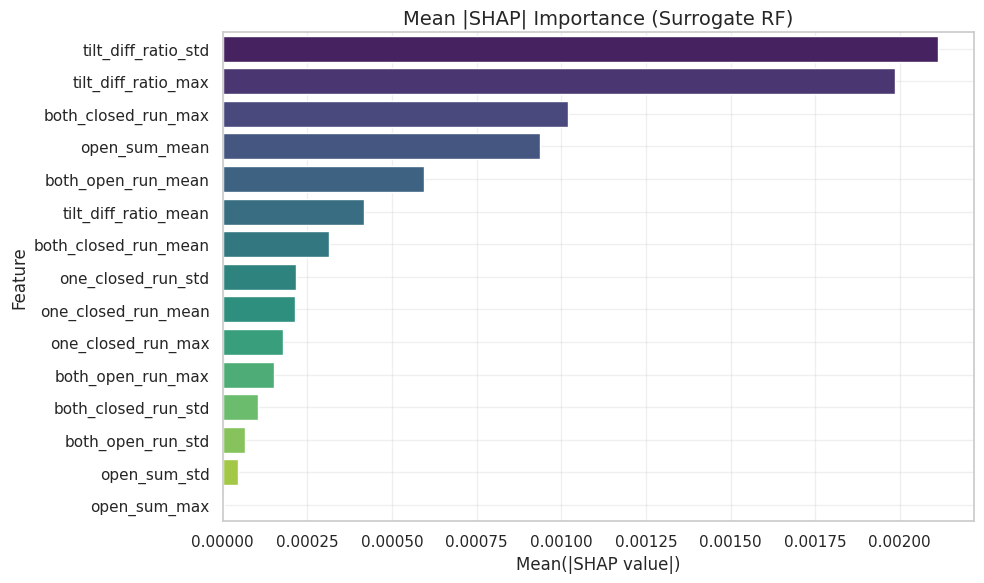

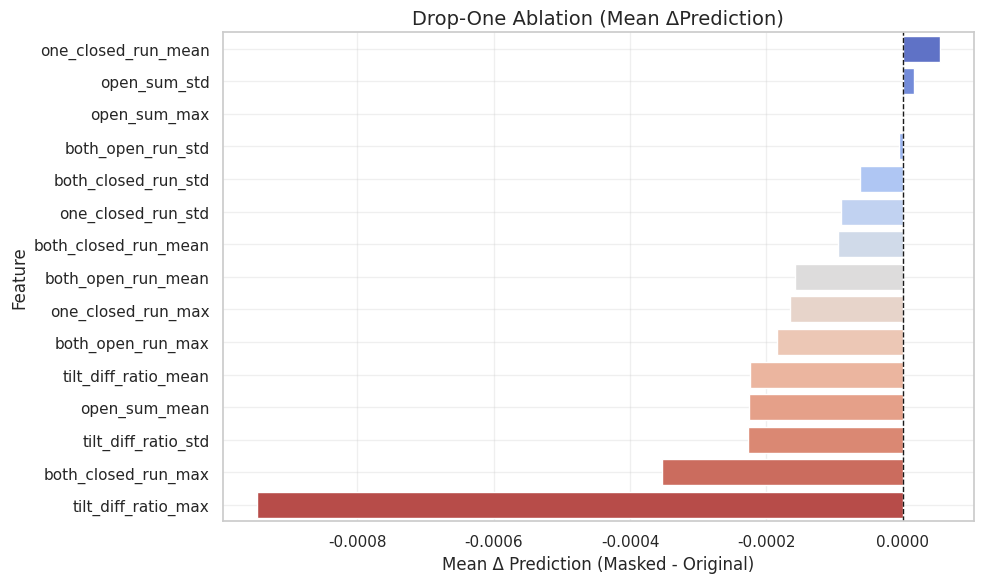

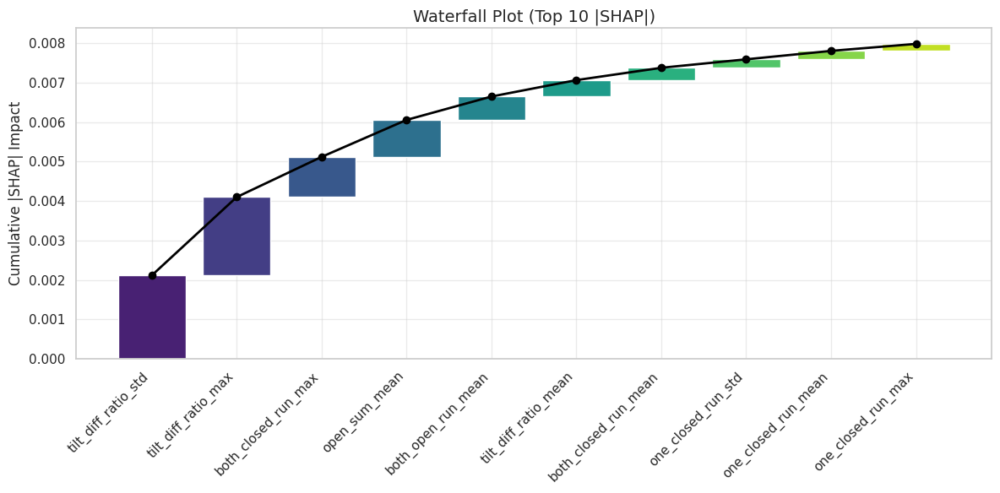


[REG] SHAP 상위 변수
                feature  mean_abs_SHAP
0   tilt_diff_ratio_std       0.002114
1   tilt_diff_ratio_max       0.001987
2   both_closed_run_max       0.001020
3         open_sum_mean       0.000938
4    both_open_run_mean       0.000594
5  tilt_diff_ratio_mean       0.000416
6  both_closed_run_mean       0.000313
7    one_closed_run_std       0.000215
8   one_closed_run_mean       0.000214
9    one_closed_run_max       0.000178


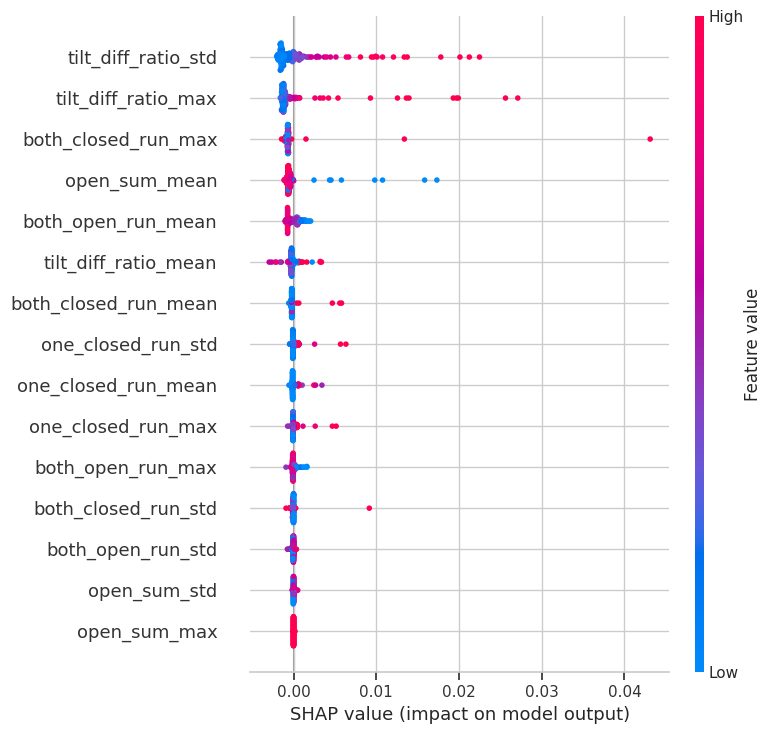

[SAVE] SHAP Summary Plot -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/shap_summary_beeswarm.png


In [56]:
# 57번셀
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# === 1️ SHAP 중요도 막대그래프 ===
plt.figure(figsize=(10,6))
sns.barplot(
    data=shap_imp_reg_df,
    x="mean_abs_SHAP",
    y="feature",
    palette="viridis"
)
plt.title("Mean |SHAP| Importance (Surrogate RF)", fontsize=14)
plt.xlabel("Mean(|SHAP value|)")
plt.ylabel("Feature")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


# === 2️ Drop-one Ablation 결과 막대그래프 ===
plt.figure(figsize=(10,6))
sns.barplot(
    data=sur_dropone_df,
    x="mean_delta_pred",
    y="feature",
    palette="coolwarm"
)
plt.title("Drop-One Ablation (Mean ΔPrediction)", fontsize=14)
plt.xlabel("Mean Δ Prediction (Masked - Original)")
plt.ylabel("Feature")
plt.axvline(0, color='k', linestyle='--', linewidth=1)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


# === 3️ 폭포수 도표 (Waterfall Plot) ===
# 상위 10개 변수만 시각화
topN = 10
waterfall_df = shap_imp_reg_df.head(topN).copy()
base_value = 0
values = waterfall_df["mean_abs_SHAP"].values
features = waterfall_df["feature"].values

cumulative = np.cumsum(values)
prev_cum = np.concatenate(([0], cumulative[:-1]))

plt.figure(figsize=(12,6))
for i in range(topN):
    plt.bar(features[i], values[i], bottom=prev_cum[i],
            color=sns.color_palette("viridis", topN)[i])
plt.plot(np.arange(topN), cumulative, color="black", marker="o", linewidth=2)
plt.title(f"Waterfall Plot (Top {topN} |SHAP|)", fontsize=14)
plt.ylabel("Cumulative |SHAP| Impact")
plt.xticks(rotation=45, ha='right')
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()

# ==== 3) SHAP 중요도 (서러게이트 기준) ====
try:
    expl_reg = shap.TreeExplainer(best_reg)

    # 🔹 1) SHAP 값 계산 (이미 네 코드에 있던 부분)
    shap_vals_reg = expl_reg.shap_values(Xte_reg)   # (n, f)

    shap_imp_reg = np.mean(np.abs(shap_vals_reg), axis=0)
    shap_imp_reg_df = (
        pd.DataFrame({"feature": feat_names_reg, "mean_abs_SHAP": shap_imp_reg})
        .sort_values("mean_abs_SHAP", ascending=False)
        .reset_index(drop=True)
    )
    print("\n[REG] SHAP 상위 변수")
    print(shap_imp_reg_df.head(10))

    # =========================================================
    # 🔹 2) SHAP Summary Plot (Beeswarm) 추가된 부분
    # =========================================================
    # Xte_reg 을 DataFrame 으로 변환
    Xte_reg_df = pd.DataFrame(Xte_reg, columns=feat_names_reg)

    plt.figure(figsize=(9, 5))
    shap.summary_plot(
        shap_vals_reg,      # SHAP values
        Xte_reg_df,         # 입력 DataFrame
        feature_names=feat_names_reg,
        show=True
    )
    plt.tight_layout()

    out_png = os.path.join(OUT_DIR, "shap_summary_beeswarm.png")
    plt.savefig(out_png, dpi=150, bbox_inches="tight")
    plt.close()

    print(f"[SAVE] SHAP Summary Plot -> {out_png}")

except Exception as e:
    shap_imp_reg_df = pd.DataFrame(columns=["feature","mean_abs_SHAP"])
    print("[WARN] REG SHAP skipped:", e)


[LOAD] block_df: (901, 28)
[INFO] Target column = 'dependent' (0=awake, 1=sleepy)
[INFO] Base Features (18): ['tilt_diff_ratio_mean', 'tilt_diff_ratio_std', 'tilt_diff_ratio_max', 'open_sum_mean', 'open_sum_std', 'open_sum_max', 'both_open_run_mean', 'both_open_run_std', 'both_open_run_max', 'one_closed_run_mean', 'one_closed_run_std', 'one_closed_run_max', 'both_closed_run_mean', 'both_closed_run_std', 'both_closed_run_max', 'recon_err_mean', 'recon_err_max', 'outlier_count']
[INFO] Features (+derived) (22): ['tilt_diff_ratio_mean', 'tilt_diff_ratio_std', 'tilt_diff_ratio_max', 'open_sum_mean', 'open_sum_std', 'open_sum_max', 'both_open_run_mean', 'both_open_run_std', 'both_open_run_max', 'one_closed_run_mean', 'one_closed_run_std', 'one_closed_run_max', 'both_closed_run_mean', 'both_closed_run_std', 'both_closed_run_max', 'recon_err_mean', 'recon_err_max', 'outlier_count', 'tilt_err_ratio', 'eye_close_ratio', 'open_sum_cv', 'closed_var_ratio']
[INFO] Train=720, Test=181 | Pos(train)=

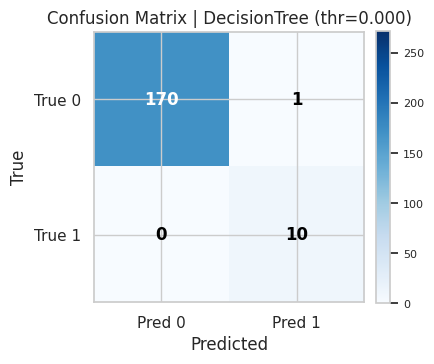

[SAVE] Confusion Matrix -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/cls_best/confusion_matrix_decisiontree.png
[XAI] Try SHAP(TreeExplainer) for DecisionTree
[XAI] SHAP matrix shape = (362, 26)
[XAI] SHAP importance saved -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/cls_best/decisiontree_importance_shap.csv
[XAI] Permutation importance 계산 시작
[XAI] Permutation importance saved -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/cls_best/decisiontree_importance_perm.csv

[Top-10 Importance (기준: SHAP 있으면 SHAP, 없으면 Permutation)]
                feature  importance
0         outlier_count         0.5
1  tilt_diff_ratio_mean         0.0
2   tilt_diff_ratio_max         0.0
3         open_sum_mean         0.0
4          open_sum_std         0.0
5          open_sum_max         0.0
6    both_open_run_mean         0.0
7     both_open_run_std         0.0
8

In [57]:
# 58번셀 ============================================
# AE 기반 Block-Level Classification + XAI + Ablation (SMOTE + F2)
# - 입력: block_level_dataset.csv (mean/std/max 포함, sleepy_label 존재)
# - 타깃: dependent (없으면 sleepy_label로부터 생성)  <-- ★ 변경 포인트
# - 피처: 5개 원시변수의 mean/std/max + AE(recon_err_mean/max)
#         + 파생(tilt_err_ratio, eye_close_ratio, open_sum_cv, closed_var_ratio)
#         + KMeans 메타(km_dist_c0, km_dist_c1, km_dist_margin, km_cluster_aligned)
# - 모델: DecisionTree / RandomForest / SVM / (옵션)LGBM
# - 산출: 모델비교표, ConfusionMatrix.png, shap_importance.csv, ablation_dropone.csv
# ============================================
import os, time, warnings, joblib
import numpy as np, pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, fbeta_score, roc_auc_score,
                             confusion_matrix, classification_report,
                             precision_recall_curve)
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.inspection import permutation_importance

from imblearn.over_sampling import SMOTE

warnings.filterwarnings("ignore")

# ============================================
# 0) 경로/환경
# ============================================
BASE_DIR = "/content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results"
CSV_PATH = os.path.join(BASE_DIR, "block_level_dataset.csv")
OUT_MODEL_DIR = os.path.join(BASE_DIR, "cls_best")
os.makedirs(OUT_MODEL_DIR, exist_ok=True)

SEED = 42
np.random.seed(SEED)

# ============================================
# 1) 데이터 로드 (+ dependent 보장)
# ============================================
block_df = pd.read_csv(CSV_PATH)
print(f"[LOAD] block_df: {block_df.shape}")

# 타깃 컬럼: dependent 사용, 없으면 sleepy_label에서 생성
if "dependent" not in block_df.columns:
    assert "sleepy_label" in block_df.columns, "dependent도 sleepy_label도 없습니다."
    block_df["dependent"] = block_df["sleepy_label"].astype("int8")
else:
    block_df["dependent"] = block_df["dependent"].astype("int8")

print("[INFO] Target column = 'dependent' (0=awake, 1=sleepy)")
# (참고) sleepy_label이 있다면 일관성 체크 (선택)
if "sleepy_label" in block_df.columns:
    try:
        mismatch = (block_df["dependent"].astype(int) != block_df["sleepy_label"].astype(int)).sum()
        if mismatch > 0:
            print(f"[WARN] dependent vs sleepy_label mismatch: {mismatch} rows (계속 진행)")
    except Exception:
        pass

# ============================================
# 2) 피처 구성 (mean/std/max + AE오차)
# ============================================
RAW = ['tilt_diff_ratio','open_sum','both_open_run','one_closed_run','both_closed_run']
FEATS = []

# mean/std/max
for c in RAW:
    for s in ['mean','std','max']:
        col = f"{c}_{s}"
        if col in block_df.columns:
            FEATS.append(col)

# AE reconstruction error
for ae_c in ['recon_err_mean','recon_err_max']:
    if ae_c in block_df.columns:
        FEATS.append(ae_c)

# (선택) outlier_count가 있으면 분류 피처에 포함
if "outlier_count" in block_df.columns:
    FEATS.append("outlier_count")

print(f"[INFO] Base Features ({len(FEATS)}): {FEATS}")

# ============================================
# 3) 파생변수 추가 (존재하는 컬럼만 생성)
# ============================================
def safe_ratio(n, d):
    n = n.astype("float64")
    d = d.astype("float64")
    return n / (np.abs(d) + 1e-9)

if "recon_err_mean" in block_df.columns and "tilt_diff_ratio_mean" in block_df.columns:
    block_df["tilt_err_ratio"] = safe_ratio(block_df["recon_err_mean"], block_df["tilt_diff_ratio_mean"])

if "one_closed_run_mean" in block_df.columns and "both_open_run_mean" in block_df.columns:
    block_df["eye_close_ratio"] = safe_ratio(block_df["one_closed_run_mean"], block_df["both_open_run_mean"])

if "open_sum_std" in block_df.columns and "open_sum_mean" in block_df.columns:
    block_df["open_sum_cv"] = safe_ratio(block_df["open_sum_std"], block_df["open_sum_mean"])

if "both_closed_run_std" in block_df.columns and "both_closed_run_mean" in block_df.columns:
    block_df["closed_var_ratio"] = safe_ratio(block_df["both_closed_run_std"], block_df["both_closed_run_mean"])

for add_col in ["tilt_err_ratio","eye_close_ratio","open_sum_cv","closed_var_ratio"]:
    if add_col in block_df.columns:
        FEATS.append(add_col)

print(f"[INFO] Features (+derived) ({len(FEATS)}): {FEATS}")

# ============================================
# 4) 분할  <-- ★ 타깃을 dependent로 변경
# ============================================
X_all = block_df[FEATS].fillna(0).astype("float32").values
y_all = block_df["dependent"].astype(int).values
idx_all = np.arange(len(block_df))

X_tr, X_te, y_tr, y_te, idx_tr, idx_te = train_test_split(
    X_all, y_all, idx_all, test_size=0.2, stratify=y_all, random_state=SEED
)
print(f"[INFO] Train={len(y_tr)}, Test={len(y_te)} | Pos(train)={y_tr.sum()} ({y_tr.mean():.3%})")

# ============================================
# 5) KMeans 군집 메타피처 (누수 방지: train에만 적합)
#    cluster_feats = ["outlier_count","recon_err_mean"] + [f"{c}_mean"...]
# ============================================
cluster_feats = []
for base in ["outlier_count","recon_err_mean"]:
    if base in block_df.columns:
        cluster_feats.append(base)
for c in RAW:
    c_mean = f"{c}_mean"
    if c_mean in block_df.columns:
        cluster_feats.append(c_mean)

if len(cluster_feats) == 0:
    raise ValueError("cluster_feats가 비었습니다. block_df 컬럼 확인!")

Z_tr_src = block_df.loc[idx_tr, cluster_feats].fillna(0).values
Z_te_src = block_df.loc[idx_te, cluster_feats].fillna(0).values

sc_cluster = StandardScaler().fit(Z_tr_src)
Z_tr = sc_cluster.transform(Z_tr_src)
Z_te = sc_cluster.transform(Z_te_src)

km = KMeans(n_clusters=2, random_state=SEED, n_init=20).fit(Z_tr)
lab_tr = km.labels_
dist_tr = km.transform(Z_tr)  # (n_tr, 2)
dist_te = km.transform(Z_te)  # (n_te, 2)

# train에서 클러스터 ↔ 라벨 정렬(다수 라벨)
major_for_0 = int(pd.Series(y_tr[lab_tr==0]).value_counts().idxmax()) if np.any(lab_tr==0) else 0
major_for_1 = int(pd.Series(y_tr[lab_tr==1]).value_counts().idxmax()) if np.any(lab_tr==1) else 0
sleepy_cluster = 0 if major_for_0==1 else 1  # sleepy(1)과 align되는 클러스터 id

aligned_tr = (lab_tr == sleepy_cluster).astype(int)
lab_te = km.predict(Z_te)
aligned_te = (lab_te == sleepy_cluster).astype(int)

# 메타 피처 4개
meta_tr = np.column_stack([dist_tr[:,0], dist_tr[:,1], dist_tr[:,1]-dist_tr[:,0], aligned_tr]).astype("float32")
meta_te = np.column_stack([dist_te[:,0], dist_te[:,1], dist_te[:,1]-dist_te[:,0], aligned_te]).astype("float32")
meta_names = ["km_dist_c0","km_dist_c1","km_dist_margin","km_cluster_aligned"]

# X에 부착
X_tr = np.concatenate([X_tr, meta_tr], axis=1)
X_te = np.concatenate([X_te, meta_te], axis=1)
FEATS = FEATS + meta_names

print(f"[META] Added {meta_names} | X_tr={X_tr.shape}, X_te={X_te.shape}, #FEATS={len(FEATS)}")

# ============================================
# 6) SMOTE (train에만)
# ============================================
k_smote = min(3, max(1, int(y_tr.sum())-1))
sm = SMOTE(random_state=SEED, k_neighbors=k_smote)
X_fit, y_fit = sm.fit_resample(X_tr, y_tr)
print(f"[SMOTE] After: Train={len(y_fit)}, Pos={y_fit.sum()} ({y_fit.mean():.1%}) | k={k_smote}")

# ============================================
# 7) 모델 후보 & 학습 + 임계치 튜닝 (+ best_overall 저장)
# ============================================
candidates = [
    ("DecisionTree",
     DecisionTreeClassifier(class_weight="balanced", random_state=SEED),
     {"max_depth":[3,5,7,None], "min_samples_leaf":[1,3,5]}),

    ("RandomForest",
     RandomForestClassifier(class_weight="balanced", random_state=SEED, n_jobs=-1),
     {"n_estimators":[200,400], "max_depth":[None,10], "min_samples_leaf":[1,3]}),

    ("SVM",
     SVC(probability=True, class_weight="balanced", random_state=SEED),
     {"C":[0.5,1,2], "gamma":["scale","auto"]})
]

# LightGBM (선택)
try:
    from lightgbm import LGBMClassifier, early_stopping, log_evaluation
    HAS_LGBM = True
except Exception:
    HAS_LGBM = False

if HAS_LGBM:
    candidates.append((
        "LGBM",
        LGBMClassifier(random_state=SEED, n_jobs=-1, verbose=-1,
                       class_weight=None, is_unbalance=True),
        {"n_estimators":[200,400], "max_depth":[-1,10], "num_leaves":[31,63],
         "learning_rate":[0.05,0.1]}
    ))

def tune_threshold_max_f1(y_true, y_prob):
    ps, rs, ths = precision_recall_curve(y_true, y_prob)
    f1s = 2*ps*rs/(ps+rs+1e-9)
    i = np.nanargmax(f1s)
    thr = float(ths[i-1]) if i>0 else 0.5
    return thr

results = []
best_overall = {"name":None,"estimator":None,"thr":0.5,
                "y_prob_te":None,"y_pred_te":None,
                "f1":-1.0,"f2":-1.0,"auc":-1.0}

for name, model, grid in candidates:
    t0 = time.time()
    if name == "LGBM":
        best_f1_cv, best_params, best_thr, best_est = -1, None, 0.5, None
        for ne in grid["n_estimators"]:
            for md in grid["max_depth"]:
                for nl in grid["num_leaves"]:
                    for lr in grid["learning_rate"]:
                        est = LGBMClassifier(random_state=SEED, n_jobs=-1, is_unbalance=True,
                                             n_estimators=ne, max_depth=md, num_leaves=nl,
                                             learning_rate=lr, verbose=-1)
                        X_gtr, X_gva, y_gtr, y_gva = train_test_split(
                            X_fit, y_fit, test_size=0.2, stratify=y_fit, random_state=SEED
                        )
                        est.fit(X_gtr, y_gtr,
                                eval_set=[(X_gva, y_gva)],
                                eval_metric="binary_logloss",
                                callbacks=[early_stopping(50), log_evaluation(0)])
                        y_prob_va = est.predict_proba(X_gva)[:,1]
                        thr = tune_threshold_max_f1(y_gva, y_prob_va)
                        y_pred_va = (y_prob_va > thr).astype(int)
                        f1_va = f1_score(y_gva, y_pred_va, zero_division=0)
                        if f1_va > best_f1_cv:
                            best_f1_cv, best_params, best_thr, best_est = f1_va, \
                                {"n_estimators":ne,"max_depth":md,"num_leaves":nl,"learning_rate":lr}, thr, est
        t1 = time.time()
        y_prob_te = best_est.predict_proba(X_te)[:,1]
        y_pred_te = (y_prob_te > best_thr).astype(int)
    else:
        gs = GridSearchCV(model, grid, scoring="f1", cv=3, n_jobs=-1, refit=True, verbose=0)
        gs.fit(X_fit, y_fit)
        best_est = gs.best_estimator_
        y_prob_te = best_est.predict_proba(X_te)[:,1]
        best_thr = tune_threshold_max_f1(y_te, y_prob_te)
        y_pred_te = (y_prob_te > best_thr).astype(int)
        t1 = time.time()

    acc = accuracy_score(y_te, y_pred_te)
    prec = precision_score(y_te, y_pred_te, zero_division=0)
    rec  = recall_score(y_te, y_pred_te, zero_division=0)
    f1   = f1_score(y_te, y_pred_te, zero_division=0)
    f2   = fbeta_score(y_te, y_pred_te, beta=2, zero_division=0)
    auc  = roc_auc_score(y_te, y_prob_te)

    params = best_params if name=="LGBM" else best_est.get_params()
    results.append([name, params, best_thr, acc, prec, rec, f1, f2, auc, round(t1-t0,1)])
    print(f"[GRID] {name} done in {t1-t0:.1f}s | Thr={best_thr:.3f} | F1={f1:.3f} | F2={f2:.3f} | AUC={auc:.3f}")

    if f1 > best_overall["f1"]:
        best_overall.update({"name":name,"estimator":best_est,"thr":best_thr,
                             "y_prob_te":y_prob_te,"y_pred_te":y_pred_te,
                             "f1":f1,"f2":f2,"auc":auc})

dfres = pd.DataFrame(results, columns=["model","best_params","thr","acc","prec","rec","f1","f2","auc","sec"])
dfres = dfres.sort_values("f1", ascending=False).reset_index(drop=True)
print("\n[모델 비교 결과]\n", dfres[["model","f1","f2","auc","acc","prec","rec","thr"]])
print(f"\n[BEST] {best_overall['name']} | F1={best_overall['f1']:.3f} | F2={best_overall['f2']:.3f} | AUC={best_overall['auc']:.3f}")

# ============================================
# 8) 혼돈행렬 & 리포트 저장  (← 시각화만 '연하게' 개선)
# ============================================
y_pred_best = best_overall["y_pred_te"]
cm = confusion_matrix(y_te, y_pred_best, labels=[0,1])
print("\n[Confusion Matrix] (rows=true, cols=pred)\n", cm)
print("\n[Classification Report]")
print(classification_report(y_te, y_pred_best, digits=3, target_names=["awake(0)","sleepy(1)"]))

plt.figure(figsize=(4.5, 4.5))
vmax = max(1, cm.max())
plt.imshow(cm, cmap='Blues', vmin=0, vmax=vmax * 1.6, interpolation='nearest')
plt.title(f'Confusion Matrix | {best_overall["name"]} (thr={best_overall["thr"]:.3f})')
plt.xticks([0,1], ["Pred 0","Pred 1"]); plt.yticks([0,1], ["True 0","True 1"])

for (i, j), v in np.ndenumerate(cm):
    cell_val = cm[i, j]
    text_color = 'black' if cell_val <= vmax * 0.8 else 'white'
    plt.text(j, i, f"{v}", ha='center', va='center', fontsize=12, fontweight='bold', color=text_color)

plt.xlabel('Predicted'); plt.ylabel('True')
cb = plt.colorbar(fraction=0.046, pad=0.04)
cb.ax.tick_params(labelsize=8)
plt.tight_layout()
cm_path = os.path.join(OUT_MODEL_DIR, f"confusion_matrix_{best_overall['name'].lower()}.png")
plt.savefig(cm_path, dpi=150, bbox_inches="tight"); plt.show()
print(f"[SAVE] Confusion Matrix -> {cm_path}")

# ============================================
# 9) XAI: 중요도
#    - Tree 계열: SHAP(TreeExplainer) + Permutation 둘 다 계산
#    - 비트리 계열(SVM 등): Permutation만 계산
#    - Ablation 상위 K 피처 기준: 우선 SHAP, 없으면 Permutation 기준
# ============================================
best_est   = best_overall["estimator"]
model_name = best_overall["name"]

IMP_SHAP_OUT = os.path.join(OUT_MODEL_DIR, f"{model_name.lower()}_importance_shap.csv")
IMP_PERM_OUT = os.path.join(OUT_MODEL_DIR, f"{model_name.lower()}_importance_perm.csv")

importance_df = None   # Ablation에 사용할 "기준" 중요도 (우선 SHAP)
perm_df       = None   # 항상 계산하는 Permutation Importance

def _to_shap_matrix(shap_vals_raw, n_features):
    """
    shap_values를 (n_samples, n_features) 형태의 행렬로 변환.
    - list    → class1 또는 첫 클래스 선택 후 처리
    - ndarray → feature축이 어느 축이든, n_features인 축을 feature축으로 사용
    """
    import numpy as _np

    # 1) list인 경우: 보통 [class0, class1, ...]
    if isinstance(shap_vals_raw, list):
        if len(shap_vals_raw) >= 2:
            arr = _np.array(shap_vals_raw[1])
        else:
            arr = _np.array(shap_vals_raw[0])
    else:
        arr = _np.array(shap_vals_raw)

    # 2) feature 축이 어느 축인지 찾기
    if n_features not in arr.shape:
        raise ValueError(f"n_features={n_features}가 shap_values shape {arr.shape} 안에 없습니다.")

    # feature 축 index
    feat_axis = int(_np.where(_np.array(arr.shape) == n_features)[0][0])

    # feature 축을 마지막 축으로 이동 → (..., n_features)
    arr = _np.moveaxis(arr, feat_axis, -1)

    # 마지막 축만 남기고 나머지 축은 모두 '샘플' 축으로 펼침
    n_feat = arr.shape[-1]
    mat = arr.reshape(-1, n_feat)   # (n_samples_effective, n_features)

    return mat  # (n_eff_samples, n_features)

# ---------- 9-1) SHAP Importance (Tree 계열에서만 시도) ----------
try:
    import shap

    if model_name in ["RandomForest", "DecisionTree", "LGBM"]:
        print(f"[XAI] Try SHAP(TreeExplainer) for {model_name}")
        expl = shap.TreeExplainer(best_est)
        shap_vals_raw = expl.shap_values(X_te)

        shap_mat = _to_shap_matrix(shap_vals_raw, n_features=len(FEATS))
        print(f"[XAI] SHAP matrix shape = {shap_mat.shape}")

        vals = np.mean(np.abs(shap_mat), axis=0)  # (n_features,)

        shap_df = (
            pd.DataFrame({"feature": FEATS, "importance": vals})
            .sort_values("importance", ascending=False)
            .reset_index(drop=True)
        )
        shap_df.to_csv(IMP_SHAP_OUT, index=False)
        importance_df = shap_df.copy()  # Ablation 기준은 우선 SHAP 사용
        print(f"[XAI] SHAP importance saved -> {IMP_SHAP_OUT}")
    else:
        print(f"[XAI] {model_name}는 트리 계열이 아니므로 SHAP(TreeExplainer) 생략")

except Exception as e:
    print("[WARN] SHAP 계산 실패 (Permutation만 사용):", e)
    importance_df = None

# ---------- 9-2) Permutation Importance (항상 계산) ----------
print("[XAI] Permutation importance 계산 시작")
r = permutation_importance(
    best_est, X_te, y_te,
    n_repeats=10, random_state=SEED, n_jobs=-1
)
perm_df = (
    pd.DataFrame({"feature": FEATS, "importance": r.importances_mean})
    .sort_values("importance", ascending=False)
    .reset_index(drop=True)
)
perm_df.to_csv(IMP_PERM_OUT, index=False)
print(f"[XAI] Permutation importance saved -> {IMP_PERM_OUT}")

# ---------- 9-3) Ablation 기준 importance_df 설정 ----------
# SHAP가 있으면 SHAP 기반으로, 없으면 Permutation 기반으로 Ablation 수행
if importance_df is None:
    importance_df = perm_df.copy()

print("\n[Top-10 Importance (기준: SHAP 있으면 SHAP, 없으면 Permutation)]")
print(importance_df.head(10))

print("\n[Top-10 Permutation Importance]")
print(perm_df.head(10))


# ============================================
# 10) CSV 기반 Drop-one Ablation (상위 K 피처만)
# ============================================
TOPK_ABL = min(10, len(FEATS))
top_feats = importance_df["feature"].head(TOPK_ABL).tolist()

def retrain_and_eval_without(feat_to_drop):
    keep = [f for f in FEATS if f != feat_to_drop]
    idxs = [FEATS.index(f) for f in keep]
    est = best_est.__class__(**best_est.get_params())
    est.fit(X_fit[:, idxs], y_fit)
    y_prob = est.predict_proba(X_te[:, idxs])[:,1] if hasattr(est, "predict_proba") else \
             est.decision_function(X_te[:, idxs])
    thr = tune_threshold_max_f1(y_te, y_prob)
    y_pred = (y_prob > thr).astype(int)
    return f1_score(y_te, y_pred, zero_division=0)

base_f1 = best_overall["f1"]
abl_rows = []
for f in top_feats:
    drop_f1 = retrain_and_eval_without(f)
    abl_rows.append([f, base_f1, drop_f1, base_f1 - drop_f1])

ABL_OUT = os.path.join(OUT_MODEL_DIR, f"{model_name.lower()}_ablation_dropone.csv")
abldf = (
    pd.DataFrame(abl_rows, columns=["feature","base_f1","drop_f1","delta_f1"])
    .sort_values("delta_f1", ascending=False)
)
abldf.to_csv(ABL_OUT, index=False)
print("\n[Ablation] Drop-one 결과 (상위 K)")
print(abldf)
print(f"[SAVE] Ablation CSV -> {ABL_OUT}")

# ============================================
# 11) 베스트 모델 저장(선택)
# ============================================
BEST_MODEL_PATH = os.path.join(OUT_MODEL_DIR, f"best_{model_name}.joblib")
joblib.dump(best_est, BEST_MODEL_PATH)
print(f"[SAVE] Best model -> {BEST_MODEL_PATH}")


# ============================================
# 10) CSV 기반 Drop-one Ablation (상위 K 피처만)
# ============================================
TOPK_ABL = min(10, len(FEATS))
top_feats = importance_df["feature"].head(TOPK_ABL).tolist()

def retrain_and_eval_without(feat_to_drop):
    keep = [f for f in FEATS if f != feat_to_drop]
    idxs = [FEATS.index(f) for f in keep]
    est = best_est.__class__(**best_est.get_params())
    est.fit(X_fit[:, idxs], y_fit)
    y_prob = est.predict_proba(X_te[:, idxs])[:,1] if hasattr(est, "predict_proba") else \
             est.decision_function(X_te[:, idxs])
    thr = tune_threshold_max_f1(y_te, y_prob)
    y_pred = (y_prob > thr).astype(int)
    return f1_score(y_te, y_pred, zero_division=0)

base_f1 = best_overall["f1"]
abl_rows = []
for f in top_feats:
    drop_f1 = retrain_and_eval_without(f)
    abl_rows.append([f, base_f1, drop_f1, base_f1 - drop_f1])

ABL_OUT = os.path.join(OUT_MODEL_DIR, f"{model_name.lower()}_ablation_dropone.csv")
abldf = pd.DataFrame(abl_rows, columns=["feature","base_f1","drop_f1","delta_f1"]) \
         .sort_values("delta_f1", ascending=False)
abldf.to_csv(ABL_OUT, index=False)
print("\n[Ablation] Drop-one 결과 (상위 K)")
print(abldf)
print(f"[SAVE] Ablation CSV -> {ABL_OUT}")

# ============================================
# 11) 베스트 모델 저장(선택)
# ============================================
BEST_MODEL_PATH = os.path.join(OUT_MODEL_DIR, f"best_{model_name}.joblib")
joblib.dump(best_est, BEST_MODEL_PATH)
print(f"[SAVE] Best model -> {BEST_MODEL_PATH}")


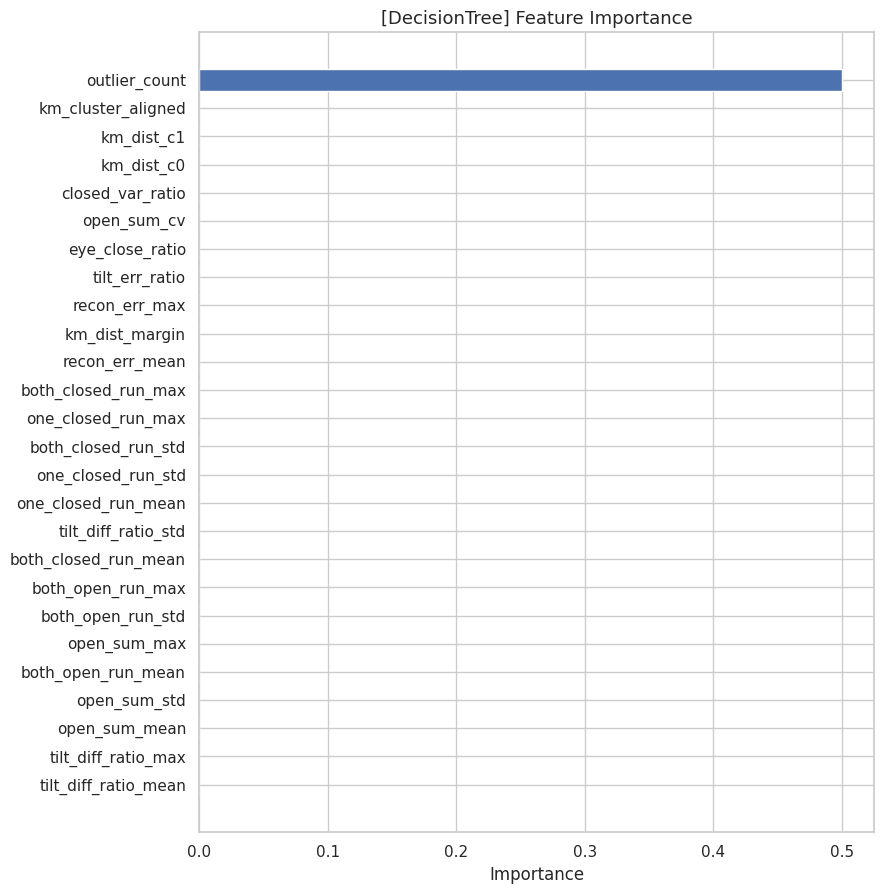

[SAVE] Importance Bar -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/cls_best/decisiontree_importance_bar.png


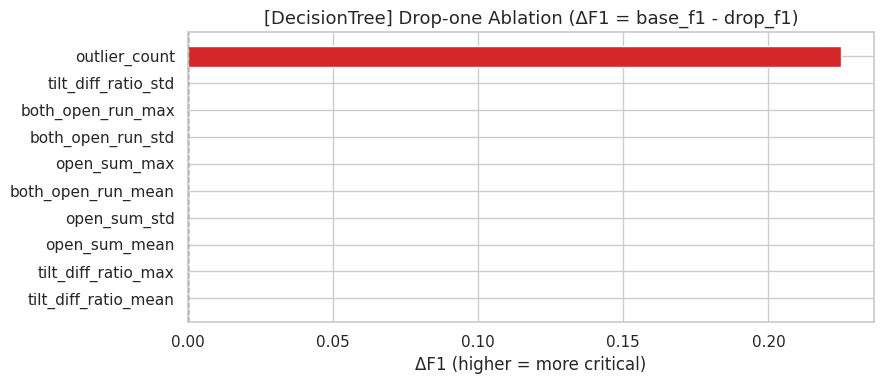

[SAVE] Ablation Bar -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/cls_best/decisiontree_ablation_bar.png


[SAVE] SHAP Waterfall -> /content/drive/MyDrive/CNN_AutoEncoder_eye_blink/dataset/outputs/denoising_analysis_results/cls_best/decisiontree_shap_waterfall.png


<Figure size 800x400 with 0 Axes>

In [58]:
# 59번셀 ============================================
# 12) 시각화: 중요도 막대 + Ablation 막대 + SHAP 폭포수
#     - importance_df: feature 중요도 (SHAP 또는 permutation)
#     - abldf: drop-one ablation 결과 (delta_f1)
# ============================================
import matplotlib.pyplot as plt
import numpy as np
import os

PLOT_DIR = OUT_MODEL_DIR  # 같은 디렉토리에 저장
os.makedirs(PLOT_DIR, exist_ok=True)

# ---------- 1) 중요도 막대그래프 ----------
plt.figure(figsize=(9, max(4, 0.35*len(importance_df))))
plot_df = importance_df.copy().sort_values("importance", ascending=True)
plt.barh(plot_df["feature"], plot_df["importance"])
plt.title(f"[{model_name}] Feature Importance", fontsize=13)
plt.xlabel("Importance")
plt.tight_layout()
imp_png = os.path.join(PLOT_DIR, f"{model_name.lower()}_importance_bar.png")
plt.savefig(imp_png, dpi=160)
plt.show()
print(f"[SAVE] Importance Bar -> {imp_png}")

# ---------- 2) Ablation 막대그래프 (delta_f1) ----------
if "delta_f1" in abldf.columns:
    plt.figure(figsize=(9, max(4, 0.35*len(abldf))))
    plot_ab = abldf.sort_values("delta_f1", ascending=True)
    colors = ["#d62728" if v > 0 else "#1f77b4" for v in plot_ab["delta_f1"]]
    plt.barh(plot_ab["feature"], plot_ab["delta_f1"], color=colors)
    plt.title(f"[{model_name}] Drop-one Ablation (ΔF1 = base_f1 - drop_f1)", fontsize=13)
    plt.xlabel("ΔF1 (higher = more critical)")
    plt.axvline(0, color="k", linestyle="--", linewidth=1)
    plt.tight_layout()
    abl_png = os.path.join(PLOT_DIR, f"{model_name.lower()}_ablation_bar.png")
    plt.savefig(abl_png, dpi=160)
    plt.show()
    print(f"[SAVE] Ablation Bar -> {abl_png}")
else:
    print("[INFO] abldf.delta_f1 없음 -> Ablation 막대 스킵")

# ---------- 3) SHAP 폭포수 도표 (per-instance) ----------
# Tree 모델이면 TreeExplainer로, 아니면 Kernel/Linear로 시도
try:
    import shap

    # 대표 샘플 선택: 테스트셋에서 예측 확률이 가장 높은 양성(=1) 후보
    y_prob_best = best_overall["y_prob_te"]
    pos_idx = np.where(y_te == 1)[0]
    if len(pos_idx) > 0:
        best_idx = pos_idx[np.argmax(y_prob_best[pos_idx])]
    else:
        best_idx = int(np.argmax(y_prob_best))

    x_sample = X_te[best_idx:best_idx+1]

    def _pick_class1_shap(shap_vals_raw):
        """
        shap_values의 형태가
        - list of (n, f)
        - ndarray (n, f)
        - ndarray (n_classes, n, f)
        모두일 때, 클래스1 기준 (또는 가능한 경우) (n, f)를 반환
        """
        if isinstance(shap_vals_raw, list):
            # list: 보통 [class0, class1, ...]
            if len(shap_vals_raw) >= 2:
                return np.array(shap_vals_raw[1])
            else:
                return np.array(shap_vals_raw[0])
        shap_vals_raw = np.array(shap_vals_raw)
        if shap_vals_raw.ndim == 3:
            # (n_classes, n_samples, n_features)
            if shap_vals_raw.shape[0] >= 2:
                return shap_vals_raw[1]   # 클래스1
            else:
                return shap_vals_raw[0]
        # (n_samples, n_features)
        return shap_vals_raw

    def _pick_class1_base_value(ev):
        """
        expected_value가 스칼라 / 1D array / list 등일 때
        클래스1 기준 또는 첫 원소를 반환
        """
        if isinstance(ev, (list, np.ndarray)):
            ev_arr = np.array(ev).ravel()
            if ev_arr.size >= 2:
                return float(ev_arr[1])
            return float(ev_arr[0])
        return float(ev)

    explainer = None
    shap_sample = None
    base_value = None

    if model_name in ["RandomForest", "DecisionTree", "LGBM"]:
        # 트리 계열: TreeExplainer 사용
        explainer = shap.TreeExplainer(best_est)
        shap_values_all = explainer.shap_values(X_te)
        shap_mat = _pick_class1_shap(shap_values_all)      # (n_samples, n_features)
        shap_sample = shap_mat[best_idx]                   # (n_features,)
        base_value = _pick_class1_base_value(explainer.expected_value)
    else:
        # SVM 등: KernelExplainer (조금 무거우니 background는 일부만)
        bg_n = min(200, X_tr.shape[0])
        rng = np.random.default_rng(SEED)
        bg_idx = rng.choice(X_tr.shape[0], size=bg_n, replace=False)
        bg = X_tr[bg_idx]

        explainer = shap.KernelExplainer(best_est.predict_proba, bg)
        shap_vals_all = explainer.shap_values(x_sample, nsamples=100)  # 클래스별 list 또는 ndarray
        shap_mat = _pick_class1_shap(shap_vals_all)   # 여기서는 (1, n_features)
        shap_sample = shap_mat[0]
        base_value = _pick_class1_base_value(explainer.expected_value)

    # 정렬 및 상위 K개 피처 선택
    K = min(12, len(FEATS))
    order = np.argsort(np.abs(shap_sample))[::-1][:K]
    top_feats = [FEATS[i] for i in order]
    top_vals = shap_sample[order]

    # ========= waterfall 시도 =========
    try:
        shap.plots._waterfall.waterfall_legacy(
            base_value,
            top_vals,
            feature_names=top_feats,
            max_display=K,
            show=True
        )
        w_png = os.path.join(PLOT_DIR, f"{model_name.lower()}_shap_waterfall.png")
        plt.tight_layout()
        plt.savefig(w_png, dpi=160, bbox_inches="tight")
        print(f"[SAVE] SHAP Waterfall -> {w_png}")
    except Exception:
        # 수동 폭포수 (matplotlib)
        contrib = top_vals
        starts = [base_value]
        for v in contrib[:-1]:
            starts.append(starts[-1] + v)
        colors = ["#2ca02c" if v >= 0 else "#d62728" for v in contrib]

        plt.figure(figsize=(10, 5))
        for s, v, f, c in zip(starts, contrib, top_feats, colors):
            plt.bar(f, v, bottom=s, color=c)
        plt.axhline(base_value, color="k", linestyle="--", linewidth=1, label="base")
        plt.title(f"[{model_name}] SHAP Waterfall (sample #{best_idx})")
        plt.xticks(rotation=45, ha="right")
        plt.ylabel("SHAP contribution")
        plt.legend()
        plt.tight_layout()
        w_png = os.path.join(PLOT_DIR, f"{model_name.lower()}_shap_waterfall.png")
        plt.savefig(w_png, dpi=160)
        plt.show()
        print(f"[SAVE] SHAP Waterfall -> {w_png}")

except Exception as e:
    print("[WARN] SHAP waterfall 실패:", e)
